# Classifier for Human Brain Mental Attention State using EEG BCI-based data
### 21100130, 21100187

In [1]:
import os
import random
import numpy as np
from glob import glob
import matplotlib.pyplot as plt
from scipy.io import loadmat, savemat
from scipy import signal
import pandas as pd
from sklearn.metrics import confusion_matrix
from sklearn.utils import shuffle
from sklearn.model_selection import train_test_split
import sklearn.preprocessing as preprocessing
from sklearn.metrics import accuracy_score
import seaborn as sns
import time
from tqdm import tqdm, tqdm_notebook

import tensorflow as tf
from keras.models import Sequential
from keras.layers import Dense, Flatten, Dropout, BatchNormalization
from keras.layers.wrappers import TimeDistributed
from keras.layers.convolutional import Conv2D
from keras.layers.pooling import AveragePooling2D
from keras.layers.recurrent import LSTM
from keras.optimizers import Adam, RMSprop
from keras import regularizers
from keras.callbacks import ModelCheckpoint, EarlyStopping, ReduceLROnPlateau


SAMP_FREQ = 128 # SAMPLING FREQUENCY Hz (samples/second)
CLASSES = {
    0: 'focused',
    1: 'unfocused',
    2: 'drowsy'
}

ONEHOT = {
    0: np.array([1,0,0]),
    1: np.array([0,1,0]),
    2: np.array([0,0,1])
}

## Dataset Load & Visualize

In [2]:
! [ ! -f '/content/eeg-data.zip' ] && gdown 'https://drive.google.com/uc?id=163LQWJzuyUy5nQlNsLWg4o-IiQJ72IbN'
! [ ! -d '/content/data' ] && unzip '/content/eeg-data.zip' -d '/content/data' 

In [3]:
DATA_FOLDER = '/content/data'

filenames = np.array(glob(os.path.join(DATA_FOLDER, '*/*.mat')))

NUM_FILES_ALL = len(filenames) # with habituation and trial experiments both
print("Total number of records: " + str(NUM_FILES_ALL))

'''
Each participant took part in 7 experiments, performing at most one experiment per day. 
The first 2 experiments were used for habituation, and the last 5 trials were used for collecting the data. 
The first 7 experiments belong to Subject 1, the next 7 experiments belong to Subject 2, and go on. 
However, Subject 5 could not complete the last experiment. 
Therefore, there are 34 records in the dataset.
'''


img_folder_path = '/'.join(filenames[0].split('/')[:-1])
filenames_trials = []  # remove records of habituation first, second of each subject's set out of 7
for i in range(3, NUM_FILES_ALL, 7):
    for j in range(i, min(i+5, NUM_FILES_ALL+1)):
        filenames_trials.append(img_folder_path+'/'+'eeg_record'+str(j)+'.mat')

print(filenames_trials)
NUM_FILES = len(filenames_trials)
print("Number of trial experiment records: " + str(NUM_FILES))

Total number of records: 34
['/content/data/EEG Data/eeg_record3.mat', '/content/data/EEG Data/eeg_record4.mat', '/content/data/EEG Data/eeg_record5.mat', '/content/data/EEG Data/eeg_record6.mat', '/content/data/EEG Data/eeg_record7.mat', '/content/data/EEG Data/eeg_record10.mat', '/content/data/EEG Data/eeg_record11.mat', '/content/data/EEG Data/eeg_record12.mat', '/content/data/EEG Data/eeg_record13.mat', '/content/data/EEG Data/eeg_record14.mat', '/content/data/EEG Data/eeg_record17.mat', '/content/data/EEG Data/eeg_record18.mat', '/content/data/EEG Data/eeg_record19.mat', '/content/data/EEG Data/eeg_record20.mat', '/content/data/EEG Data/eeg_record21.mat', '/content/data/EEG Data/eeg_record24.mat', '/content/data/EEG Data/eeg_record25.mat', '/content/data/EEG Data/eeg_record26.mat', '/content/data/EEG Data/eeg_record27.mat', '/content/data/EEG Data/eeg_record28.mat', '/content/data/EEG Data/eeg_record31.mat', '/content/data/EEG Data/eeg_record32.mat', '/content/data/EEG Data/eeg_re

data: (357224, 25)


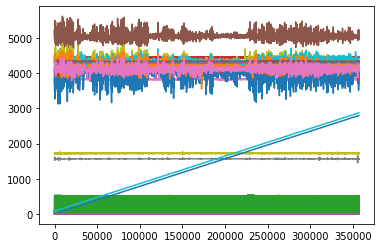


data_eeg: (357224, 14)


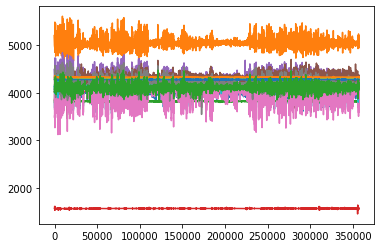


trials: (1, 2, 14, 128)

data: (380344, 25)


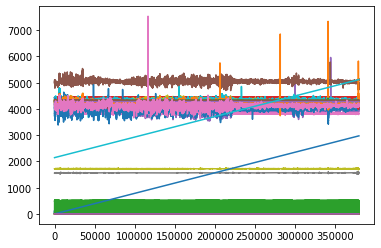


data_eeg: (380344, 14)


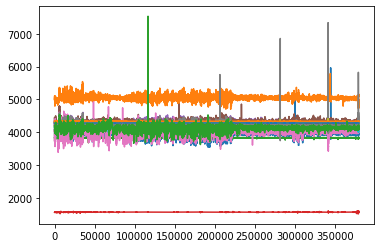


trials: (1, 2, 14, 128)

data: (351204, 25)


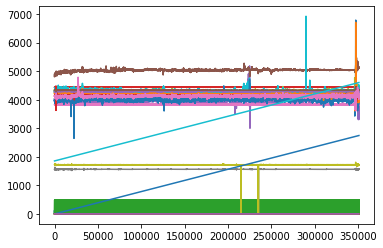


data_eeg: (351204, 14)


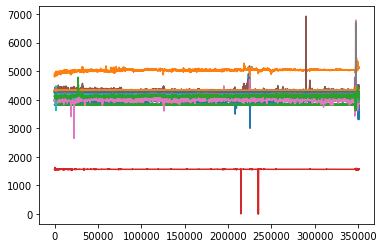


trials: (1, 2, 14, 128)



In [124]:
'''
Each Matlab file contains the object of the data acquired from EMOTIV device during one experiment. 
The raw data is contained in o.data, which is array of size {number-of-samples}x25, thus o.data(:,i) comprises one data channel. 
The sampling frequency is 128 Hz. The list of data channels and their numerical ids is given below per EMOTIV documentation;

25 CHANNELS:

1-'EDCOUNTER' 2-'EDINTERPOLATED'
3-'EDRAWCQ'
------------
4-'EDAF3' 5-'EDF7'
6-'EDF3' 7-'EDFC5'
8-'EDT7' 9-'EDP7'
10-'EDO1' 11-'EDO2'
12-'EDP8' 13-'EDT8'
14-'EDFC6' 15-'EDF4'
16-'EDF8' 17-'EDAF4'
--------------
18-'EDGYROX' 19-'EDGYROY'
20-'EDTIMESTAMP' 21-'EDESTIMESTAMP' 22-'EDFUNCID' 23-'EDFUNCVALUE' 24-'EDMARKER'
25'EDSYNCSIGNAL'

The EEG data is in the channels 4:17.

'''

for i in range(3):
    record = loadmat(filenames_trials[i])
    mdata = record['o']  # main object 
    sample1 = {n: mdata[n][0,0] for n in mdata.dtype.names}

    data = sample1['data']
    trials = sample1['trials']

    print('data:', data.shape)
    plt.plot(data)
    plt.show()

    data_eeg = data[:,4:18]
    print('\ndata_eeg:', data_eeg.shape)
    plt.plot(data_eeg)
    plt.show()

    print('\ntrials:', trials.shape)
    print()

## Data Partitioning

In [196]:
def mean_normalize(x): # per-channel mean normalization
    mu = np.mean(x, axis=1)
    mu = mu.reshape(mu.shape+(1,))
    sigma = np.std(x, axis=1)
    sigma = sigma.reshape(sigma.shape+(1,))
    
    # noise = NOISE_POWER * np.random.randn(*x.shape)
    x = (x - mu) / sigma # + noise
    return x

def hfd(X, Kmax):
    """ Compute Higuchi Fractal Dimension of a time series X. kmax
     is an HFD parameter
    """
    L = []
    x = []
    N = len(X)
    for k in range(1, Kmax):
        Lk = []
        for m in range(0, k):
            Lmk = 0
            for i in range(1, int(np.floor((N - m) / k))):
                Lmk += abs(X[m + i * k] - X[m + i * k - k])
            Lmk = Lmk * (N - 1) / np.floor((N - m) / float(k)) / k
            Lk.append(Lmk)
        L.append(np.log(np.mean(Lk)))
        x.append([np.log(float(1) / k), 1])

    (p, _, _, _) = np.linalg.lstsq(x, L)
    return p[0]

def pfd(X, D=None):
    """Compute Petrosian Fractal Dimension of a time series from either two
    cases below:
        1. X, the time series of type list (default)
        2. D, the first order differential sequence of X (if D is provided,
           recommended to speed up)
    """
    if D is None:
        D = np.diff(X)
        D = D.tolist()
    N_delta = 0  # number of sign changes in derivative of the signal
    for i in range(1, len(D)):
        if D[i] * D[i - 1] < 0:
            N_delta += 1
    n = len(X)
    return np.log10(n) / (np.log10(n) + np.log10(n / n + 0.4 * N_delta))


def feature_scaling(x): # same standard scalar as mean
    std_scale = preprocessing.StandardScaler().fit(x)
    return std_scale.transform(x)


def visualize(x_train_list, y_train): # visualize final training data samples
    for i in range(5):
        print(CLASSES[np.argmax(y_train[i])], x_train_list[i].shape)
        plt.plot(x_train_list[i])
        plt.show()


def get_signal_data(trial_length, noise_power=0.005):
    global SAMP_FREQ, ONEHOT
    x = []
    y = []

    MARK_10MIN, MARK_20MIN = 10*60*SAMP_FREQ, 20*60*SAMP_FREQ 
    NUM_TRIALS = MARK_10MIN//TRIAL_LENGTH
    NUM_CHAN = 14

    print(MARK_10MIN, trial_length, NUM_TRIALS)


    for fn in filenames_trials:
        record = loadmat(fn)
        mdata = record['o']  # main object 
        ndata = {n: mdata[n][0,0] for n in mdata.dtype.names}
        
        data = ndata['data'][:,4:18] # 4-17 EEG data channels only from the experiments
        ns = data.shape[0]

        '''
        Experiment labels
        Focused: 0 to 10 min
        Unfocused: 10 to 20min
        Sleep: 20 to end of experiments
        '''

        focused = np.array(data[:MARK_10MIN])
        # focused = feature_scaling(focused)

        focused_trials = np.split(focused, NUM_TRIALS)

        x += focused_trials # from the start
        y += [ONEHOT[0]]*NUM_TRIALS # focused


        unfocused = data[MARK_10MIN:MARK_20MIN]
        # unfocused = feature_scaling(unfocused)

        unfocused_trials = np.split(unfocused, NUM_TRIALS)
        x += unfocused_trials
        y += [ONEHOT[1]]*NUM_TRIALS # unfocused


        drowsy = data[MARK_20MIN:]
        # drowsy = feature_scaling(drowsy)

        min_splits = drowsy.shape[0]//trial_length
        drowsy = drowsy[:min_splits*trial_length]
        drowsy_trials = np.split(drowsy, min_splits) # for the entire drowsy duration split it into trials
        x += drowsy_trials# until the end, 
        y += [ONEHOT[2]]*min_splits # drowsy
        
    print(len(x), len(y))
    return x, y

In [197]:
trial_seconds = 15
TRIAL_LENGTH = trial_seconds*SAMP_FREQ

x, y = get_signal_data(trial_length=TRIAL_LENGTH)

76800 1920 40
4677 4677


In [198]:
print(x[0].shape)

(1920, 14)


In [214]:
x_prep = []

for i in tqdm_notebook(range(len(x))):
    # print(CLASSES[np.argmax(y[i])])
    xi = []
    sample = x[i]
    for c in range(14): # for each channel
        f, t, Zxx = signal.stft(sample[c], fs=SAMP_FREQ, nperseg=SAMP_FREQ, window='blackman', nfft=1024)
        # Zxx (513, 3) frequency bands
        # print(Zxx.shape)
        # Zm = np.mean(Zxx, axis=1)
        # plt.plot(Zm)
        xi.append(Zxx) # only this frequency range has high power 0-18
    x_prep.append(xi)
    plt.show()

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  This is separate from the ipykernel package so we can avoid doing imports until


/usr/local/lib/python3.7/dist-packages/scipy/signal/spectral.py:1966: UserWarning: nperseg = 128 is greater than input length  = 14, using nperseg = 14
  .format(nperseg, input_length))


/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: ComplexWarning: Casting complex values to real discards the imaginary part
  return array(a, dtype, copy=False, order=order)
/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: ComplexWarning: Casting complex values to real discards the imaginary part
  return array(a, dtype, copy=False, order=order)
/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: ComplexWarning: Casting complex values to real discards the imaginary part
  return array(a, dtype, copy=False, order=order)
/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: ComplexWarning: Casting complex values to real discards the imaginary part
  return array(a, dtype, copy=False, order=order)
/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: ComplexWarning: Casting complex values to real discards the imaginary part
  return array(a, dtype, copy=False, order=order)
/usr/local/lib/python3.7/dist-packages/numpy/

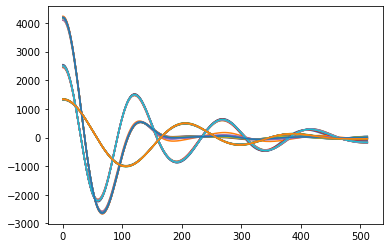

In [218]:
for c in range(14):
  plt.plot(x_prep[c][0])
plt.show()

In [219]:
x_prep_hfd = []
kmax = 6 # for HFD

for i in tqdm_notebook(range(len(x))):
    # print(CLASSES[np.argmax(y[i])])
    xi = np.zeros(14)
    sample = x[i]
    for c in range(14): # for each channel
        # xi[c] = pfd(sample[c])
        xi[c] = hfd(sample[c], kmax)
    x_prep_hfd.append(xi)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:4: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  after removing the cwd from sys.path.


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:29: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.


In [220]:
TOTAL_SAMPLES = len(x)
TEST_RATIO = 0.2

x_train, x_test, y_train, y_test = train_test_split(x_prep_hfd, y, test_size=TEST_RATIO, random_state=42) # using x_stft

x_train_list = x_train
x_train = np.array(x_train)
# x_train = np.reshape(x_train, (*x_train.shape, 1))
y_train = np.array(y_train)

x_test = np.array(x_test)
# x_test = np.reshape(x_test, (*x_test.shape, 1))
y_test = np.array(y_test)

print(x_train.shape, y_train.shape)

(3741, 14) (3741, 3)


In [203]:
# savemat('train.mat', {'x': x_train, 'y': y_train} )
# savemat('test.mat', {'x': x_test, 'y': y_test} )

drowsy (14,)


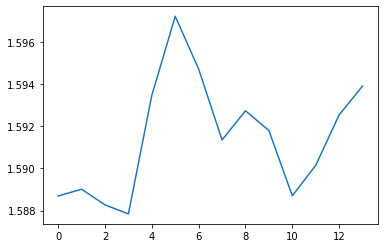

unfocused (14,)


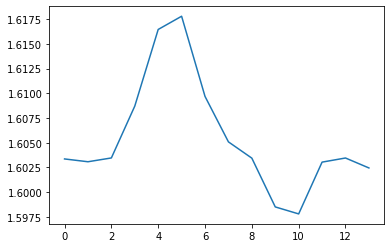

focused (14,)


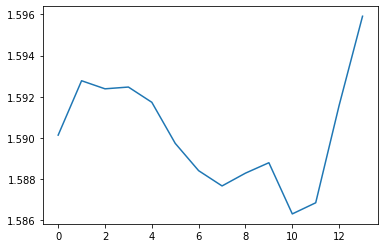

focused (14,)


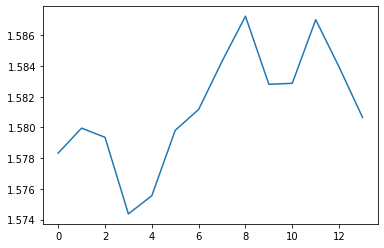

drowsy (14,)


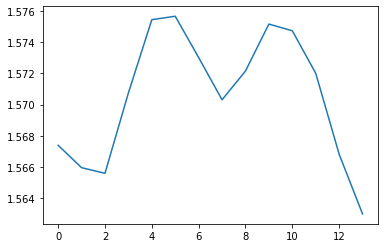

In [221]:
visualize(x_train_list, y_train)

In [ ]:
# Testing PCA

# HNGFS


In [264]:
tf.compat.v1.disable_eager_execution()

In [312]:
class ANFIS:

    def __init__(self, n_inputs, n_rules, learning_rate=1e-2):
        tf.compat.v1.reset_default_graph() 
        self.n = n_inputs
        self.m = n_rules
        self.inputs = tf.compat.v1.placeholder(tf.float32, shape=(None, n_inputs))  # Input
        self.targets = tf.compat.v1.placeholder(tf.float32, shape=None)  # Desired output
        mu = tf.compat.v1.get_variable("mu", [n_rules * n_inputs], initializer=tf.random_normal_initializer(0, 1))  # Means of Gaussian MFS
        sigma = tf.compat.v1.get_variable("sigma", [n_rules * n_inputs], initializer=tf.random_normal_initializer(0, 1))  # Standard deviations of Gaussian MFS
        y = tf.compat.v1.get_variable("y", [1, n_rules], initializer=tf.random_normal_initializer(0, 1))  # Sequent centers

        self.params = tf.compat.v1.trainable_variables()

        self.rul = tf.reduce_prod(
            tf.reshape(tf.exp(-0.5 * tf.square(tf.subtract(tf.tile(self.inputs, (1, n_rules)), mu)) / tf.square(sigma)),
                       (-1, n_rules, n_inputs)), axis=2)  # Rule activations
        
        # Fuzzy base expansion function:
        num = tf.reduce_sum(tf.multiply(self.rul, y), axis=1)
        den = tf.clip_by_value(tf.reduce_sum(self.rul, axis=1), 1e-12, 1e12)
        self.out = tf.divide(num, den)

        # self.loss = tf.compat.v1.losses.huber_loss(self.targets, self.out)  # Loss function computation
        self.loss = tf.sqrt(tf.compat.v1.losses.mean_squared_error(self.targets, self.out)) # RMSE
        
        self.optimize = tf.compat.v1.train.AdamOptimizer(learning_rate=learning_rate).minimize(self.loss)  # Optimization step
        self.init_variables = tf.compat.v1.global_variables_initializer()  # Variable initializer

    def infer(self, sess, x, targets=None):
        if targets is None:
            return sess.run(self.out, feed_dict={self.inputs: x})
        else:
            return sess.run([self.out, self.loss], feed_dict={self.inputs: x, self.targets: targets})

    def train(self, sess, x, targets):
        yp, l, _ = sess.run([self.out, self.loss, self.optimize], feed_dict={self.inputs: x, self.targets: targets})
        return l, yp

    def plotmfs(self, sess):
        mus = sess.run(self.params[0])
        mus = np.reshape(mus, (self.m, self.n))
        sigmas = sess.run(self.params[1])
        sigmas = np.reshape(sigmas, (self.m, self.n))
        y = sess.run(self.params[2])
        xn = np.linspace(-1.5, 1.5, 1000)
        for r in range(self.m):
            if r % 4 == 0:
                plt.figure(figsize=(11, 6), dpi=80)
            plt.subplot(2, 2, (r % 4) + 1)
            ax = plt.subplot(2, 2, (r % 4) + 1)
            ax.set_title("Rule %d, sequent center: %f" % ((r + 1), y[0, r]))
            for i in range(self.n):
                plt.plot(xn, np.exp(-0.5 * ((xn - mus[r, i]) ** 2) / (sigmas[r, i] ** 2)))

In [313]:
def train_anfis(n_inputs, m, alpha, num_epochs, predict=False):
  fis = ANFIS(n_inputs=n_inputs, n_rules=m, learning_rate=alpha) # 1 , 14, 11710

  with tf.compat.v1.Session() as sess:
      sess.run(fis.init_variables)
      trn_costs = []
      time_start = time.time()
      for epoch in range(num_epochs):
          trn_loss, trn_pred = fis.train(sess, x_train_, y_train_)
          if epoch % 10 == 0:
              print("Train cost after epoch %i: %f" % (epoch, trn_loss))
          trn_costs.append(trn_loss)        
      
      plt.figure(2)
      plt.plot(np.squeeze(trn_costs))
      plt.title("Training loss, Learning rate =" + str(alpha))
      plt.ylabel('Loss')
      plt.xlabel('Epochs')

      # Plot resulting membership functions
      # fis.plotmfs(sess)
      plt.show()
      
      if predict:
        test_pred = fis.infer(sess, x_test_)
        print(f'Accuracy: {accuracy_score(y_test_, np.round(test_pred))}')
        plt.plot(y_test_, 'b-')
        plt.plot(test_pred, 'r-')
        plt.show()

        plt.plot(y_test_, 'b-')
        plt.plot(np.round(test_pred), 'r-')
        plt.show()

  return fis, trn_costs[-1]

In [314]:
x_train_ = np.copy(x_train)
x_test_ = np.copy(x_test)

y_train_ = np.argmax(y_train, axis=1)
y_test_ = np.argmax(y_test, axis=1)

x_train_, y_train_ = shuffle(x_train_, y_train_)
x_test_, y_test_ = shuffle(x_test_, y_test_)

print(x_train_.shape, y_train_.shape)
print(x_test_.shape, y_test_.shape)

y_train_ = y_train_ + 1 # 0,1,2 to 1,2,3 range
y_test_ = y_test_ + 1

(3741, 14) (3741,)
(936, 14) (936,)


In [315]:
savemat('data_hfd14.mat', {'x_train': x_train_, 'y_train': y_train_, 'x_test': x_test_, 'y_test': y_test_} )

Train cost after epoch 0: 3.042613
Train cost after epoch 10: 2.870868
Train cost after epoch 20: 2.337808
Train cost after epoch 30: 1.562656
Train cost after epoch 40: 1.258558
Train cost after epoch 50: 1.184746
Train cost after epoch 60: 1.151908
Train cost after epoch 70: 1.118000
Train cost after epoch 80: 1.062424
Train cost after epoch 90: 0.973498
Train cost after epoch 100: 0.892479
Train cost after epoch 110: 0.855104
Train cost after epoch 120: 0.840752
Train cost after epoch 130: 0.833896
Train cost after epoch 140: 0.829732
Train cost after epoch 150: 0.826743
Train cost after epoch 160: 0.824451
Train cost after epoch 170: 0.822527
Train cost after epoch 180: 0.820869
Train cost after epoch 190: 0.819401
Train cost after epoch 200: 0.818084
Train cost after epoch 210: 0.816890
Train cost after epoch 220: 0.815799
Train cost after epoch 230: 0.814797
Train cost after epoch 240: 0.813872
Train cost after epoch 250: 0.813014
Train cost after epoch 260: 0.812216
Train cost a

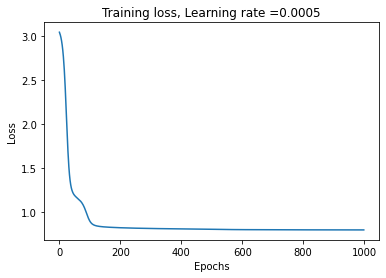

Accuracy: 0.202991452991453


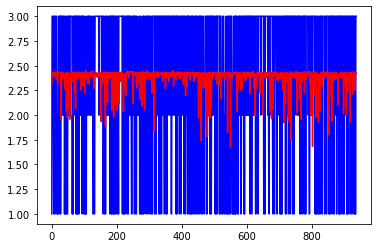

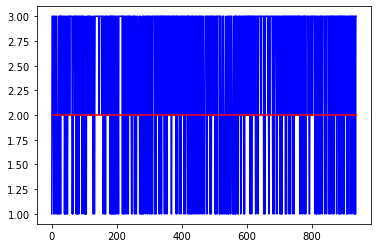

In [316]:
# ANFIS, training params
m = 50  # number of rules
alpha = 5e-4  # learning rate
num_epochs = 1000

fis, final_loss = train_anfis(14, m, alpha, num_epochs, True)

In [ ]:
# !pip install geneticalgorithm

Train cost after epoch 0: 1.427494
Train cost after epoch 10: 1.379636
Train cost after epoch 20: 1.339351
Train cost after epoch 30: 1.290077
Train cost after epoch 40: 1.144555
Train cost after epoch 50: 0.837987
Train cost after epoch 60: 0.810286
Train cost after epoch 70: 0.803424
Train cost after epoch 80: 0.801076
Train cost after epoch 90: 0.800043


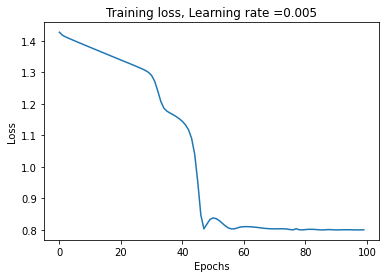

Train cost after epoch 0: 3.048143
Train cost after epoch 10: 2.321570
Train cost after epoch 20: 1.840386
Train cost after epoch 30: 1.191023
Train cost after epoch 40: 0.805961
Train cost after epoch 50: 0.805122
Train cost after epoch 60: 0.805436
Train cost after epoch 70: 0.804138
Train cost after epoch 80: 0.802191
Train cost after epoch 90: 0.800951


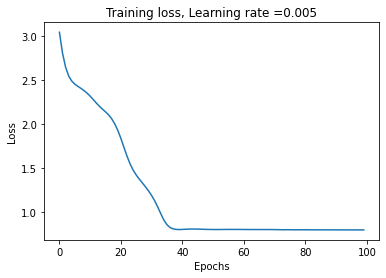

Train cost after epoch 0: 2.808427
Train cost after epoch 10: 1.267409
Train cost after epoch 20: 1.224452
Train cost after epoch 30: 1.095937
Train cost after epoch 40: 0.825809
Train cost after epoch 50: 0.825449
Train cost after epoch 60: 0.814144
Train cost after epoch 70: 0.807608
Train cost after epoch 80: 0.805231
Train cost after epoch 90: 0.804757


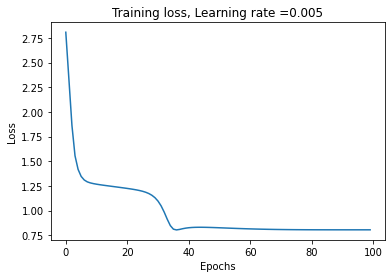

Train cost after epoch 0: 2.298124
Train cost after epoch 10: 1.982358
Train cost after epoch 20: 1.835167
Train cost after epoch 30: 1.783354
Train cost after epoch 40: 1.732760
Train cost after epoch 50: 1.683575
Train cost after epoch 60: 1.635824
Train cost after epoch 70: 1.589393
Train cost after epoch 80: 1.544169
Train cost after epoch 90: 1.500077


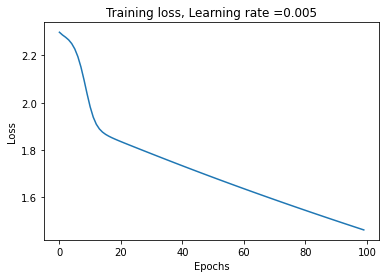

Train cost after epoch 0: 3.218951
Train cost after epoch 10: 3.072326
Train cost after epoch 20: 2.964751
Train cost after epoch 30: 1.902940
Train cost after epoch 40: 1.630605
Train cost after epoch 50: 1.340848
Train cost after epoch 60: 0.999568
Train cost after epoch 70: 0.891220
Train cost after epoch 80: 0.856148
Train cost after epoch 90: 0.834039


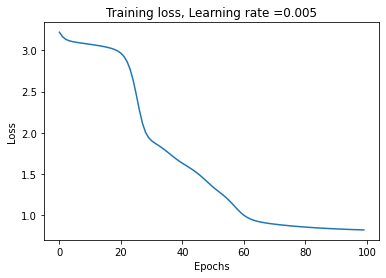

Train cost after epoch 0: 3.109404
Train cost after epoch 10: 2.062464
Train cost after epoch 20: 0.853718
Train cost after epoch 30: 0.810115
Train cost after epoch 40: 0.804507
Train cost after epoch 50: 0.804317
Train cost after epoch 60: 0.804370
Train cost after epoch 70: 0.804018
Train cost after epoch 80: 0.803369
Train cost after epoch 90: 0.802762


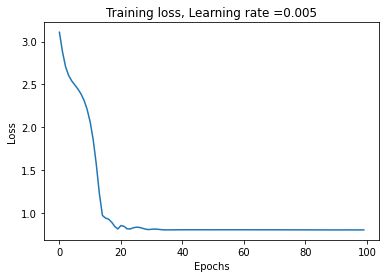

Train cost after epoch 0: 2.435108
Train cost after epoch 10: 1.852743
Train cost after epoch 20: 1.734348
Train cost after epoch 30: 1.626278
Train cost after epoch 40: 1.135255
Train cost after epoch 50: 0.851086
Train cost after epoch 60: 0.814515
Train cost after epoch 70: 0.805166
Train cost after epoch 80: 0.805180
Train cost after epoch 90: 0.805254


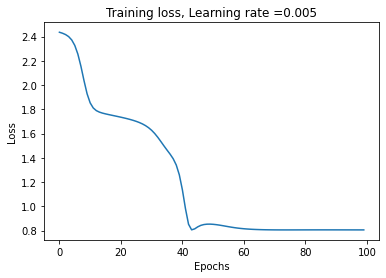

Train cost after epoch 0: 4.028956
Train cost after epoch 10: 3.740091
Train cost after epoch 20: 2.057612
Train cost after epoch 30: 1.494229
Train cost after epoch 40: 1.440379
Train cost after epoch 50: 1.388481
Train cost after epoch 60: 1.339420
Train cost after epoch 70: 1.293195
Train cost after epoch 80: 1.249570
Train cost after epoch 90: 1.208337


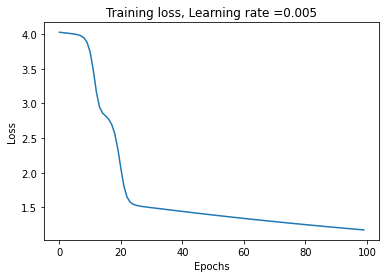

Train cost after epoch 0: 3.879608
Train cost after epoch 10: 3.830622
Train cost after epoch 20: 3.748065
Train cost after epoch 30: 2.027895
Train cost after epoch 40: 1.896643
Train cost after epoch 50: 1.596326
Train cost after epoch 60: 1.186296
Train cost after epoch 70: 0.830134
Train cost after epoch 80: 0.811355
Train cost after epoch 90: 0.805997


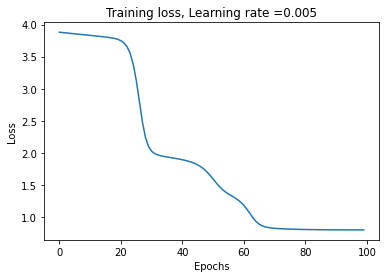

Train cost after epoch 0: 2.514410
Train cost after epoch 10: 2.513185
Train cost after epoch 20: 1.944354
Train cost after epoch 30: 1.841093
Train cost after epoch 40: 1.784888
Train cost after epoch 50: 1.729515
Train cost after epoch 60: 1.676304
Train cost after epoch 70: 1.625258
Train cost after epoch 80: 1.576132
Train cost after epoch 90: 1.528693


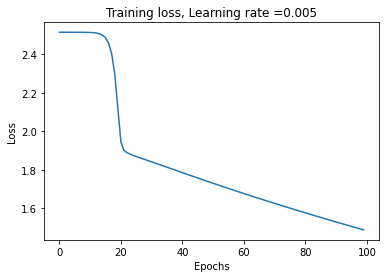

Train cost after epoch 0: 2.516708
Train cost after epoch 10: 1.729405
Train cost after epoch 20: 1.656242
Train cost after epoch 30: 1.087746
Train cost after epoch 40: 1.005040
Train cost after epoch 50: 0.963341
Train cost after epoch 60: 0.883389
Train cost after epoch 70: 0.824502
Train cost after epoch 80: 0.809911
Train cost after epoch 90: 0.805389


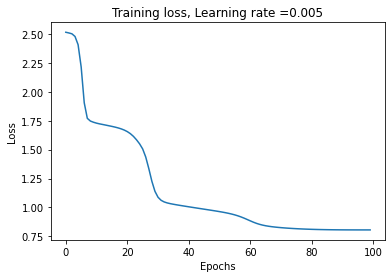

Train cost after epoch 0: 2.251007
Train cost after epoch 10: 2.200322
Train cost after epoch 20: 2.153090
Train cost after epoch 30: 2.039808
Train cost after epoch 40: 1.034073
Train cost after epoch 50: 0.922077
Train cost after epoch 60: 0.886832
Train cost after epoch 70: 0.860964
Train cost after epoch 80: 0.842061
Train cost after epoch 90: 0.828734


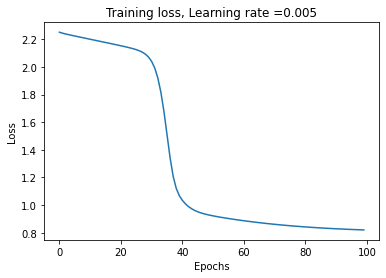

Train cost after epoch 0: 2.287734
Train cost after epoch 10: 2.240721
Train cost after epoch 20: 2.194158
Train cost after epoch 30: 2.147718
Train cost after epoch 40: 2.059650
Train cost after epoch 50: 1.991238
Train cost after epoch 60: 1.755146
Train cost after epoch 70: 1.602950
Train cost after epoch 80: 0.905105
Train cost after epoch 90: 0.894486


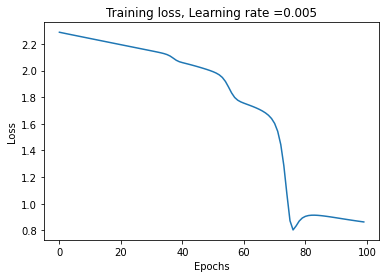

Train cost after epoch 0: 2.849340
Train cost after epoch 10: 2.093617
Train cost after epoch 20: 1.714348
Train cost after epoch 30: 0.991383
Train cost after epoch 40: 0.946217
Train cost after epoch 50: 0.913798
Train cost after epoch 60: 0.886825
Train cost after epoch 70: 0.852579
Train cost after epoch 80: 0.819689
Train cost after epoch 90: 0.807483


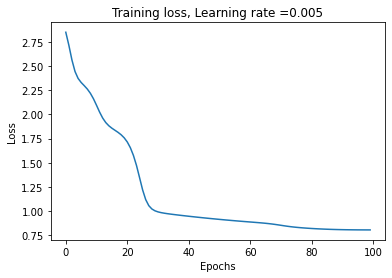

Train cost after epoch 0: 1.466050
Train cost after epoch 10: 1.182570
Train cost after epoch 20: 1.091832
Train cost after epoch 30: 0.816901
Train cost after epoch 40: 0.804658
Train cost after epoch 50: 0.804839
Train cost after epoch 60: 0.804762
Train cost after epoch 70: 0.804333
Train cost after epoch 80: 0.800871
Train cost after epoch 90: 0.803180


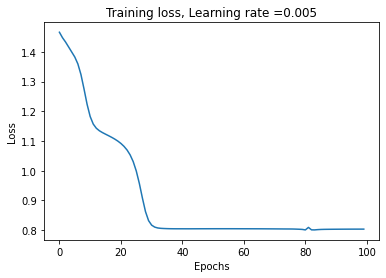

Train cost after epoch 0: 2.176990
Train cost after epoch 10: 1.939960
Train cost after epoch 20: 1.698378
Train cost after epoch 30: 0.819667
Train cost after epoch 40: 0.807286
Train cost after epoch 50: 0.807593
Train cost after epoch 60: 0.804890
Train cost after epoch 70: 0.804103
Train cost after epoch 80: 0.804213
Train cost after epoch 90: 0.804131


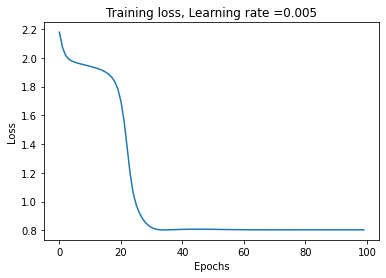

Train cost after epoch 0: 2.516492
Train cost after epoch 10: 2.271506
Train cost after epoch 20: 2.173483
Train cost after epoch 30: 1.969131
Train cost after epoch 40: 1.908143
Train cost after epoch 50: 1.848376
Train cost after epoch 60: 1.791142
Train cost after epoch 70: 1.736536
Train cost after epoch 80: 1.684217
Train cost after epoch 90: 1.633840


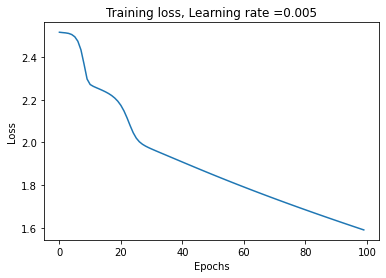

Train cost after epoch 0: 1.600999
Train cost after epoch 10: 1.464886
Train cost after epoch 20: 1.423378
Train cost after epoch 30: 1.381693
Train cost after epoch 40: 1.290195
Train cost after epoch 50: 0.961348
Train cost after epoch 60: 0.919750
Train cost after epoch 70: 0.885995
Train cost after epoch 80: 0.860320
Train cost after epoch 90: 0.841635


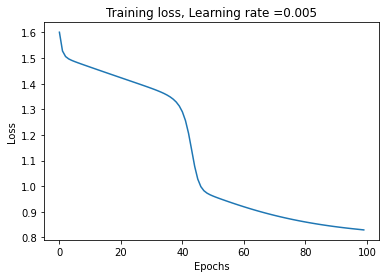

Train cost after epoch 0: 2.397101
Train cost after epoch 10: 2.348115
Train cost after epoch 20: 2.097880
Train cost after epoch 30: 1.354225
Train cost after epoch 40: 1.303524
Train cost after epoch 50: 1.253904
Train cost after epoch 60: 1.207438
Train cost after epoch 70: 1.164309
Train cost after epoch 80: 1.124322
Train cost after epoch 90: 1.087269


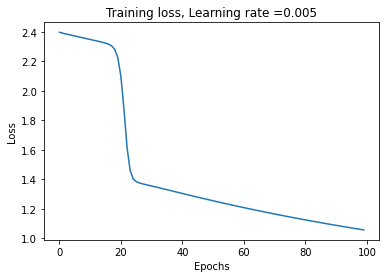

Train cost after epoch 0: 1.706790
Train cost after epoch 10: 1.391192
Train cost after epoch 20: 1.188566
Train cost after epoch 30: 1.140346
Train cost after epoch 40: 1.097754
Train cost after epoch 50: 1.058247
Train cost after epoch 60: 1.022371
Train cost after epoch 70: 0.990068
Train cost after epoch 80: 0.961164
Train cost after epoch 90: 0.935488


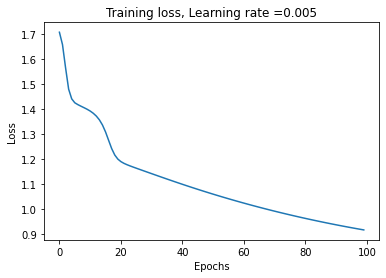

Train cost after epoch 0: 2.885059
Train cost after epoch 10: 1.172073
Train cost after epoch 20: 0.805445
Train cost after epoch 30: 0.806449
Train cost after epoch 40: 0.805676
Train cost after epoch 50: 0.804556
Train cost after epoch 60: 0.802555
Train cost after epoch 70: 0.801610
Train cost after epoch 80: 0.800886
Train cost after epoch 90: 0.800181


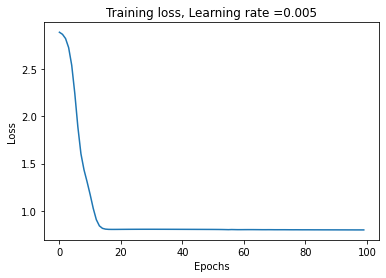

Train cost after epoch 0: 3.482784
Train cost after epoch 10: 2.956271
Train cost after epoch 20: 2.442029
Train cost after epoch 30: 2.270106
Train cost after epoch 40: 1.913531
Train cost after epoch 50: 1.476634
Train cost after epoch 60: 1.359545
Train cost after epoch 70: 1.149895
Train cost after epoch 80: 0.948810
Train cost after epoch 90: 0.883575


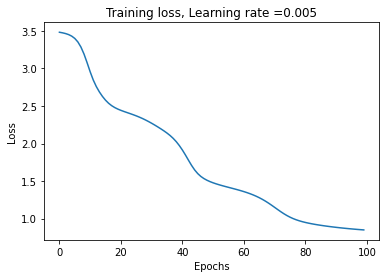

Train cost after epoch 0: 3.829427
Train cost after epoch 10: 2.644355
Train cost after epoch 20: 2.143695
Train cost after epoch 30: 1.404866
Train cost after epoch 40: 1.287664
Train cost after epoch 50: 1.233873
Train cost after epoch 60: 1.183983
Train cost after epoch 70: 1.138418
Train cost after epoch 80: 1.096611
Train cost after epoch 90: 1.031133


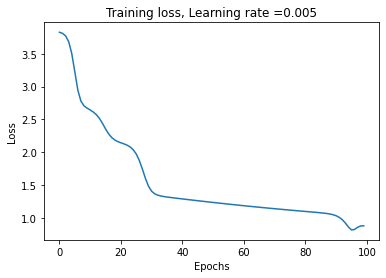

Train cost after epoch 0: 2.860591
Train cost after epoch 10: 1.627733
Train cost after epoch 20: 1.289602
Train cost after epoch 30: 1.215874
Train cost after epoch 40: 1.162755
Train cost after epoch 50: 1.115058
Train cost after epoch 60: 1.071921
Train cost after epoch 70: 1.033247
Train cost after epoch 80: 0.998718
Train cost after epoch 90: 0.968018


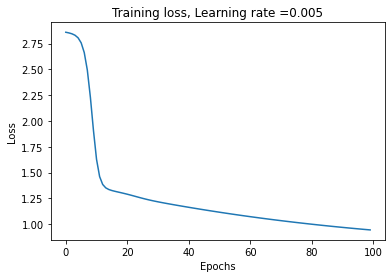

Train cost after epoch 0: 2.280079
Train cost after epoch 10: 1.957668
Train cost after epoch 20: 1.877194
Train cost after epoch 30: 1.680939
Train cost after epoch 40: 1.219420
Train cost after epoch 50: 0.876880
Train cost after epoch 60: 0.850145
Train cost after epoch 70: 0.831239
Train cost after epoch 80: 0.819149
Train cost after epoch 90: 0.812044


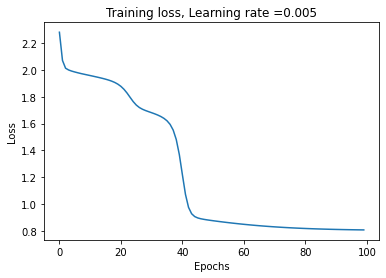

Train cost after epoch 0: 3.444659
Train cost after epoch 10: 1.525904
Train cost after epoch 20: 1.332774
Train cost after epoch 30: 1.287638
Train cost after epoch 40: 1.245044
Train cost after epoch 50: 1.204529
Train cost after epoch 60: 1.166101
Train cost after epoch 70: 1.129734
Train cost after epoch 80: 1.095413
Train cost after epoch 90: 1.063150


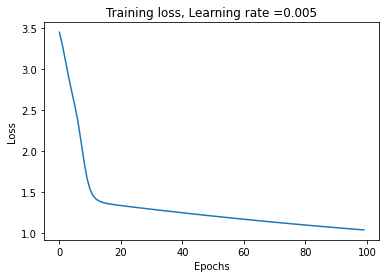

Train cost after epoch 0: 2.000409
Train cost after epoch 10: 1.022069
Train cost after epoch 20: 0.847053
Train cost after epoch 30: 0.832572
Train cost after epoch 40: 0.821771
Train cost after epoch 50: 0.813602
Train cost after epoch 60: 0.808318
Train cost after epoch 70: 0.805193
Train cost after epoch 80: 0.802984
Train cost after epoch 90: 0.800509


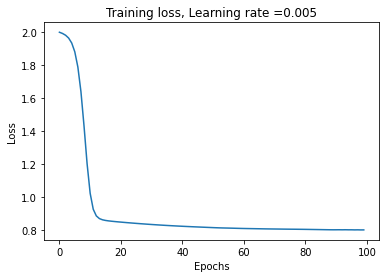

Train cost after epoch 0: 2.385410
Train cost after epoch 10: 2.283979
Train cost after epoch 20: 2.088693
Train cost after epoch 30: 0.857852
Train cost after epoch 40: 0.907376
Train cost after epoch 50: 0.827299
Train cost after epoch 60: 0.806377
Train cost after epoch 70: 0.804267
Train cost after epoch 80: 0.803735
Train cost after epoch 90: 0.803502


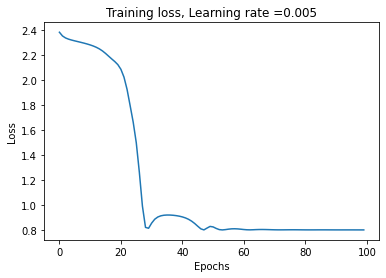

Train cost after epoch 0: 2.568070
Train cost after epoch 10: 2.263085
Train cost after epoch 20: 2.212770
Train cost after epoch 30: 2.162097
Train cost after epoch 40: 2.092510
Train cost after epoch 50: 1.465199
Train cost after epoch 60: 1.299614
Train cost after epoch 70: 1.232834
Train cost after epoch 80: 1.173511
Train cost after epoch 90: 1.121107


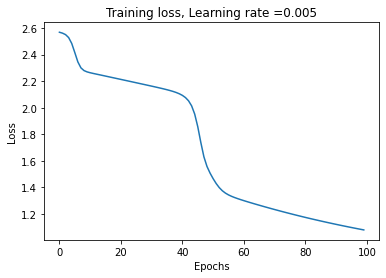

Train cost after epoch 0: 1.661098
Train cost after epoch 10: 1.441303
Train cost after epoch 20: 1.355754
Train cost after epoch 30: 0.805730
Train cost after epoch 40: 0.807051
Train cost after epoch 50: 0.805430
Train cost after epoch 60: 0.804803
Train cost after epoch 70: 0.804656
Train cost after epoch 80: 0.804615
Train cost after epoch 90: 0.804553


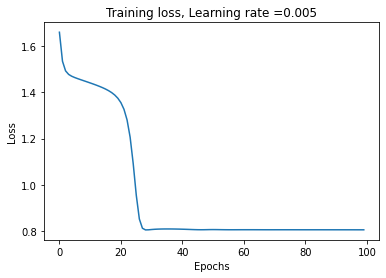

Train cost after epoch 0: 3.619099
Train cost after epoch 10: 1.321963
Train cost after epoch 20: 1.185863
Train cost after epoch 30: 0.992759
Train cost after epoch 40: 0.944444
Train cost after epoch 50: 0.908812
Train cost after epoch 60: 0.834474
Train cost after epoch 70: 0.808171
Train cost after epoch 80: 0.804902
Train cost after epoch 90: 0.805226


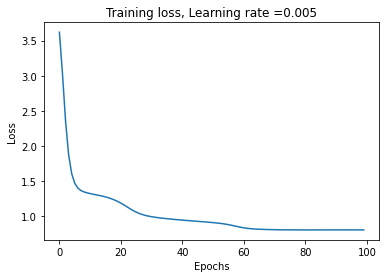

Train cost after epoch 0: 2.411263
Train cost after epoch 10: 2.277996
Train cost after epoch 20: 2.230476
Train cost after epoch 30: 2.183313
Train cost after epoch 40: 2.136482
Train cost after epoch 50: 2.089988
Train cost after epoch 60: 2.043830
Train cost after epoch 70: 1.998012
Train cost after epoch 80: 1.952541
Train cost after epoch 90: 1.907428


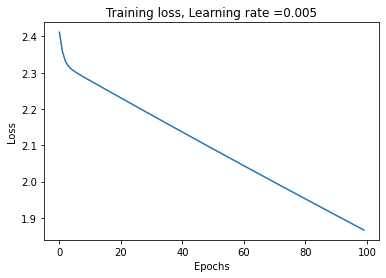

Train cost after epoch 0: 0.839435
Train cost after epoch 10: 0.825290
Train cost after epoch 20: 0.816123
Train cost after epoch 30: 0.809967
Train cost after epoch 40: 0.806453
Train cost after epoch 50: 0.804943
Train cost after epoch 60: 0.804413
Train cost after epoch 70: 0.804288
Train cost after epoch 80: 0.804275
Train cost after epoch 90: 0.804273


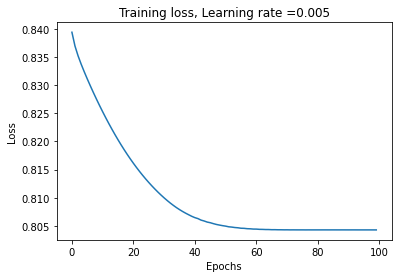

Train cost after epoch 0: 2.952371
Train cost after epoch 10: 2.254927
Train cost after epoch 20: 2.117640
Train cost after epoch 30: 2.039505
Train cost after epoch 40: 1.823262
Train cost after epoch 50: 1.694827
Train cost after epoch 60: 1.622620
Train cost after epoch 70: 1.541142
Train cost after epoch 80: 1.315694
Train cost after epoch 90: 1.196158


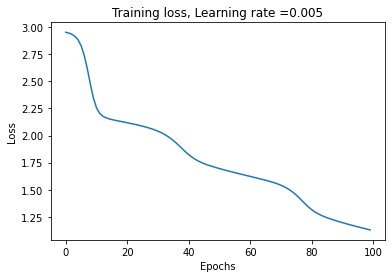

Train cost after epoch 0: 1.966695
Train cost after epoch 10: 1.920986
Train cost after epoch 20: 1.875748
Train cost after epoch 30: 1.830836
Train cost after epoch 40: 1.786304
Train cost after epoch 50: 1.742172
Train cost after epoch 60: 1.698483
Train cost after epoch 70: 1.655274
Train cost after epoch 80: 1.612583
Train cost after epoch 90: 1.570451


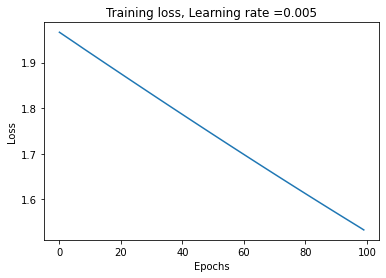

Train cost after epoch 0: 3.292105
Train cost after epoch 10: 3.242520
Train cost after epoch 20: 2.953947
Train cost after epoch 30: 2.135690
Train cost after epoch 40: 1.016688
Train cost after epoch 50: 0.862130
Train cost after epoch 60: 0.839161
Train cost after epoch 70: 0.824203
Train cost after epoch 80: 0.814487
Train cost after epoch 90: 0.807831


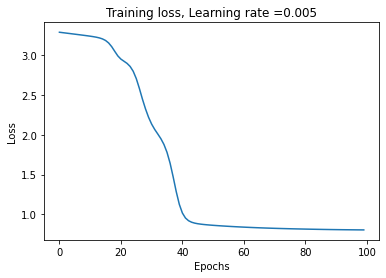

Train cost after epoch 0: 2.439286
Train cost after epoch 10: 2.391340
Train cost after epoch 20: 1.581788
Train cost after epoch 30: 0.955529
Train cost after epoch 40: 0.920910
Train cost after epoch 50: 0.892409
Train cost after epoch 60: 0.869293
Train cost after epoch 70: 0.851159
Train cost after epoch 80: 0.837322
Train cost after epoch 90: 0.827048


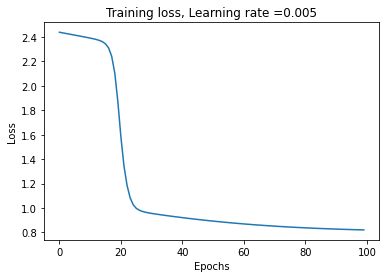

Train cost after epoch 0: 2.655154
Train cost after epoch 10: 1.628123
Train cost after epoch 20: 1.296467
Train cost after epoch 30: 1.250765
Train cost after epoch 40: 1.207684
Train cost after epoch 50: 1.166957
Train cost after epoch 60: 1.128709
Train cost after epoch 70: 1.092901
Train cost after epoch 80: 1.059482
Train cost after epoch 90: 1.028427


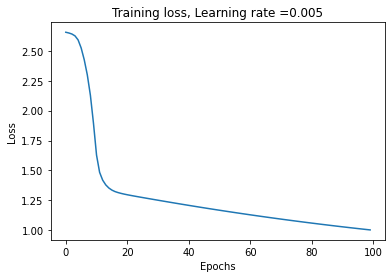

Train cost after epoch 0: 1.269067
Train cost after epoch 10: 1.230750
Train cost after epoch 20: 1.193538
Train cost after epoch 30: 1.156753
Train cost after epoch 40: 0.907467
Train cost after epoch 50: 0.830666
Train cost after epoch 60: 0.816195
Train cost after epoch 70: 0.808676
Train cost after epoch 80: 0.805590
Train cost after epoch 90: 0.804427


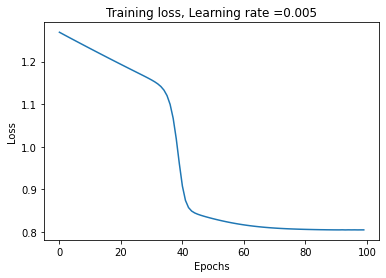

Train cost after epoch 0: 2.507911
Train cost after epoch 10: 2.156697
Train cost after epoch 20: 2.107989
Train cost after epoch 30: 2.058860
Train cost after epoch 40: 2.010192
Train cost after epoch 50: 1.962240
Train cost after epoch 60: 1.915005
Train cost after epoch 70: 1.868438
Train cost after epoch 80: 1.822498
Train cost after epoch 90: 1.777160


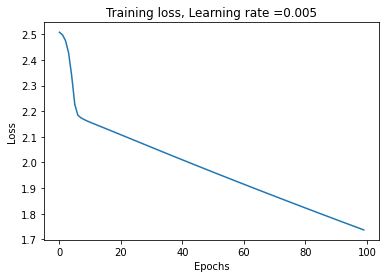

Train cost after epoch 0: 3.849407
Train cost after epoch 10: 2.864019
Train cost after epoch 20: 1.576357
Train cost after epoch 30: 1.520895
Train cost after epoch 40: 1.467415
Train cost after epoch 50: 1.369343
Train cost after epoch 60: 1.104003
Train cost after epoch 70: 0.912928
Train cost after epoch 80: 0.818780
Train cost after epoch 90: 0.805159


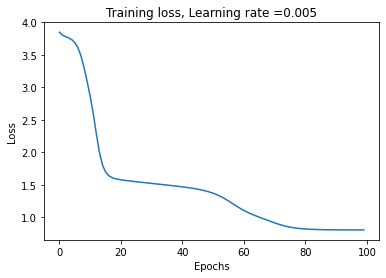

Train cost after epoch 0: 2.232681
Train cost after epoch 10: 2.181654
Train cost after epoch 20: 2.134373
Train cost after epoch 30: 2.007539
Train cost after epoch 40: 0.813565
Train cost after epoch 50: 0.805439
Train cost after epoch 60: 0.805742
Train cost after epoch 70: 0.804728
Train cost after epoch 80: 0.804336
Train cost after epoch 90: 0.804164


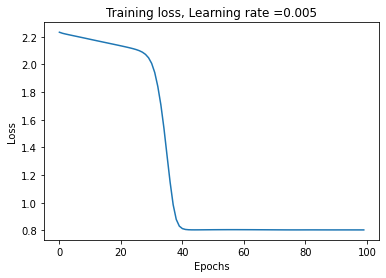

Train cost after epoch 0: 3.389663
Train cost after epoch 10: 3.331710
Train cost after epoch 20: 1.924405
Train cost after epoch 30: 0.889871
Train cost after epoch 40: 0.841751
Train cost after epoch 50: 0.811637
Train cost after epoch 60: 0.811342
Train cost after epoch 70: 0.806018
Train cost after epoch 80: 0.803710
Train cost after epoch 90: 0.803599


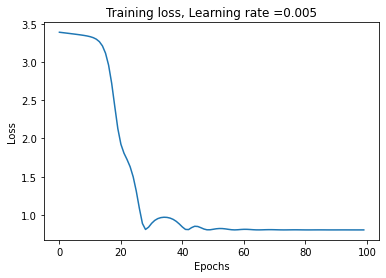

Train cost after epoch 0: 2.509169
Train cost after epoch 10: 1.488513
Train cost after epoch 20: 1.397218
Train cost after epoch 30: 1.352006
Train cost after epoch 40: 1.307932
Train cost after epoch 50: 1.265660
Train cost after epoch 60: 1.225309
Train cost after epoch 70: 1.186863
Train cost after epoch 80: 1.150301
Train cost after epoch 90: 1.115624


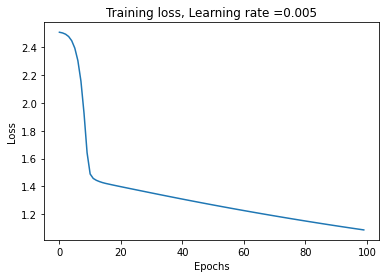

Train cost after epoch 0: 2.626424
Train cost after epoch 10: 1.817345
Train cost after epoch 20: 1.441071
Train cost after epoch 30: 1.322255
Train cost after epoch 40: 1.266651
Train cost after epoch 50: 1.217464
Train cost after epoch 60: 1.172237
Train cost after epoch 70: 1.130574
Train cost after epoch 80: 1.092160
Train cost after epoch 90: 1.056766


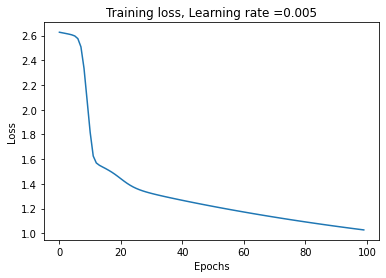

Train cost after epoch 0: 2.538274
Train cost after epoch 10: 1.666511
Train cost after epoch 20: 1.120662
Train cost after epoch 30: 1.043573
Train cost after epoch 40: 0.966651
Train cost after epoch 50: 0.868778
Train cost after epoch 60: 0.834845
Train cost after epoch 70: 0.818337
Train cost after epoch 80: 0.810027
Train cost after epoch 90: 0.806441


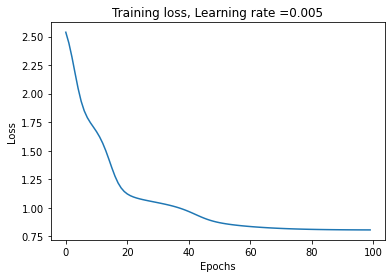

Train cost after epoch 0: 2.548484
Train cost after epoch 10: 2.496319
Train cost after epoch 20: 1.373656
Train cost after epoch 30: 1.082684
Train cost after epoch 40: 1.041320
Train cost after epoch 50: 1.003561
Train cost after epoch 60: 0.970108
Train cost after epoch 70: 0.940849
Train cost after epoch 80: 0.915503
Train cost after epoch 90: 0.893776


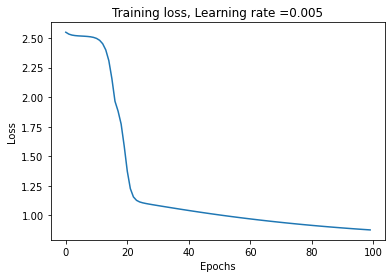

Train cost after epoch 0: 2.139871
Train cost after epoch 10: 2.017337
Train cost after epoch 20: 1.279161
Train cost after epoch 30: 1.206871
Train cost after epoch 40: 1.161641
Train cost after epoch 50: 1.119531
Train cost after epoch 60: 1.080743
Train cost after epoch 70: 1.045198
Train cost after epoch 80: 1.012744
Train cost after epoch 90: 0.983252


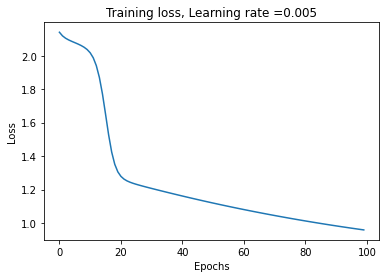

Train cost after epoch 0: 2.514686
Train cost after epoch 10: 2.511524
Train cost after epoch 20: 1.827082
Train cost after epoch 30: 1.769504
Train cost after epoch 40: 1.692741
Train cost after epoch 50: 0.960513
Train cost after epoch 60: 0.909105
Train cost after epoch 70: 0.876018
Train cost after epoch 80: 0.851391
Train cost after epoch 90: 0.834130


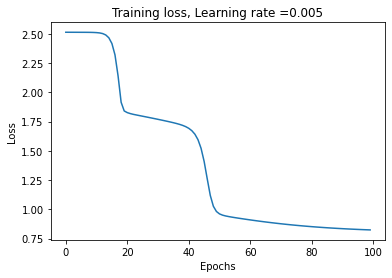

Train cost after epoch 0: 3.802102
Train cost after epoch 10: 1.452374
Train cost after epoch 20: 1.078531
Train cost after epoch 30: 0.948760
Train cost after epoch 40: 0.811075
Train cost after epoch 50: 0.806763
Train cost after epoch 60: 0.805184
Train cost after epoch 70: 0.804985
Train cost after epoch 80: 0.805015
Train cost after epoch 90: 0.804941


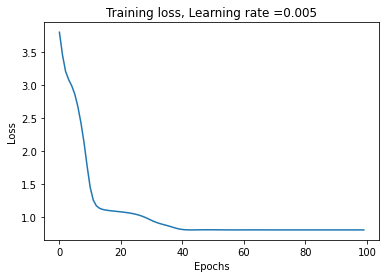

Train cost after epoch 0: 2.233311
Train cost after epoch 10: 1.483634
Train cost after epoch 20: 1.424187
Train cost after epoch 30: 1.367922
Train cost after epoch 40: 1.316048
Train cost after epoch 50: 1.266359
Train cost after epoch 60: 1.219934
Train cost after epoch 70: 1.176758
Train cost after epoch 80: 1.136597
Train cost after epoch 90: 1.099250


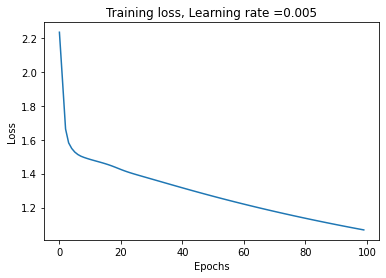

Train cost after epoch 0: 2.876645
Train cost after epoch 10: 2.293897
Train cost after epoch 20: 0.918420
Train cost after epoch 30: 0.892409
Train cost after epoch 40: 0.870101
Train cost after epoch 50: 0.851319
Train cost after epoch 60: 0.827946
Train cost after epoch 70: 0.803824
Train cost after epoch 80: 0.805716
Train cost after epoch 90: 0.804102


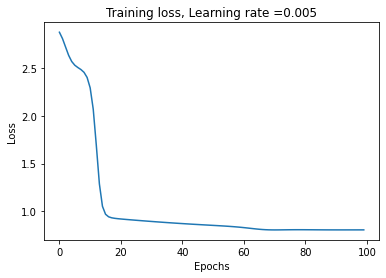

Train cost after epoch 0: 2.245913
Train cost after epoch 10: 1.974526
Train cost after epoch 20: 1.862110
Train cost after epoch 30: 1.098222
Train cost after epoch 40: 1.044047
Train cost after epoch 50: 1.003061
Train cost after epoch 60: 0.966900
Train cost after epoch 70: 0.935783
Train cost after epoch 80: 0.909309
Train cost after epoch 90: 0.887018


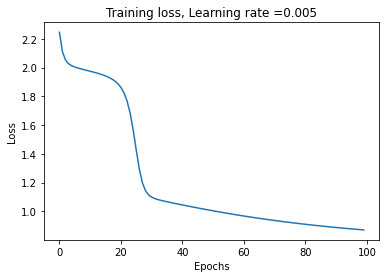

Train cost after epoch 0: 4.167093
Train cost after epoch 10: 4.030445
Train cost after epoch 20: 2.637367
Train cost after epoch 30: 1.663862
Train cost after epoch 40: 1.509596
Train cost after epoch 50: 1.385487
Train cost after epoch 60: 0.906964
Train cost after epoch 70: 0.824226
Train cost after epoch 80: 0.819416
Train cost after epoch 90: 0.808827


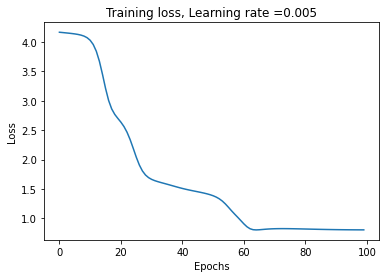

Train cost after epoch 0: 2.563852
Train cost after epoch 10: 2.514364
Train cost after epoch 20: 2.276125
Train cost after epoch 30: 1.996305
Train cost after epoch 40: 1.740269
Train cost after epoch 50: 1.347468
Train cost after epoch 60: 1.277298
Train cost after epoch 70: 1.216089
Train cost after epoch 80: 1.161102
Train cost after epoch 90: 1.112193


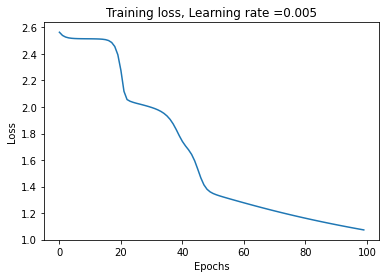

Train cost after epoch 0: 2.211276
Train cost after epoch 10: 1.389758
Train cost after epoch 20: 1.103962
Train cost after epoch 30: 1.053372
Train cost after epoch 40: 1.014941
Train cost after epoch 50: 0.980472
Train cost after epoch 60: 0.950057
Train cost after epoch 70: 0.923539
Train cost after epoch 80: 0.900669
Train cost after epoch 90: 0.881183


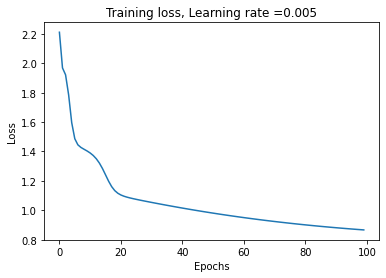

Train cost after epoch 0: 2.027417
Train cost after epoch 10: 1.980229
Train cost after epoch 20: 1.934331
Train cost after epoch 30: 1.848381
Train cost after epoch 40: 0.932588
Train cost after epoch 50: 0.864720
Train cost after epoch 60: 0.841925
Train cost after epoch 70: 0.826326
Train cost after epoch 80: 0.814234
Train cost after epoch 90: 0.806808


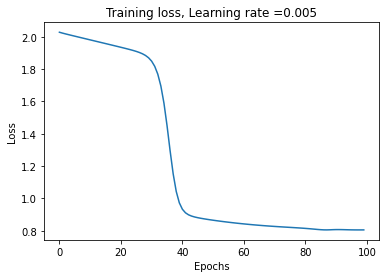

Train cost after epoch 0: 1.744069
Train cost after epoch 10: 1.699869
Train cost after epoch 20: 1.656065
Train cost after epoch 30: 1.612722
Train cost after epoch 40: 1.569909
Train cost after epoch 50: 1.527688
Train cost after epoch 60: 1.486117
Train cost after epoch 70: 1.445255
Train cost after epoch 80: 1.405163
Train cost after epoch 90: 1.365904


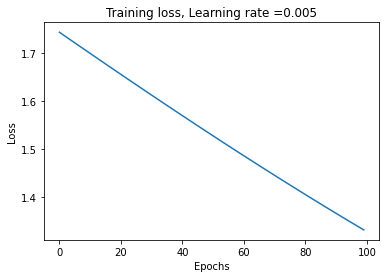

Train cost after epoch 0: 2.522640
Train cost after epoch 10: 2.441811
Train cost after epoch 20: 2.217255
Train cost after epoch 30: 1.376231
Train cost after epoch 40: 1.317337
Train cost after epoch 50: 1.088787
Train cost after epoch 60: 0.971942
Train cost after epoch 70: 0.927037
Train cost after epoch 80: 0.891923
Train cost after epoch 90: 0.865354


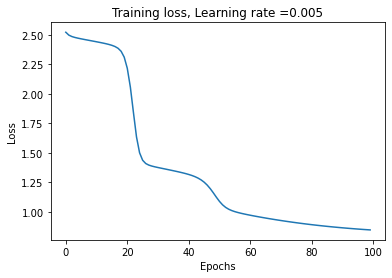

Train cost after epoch 0: 1.921209
Train cost after epoch 10: 1.036518
Train cost after epoch 20: 1.004488
Train cost after epoch 30: 0.975321
Train cost after epoch 40: 0.918403
Train cost after epoch 50: 0.855075
Train cost after epoch 60: 0.832205
Train cost after epoch 70: 0.817743
Train cost after epoch 80: 0.810038
Train cost after epoch 90: 0.806584


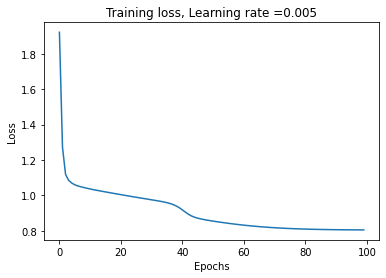

Train cost after epoch 0: 2.514728
Train cost after epoch 10: 1.741786
Train cost after epoch 20: 1.694637
Train cost after epoch 30: 1.649914
Train cost after epoch 40: 1.605951
Train cost after epoch 50: 1.562704
Train cost after epoch 60: 1.520186
Train cost after epoch 70: 1.478425
Train cost after epoch 80: 1.437457
Train cost after epoch 90: 1.397327


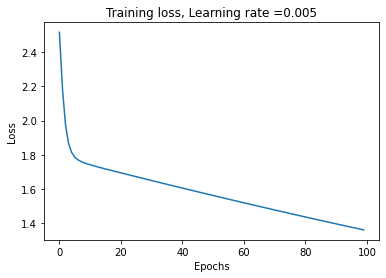

Train cost after epoch 0: 2.177076
Train cost after epoch 10: 2.122785
Train cost after epoch 20: 1.900801
Train cost after epoch 30: 1.161899
Train cost after epoch 40: 1.110208
Train cost after epoch 50: 1.065241
Train cost after epoch 60: 1.024861
Train cost after epoch 70: 0.989168
Train cost after epoch 80: 0.957870
Train cost after epoch 90: 0.930607


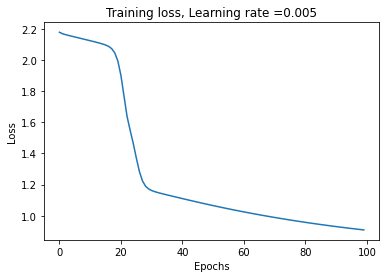

Train cost after epoch 0: 2.113389
Train cost after epoch 10: 1.870021
Train cost after epoch 20: 1.525787
Train cost after epoch 30: 1.436340
Train cost after epoch 40: 1.294213
Train cost after epoch 50: 1.230736
Train cost after epoch 60: 1.175206
Train cost after epoch 70: 1.125123
Train cost after epoch 80: 1.080406
Train cost after epoch 90: 1.040535


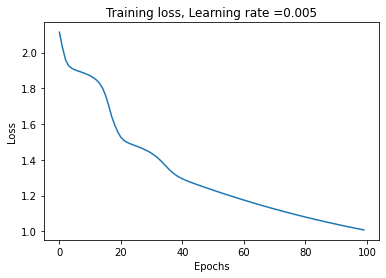

Train cost after epoch 0: 1.331214
Train cost after epoch 10: 1.084454
Train cost after epoch 20: 1.050277
Train cost after epoch 30: 0.998472
Train cost after epoch 40: 0.834198
Train cost after epoch 50: 0.812897
Train cost after epoch 60: 0.806665
Train cost after epoch 70: 0.805012
Train cost after epoch 80: 0.804909
Train cost after epoch 90: 0.804961


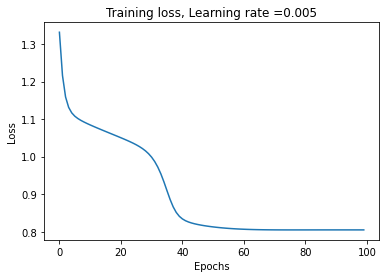

Train cost after epoch 0: 2.514805
Train cost after epoch 10: 2.514805
Train cost after epoch 20: 2.514805
Train cost after epoch 30: 2.514805
Train cost after epoch 40: 2.514805
Train cost after epoch 50: 2.514805
Train cost after epoch 60: 2.514805
Train cost after epoch 70: 2.514805
Train cost after epoch 80: 2.514805
Train cost after epoch 90: 2.514805


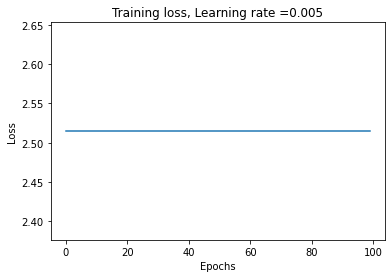

Train cost after epoch 0: 2.445549
Train cost after epoch 10: 2.328781
Train cost after epoch 20: 2.279282
Train cost after epoch 30: 1.830636
Train cost after epoch 40: 0.832100
Train cost after epoch 50: 0.823376
Train cost after epoch 60: 0.809105
Train cost after epoch 70: 0.806184
Train cost after epoch 80: 0.805134
Train cost after epoch 90: 0.805051


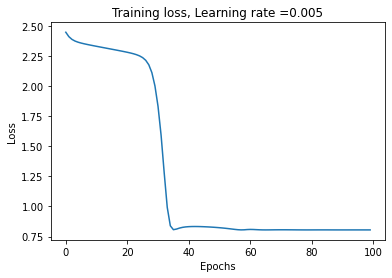

Train cost after epoch 0: 2.170286
Train cost after epoch 10: 1.584401
Train cost after epoch 20: 1.521385
Train cost after epoch 30: 1.295706
Train cost after epoch 40: 1.038092
Train cost after epoch 50: 0.921819
Train cost after epoch 60: 0.886767
Train cost after epoch 70: 0.859974
Train cost after epoch 80: 0.840589
Train cost after epoch 90: 0.827183


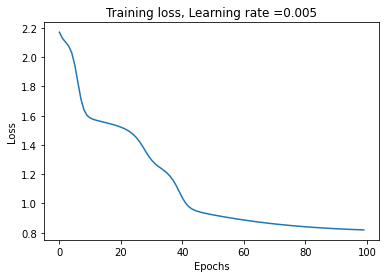

Train cost after epoch 0: 3.648487
Train cost after epoch 10: 2.010167
Train cost after epoch 20: 1.135636
Train cost after epoch 30: 1.044363
Train cost after epoch 40: 1.005820
Train cost after epoch 50: 0.972034
Train cost after epoch 60: 0.942405
Train cost after epoch 70: 0.916695
Train cost after epoch 80: 0.894630
Train cost after epoch 90: 0.875931


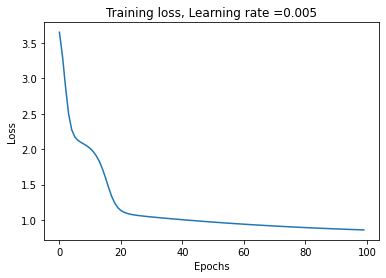

Train cost after epoch 0: 2.488038
Train cost after epoch 10: 1.839009
Train cost after epoch 20: 1.790986
Train cost after epoch 30: 1.665967
Train cost after epoch 40: 1.512846
Train cost after epoch 50: 1.396615
Train cost after epoch 60: 1.063077
Train cost after epoch 70: 0.988460
Train cost after epoch 80: 0.941134
Train cost after epoch 90: 0.903666


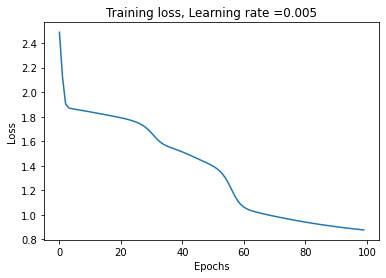

Train cost after epoch 0: 3.140430
Train cost after epoch 10: 3.091974
Train cost after epoch 20: 2.944086
Train cost after epoch 30: 2.029396
Train cost after epoch 40: 0.854944
Train cost after epoch 50: 0.832835
Train cost after epoch 60: 0.819706
Train cost after epoch 70: 0.811963
Train cost after epoch 80: 0.807893
Train cost after epoch 90: 0.806005


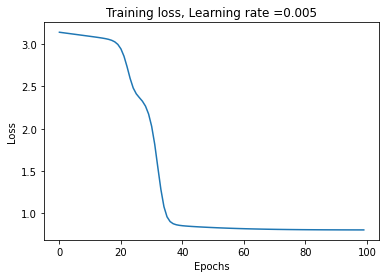

Train cost after epoch 0: 2.219589
Train cost after epoch 10: 2.072284
Train cost after epoch 20: 1.366902
Train cost after epoch 30: 1.231449
Train cost after epoch 40: 0.819766
Train cost after epoch 50: 0.809008
Train cost after epoch 60: 0.805602
Train cost after epoch 70: 0.804907
Train cost after epoch 80: 0.804926
Train cost after epoch 90: 0.804945


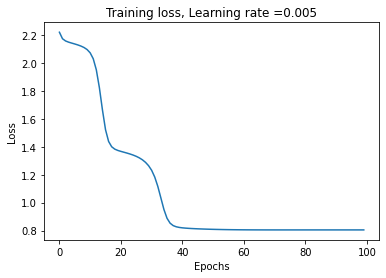

Train cost after epoch 0: 2.158418
Train cost after epoch 10: 1.513769
Train cost after epoch 20: 1.468412
Train cost after epoch 30: 1.424539
Train cost after epoch 40: 1.381733
Train cost after epoch 50: 1.340198
Train cost after epoch 60: 1.299980
Train cost after epoch 70: 1.261103
Train cost after epoch 80: 1.223597
Train cost after epoch 90: 1.187508


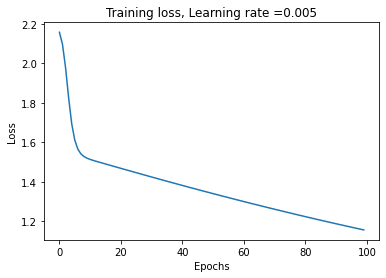

Train cost after epoch 0: 1.557877
Train cost after epoch 10: 1.032560
Train cost after epoch 20: 0.999658
Train cost after epoch 30: 0.970073
Train cost after epoch 40: 0.936524
Train cost after epoch 50: 0.892340
Train cost after epoch 60: 0.860665
Train cost after epoch 70: 0.837464
Train cost after epoch 80: 0.822145
Train cost after epoch 90: 0.812582


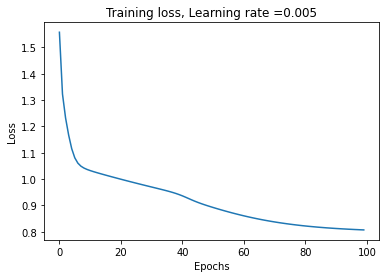

Train cost after epoch 0: 2.733198
Train cost after epoch 10: 1.897198
Train cost after epoch 20: 1.814259
Train cost after epoch 30: 0.806687
Train cost after epoch 40: 0.883679
Train cost after epoch 50: 0.862127
Train cost after epoch 60: 0.841646
Train cost after epoch 70: 0.826788
Train cost after epoch 80: 0.817067
Train cost after epoch 90: 0.811185


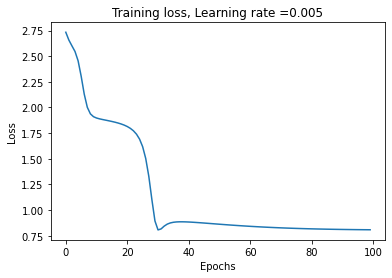

Train cost after epoch 0: 3.784631
Train cost after epoch 10: 2.690680
Train cost after epoch 20: 2.110316
Train cost after epoch 30: 1.117394
Train cost after epoch 40: 0.956247
Train cost after epoch 50: 0.857678
Train cost after epoch 60: 0.822059
Train cost after epoch 70: 0.809461
Train cost after epoch 80: 0.805469
Train cost after epoch 90: 0.804866


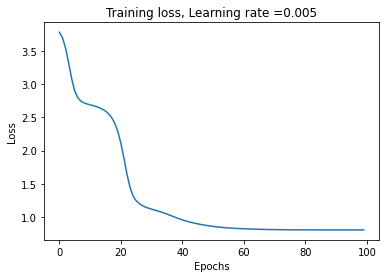

Train cost after epoch 0: 2.575186
Train cost after epoch 10: 2.250053
Train cost after epoch 20: 2.102098
Train cost after epoch 30: 1.554917
Train cost after epoch 40: 1.352970
Train cost after epoch 50: 1.268201
Train cost after epoch 60: 1.100274
Train cost after epoch 70: 0.933462
Train cost after epoch 80: 0.865375
Train cost after epoch 90: 0.832694


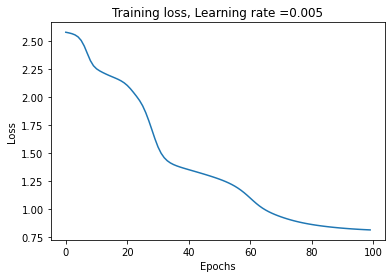

Train cost after epoch 0: 2.515198
Train cost after epoch 10: 2.514931
Train cost after epoch 20: 2.514844
Train cost after epoch 30: 2.514741
Train cost after epoch 40: 2.514396
Train cost after epoch 50: 2.484354
Train cost after epoch 60: 1.895184
Train cost after epoch 70: 1.819227
Train cost after epoch 80: 1.745078
Train cost after epoch 90: 1.676291


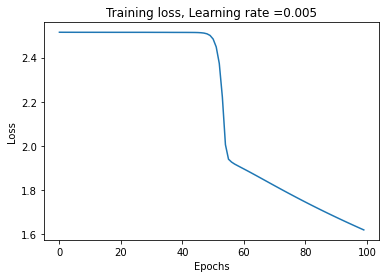

Train cost after epoch 0: 2.470897
Train cost after epoch 10: 1.520028
Train cost after epoch 20: 1.475905
Train cost after epoch 30: 1.431540
Train cost after epoch 40: 1.341461
Train cost after epoch 50: 1.279302
Train cost after epoch 60: 1.221413
Train cost after epoch 70: 1.168556
Train cost after epoch 80: 1.121035
Train cost after epoch 90: 1.078367


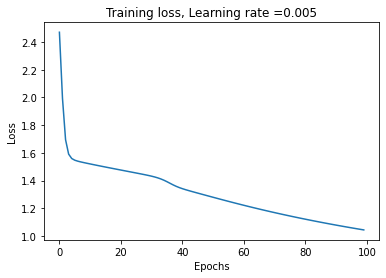

Train cost after epoch 0: 2.553092
Train cost after epoch 10: 0.804891
Train cost after epoch 20: 0.805201
Train cost after epoch 30: 0.805195
Train cost after epoch 40: 0.805031
Train cost after epoch 50: 0.804922
Train cost after epoch 60: 0.804890
Train cost after epoch 70: 0.804313
Train cost after epoch 80: 0.803826
Train cost after epoch 90: 0.801654


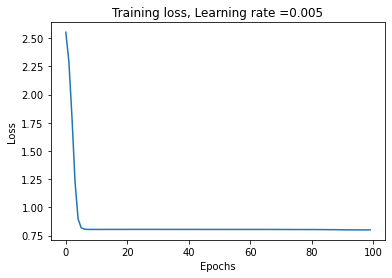

Train cost after epoch 0: 2.797455
Train cost after epoch 10: 2.606578
Train cost after epoch 20: 2.550780
Train cost after epoch 30: 1.811216
Train cost after epoch 40: 1.036399
Train cost after epoch 50: 0.993122
Train cost after epoch 60: 0.954830
Train cost after epoch 70: 0.922511
Train cost after epoch 80: 0.895820
Train cost after epoch 90: 0.874107


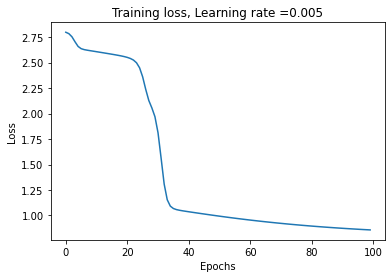

Train cost after epoch 0: 2.430617
Train cost after epoch 10: 2.379224
Train cost after epoch 20: 1.244132
Train cost after epoch 30: 1.099557
Train cost after epoch 40: 1.058349
Train cost after epoch 50: 1.020358
Train cost after epoch 60: 0.986309
Train cost after epoch 70: 0.956165
Train cost after epoch 80: 0.929711
Train cost after epoch 90: 0.906715


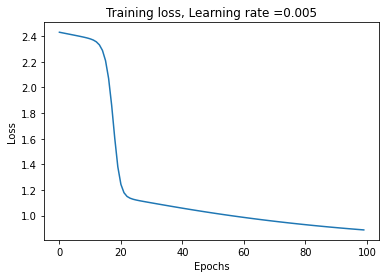

Train cost after epoch 0: 3.600886
Train cost after epoch 10: 1.626444
Train cost after epoch 20: 1.525593
Train cost after epoch 30: 1.477612
Train cost after epoch 40: 1.366934
Train cost after epoch 50: 0.992375
Train cost after epoch 60: 0.939816
Train cost after epoch 70: 0.902512
Train cost after epoch 80: 0.873679
Train cost after epoch 90: 0.852143


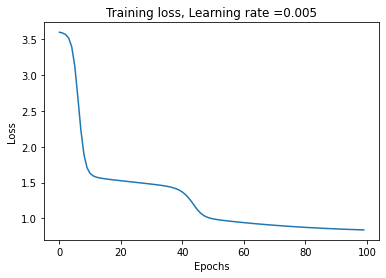

Train cost after epoch 0: 4.226039
Train cost after epoch 10: 1.313552
Train cost after epoch 20: 1.247138
Train cost after epoch 30: 1.196266
Train cost after epoch 40: 1.149646
Train cost after epoch 50: 1.105875
Train cost after epoch 60: 1.065893
Train cost after epoch 70: 1.029683
Train cost after epoch 80: 0.997033
Train cost after epoch 90: 0.967737


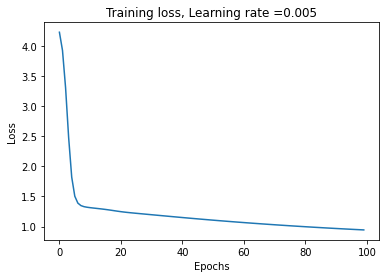

Train cost after epoch 0: 3.330107
Train cost after epoch 10: 1.687057
Train cost after epoch 20: 1.539114
Train cost after epoch 30: 1.445386
Train cost after epoch 40: 1.314494
Train cost after epoch 50: 0.959719
Train cost after epoch 60: 0.917108
Train cost after epoch 70: 0.883820
Train cost after epoch 80: 0.858630
Train cost after epoch 90: 0.840376


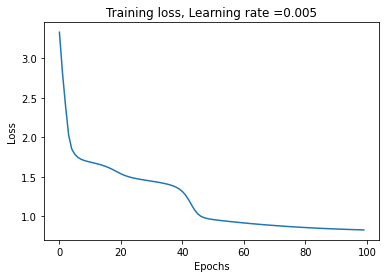

Train cost after epoch 0: 1.690798
Train cost after epoch 10: 1.382396
Train cost after epoch 20: 0.818975
Train cost after epoch 30: 0.804716
Train cost after epoch 40: 0.804164
Train cost after epoch 50: 0.802308
Train cost after epoch 60: 0.801069
Train cost after epoch 70: 0.800849
Train cost after epoch 80: 0.800640
Train cost after epoch 90: 0.800516


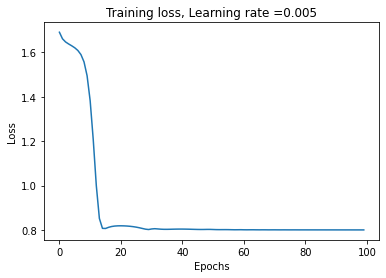

Train cost after epoch 0: 1.379867
Train cost after epoch 10: 1.141554
Train cost after epoch 20: 1.104382
Train cost after epoch 30: 1.070615
Train cost after epoch 40: 1.039111
Train cost after epoch 50: 1.009634
Train cost after epoch 60: 0.982256
Train cost after epoch 70: 0.957077
Train cost after epoch 80: 0.934157
Train cost after epoch 90: 0.913534


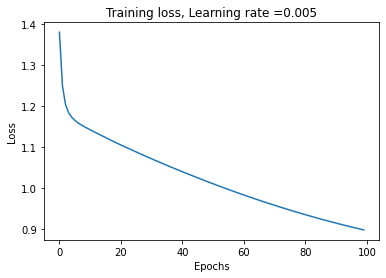

Train cost after epoch 0: 2.835088
Train cost after epoch 10: 2.781637
Train cost after epoch 20: 2.397176
Train cost after epoch 30: 0.977919
Train cost after epoch 40: 0.910921
Train cost after epoch 50: 0.864249
Train cost after epoch 60: 0.812662
Train cost after epoch 70: 0.804545
Train cost after epoch 80: 0.805518
Train cost after epoch 90: 0.804932


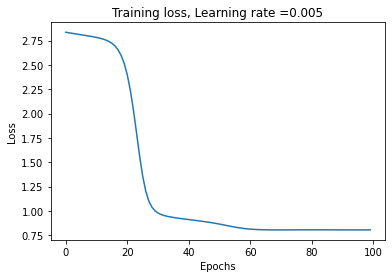

Train cost after epoch 0: 2.254571
Train cost after epoch 10: 1.309433
Train cost after epoch 20: 1.269124
Train cost after epoch 30: 1.229907
Train cost after epoch 40: 1.192162
Train cost after epoch 50: 1.155969
Train cost after epoch 60: 1.121413
Train cost after epoch 70: 1.088569
Train cost after epoch 80: 1.057519
Train cost after epoch 90: 1.028341


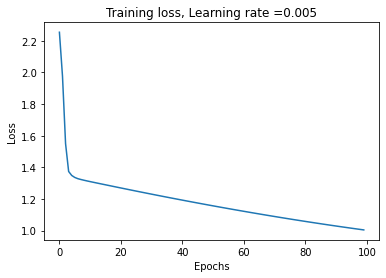

Train cost after epoch 0: 2.515583
Train cost after epoch 10: 2.510278
Train cost after epoch 20: 2.402793
Train cost after epoch 30: 1.810822
Train cost after epoch 40: 1.457168
Train cost after epoch 50: 1.399354
Train cost after epoch 60: 1.343746
Train cost after epoch 70: 1.291998
Train cost after epoch 80: 1.244008
Train cost after epoch 90: 1.199400


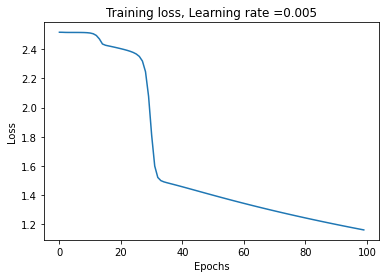

Train cost after epoch 0: 2.599252
Train cost after epoch 10: 2.206533
Train cost after epoch 20: 1.808147
Train cost after epoch 30: 1.375570
Train cost after epoch 40: 1.319914
Train cost after epoch 50: 1.268240
Train cost after epoch 60: 1.220082
Train cost after epoch 70: 1.175541
Train cost after epoch 80: 1.134351
Train cost after epoch 90: 1.096246


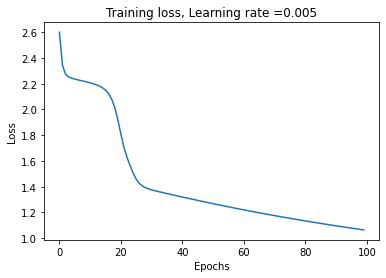

Train cost after epoch 0: 2.479149
Train cost after epoch 10: 2.431700
Train cost after epoch 20: 2.319131
Train cost after epoch 30: 1.338606
Train cost after epoch 40: 1.231226
Train cost after epoch 50: 1.175601
Train cost after epoch 60: 1.125197
Train cost after epoch 70: 1.080031
Train cost after epoch 80: 1.039804
Train cost after epoch 90: 1.004048


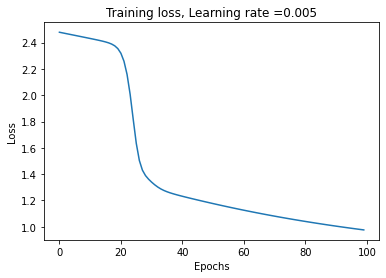

Train cost after epoch 0: 2.368081
Train cost after epoch 10: 2.320060
Train cost after epoch 20: 2.267682
Train cost after epoch 30: 1.940500
Train cost after epoch 40: 0.898625
Train cost after epoch 50: 0.821870
Train cost after epoch 60: 0.807203
Train cost after epoch 70: 0.807561
Train cost after epoch 80: 0.806987
Train cost after epoch 90: 0.806813


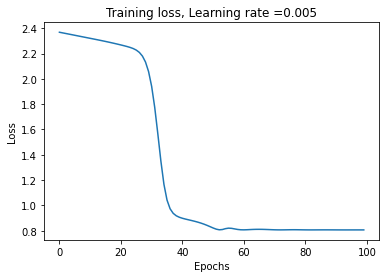

Train cost after epoch 0: 1.228283
Train cost after epoch 10: 1.189417
Train cost after epoch 20: 1.153238
Train cost after epoch 30: 1.118460
Train cost after epoch 40: 1.085230
Train cost after epoch 50: 1.053712
Train cost after epoch 60: 1.024047
Train cost after epoch 70: 0.996350
Train cost after epoch 80: 0.970716
Train cost after epoch 90: 0.947214


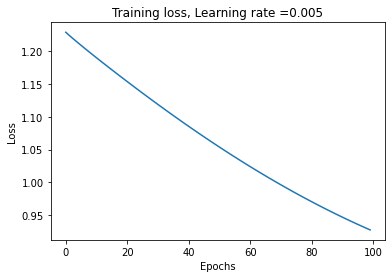

Train cost after epoch 0: 2.150267
Train cost after epoch 10: 1.937921
Train cost after epoch 20: 1.827724
Train cost after epoch 30: 1.481848
Train cost after epoch 40: 1.414345
Train cost after epoch 50: 1.358520
Train cost after epoch 60: 1.306278
Train cost after epoch 70: 1.257284
Train cost after epoch 80: 1.193198
Train cost after epoch 90: 1.068357


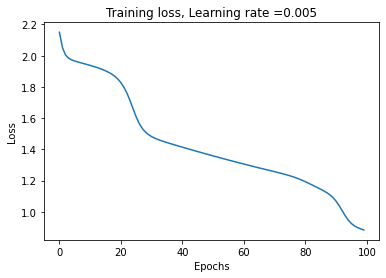

Train cost after epoch 0: 2.495280
Train cost after epoch 10: 2.150357
Train cost after epoch 20: 2.101138
Train cost after epoch 30: 2.052121
Train cost after epoch 40: 2.003632
Train cost after epoch 50: 1.955854
Train cost after epoch 60: 1.908777
Train cost after epoch 70: 1.862353
Train cost after epoch 80: 1.816545
Train cost after epoch 90: 1.771330


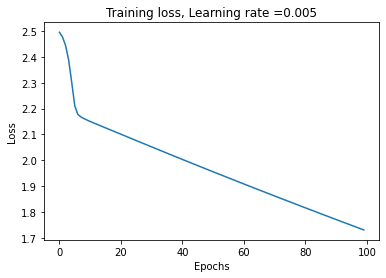

Train cost after epoch 0: 3.015415
Train cost after epoch 10: 2.921034
Train cost after epoch 20: 2.842662
Train cost after epoch 30: 2.697314
Train cost after epoch 40: 2.403007
Train cost after epoch 50: 2.287614
Train cost after epoch 60: 1.886873
Train cost after epoch 70: 1.580867
Train cost after epoch 80: 1.463374
Train cost after epoch 90: 1.350500


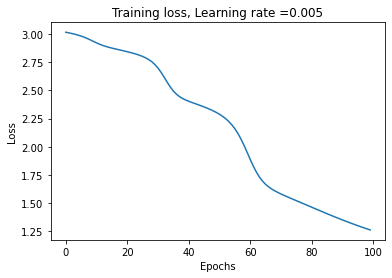

Train cost after epoch 0: 3.063468
Train cost after epoch 10: 2.999741
Train cost after epoch 20: 2.944566
Train cost after epoch 30: 2.379099
Train cost after epoch 40: 1.809128
Train cost after epoch 50: 1.550146
Train cost after epoch 60: 1.439977
Train cost after epoch 70: 1.364574
Train cost after epoch 80: 1.296515
Train cost after epoch 90: 1.231697


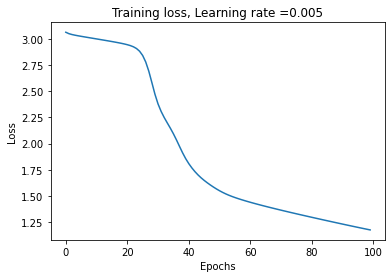

Train cost after epoch 0: 3.036140
Train cost after epoch 10: 0.933416
Train cost after epoch 20: 0.906491
Train cost after epoch 30: 0.883260
Train cost after epoch 40: 0.827951
Train cost after epoch 50: 0.807243
Train cost after epoch 60: 0.804857
Train cost after epoch 70: 0.804663
Train cost after epoch 80: 0.804301
Train cost after epoch 90: 0.803529


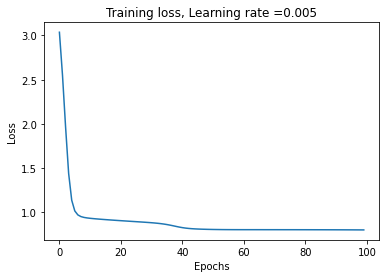

Train cost after epoch 0: 2.486629
Train cost after epoch 10: 1.489983
Train cost after epoch 20: 1.443087
Train cost after epoch 30: 1.399445
Train cost after epoch 40: 1.356901
Train cost after epoch 50: 1.315690
Train cost after epoch 60: 1.275872
Train cost after epoch 70: 1.237473
Train cost after epoch 80: 1.200525
Train cost after epoch 90: 1.165074


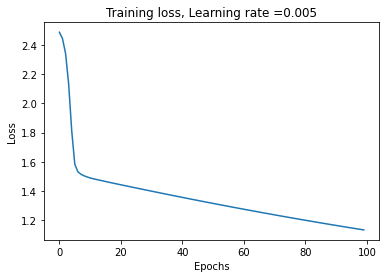

Train cost after epoch 0: 2.216187
Train cost after epoch 10: 2.112142
Train cost after epoch 20: 1.820105
Train cost after epoch 30: 0.971705
Train cost after epoch 40: 0.813550
Train cost after epoch 50: 0.806793
Train cost after epoch 60: 0.803294
Train cost after epoch 70: 0.801151
Train cost after epoch 80: 0.799807
Train cost after epoch 90: 0.799001


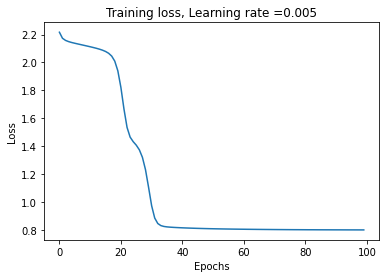

__________________________________________________ 0.1% GA is running...Train cost after epoch 0: 2.540682
Train cost after epoch 10: 1.742918
Train cost after epoch 20: 1.611488
Train cost after epoch 30: 0.861217
Train cost after epoch 40: 0.938666
Train cost after epoch 50: 0.853468
Train cost after epoch 60: 0.821450
Train cost after epoch 70: 0.810017
Train cost after epoch 80: 0.805773
Train cost after epoch 90: 0.804121


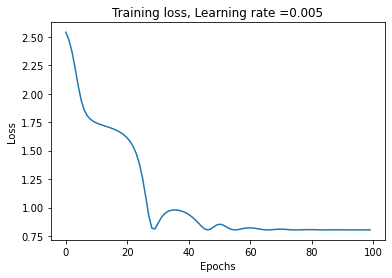

Train cost after epoch 0: 2.925333
Train cost after epoch 10: 1.424952
Train cost after epoch 20: 0.814264
Train cost after epoch 30: 0.809107
Train cost after epoch 40: 0.806118
Train cost after epoch 50: 0.803229
Train cost after epoch 60: 0.802102
Train cost after epoch 70: 0.801314
Train cost after epoch 80: 0.800824
Train cost after epoch 90: 0.800326


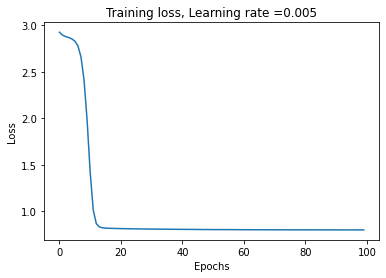

Train cost after epoch 0: 2.212759
Train cost after epoch 10: 1.993645
Train cost after epoch 20: 1.024093
Train cost after epoch 30: 0.940501
Train cost after epoch 40: 0.910579
Train cost after epoch 50: 0.885154
Train cost after epoch 60: 0.864429
Train cost after epoch 70: 0.848019
Train cost after epoch 80: 0.835371
Train cost after epoch 90: 0.825885


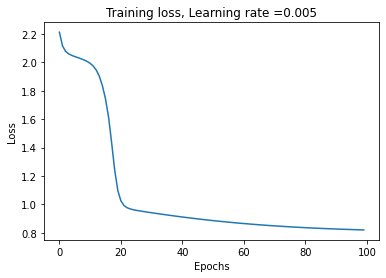

Train cost after epoch 0: 0.891276
Train cost after epoch 10: 0.866912
Train cost after epoch 20: 0.849767
Train cost after epoch 30: 0.835765
Train cost after epoch 40: 0.824844
Train cost after epoch 50: 0.816649
Train cost after epoch 60: 0.810689
Train cost after epoch 70: 0.805923
Train cost after epoch 80: 0.803132
Train cost after epoch 90: 0.801301


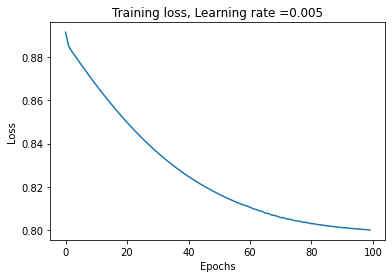

Train cost after epoch 0: 1.638718
Train cost after epoch 10: 1.558135
Train cost after epoch 20: 1.513291
Train cost after epoch 30: 1.179095
Train cost after epoch 40: 1.099278
Train cost after epoch 50: 1.053439
Train cost after epoch 60: 1.011879
Train cost after epoch 70: 0.975537
Train cost after epoch 80: 0.944162
Train cost after epoch 90: 0.917305


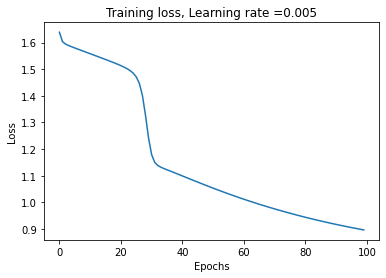

Train cost after epoch 0: 1.559481
Train cost after epoch 10: 1.383184
Train cost after epoch 20: 1.334873
Train cost after epoch 30: 1.103418
Train cost after epoch 40: 1.050536
Train cost after epoch 50: 1.008185
Train cost after epoch 60: 0.970828
Train cost after epoch 70: 0.938744
Train cost after epoch 80: 0.911555
Train cost after epoch 90: 0.888772


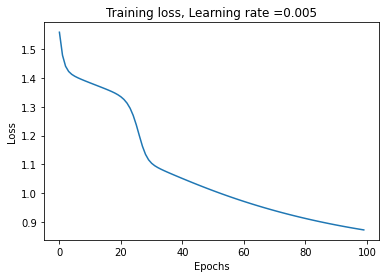

Train cost after epoch 0: 2.743980
Train cost after epoch 10: 2.057825
Train cost after epoch 20: 1.983840
Train cost after epoch 30: 1.930590
Train cost after epoch 40: 1.712620
Train cost after epoch 50: 1.188184
Train cost after epoch 60: 1.130389
Train cost after epoch 70: 1.078375
Train cost after epoch 80: 1.032867
Train cost after epoch 90: 0.993489


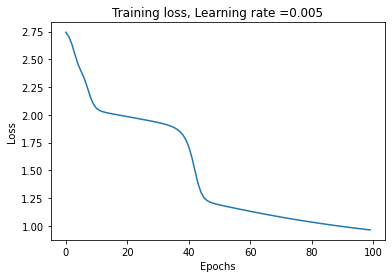

Train cost after epoch 0: 2.514156
Train cost after epoch 10: 2.261666
Train cost after epoch 20: 1.798996
Train cost after epoch 30: 1.743005
Train cost after epoch 40: 1.346066
Train cost after epoch 50: 0.849250
Train cost after epoch 60: 0.827533
Train cost after epoch 70: 0.814908
Train cost after epoch 80: 0.808571
Train cost after epoch 90: 0.805970


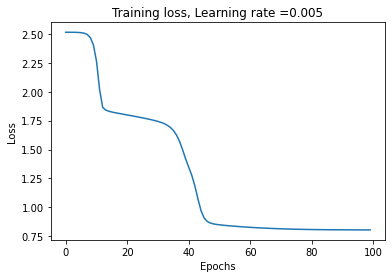

Train cost after epoch 0: 2.500278
Train cost after epoch 10: 1.671996
Train cost after epoch 20: 1.621233
Train cost after epoch 30: 1.567597
Train cost after epoch 40: 1.407601
Train cost after epoch 50: 1.344693
Train cost after epoch 60: 1.285908
Train cost after epoch 70: 1.231795
Train cost after epoch 80: 1.182539
Train cost after epoch 90: 1.137665


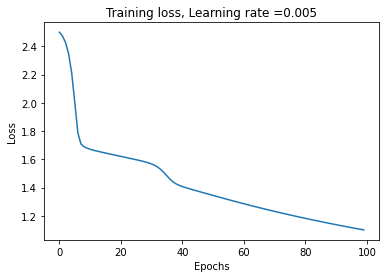

Train cost after epoch 0: 2.527161
Train cost after epoch 10: 2.472854
Train cost after epoch 20: 2.282311
Train cost after epoch 30: 1.932059
Train cost after epoch 40: 1.873566
Train cost after epoch 50: 1.815431
Train cost after epoch 60: 1.759624
Train cost after epoch 70: 1.706249
Train cost after epoch 80: 1.654997
Train cost after epoch 90: 1.605572


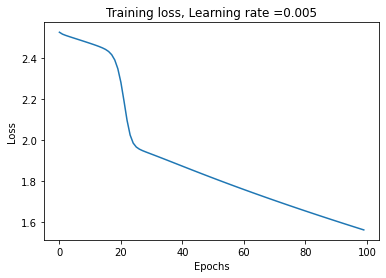

Train cost after epoch 0: 3.409127
Train cost after epoch 10: 1.466124
Train cost after epoch 20: 1.378672
Train cost after epoch 30: 1.328087
Train cost after epoch 40: 1.076650
Train cost after epoch 50: 0.873111
Train cost after epoch 60: 0.825353
Train cost after epoch 70: 0.818059
Train cost after epoch 80: 0.805312
Train cost after epoch 90: 0.802642


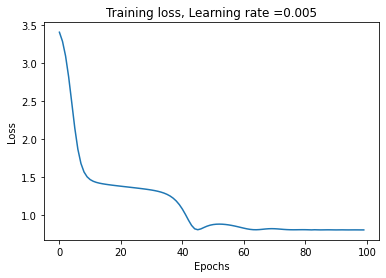

Train cost after epoch 0: 2.206571
Train cost after epoch 10: 1.574316
Train cost after epoch 20: 1.353447
Train cost after epoch 30: 1.308174
Train cost after epoch 40: 1.264123
Train cost after epoch 50: 1.208643
Train cost after epoch 60: 0.808371
Train cost after epoch 70: 0.808372
Train cost after epoch 80: 0.806304
Train cost after epoch 90: 0.804934


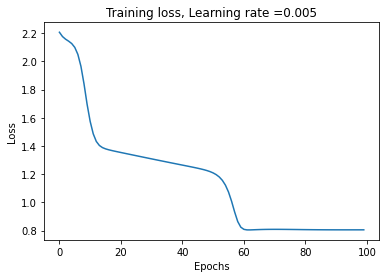

Train cost after epoch 0: 2.436930
Train cost after epoch 10: 1.165594
Train cost after epoch 20: 1.120295
Train cost after epoch 30: 0.940819
Train cost after epoch 40: 0.863680
Train cost after epoch 50: 0.839961
Train cost after epoch 60: 0.824196
Train cost after epoch 70: 0.814531
Train cost after epoch 80: 0.809207
Train cost after epoch 90: 0.806589


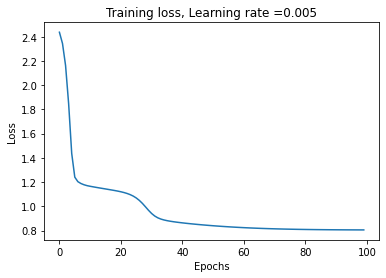

Train cost after epoch 0: 2.378432
Train cost after epoch 10: 2.315219
Train cost after epoch 20: 2.248313
Train cost after epoch 30: 1.228610
Train cost after epoch 40: 0.976813
Train cost after epoch 50: 0.888919
Train cost after epoch 60: 0.850364
Train cost after epoch 70: 0.828194
Train cost after epoch 80: 0.815412
Train cost after epoch 90: 0.808967


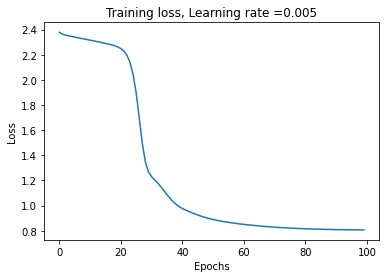

Train cost after epoch 0: 2.796030
Train cost after epoch 10: 2.245484
Train cost after epoch 20: 2.192557
Train cost after epoch 30: 2.088021
Train cost after epoch 40: 1.900913
Train cost after epoch 50: 1.650353
Train cost after epoch 60: 1.562214
Train cost after epoch 70: 1.492141
Train cost after epoch 80: 1.427867
Train cost after epoch 90: 1.369077


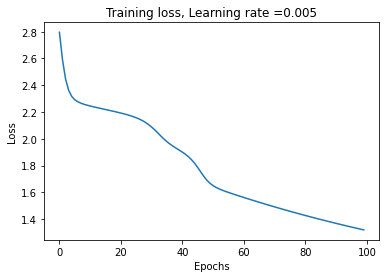

Train cost after epoch 0: 2.720517
Train cost after epoch 10: 2.512543
Train cost after epoch 20: 2.320966
Train cost after epoch 30: 1.011051
Train cost after epoch 40: 0.974295
Train cost after epoch 50: 0.940466
Train cost after epoch 60: 0.911461
Train cost after epoch 70: 0.887292
Train cost after epoch 80: 0.867531
Train cost after epoch 90: 0.851662


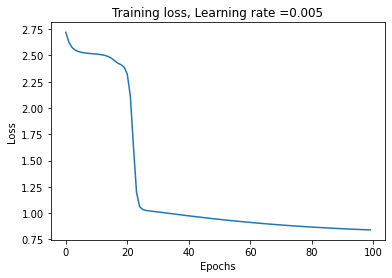

Train cost after epoch 0: 3.271592
Train cost after epoch 10: 2.210824
Train cost after epoch 20: 2.160816
Train cost after epoch 30: 2.097519
Train cost after epoch 40: 1.401879
Train cost after epoch 50: 1.183328
Train cost after epoch 60: 0.969134
Train cost after epoch 70: 0.819051
Train cost after epoch 80: 0.806939
Train cost after epoch 90: 0.804871


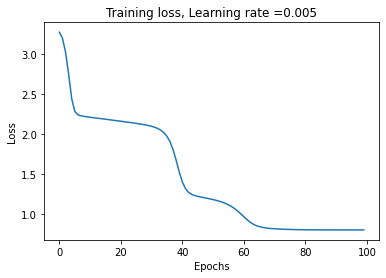

Train cost after epoch 0: 2.586826
Train cost after epoch 10: 2.452318
Train cost after epoch 20: 2.363822
Train cost after epoch 30: 1.557029
Train cost after epoch 40: 1.454091
Train cost after epoch 50: 1.353839
Train cost after epoch 60: 1.172026
Train cost after epoch 70: 1.098988
Train cost after epoch 80: 1.042298
Train cost after epoch 90: 0.994847


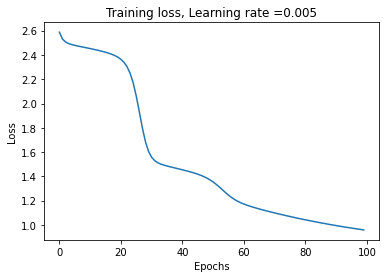

Train cost after epoch 0: 4.983033
Train cost after epoch 10: 2.558114
Train cost after epoch 20: 1.543067
Train cost after epoch 30: 1.418930
Train cost after epoch 40: 1.230101
Train cost after epoch 50: 1.106008
Train cost after epoch 60: 0.879482
Train cost after epoch 70: 0.804590
Train cost after epoch 80: 0.804226
Train cost after epoch 90: 0.804160


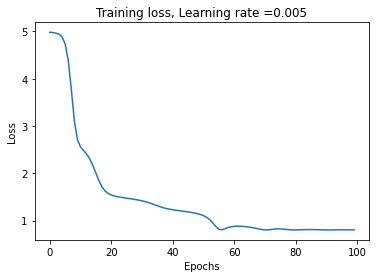

Train cost after epoch 0: 2.438046
Train cost after epoch 10: 2.301356
Train cost after epoch 20: 2.221058
Train cost after epoch 30: 2.016965
Train cost after epoch 40: 1.904168
Train cost after epoch 50: 1.754791
Train cost after epoch 60: 1.684490
Train cost after epoch 70: 1.616235
Train cost after epoch 80: 1.498923
Train cost after epoch 90: 1.322489


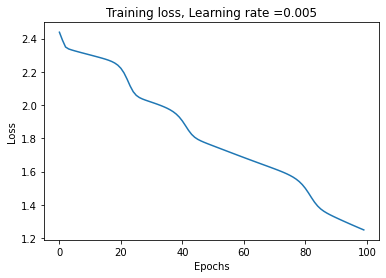

Train cost after epoch 0: 2.280399
Train cost after epoch 10: 1.553754
Train cost after epoch 20: 1.507800
Train cost after epoch 30: 1.463096
Train cost after epoch 40: 1.393165
Train cost after epoch 50: 1.221083
Train cost after epoch 60: 1.115503
Train cost after epoch 70: 1.054968
Train cost after epoch 80: 1.005677
Train cost after epoch 90: 0.964686


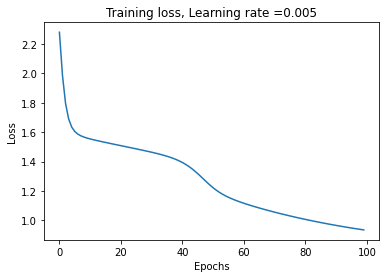

Train cost after epoch 0: 2.693724
Train cost after epoch 10: 1.768717
Train cost after epoch 20: 1.572125
Train cost after epoch 30: 1.441880
Train cost after epoch 40: 1.386673
Train cost after epoch 50: 1.264581
Train cost after epoch 60: 1.058067
Train cost after epoch 70: 0.990057
Train cost after epoch 80: 0.942383
Train cost after epoch 90: 0.904759


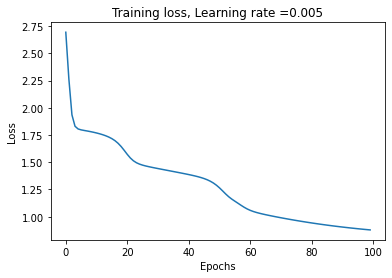

Train cost after epoch 0: 3.323937
Train cost after epoch 10: 3.274026
Train cost after epoch 20: 3.062065
Train cost after epoch 30: 2.597877
Train cost after epoch 40: 2.386884
Train cost after epoch 50: 1.351025
Train cost after epoch 60: 1.091402
Train cost after epoch 70: 0.807641
Train cost after epoch 80: 0.805144
Train cost after epoch 90: 0.805956


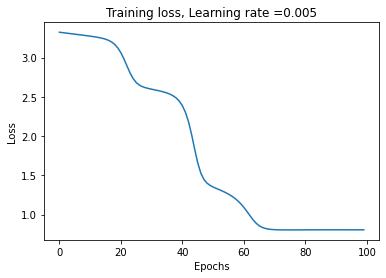

Train cost after epoch 0: 3.133419
Train cost after epoch 10: 2.451181
Train cost after epoch 20: 2.391492
Train cost after epoch 30: 2.099812
Train cost after epoch 40: 1.043098
Train cost after epoch 50: 0.991648
Train cost after epoch 60: 0.952472
Train cost after epoch 70: 0.919711
Train cost after epoch 80: 0.892873
Train cost after epoch 90: 0.871233


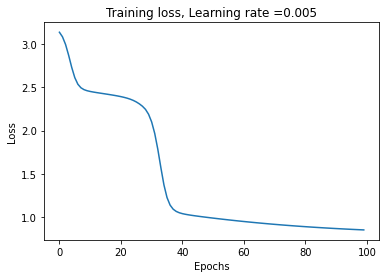

Train cost after epoch 0: 1.695038
Train cost after epoch 10: 1.651076
Train cost after epoch 20: 1.607661
Train cost after epoch 30: 1.564266
Train cost after epoch 40: 1.176606
Train cost after epoch 50: 1.105951
Train cost after epoch 60: 1.055855
Train cost after epoch 70: 1.011325
Train cost after epoch 80: 0.973018
Train cost after epoch 90: 0.940438


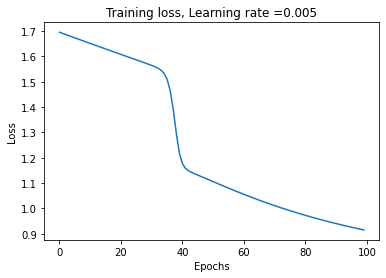

Train cost after epoch 0: 3.054404
Train cost after epoch 10: 1.432188
Train cost after epoch 20: 1.304182
Train cost after epoch 30: 1.260610
Train cost after epoch 40: 1.218762
Train cost after epoch 50: 1.178969
Train cost after epoch 60: 1.141345
Train cost after epoch 70: 1.105874
Train cost after epoch 80: 1.072548
Train cost after epoch 90: 1.041376


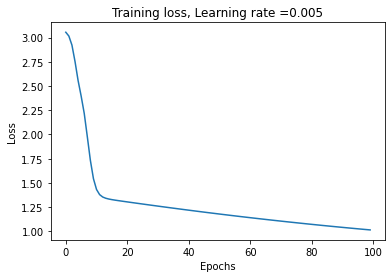

Train cost after epoch 0: 3.548548
Train cost after epoch 10: 1.378608
Train cost after epoch 20: 1.336844
Train cost after epoch 30: 1.295820
Train cost after epoch 40: 1.242784
Train cost after epoch 50: 1.185286
Train cost after epoch 60: 1.130116
Train cost after epoch 70: 1.080410
Train cost after epoch 80: 1.036725
Train cost after epoch 90: 0.998562


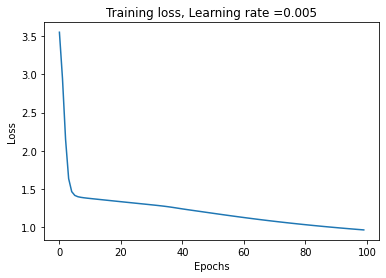

Train cost after epoch 0: 2.904547
Train cost after epoch 10: 2.524153
Train cost after epoch 20: 2.468440
Train cost after epoch 30: 1.157876
Train cost after epoch 40: 0.849635
Train cost after epoch 50: 0.833566
Train cost after epoch 60: 0.820083
Train cost after epoch 70: 0.811779
Train cost after epoch 80: 0.807529
Train cost after epoch 90: 0.805711


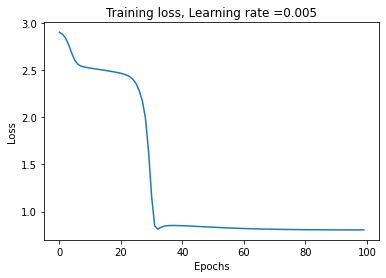

Train cost after epoch 0: 1.257233
Train cost after epoch 10: 1.075663
Train cost after epoch 20: 1.017418
Train cost after epoch 30: 0.983511
Train cost after epoch 40: 0.952673
Train cost after epoch 50: 0.925433
Train cost after epoch 60: 0.901820
Train cost after epoch 70: 0.881669
Train cost after epoch 80: 0.864745
Train cost after epoch 90: 0.850778


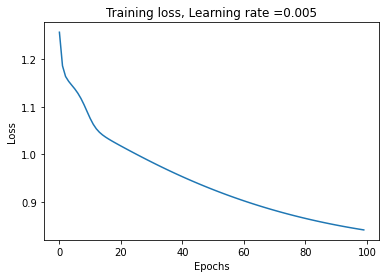

Train cost after epoch 0: 2.177201
Train cost after epoch 10: 1.532764
Train cost after epoch 20: 1.414277
Train cost after epoch 30: 0.986498
Train cost after epoch 40: 0.809773
Train cost after epoch 50: 0.808606
Train cost after epoch 60: 0.805769
Train cost after epoch 70: 0.804875
Train cost after epoch 80: 0.804894
Train cost after epoch 90: 0.804908


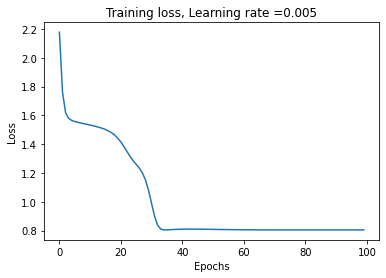

Train cost after epoch 0: 2.149526
Train cost after epoch 10: 2.056840
Train cost after epoch 20: 2.010413
Train cost after epoch 30: 1.964485
Train cost after epoch 40: 1.918916
Train cost after epoch 50: 1.873719
Train cost after epoch 60: 1.828916
Train cost after epoch 70: 1.784525
Train cost after epoch 80: 1.740573
Train cost after epoch 90: 1.697087


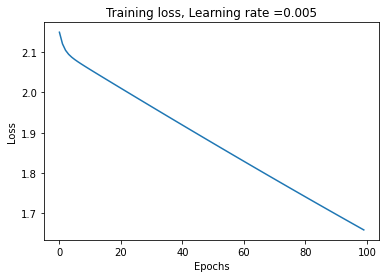

Train cost after epoch 0: 2.336205
Train cost after epoch 10: 2.257008
Train cost after epoch 20: 1.582453
Train cost after epoch 30: 0.883724
Train cost after epoch 40: 0.805230
Train cost after epoch 50: 0.806728
Train cost after epoch 60: 0.805629
Train cost after epoch 70: 0.804982
Train cost after epoch 80: 0.805006
Train cost after epoch 90: 0.804996


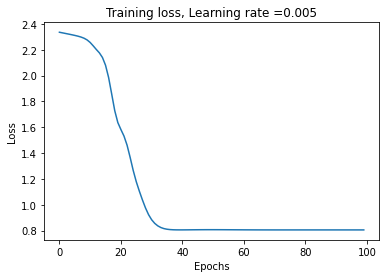

Train cost after epoch 0: 2.987550
Train cost after epoch 10: 0.948815
Train cost after epoch 20: 0.819719
Train cost after epoch 30: 0.825504
Train cost after epoch 40: 0.809181
Train cost after epoch 50: 0.810158
Train cost after epoch 60: 0.807545
Train cost after epoch 70: 0.806836
Train cost after epoch 80: 0.806422
Train cost after epoch 90: 0.805936


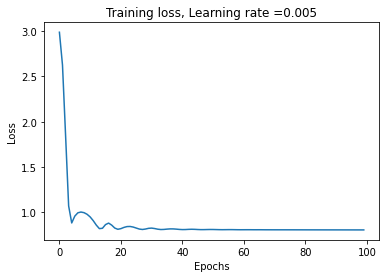

Train cost after epoch 0: 2.509478
Train cost after epoch 10: 1.883301
Train cost after epoch 20: 1.786501
Train cost after epoch 30: 0.892467
Train cost after epoch 40: 0.804954
Train cost after epoch 50: 0.805260
Train cost after epoch 60: 0.805136
Train cost after epoch 70: 0.804906
Train cost after epoch 80: 0.804903
Train cost after epoch 90: 0.804900


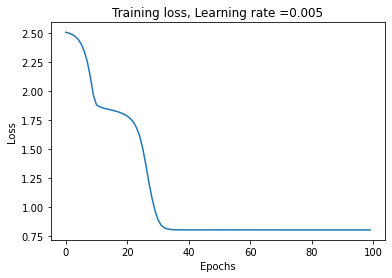

Train cost after epoch 0: 2.303038
Train cost after epoch 10: 1.510412
Train cost after epoch 20: 0.913475
Train cost after epoch 30: 0.878412
Train cost after epoch 40: 0.856991
Train cost after epoch 50: 0.840342
Train cost after epoch 60: 0.828035
Train cost after epoch 70: 0.819355
Train cost after epoch 80: 0.813512
Train cost after epoch 90: 0.809762


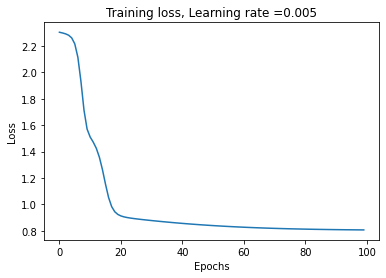

Train cost after epoch 0: 3.093421
Train cost after epoch 10: 1.040224
Train cost after epoch 20: 0.928439
Train cost after epoch 30: 0.900791
Train cost after epoch 40: 0.878158
Train cost after epoch 50: 0.859565
Train cost after epoch 60: 0.844684
Train cost after epoch 70: 0.833100
Train cost after epoch 80: 0.824343
Train cost after epoch 90: 0.817923


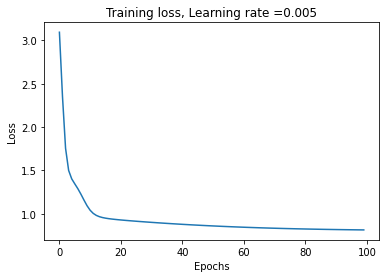

Train cost after epoch 0: 1.421835
Train cost after epoch 10: 1.371675
Train cost after epoch 20: 1.251142
Train cost after epoch 30: 0.816519
Train cost after epoch 40: 0.811805
Train cost after epoch 50: 0.806796
Train cost after epoch 60: 0.805050
Train cost after epoch 70: 0.804912
Train cost after epoch 80: 0.804969
Train cost after epoch 90: 0.804932


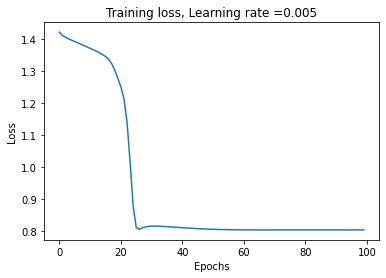

Train cost after epoch 0: 2.474291
Train cost after epoch 10: 1.421894
Train cost after epoch 20: 1.376996
Train cost after epoch 30: 1.241683
Train cost after epoch 40: 0.990535
Train cost after epoch 50: 0.949006
Train cost after epoch 60: 0.914330
Train cost after epoch 70: 0.886229
Train cost after epoch 80: 0.864121
Train cost after epoch 90: 0.847117


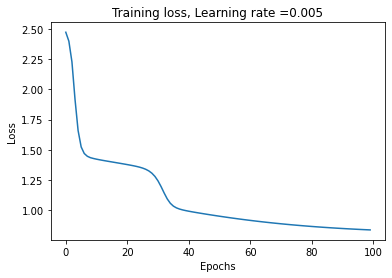

Train cost after epoch 0: 1.452793
Train cost after epoch 10: 1.350875
Train cost after epoch 20: 0.891854
Train cost after epoch 30: 0.860415
Train cost after epoch 40: 0.841949
Train cost after epoch 50: 0.828332
Train cost after epoch 60: 0.818911
Train cost after epoch 70: 0.812798
Train cost after epoch 80: 0.809081
Train cost after epoch 90: 0.806973


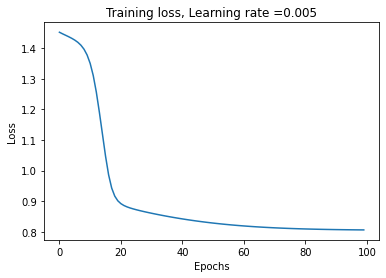

Train cost after epoch 0: 3.054931
Train cost after epoch 10: 3.004573
Train cost after epoch 20: 2.652261
Train cost after epoch 30: 1.567873
Train cost after epoch 40: 1.388799
Train cost after epoch 50: 1.215910
Train cost after epoch 60: 1.136864
Train cost after epoch 70: 1.060782
Train cost after epoch 80: 0.870942
Train cost after epoch 90: 0.813517


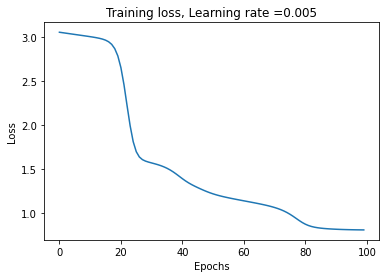

Train cost after epoch 0: 2.068734
Train cost after epoch 10: 2.018486
Train cost after epoch 20: 1.727775
Train cost after epoch 30: 1.324303
Train cost after epoch 40: 1.240077
Train cost after epoch 50: 1.188124
Train cost after epoch 60: 1.139948
Train cost after epoch 70: 1.096259
Train cost after epoch 80: 1.056828
Train cost after epoch 90: 1.021299


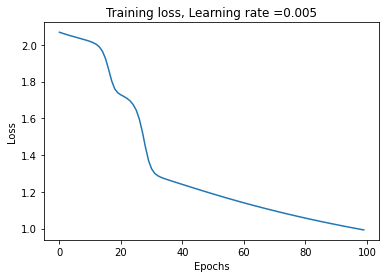

Train cost after epoch 0: 1.566336
Train cost after epoch 10: 1.518664
Train cost after epoch 20: 1.476118
Train cost after epoch 30: 1.414456
Train cost after epoch 40: 1.272792
Train cost after epoch 50: 1.138314
Train cost after epoch 60: 0.904749
Train cost after epoch 70: 0.867236
Train cost after epoch 80: 0.841190
Train cost after epoch 90: 0.824204


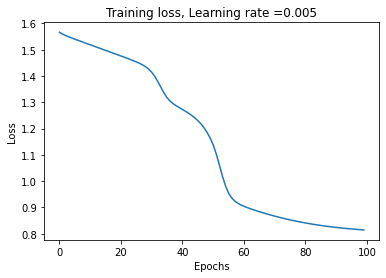

Train cost after epoch 0: 2.257377
Train cost after epoch 10: 2.170788
Train cost after epoch 20: 1.799452
Train cost after epoch 30: 1.149203
Train cost after epoch 40: 0.911472
Train cost after epoch 50: 0.806734
Train cost after epoch 60: 0.817403
Train cost after epoch 70: 0.805191
Train cost after epoch 80: 0.805549
Train cost after epoch 90: 0.804909


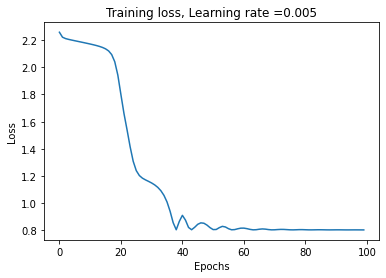

Train cost after epoch 0: 1.981628
Train cost after epoch 10: 1.532613
Train cost after epoch 20: 1.383098
Train cost after epoch 30: 1.335526
Train cost after epoch 40: 1.176184
Train cost after epoch 50: 1.018369
Train cost after epoch 60: 0.972679
Train cost after epoch 70: 0.933620
Train cost after epoch 80: 0.901867
Train cost after epoch 90: 0.876682


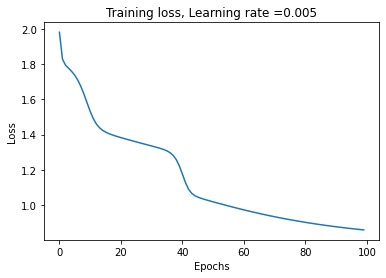

Train cost after epoch 0: 0.918466
Train cost after epoch 10: 0.809240
Train cost after epoch 20: 0.809842
Train cost after epoch 30: 0.806607
Train cost after epoch 40: 0.806364
Train cost after epoch 50: 0.805952
Train cost after epoch 60: 0.805669
Train cost after epoch 70: 0.805394
Train cost after epoch 80: 0.804954
Train cost after epoch 90: 0.804380


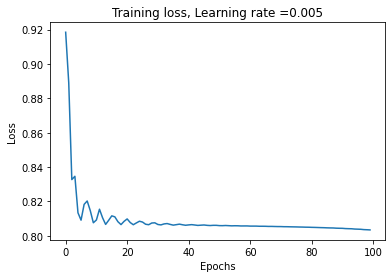

Train cost after epoch 0: 2.452351
Train cost after epoch 10: 2.370198
Train cost after epoch 20: 2.074972
Train cost after epoch 30: 1.820520
Train cost after epoch 40: 1.164044
Train cost after epoch 50: 0.821355
Train cost after epoch 60: 0.809781
Train cost after epoch 70: 0.805782
Train cost after epoch 80: 0.804919
Train cost after epoch 90: 0.804914


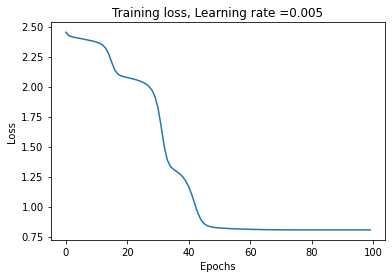

Train cost after epoch 0: 1.785509
Train cost after epoch 10: 1.720206
Train cost after epoch 20: 0.851497
Train cost after epoch 30: 0.860783
Train cost after epoch 40: 0.817463
Train cost after epoch 50: 0.803043
Train cost after epoch 60: 0.803686
Train cost after epoch 70: 0.802278
Train cost after epoch 80: 0.802163
Train cost after epoch 90: 0.801792


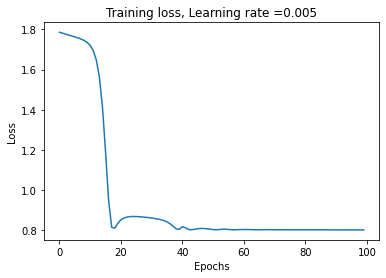

Train cost after epoch 0: 2.375652
Train cost after epoch 10: 1.175627
Train cost after epoch 20: 1.137814
Train cost after epoch 30: 1.102710
Train cost after epoch 40: 1.069350
Train cost after epoch 50: 1.038038
Train cost after epoch 60: 1.008792
Train cost after epoch 70: 0.981682
Train cost after epoch 80: 0.956774
Train cost after epoch 90: 0.934107


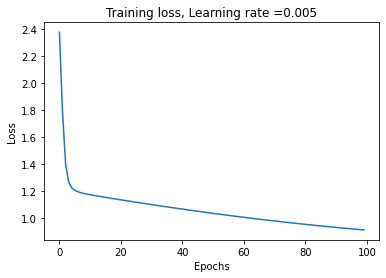

Train cost after epoch 0: 1.786433
Train cost after epoch 10: 0.875938
Train cost after epoch 20: 0.816841
Train cost after epoch 30: 0.806625
Train cost after epoch 40: 0.803853
Train cost after epoch 50: 0.802675
Train cost after epoch 60: 0.801879
Train cost after epoch 70: 0.801557
Train cost after epoch 80: 0.801200
Train cost after epoch 90: 0.800809


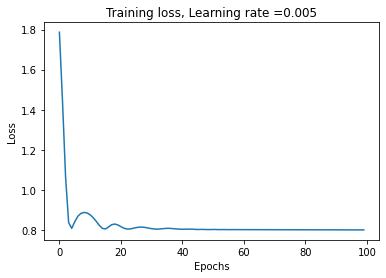

Train cost after epoch 0: 0.921285
Train cost after epoch 10: 0.897345
Train cost after epoch 20: 0.814755
Train cost after epoch 30: 0.812548
Train cost after epoch 40: 0.805658
Train cost after epoch 50: 0.802528
Train cost after epoch 60: 0.801761
Train cost after epoch 70: 0.801030
Train cost after epoch 80: 0.800624
Train cost after epoch 90: 0.799257


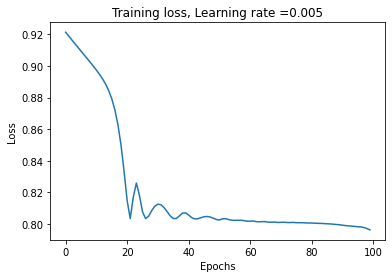

Train cost after epoch 0: 1.084652
Train cost after epoch 10: 1.019422
Train cost after epoch 20: 0.987531
Train cost after epoch 30: 0.893492
Train cost after epoch 40: 0.855745
Train cost after epoch 50: 0.835299
Train cost after epoch 60: 0.821369
Train cost after epoch 70: 0.812972
Train cost after epoch 80: 0.808440
Train cost after epoch 90: 0.806262


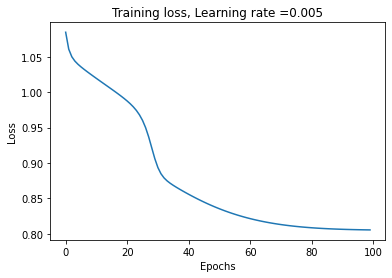

Train cost after epoch 0: 1.946407
Train cost after epoch 10: 1.314693
Train cost after epoch 20: 1.272932
Train cost after epoch 30: 1.224842
Train cost after epoch 40: 1.024779
Train cost after epoch 50: 0.940345
Train cost after epoch 60: 0.902285
Train cost after epoch 70: 0.872961
Train cost after epoch 80: 0.850893
Train cost after epoch 90: 0.834700


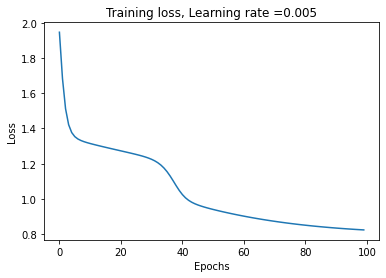

Train cost after epoch 0: 3.217797
Train cost after epoch 10: 2.993003
Train cost after epoch 20: 1.542254
Train cost after epoch 30: 1.403719
Train cost after epoch 40: 1.344140
Train cost after epoch 50: 1.289203
Train cost after epoch 60: 1.237795
Train cost after epoch 70: 1.190324
Train cost after epoch 80: 1.145706
Train cost after epoch 90: 1.089004


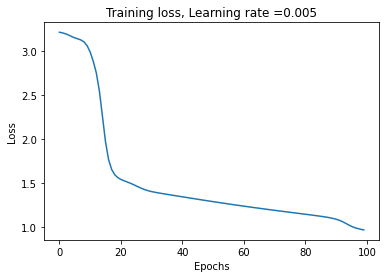

Train cost after epoch 0: 1.924362
Train cost after epoch 10: 1.879062
Train cost after epoch 20: 1.834055
Train cost after epoch 30: 1.788860
Train cost after epoch 40: 1.543924
Train cost after epoch 50: 1.480276
Train cost after epoch 60: 1.417725
Train cost after epoch 70: 1.359032
Train cost after epoch 80: 1.304943
Train cost after epoch 90: 1.255039


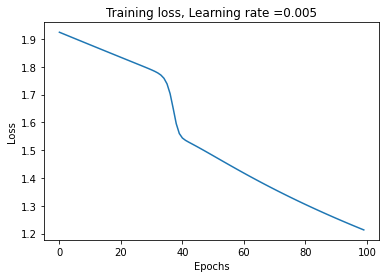

Train cost after epoch 0: 2.696598
Train cost after epoch 10: 2.005991
Train cost after epoch 20: 1.951838
Train cost after epoch 30: 1.710049
Train cost after epoch 40: 0.806234
Train cost after epoch 50: 0.811946
Train cost after epoch 60: 0.805231
Train cost after epoch 70: 0.804879
Train cost after epoch 80: 0.805034
Train cost after epoch 90: 0.804919


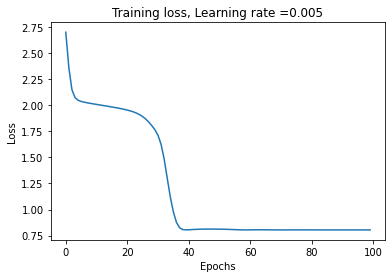

Train cost after epoch 0: 1.534266
Train cost after epoch 10: 1.424941
Train cost after epoch 20: 1.383327
Train cost after epoch 30: 1.297645
Train cost after epoch 40: 0.861259
Train cost after epoch 50: 0.859313
Train cost after epoch 60: 0.838314
Train cost after epoch 70: 0.822847
Train cost after epoch 80: 0.813487
Train cost after epoch 90: 0.808533


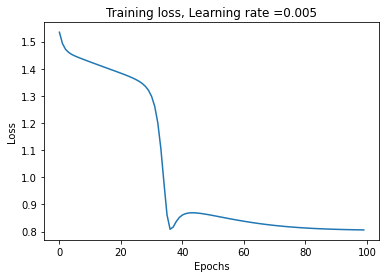

Train cost after epoch 0: 3.032399
Train cost after epoch 10: 2.924474
Train cost after epoch 20: 1.617874
Train cost after epoch 30: 1.567132
Train cost after epoch 40: 1.516332
Train cost after epoch 50: 1.465037
Train cost after epoch 60: 1.334835
Train cost after epoch 70: 0.891288
Train cost after epoch 80: 0.843873
Train cost after epoch 90: 0.823213


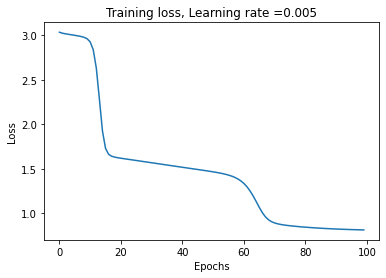

Train cost after epoch 0: 2.351769
Train cost after epoch 10: 1.005440
Train cost after epoch 20: 0.905377
Train cost after epoch 30: 0.882571
Train cost after epoch 40: 0.863241
Train cost after epoch 50: 0.847492
Train cost after epoch 60: 0.835097
Train cost after epoch 70: 0.825666
Train cost after epoch 80: 0.818730
Train cost after epoch 90: 0.813808


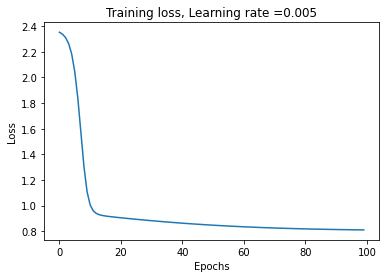

Train cost after epoch 0: 2.722369
Train cost after epoch 10: 2.149746
Train cost after epoch 20: 2.100577
Train cost after epoch 30: 2.050025
Train cost after epoch 40: 1.999498
Train cost after epoch 50: 1.948527
Train cost after epoch 60: 1.867321
Train cost after epoch 70: 1.189336
Train cost after epoch 80: 0.969299
Train cost after epoch 90: 0.915888


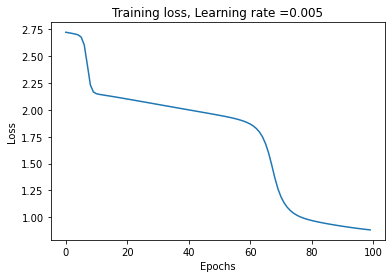

Train cost after epoch 0: 2.387364
Train cost after epoch 10: 2.276295
Train cost after epoch 20: 1.677029
Train cost after epoch 30: 1.593329
Train cost after epoch 40: 1.536851
Train cost after epoch 50: 1.473090
Train cost after epoch 60: 1.406855
Train cost after epoch 70: 1.344618
Train cost after epoch 80: 1.287767
Train cost after epoch 90: 1.235895


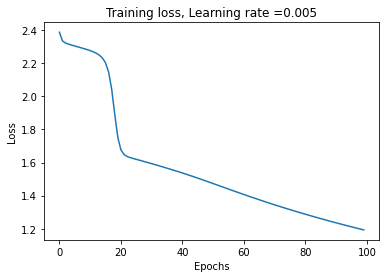

Train cost after epoch 0: 2.121256
Train cost after epoch 10: 1.513964
Train cost after epoch 20: 1.444406
Train cost after epoch 30: 1.385853
Train cost after epoch 40: 1.333907
Train cost after epoch 50: 1.284137
Train cost after epoch 60: 1.179556
Train cost after epoch 70: 1.055990
Train cost after epoch 80: 1.000233
Train cost after epoch 90: 0.953169


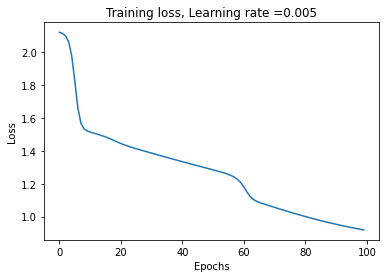

Train cost after epoch 0: 2.399033
Train cost after epoch 10: 2.301157
Train cost after epoch 20: 1.348016
Train cost after epoch 30: 1.281255
Train cost after epoch 40: 1.234426
Train cost after epoch 50: 1.190167
Train cost after epoch 60: 1.148850
Train cost after epoch 70: 1.110419
Train cost after epoch 80: 1.074741
Train cost after epoch 90: 1.041713


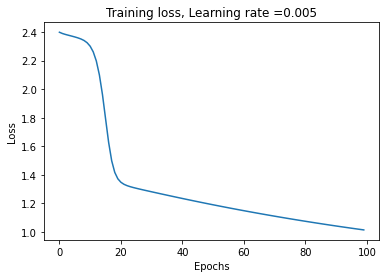

Train cost after epoch 0: 3.022969
Train cost after epoch 10: 1.499725
Train cost after epoch 20: 1.448806
Train cost after epoch 30: 1.401975
Train cost after epoch 40: 1.343531
Train cost after epoch 50: 1.283169
Train cost after epoch 60: 1.226448
Train cost after epoch 70: 1.174819
Train cost after epoch 80: 1.128177
Train cost after epoch 90: 1.086031


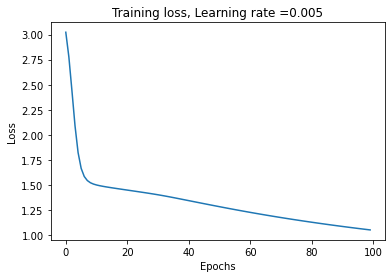

Train cost after epoch 0: 2.032885
Train cost after epoch 10: 1.750444
Train cost after epoch 20: 1.702294
Train cost after epoch 30: 1.025012
Train cost after epoch 40: 0.852899
Train cost after epoch 50: 0.833588
Train cost after epoch 60: 0.820408
Train cost after epoch 70: 0.812471
Train cost after epoch 80: 0.808201
Train cost after epoch 90: 0.806160


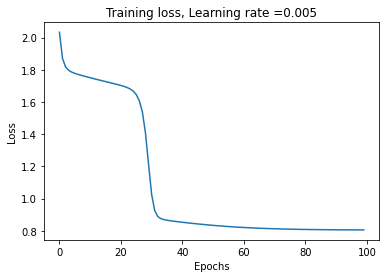

Train cost after epoch 0: 2.396117
Train cost after epoch 10: 1.122398
Train cost after epoch 20: 1.038698
Train cost after epoch 30: 1.003609
Train cost after epoch 40: 0.972288
Train cost after epoch 50: 0.944297
Train cost after epoch 60: 0.919579
Train cost after epoch 70: 0.898022
Train cost after epoch 80: 0.879477
Train cost after epoch 90: 0.863764


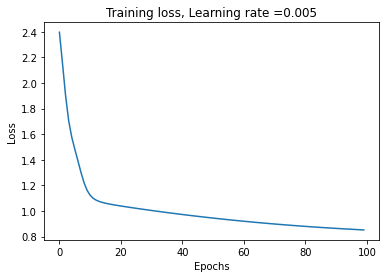

Train cost after epoch 0: 3.277424
Train cost after epoch 10: 2.676698
Train cost after epoch 20: 2.056792
Train cost after epoch 30: 0.999619
Train cost after epoch 40: 0.918703
Train cost after epoch 50: 0.885552
Train cost after epoch 60: 0.861838
Train cost after epoch 70: 0.844168
Train cost after epoch 80: 0.831231
Train cost after epoch 90: 0.822021


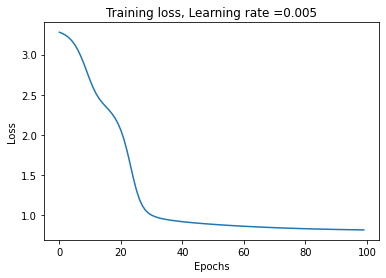

Train cost after epoch 0: 1.880238
Train cost after epoch 10: 1.226904
Train cost after epoch 20: 1.034648
Train cost after epoch 30: 0.959736
Train cost after epoch 40: 0.904607
Train cost after epoch 50: 0.812662
Train cost after epoch 60: 0.805496
Train cost after epoch 70: 0.804970
Train cost after epoch 80: 0.805149
Train cost after epoch 90: 0.804978


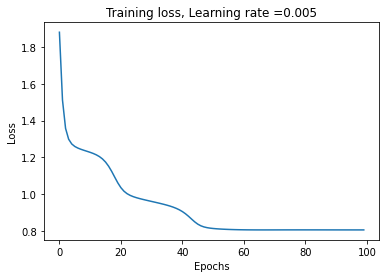

Train cost after epoch 0: 2.359107
Train cost after epoch 10: 2.284643
Train cost after epoch 20: 1.910377
Train cost after epoch 30: 1.823555
Train cost after epoch 40: 1.315184
Train cost after epoch 50: 1.238336
Train cost after epoch 60: 1.181579
Train cost after epoch 70: 1.130325
Train cost after epoch 80: 1.067915
Train cost after epoch 90: 0.926673


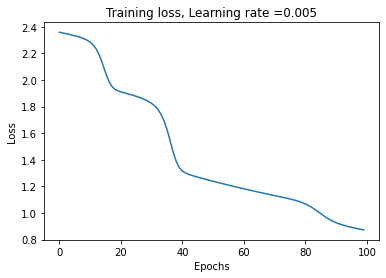

Train cost after epoch 0: 2.229600
Train cost after epoch 10: 1.179064
Train cost after epoch 20: 1.117824
Train cost after epoch 30: 1.081097
Train cost after epoch 40: 1.047336
Train cost after epoch 50: 1.015969
Train cost after epoch 60: 0.986954
Train cost after epoch 70: 0.960505
Train cost after epoch 80: 0.936405
Train cost after epoch 90: 0.891999


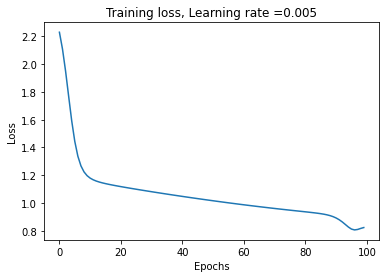

Train cost after epoch 0: 2.107624
Train cost after epoch 10: 1.977673
Train cost after epoch 20: 1.803648
Train cost after epoch 30: 1.132996
Train cost after epoch 40: 1.081168
Train cost after epoch 50: 1.029027
Train cost after epoch 60: 0.953060
Train cost after epoch 70: 0.887061
Train cost after epoch 80: 0.850889
Train cost after epoch 90: 0.829625


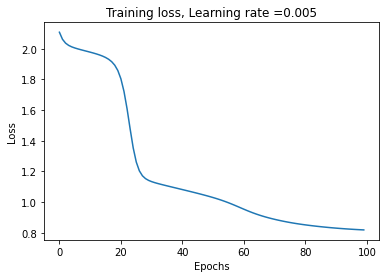

__________________________________________________ 0.2% GA is running...Train cost after epoch 0: 1.796248
Train cost after epoch 10: 1.613212
Train cost after epoch 20: 1.100417
Train cost after epoch 30: 1.061113
Train cost after epoch 40: 1.024479
Train cost after epoch 50: 0.991081
Train cost after epoch 60: 0.961167
Train cost after epoch 70: 0.934661
Train cost after epoch 80: 0.911415
Train cost after epoch 90: 0.891261


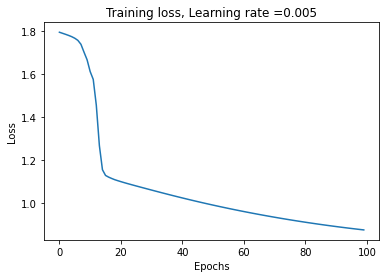

Train cost after epoch 0: 2.665177
Train cost after epoch 10: 2.463802
Train cost after epoch 20: 2.181336
Train cost after epoch 30: 1.746833
Train cost after epoch 40: 1.447202
Train cost after epoch 50: 1.375010
Train cost after epoch 60: 1.274180
Train cost after epoch 70: 1.073949
Train cost after epoch 80: 0.872730
Train cost after epoch 90: 0.836950


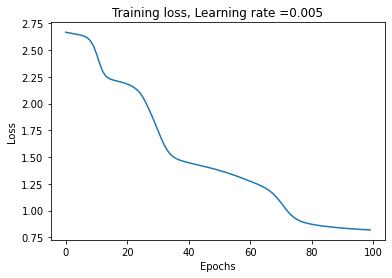

Train cost after epoch 0: 1.513234
Train cost after epoch 10: 1.467486
Train cost after epoch 20: 1.387544
Train cost after epoch 30: 1.115477
Train cost after epoch 40: 1.067245
Train cost after epoch 50: 0.978534
Train cost after epoch 60: 0.927923
Train cost after epoch 70: 0.890430
Train cost after epoch 80: 0.862050
Train cost after epoch 90: 0.841752


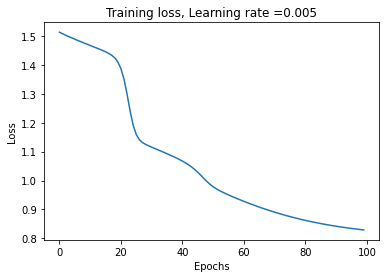

Train cost after epoch 0: 2.728072
Train cost after epoch 10: 2.215731
Train cost after epoch 20: 2.118104
Train cost after epoch 30: 2.007186
Train cost after epoch 40: 1.387481
Train cost after epoch 50: 1.035970
Train cost after epoch 60: 0.933936
Train cost after epoch 70: 0.895106
Train cost after epoch 80: 0.865643
Train cost after epoch 90: 0.844414


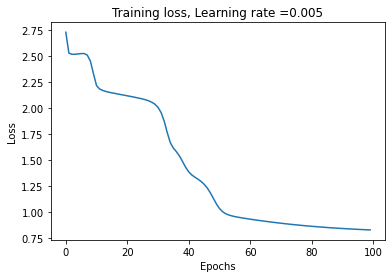

Train cost after epoch 0: 2.538963
Train cost after epoch 10: 2.358450
Train cost after epoch 20: 1.850479
Train cost after epoch 30: 1.554713
Train cost after epoch 40: 1.401757
Train cost after epoch 50: 0.805974
Train cost after epoch 60: 0.822725
Train cost after epoch 70: 0.813912
Train cost after epoch 80: 0.807498
Train cost after epoch 90: 0.805176


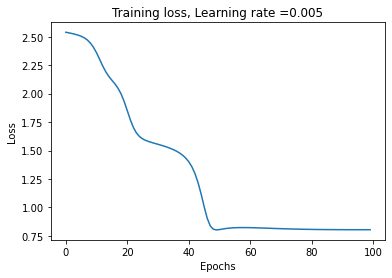

Train cost after epoch 0: 3.540975
Train cost after epoch 10: 2.245384
Train cost after epoch 20: 1.894620
Train cost after epoch 30: 1.753114
Train cost after epoch 40: 1.559459
Train cost after epoch 50: 1.161525
Train cost after epoch 60: 1.038091
Train cost after epoch 70: 0.981081
Train cost after epoch 80: 0.937281
Train cost after epoch 90: 0.902947


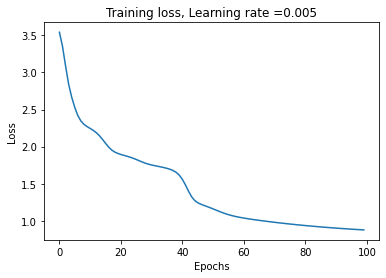

Train cost after epoch 0: 2.215579
Train cost after epoch 10: 2.127303
Train cost after epoch 20: 1.346986
Train cost after epoch 30: 1.265131
Train cost after epoch 40: 1.216642
Train cost after epoch 50: 1.171242
Train cost after epoch 60: 1.129218
Train cost after epoch 70: 1.090498
Train cost after epoch 80: 1.054894
Train cost after epoch 90: 1.022246


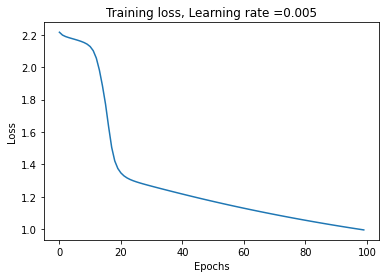

Train cost after epoch 0: 1.101089
Train cost after epoch 10: 1.035054
Train cost after epoch 20: 1.004310
Train cost after epoch 30: 0.975887
Train cost after epoch 40: 0.949758
Train cost after epoch 50: 0.926041
Train cost after epoch 60: 0.904851
Train cost after epoch 70: 0.886200
Train cost after epoch 80: 0.870048
Train cost after epoch 90: 0.856295


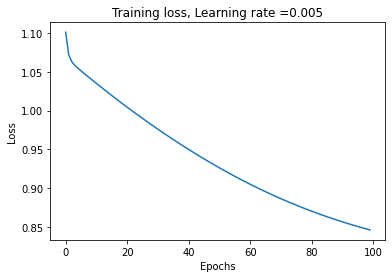

Train cost after epoch 0: 2.515211
Train cost after epoch 10: 2.177117
Train cost after epoch 20: 2.094642
Train cost after epoch 30: 1.145942
Train cost after epoch 40: 0.805164
Train cost after epoch 50: 0.805766
Train cost after epoch 60: 0.805259
Train cost after epoch 70: 0.804921
Train cost after epoch 80: 0.804897
Train cost after epoch 90: 0.804907


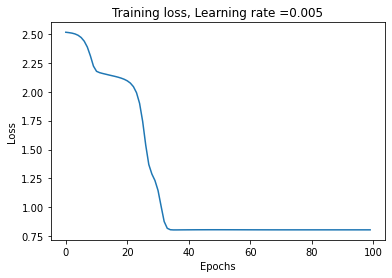

Train cost after epoch 0: 1.232589
Train cost after epoch 10: 1.094137
Train cost after epoch 20: 1.059842
Train cost after epoch 30: 1.024707
Train cost after epoch 40: 0.954517
Train cost after epoch 50: 0.882207
Train cost after epoch 60: 0.851665
Train cost after epoch 70: 0.831249
Train cost after epoch 80: 0.818447
Train cost after epoch 90: 0.811120


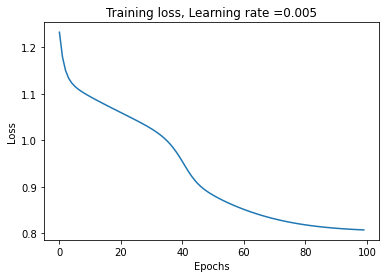

Train cost after epoch 0: 2.502927
Train cost after epoch 10: 1.351812
Train cost after epoch 20: 1.300955
Train cost after epoch 30: 0.987932
Train cost after epoch 40: 0.840794
Train cost after epoch 50: 0.822820
Train cost after epoch 60: 0.812266
Train cost after epoch 70: 0.807148
Train cost after epoch 80: 0.805196
Train cost after epoch 90: 0.804621


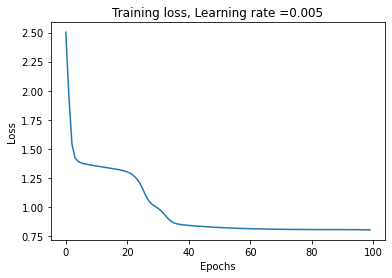

Train cost after epoch 0: 1.095057
Train cost after epoch 10: 1.060619
Train cost after epoch 20: 1.028923
Train cost after epoch 30: 0.999181
Train cost after epoch 40: 0.971557
Train cost after epoch 50: 0.946208
Train cost after epoch 60: 0.923231
Train cost after epoch 70: 0.902720
Train cost after epoch 80: 0.884638
Train cost after epoch 90: 0.868947


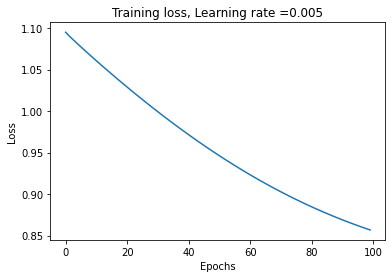

Train cost after epoch 0: 2.364384
Train cost after epoch 10: 1.341772
Train cost after epoch 20: 1.279670
Train cost after epoch 30: 1.229673
Train cost after epoch 40: 1.092876
Train cost after epoch 50: 1.036744
Train cost after epoch 60: 0.991211
Train cost after epoch 70: 0.952311
Train cost after epoch 80: 0.919973
Train cost after epoch 90: 0.893484


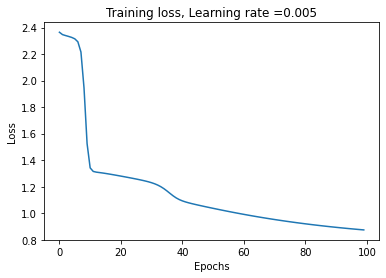

Train cost after epoch 0: 4.055138
Train cost after epoch 10: 2.260602
Train cost after epoch 20: 2.090455
Train cost after epoch 30: 1.709786
Train cost after epoch 40: 1.647277
Train cost after epoch 50: 1.589663
Train cost after epoch 60: 1.535001
Train cost after epoch 70: 1.483268
Train cost after epoch 80: 1.434135
Train cost after epoch 90: 1.387283


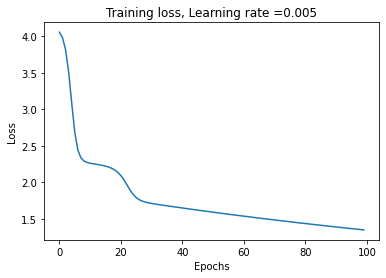

Train cost after epoch 0: 3.638106
Train cost after epoch 10: 2.642310
Train cost after epoch 20: 2.566060
Train cost after epoch 30: 2.486503
Train cost after epoch 40: 2.352710
Train cost after epoch 50: 1.532231
Train cost after epoch 60: 0.947053
Train cost after epoch 70: 0.900322
Train cost after epoch 80: 0.869317
Train cost after epoch 90: 0.847192


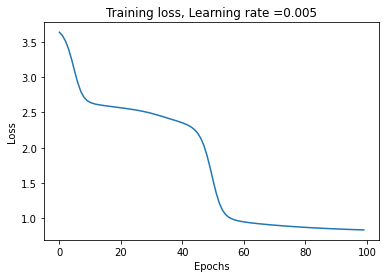

Train cost after epoch 0: 1.932547
Train cost after epoch 10: 1.545546
Train cost after epoch 20: 1.502048
Train cost after epoch 30: 1.459477
Train cost after epoch 40: 1.417774
Train cost after epoch 50: 1.375055
Train cost after epoch 60: 1.030385
Train cost after epoch 70: 0.938950
Train cost after epoch 80: 0.897626
Train cost after epoch 90: 0.866296


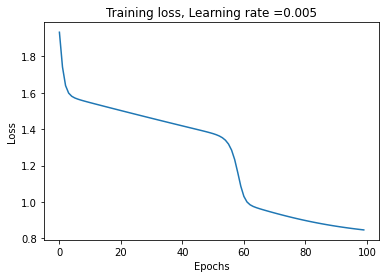

Train cost after epoch 0: 3.045827
Train cost after epoch 10: 2.421501
Train cost after epoch 20: 2.270953
Train cost after epoch 30: 1.756547
Train cost after epoch 40: 1.447902
Train cost after epoch 50: 1.344745
Train cost after epoch 60: 1.189998
Train cost after epoch 70: 1.120236
Train cost after epoch 80: 1.062698
Train cost after epoch 90: 1.013888


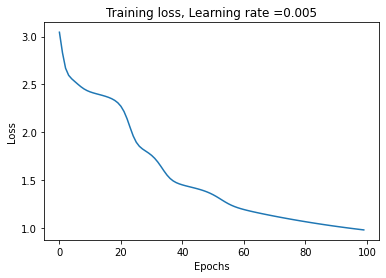

Train cost after epoch 0: 1.998582
Train cost after epoch 10: 1.132463
Train cost after epoch 20: 0.846369
Train cost after epoch 30: 0.822782
Train cost after epoch 40: 0.811142
Train cost after epoch 50: 0.808081
Train cost after epoch 60: 0.807403
Train cost after epoch 70: 0.807199
Train cost after epoch 80: 0.806937
Train cost after epoch 90: 0.806412


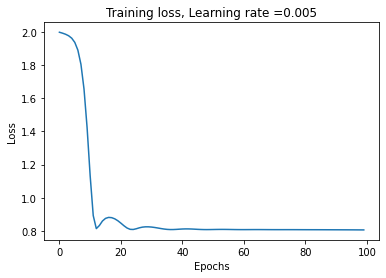

Train cost after epoch 0: 2.515264
Train cost after epoch 10: 2.515039
Train cost after epoch 20: 2.510943
Train cost after epoch 30: 1.980198
Train cost after epoch 40: 1.319823
Train cost after epoch 50: 1.264525
Train cost after epoch 60: 1.212029
Train cost after epoch 70: 1.163952
Train cost after epoch 80: 1.120174
Train cost after epoch 90: 1.080309


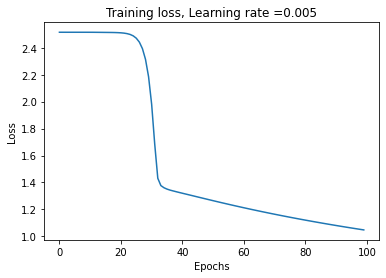

Train cost after epoch 0: 2.486171
Train cost after epoch 10: 0.809942
Train cost after epoch 20: 0.896407
Train cost after epoch 30: 0.821169
Train cost after epoch 40: 0.810774
Train cost after epoch 50: 0.803675
Train cost after epoch 60: 0.802905
Train cost after epoch 70: 0.803166
Train cost after epoch 80: 0.802923
Train cost after epoch 90: 0.802798


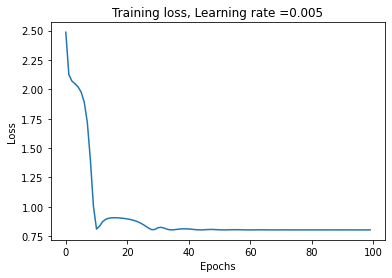

Train cost after epoch 0: 3.331654
Train cost after epoch 10: 2.823282
Train cost after epoch 20: 2.771771
Train cost after epoch 30: 2.577821
Train cost after epoch 40: 1.969832
Train cost after epoch 50: 1.903136
Train cost after epoch 60: 1.838341
Train cost after epoch 70: 1.777034
Train cost after epoch 80: 1.719143
Train cost after epoch 90: 1.664151


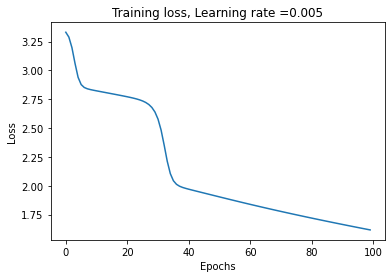

Train cost after epoch 0: 2.514577
Train cost after epoch 10: 2.500303
Train cost after epoch 20: 1.528874
Train cost after epoch 30: 1.071242
Train cost after epoch 40: 1.029451
Train cost after epoch 50: 0.991599
Train cost after epoch 60: 0.958326
Train cost after epoch 70: 0.929549
Train cost after epoch 80: 0.904932
Train cost after epoch 90: 0.884115


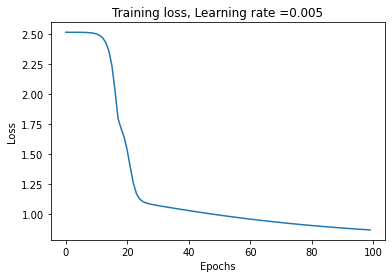

Train cost after epoch 0: 3.255245
Train cost after epoch 10: 1.697730
Train cost after epoch 20: 0.935840
Train cost after epoch 30: 0.902738
Train cost after epoch 40: 0.874830
Train cost after epoch 50: 0.852222
Train cost after epoch 60: 0.835095
Train cost after epoch 70: 0.823013
Train cost after epoch 80: 0.815069
Train cost after epoch 90: 0.810200


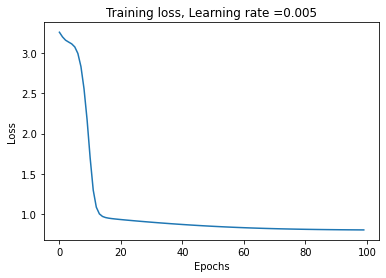

Train cost after epoch 0: 3.099113
Train cost after epoch 10: 2.045029
Train cost after epoch 20: 1.743483
Train cost after epoch 30: 1.674542
Train cost after epoch 40: 1.370234
Train cost after epoch 50: 0.880427
Train cost after epoch 60: 0.826030
Train cost after epoch 70: 0.813136
Train cost after epoch 80: 0.807505
Train cost after epoch 90: 0.805467


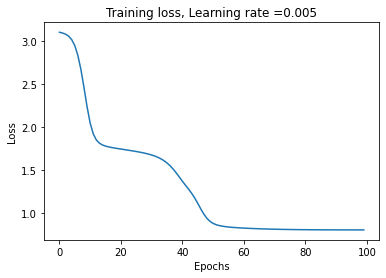

Train cost after epoch 0: 2.648806
Train cost after epoch 10: 1.955060
Train cost after epoch 20: 1.901870
Train cost after epoch 30: 1.817763
Train cost after epoch 40: 1.754104
Train cost after epoch 50: 1.692808
Train cost after epoch 60: 1.634394
Train cost after epoch 70: 1.579215
Train cost after epoch 80: 1.526918
Train cost after epoch 90: 1.477089


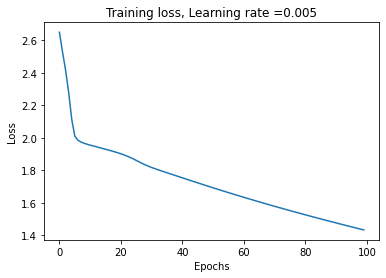

Train cost after epoch 0: 3.060507
Train cost after epoch 10: 1.310598
Train cost after epoch 20: 1.159095
Train cost after epoch 30: 1.120146
Train cost after epoch 40: 1.083249
Train cost after epoch 50: 1.048844
Train cost after epoch 60: 1.017059
Train cost after epoch 70: 0.987895
Train cost after epoch 80: 0.961331
Train cost after epoch 90: 0.937346


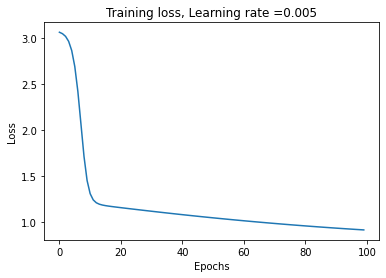

Train cost after epoch 0: 2.562553
Train cost after epoch 10: 1.269014
Train cost after epoch 20: 1.220436
Train cost after epoch 30: 1.180246
Train cost after epoch 40: 1.141764
Train cost after epoch 50: 1.105413
Train cost after epoch 60: 1.071297
Train cost after epoch 70: 1.039446
Train cost after epoch 80: 1.009879
Train cost after epoch 90: 0.982618


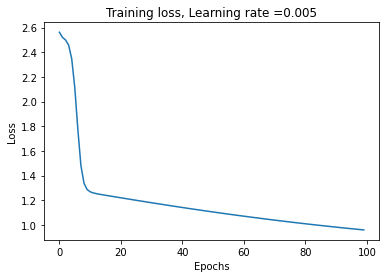

Train cost after epoch 0: 1.790554
Train cost after epoch 10: 1.745862
Train cost after epoch 20: 1.676390
Train cost after epoch 30: 1.019465
Train cost after epoch 40: 0.980805
Train cost after epoch 50: 0.945378
Train cost after epoch 60: 0.915014
Train cost after epoch 70: 0.889792
Train cost after epoch 80: 0.869244
Train cost after epoch 90: 0.852799


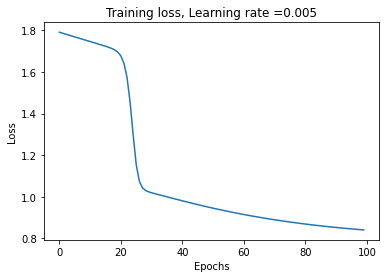

Train cost after epoch 0: 1.615537
Train cost after epoch 10: 1.505688
Train cost after epoch 20: 0.918766
Train cost after epoch 30: 0.890699
Train cost after epoch 40: 0.867662
Train cost after epoch 50: 0.848833
Train cost after epoch 60: 0.834351
Train cost after epoch 70: 0.823750
Train cost after epoch 80: 0.816214
Train cost after epoch 90: 0.810943


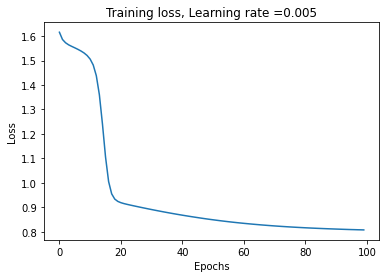

Train cost after epoch 0: 4.107771
Train cost after epoch 10: 1.946854
Train cost after epoch 20: 0.875649
Train cost after epoch 30: 0.855449
Train cost after epoch 40: 0.839695
Train cost after epoch 50: 0.827739
Train cost after epoch 60: 0.819228
Train cost after epoch 70: 0.813458
Train cost after epoch 80: 0.809611
Train cost after epoch 90: 0.805735


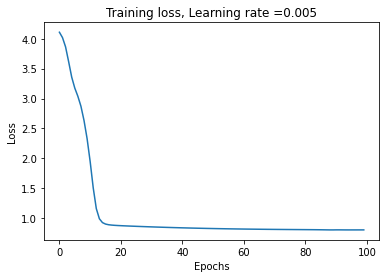

Train cost after epoch 0: 2.217007
Train cost after epoch 10: 1.865588
Train cost after epoch 20: 1.815263
Train cost after epoch 30: 1.766767
Train cost after epoch 40: 1.718945
Train cost after epoch 50: 1.672152
Train cost after epoch 60: 1.626400
Train cost after epoch 70: 1.581638
Train cost after epoch 80: 1.537825
Train cost after epoch 90: 1.494939


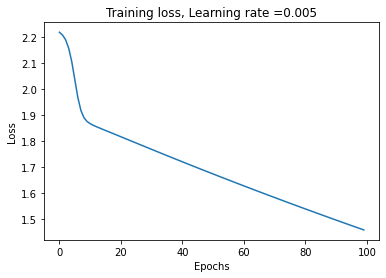

Train cost after epoch 0: 4.268857
Train cost after epoch 10: 3.572976
Train cost after epoch 20: 3.383564
Train cost after epoch 30: 2.152896
Train cost after epoch 40: 1.959396
Train cost after epoch 50: 1.862154
Train cost after epoch 60: 1.775074
Train cost after epoch 70: 1.698471
Train cost after epoch 80: 1.628953
Train cost after epoch 90: 1.564839


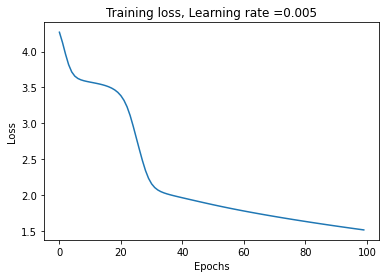

Train cost after epoch 0: 2.116983
Train cost after epoch 10: 1.783512
Train cost after epoch 20: 1.695430
Train cost after epoch 30: 1.571826
Train cost after epoch 40: 1.314274
Train cost after epoch 50: 1.085976
Train cost after epoch 60: 0.819738
Train cost after epoch 70: 0.806745
Train cost after epoch 80: 0.805022
Train cost after epoch 90: 0.805172


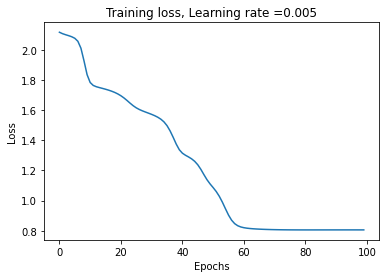

Train cost after epoch 0: 2.517877
Train cost after epoch 10: 1.979469
Train cost after epoch 20: 1.917278
Train cost after epoch 30: 1.825796
Train cost after epoch 40: 0.988240
Train cost after epoch 50: 0.940251
Train cost after epoch 60: 0.905531
Train cost after epoch 70: 0.877707
Train cost after epoch 80: 0.856298
Train cost after epoch 90: 0.840294


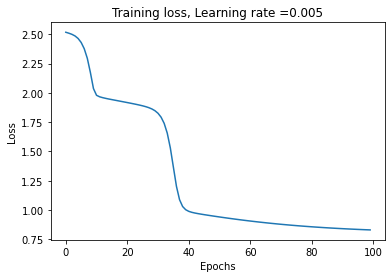

Train cost after epoch 0: 3.763606
Train cost after epoch 10: 2.440671
Train cost after epoch 20: 2.386284
Train cost after epoch 30: 2.146752
Train cost after epoch 40: 1.252182
Train cost after epoch 50: 1.098904
Train cost after epoch 60: 0.949803
Train cost after epoch 70: 0.829556
Train cost after epoch 80: 0.823244
Train cost after epoch 90: 0.815476


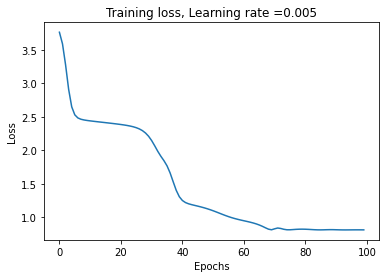

Train cost after epoch 0: 2.482263
Train cost after epoch 10: 2.435010
Train cost after epoch 20: 2.387900
Train cost after epoch 30: 2.340906
Train cost after epoch 40: 2.274858
Train cost after epoch 50: 1.488370
Train cost after epoch 60: 1.404927
Train cost after epoch 70: 1.335006
Train cost after epoch 80: 1.201838
Train cost after epoch 90: 0.961577


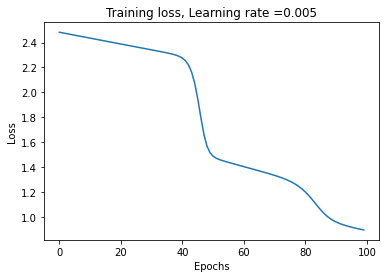

Train cost after epoch 0: 3.178684
Train cost after epoch 10: 0.830199
Train cost after epoch 20: 0.820391
Train cost after epoch 30: 0.813975
Train cost after epoch 40: 0.809530
Train cost after epoch 50: 0.806275
Train cost after epoch 60: 0.803884
Train cost after epoch 70: 0.802695
Train cost after epoch 80: 0.801936
Train cost after epoch 90: 0.801350


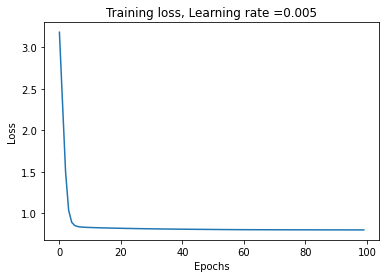

Train cost after epoch 0: 3.590092
Train cost after epoch 10: 3.514874
Train cost after epoch 20: 2.852586
Train cost after epoch 30: 0.947328
Train cost after epoch 40: 0.911349
Train cost after epoch 50: 0.883109
Train cost after epoch 60: 0.860664
Train cost after epoch 70: 0.843521
Train cost after epoch 80: 0.830862
Train cost after epoch 90: 0.821816


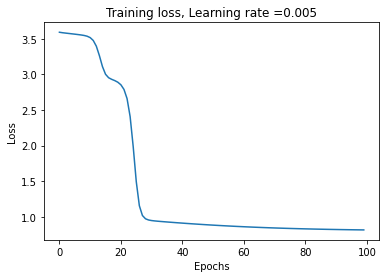

Train cost after epoch 0: 2.518433
Train cost after epoch 10: 2.514100
Train cost after epoch 20: 2.278560
Train cost after epoch 30: 1.487226
Train cost after epoch 40: 1.433517
Train cost after epoch 50: 1.380770
Train cost after epoch 60: 1.330891
Train cost after epoch 70: 1.283679
Train cost after epoch 80: 1.239610
Train cost after epoch 90: 1.198106


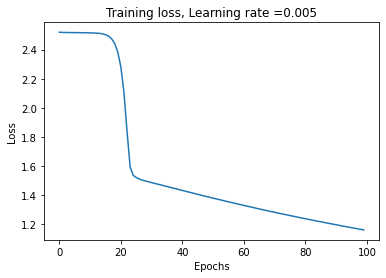

Train cost after epoch 0: 3.262818
Train cost after epoch 10: 3.146210
Train cost after epoch 20: 1.812245
Train cost after epoch 30: 1.749361
Train cost after epoch 40: 1.694689
Train cost after epoch 50: 1.615003
Train cost after epoch 60: 0.844590
Train cost after epoch 70: 0.910947
Train cost after epoch 80: 0.877826
Train cost after epoch 90: 0.849959


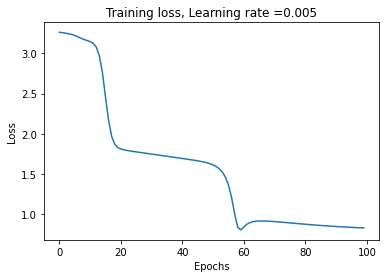

Train cost after epoch 0: 3.356007
Train cost after epoch 10: 3.224569
Train cost after epoch 20: 2.121290
Train cost after epoch 30: 1.986649
Train cost after epoch 40: 1.134447
Train cost after epoch 50: 0.816740
Train cost after epoch 60: 0.821680
Train cost after epoch 70: 0.811234
Train cost after epoch 80: 0.805339
Train cost after epoch 90: 0.805048


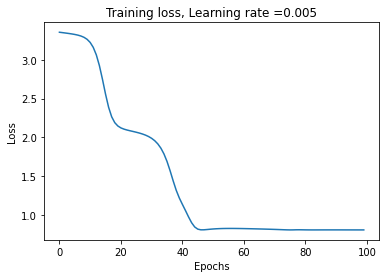

Train cost after epoch 0: 2.276227
Train cost after epoch 10: 2.053011
Train cost after epoch 20: 2.006143
Train cost after epoch 30: 1.960249
Train cost after epoch 40: 1.914582
Train cost after epoch 50: 1.838943
Train cost after epoch 60: 1.501494
Train cost after epoch 70: 1.423996
Train cost after epoch 80: 1.353230
Train cost after epoch 90: 1.256877


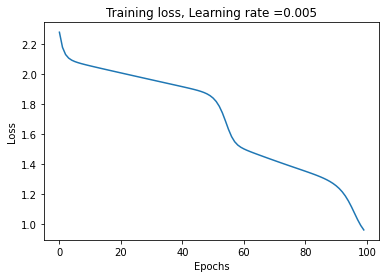

Train cost after epoch 0: 2.592118
Train cost after epoch 10: 1.895320
Train cost after epoch 20: 1.801720
Train cost after epoch 30: 1.142535
Train cost after epoch 40: 1.040658
Train cost after epoch 50: 0.998259
Train cost after epoch 60: 0.961562
Train cost after epoch 70: 0.930143
Train cost after epoch 80: 0.903708
Train cost after epoch 90: 0.881713


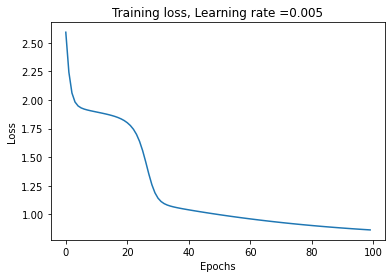

Train cost after epoch 0: 3.053596
Train cost after epoch 10: 1.448004
Train cost after epoch 20: 1.258962
Train cost after epoch 30: 0.914609
Train cost after epoch 40: 0.878536
Train cost after epoch 50: 0.855394
Train cost after epoch 60: 0.838191
Train cost after epoch 70: 0.826009
Train cost after epoch 80: 0.817748
Train cost after epoch 90: 0.812379


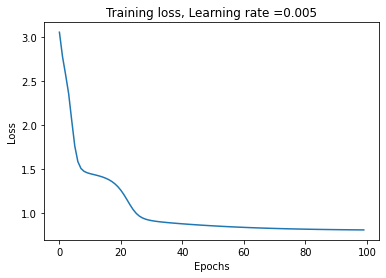

Train cost after epoch 0: 2.239671
Train cost after epoch 10: 1.446938
Train cost after epoch 20: 1.404431
Train cost after epoch 30: 1.360591
Train cost after epoch 40: 1.246887
Train cost after epoch 50: 0.957568
Train cost after epoch 60: 0.907535
Train cost after epoch 70: 0.874925
Train cost after epoch 80: 0.851039
Train cost after epoch 90: 0.834248


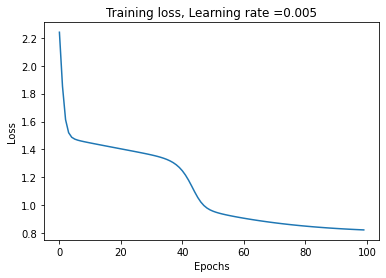

Train cost after epoch 0: 3.318901
Train cost after epoch 10: 2.564453
Train cost after epoch 20: 2.417646
Train cost after epoch 30: 2.051977
Train cost after epoch 40: 1.568490
Train cost after epoch 50: 1.250518
Train cost after epoch 60: 1.182999
Train cost after epoch 70: 1.127048
Train cost after epoch 80: 1.077935
Train cost after epoch 90: 1.034906


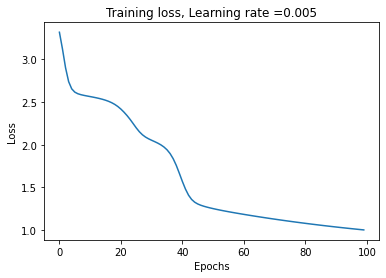

Train cost after epoch 0: 2.288199
Train cost after epoch 10: 2.033466
Train cost after epoch 20: 1.501254
Train cost after epoch 30: 1.384360
Train cost after epoch 40: 1.332861
Train cost after epoch 50: 1.283832
Train cost after epoch 60: 1.237855
Train cost after epoch 70: 1.194869
Train cost after epoch 80: 1.154662
Train cost after epoch 90: 1.117063


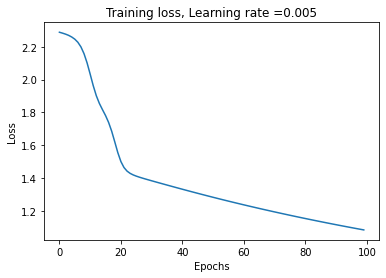

Train cost after epoch 0: 2.079236
Train cost after epoch 10: 2.020429
Train cost after epoch 20: 1.974621
Train cost after epoch 30: 1.929105
Train cost after epoch 40: 1.883912
Train cost after epoch 50: 1.839075
Train cost after epoch 60: 1.794622
Train cost after epoch 70: 1.750585
Train cost after epoch 80: 1.706994
Train cost after epoch 90: 1.663883


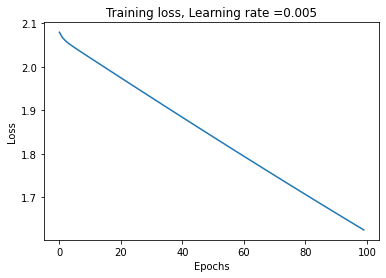

Train cost after epoch 0: 3.667187
Train cost after epoch 10: 1.712927
Train cost after epoch 20: 1.662688
Train cost after epoch 30: 1.533524
Train cost after epoch 40: 0.982260
Train cost after epoch 50: 0.919259
Train cost after epoch 60: 0.886516
Train cost after epoch 70: 0.861664
Train cost after epoch 80: 0.843272
Train cost after epoch 90: 0.830080


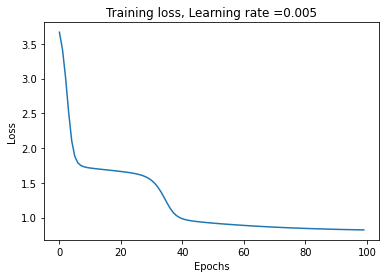

Train cost after epoch 0: 1.134729
Train cost after epoch 10: 0.825414
Train cost after epoch 20: 0.815412
Train cost after epoch 30: 0.809238
Train cost after epoch 40: 0.805133
Train cost after epoch 50: 0.803342
Train cost after epoch 60: 0.802558
Train cost after epoch 70: 0.802296
Train cost after epoch 80: 0.802235
Train cost after epoch 90: 0.802231


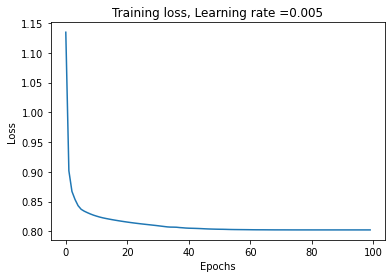

Train cost after epoch 0: 2.430072
Train cost after epoch 10: 2.117819
Train cost after epoch 20: 1.705035
Train cost after epoch 30: 1.410407
Train cost after epoch 40: 0.829510
Train cost after epoch 50: 0.812617
Train cost after epoch 60: 0.806956
Train cost after epoch 70: 0.805167
Train cost after epoch 80: 0.804897
Train cost after epoch 90: 0.804928


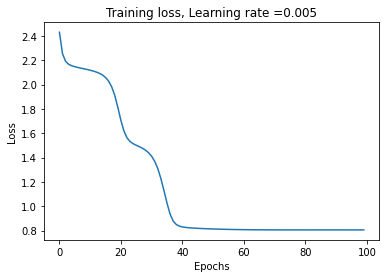

Train cost after epoch 0: 1.163194
Train cost after epoch 10: 1.126484
Train cost after epoch 20: 1.092259
Train cost after epoch 30: 1.059660
Train cost after epoch 40: 1.028868
Train cost after epoch 50: 1.000050
Train cost after epoch 60: 0.973303
Train cost after epoch 70: 0.948771
Train cost after epoch 80: 0.926401
Train cost after epoch 90: 0.906382


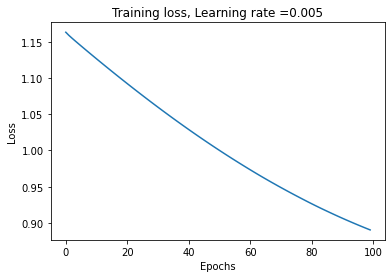

Train cost after epoch 0: 2.883604
Train cost after epoch 10: 0.823088
Train cost after epoch 20: 0.803203
Train cost after epoch 30: 0.800342
Train cost after epoch 40: 0.799516
Train cost after epoch 50: 0.799157
Train cost after epoch 60: 0.798934
Train cost after epoch 70: 0.798472
Train cost after epoch 80: 0.797983
Train cost after epoch 90: 0.797657


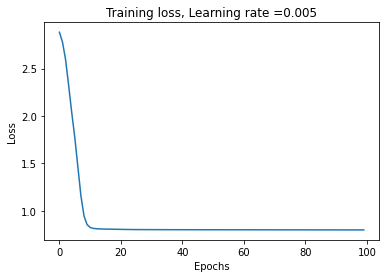

Train cost after epoch 0: 2.208325
Train cost after epoch 10: 0.936100
Train cost after epoch 20: 0.854070
Train cost after epoch 30: 0.811382
Train cost after epoch 40: 0.806153
Train cost after epoch 50: 0.804919
Train cost after epoch 60: 0.804968
Train cost after epoch 70: 0.804986
Train cost after epoch 80: 0.804919
Train cost after epoch 90: 0.804894


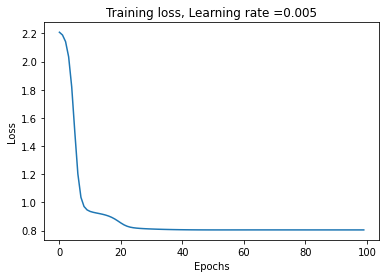

Train cost after epoch 0: 1.916120
Train cost after epoch 10: 1.836225
Train cost after epoch 20: 1.673448
Train cost after epoch 30: 0.821409
Train cost after epoch 40: 0.833028
Train cost after epoch 50: 0.820822
Train cost after epoch 60: 0.811829
Train cost after epoch 70: 0.807175
Train cost after epoch 80: 0.805356
Train cost after epoch 90: 0.804858


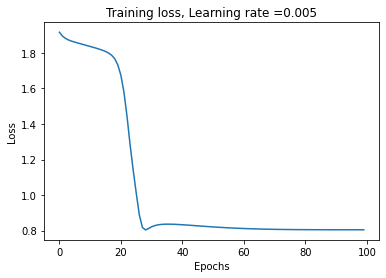

Train cost after epoch 0: 3.270618
Train cost after epoch 10: 2.040701
Train cost after epoch 20: 1.955727
Train cost after epoch 30: 1.419040
Train cost after epoch 40: 1.305864
Train cost after epoch 50: 1.133472
Train cost after epoch 60: 1.072174
Train cost after epoch 70: 1.022102
Train cost after epoch 80: 0.979663
Train cost after epoch 90: 0.944089


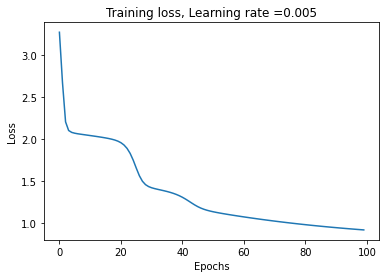

Train cost after epoch 0: 2.551903
Train cost after epoch 10: 2.038378
Train cost after epoch 20: 1.871428
Train cost after epoch 30: 1.809227
Train cost after epoch 40: 1.285259
Train cost after epoch 50: 1.157503
Train cost after epoch 60: 1.103969
Train cost after epoch 70: 1.055972
Train cost after epoch 80: 1.014049
Train cost after epoch 90: 0.977719


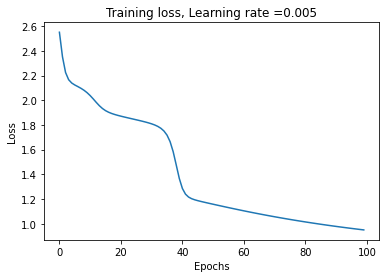

Train cost after epoch 0: 3.667102
Train cost after epoch 10: 1.226999
Train cost after epoch 20: 1.185876
Train cost after epoch 30: 1.072063
Train cost after epoch 40: 0.833508
Train cost after epoch 50: 0.812882
Train cost after epoch 60: 0.806796
Train cost after epoch 70: 0.805069
Train cost after epoch 80: 0.804877
Train cost after epoch 90: 0.804922


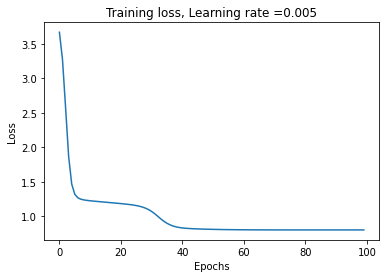

Train cost after epoch 0: 2.238081
Train cost after epoch 10: 1.757334
Train cost after epoch 20: 1.708898
Train cost after epoch 30: 1.661173
Train cost after epoch 40: 1.614107
Train cost after epoch 50: 1.568167
Train cost after epoch 60: 1.523395
Train cost after epoch 70: 1.479753
Train cost after epoch 80: 1.437207
Train cost after epoch 90: 1.395746


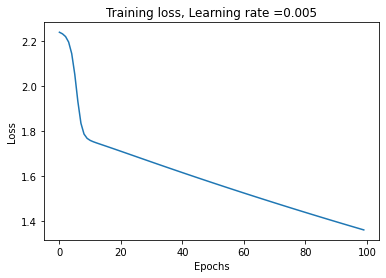

Train cost after epoch 0: 3.594772
Train cost after epoch 10: 3.474823
Train cost after epoch 20: 3.424770
Train cost after epoch 30: 3.288857
Train cost after epoch 40: 1.716390
Train cost after epoch 50: 1.521097
Train cost after epoch 60: 1.407990
Train cost after epoch 70: 1.312888
Train cost after epoch 80: 1.239515
Train cost after epoch 90: 1.174967


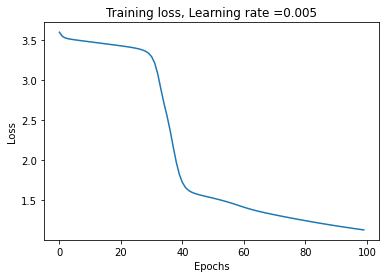

Train cost after epoch 0: 3.000055
Train cost after epoch 10: 2.899653
Train cost after epoch 20: 1.498412
Train cost after epoch 30: 1.431322
Train cost after epoch 40: 1.369901
Train cost after epoch 50: 0.829553
Train cost after epoch 60: 0.805285
Train cost after epoch 70: 0.804824
Train cost after epoch 80: 0.804644
Train cost after epoch 90: 0.804194


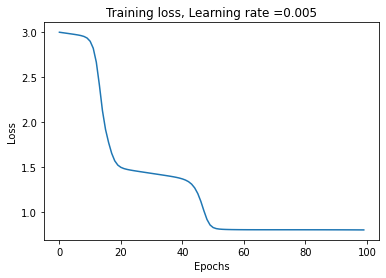

Train cost after epoch 0: 2.239058
Train cost after epoch 10: 2.092879
Train cost after epoch 20: 1.681377
Train cost after epoch 30: 1.630945
Train cost after epoch 40: 1.570567
Train cost after epoch 50: 0.944807
Train cost after epoch 60: 0.890465
Train cost after epoch 70: 0.860294
Train cost after epoch 80: 0.838730
Train cost after epoch 90: 0.824480


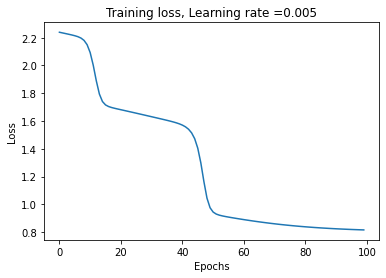

Train cost after epoch 0: 2.873479
Train cost after epoch 10: 2.691158
Train cost after epoch 20: 1.782194
Train cost after epoch 30: 1.435267
Train cost after epoch 40: 0.837354
Train cost after epoch 50: 0.805840
Train cost after epoch 60: 0.805362
Train cost after epoch 70: 0.805555
Train cost after epoch 80: 0.804988
Train cost after epoch 90: 0.804875


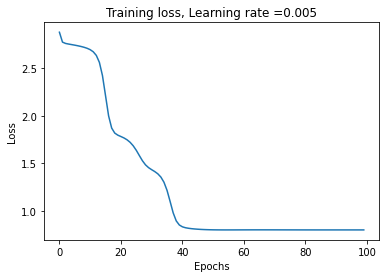

Train cost after epoch 0: 1.339640
Train cost after epoch 10: 0.948762
Train cost after epoch 20: 0.922706
Train cost after epoch 30: 0.899617
Train cost after epoch 40: 0.879591
Train cost after epoch 50: 0.862552
Train cost after epoch 60: 0.848385
Train cost after epoch 70: 0.836936
Train cost after epoch 80: 0.827918
Train cost after epoch 90: 0.821009


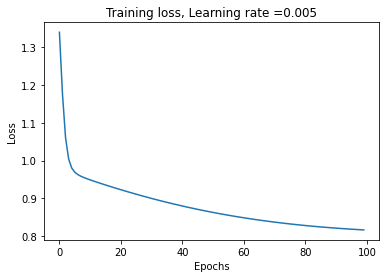

Train cost after epoch 0: 1.119699
Train cost after epoch 10: 1.082234
Train cost after epoch 20: 1.048300
Train cost after epoch 30: 0.990117
Train cost after epoch 40: 0.813694
Train cost after epoch 50: 0.806546
Train cost after epoch 60: 0.804671
Train cost after epoch 70: 0.804682
Train cost after epoch 80: 0.804721
Train cost after epoch 90: 0.804637


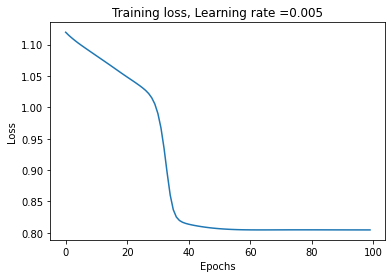

Train cost after epoch 0: 4.837288
Train cost after epoch 10: 3.135704
Train cost after epoch 20: 2.866250
Train cost after epoch 30: 2.578681
Train cost after epoch 40: 1.592170
Train cost after epoch 50: 1.501044
Train cost after epoch 60: 1.438089
Train cost after epoch 70: 1.379746
Train cost after epoch 80: 1.325919
Train cost after epoch 90: 1.276072


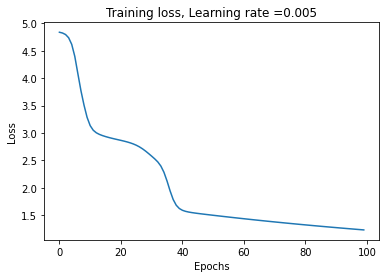

Train cost after epoch 0: 2.104679
Train cost after epoch 10: 2.029411
Train cost after epoch 20: 0.909948
Train cost after epoch 30: 0.806636
Train cost after epoch 40: 0.805042
Train cost after epoch 50: 0.804896
Train cost after epoch 60: 0.804940
Train cost after epoch 70: 0.804910
Train cost after epoch 80: 0.804778
Train cost after epoch 90: 0.804015


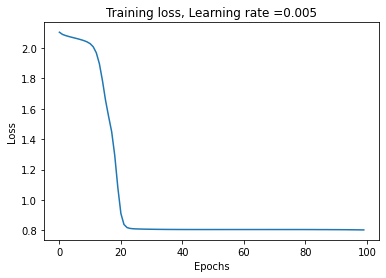

Train cost after epoch 0: 2.549924
Train cost after epoch 10: 1.260596
Train cost after epoch 20: 1.114323
Train cost after epoch 30: 1.076073
Train cost after epoch 40: 1.040511
Train cost after epoch 50: 1.007799
Train cost after epoch 60: 0.978048
Train cost after epoch 70: 0.951231
Train cost after epoch 80: 0.927281
Train cost after epoch 90: 0.906120


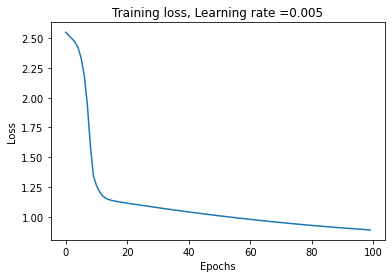

Train cost after epoch 0: 2.423173
Train cost after epoch 10: 2.374247
Train cost after epoch 20: 2.058661
Train cost after epoch 30: 1.628216
Train cost after epoch 40: 1.571695
Train cost after epoch 50: 1.516778
Train cost after epoch 60: 1.464555
Train cost after epoch 70: 1.415082
Train cost after epoch 80: 1.368091
Train cost after epoch 90: 1.323325


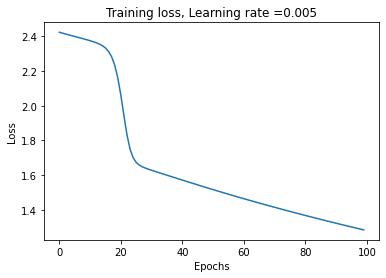

Train cost after epoch 0: 1.905496
Train cost after epoch 10: 1.859619
Train cost after epoch 20: 1.648664
Train cost after epoch 30: 1.107832
Train cost after epoch 40: 1.060482
Train cost after epoch 50: 1.019700
Train cost after epoch 60: 0.983403
Train cost after epoch 70: 0.948209
Train cost after epoch 80: 0.882805
Train cost after epoch 90: 0.837317


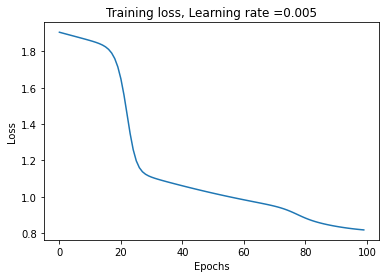

__________________________________________________ 0.3% GA is running...Train cost after epoch 0: 3.094466
Train cost after epoch 10: 2.719842
Train cost after epoch 20: 1.045093
Train cost after epoch 30: 1.004128
Train cost after epoch 40: 0.971041
Train cost after epoch 50: 0.941553
Train cost after epoch 60: 0.915808
Train cost after epoch 70: 0.893669
Train cost after epoch 80: 0.874906
Train cost after epoch 90: 0.859224


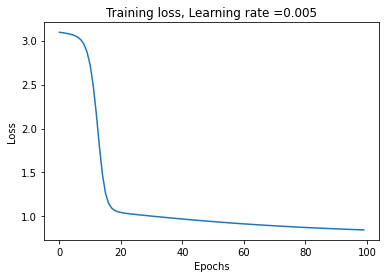

Train cost after epoch 0: 2.442142
Train cost after epoch 10: 0.975590
Train cost after epoch 20: 0.834054
Train cost after epoch 30: 0.825830
Train cost after epoch 40: 0.804143
Train cost after epoch 50: 0.802537
Train cost after epoch 60: 0.803138
Train cost after epoch 70: 0.802132
Train cost after epoch 80: 0.801868
Train cost after epoch 90: 0.801809


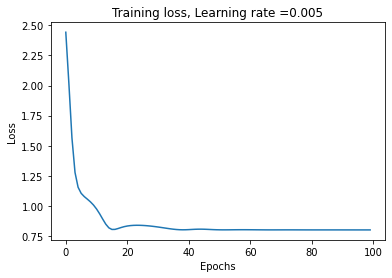

Train cost after epoch 0: 2.853007
Train cost after epoch 10: 1.545272
Train cost after epoch 20: 1.311198
Train cost after epoch 30: 1.211860
Train cost after epoch 40: 1.136845
Train cost after epoch 50: 1.055019
Train cost after epoch 60: 0.979378
Train cost after epoch 70: 0.931484
Train cost after epoch 80: 0.894480
Train cost after epoch 90: 0.866638


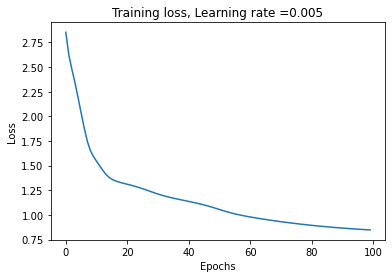

Train cost after epoch 0: 3.336489
Train cost after epoch 10: 2.525961
Train cost after epoch 20: 1.962529
Train cost after epoch 30: 1.713886
Train cost after epoch 40: 1.076928
Train cost after epoch 50: 0.812159
Train cost after epoch 60: 0.806551
Train cost after epoch 70: 0.805072
Train cost after epoch 80: 0.804996
Train cost after epoch 90: 0.805025


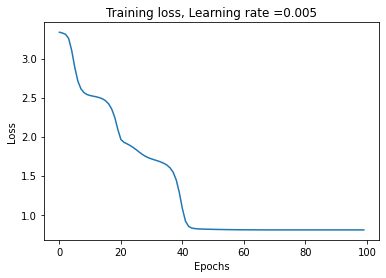

Train cost after epoch 0: 3.784411
Train cost after epoch 10: 3.442377
Train cost after epoch 20: 1.426526
Train cost after epoch 30: 1.307223
Train cost after epoch 40: 1.242489
Train cost after epoch 50: 0.957509
Train cost after epoch 60: 0.867242
Train cost after epoch 70: 0.839699
Train cost after epoch 80: 0.822983
Train cost after epoch 90: 0.813465


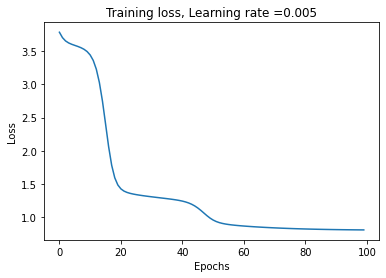

Train cost after epoch 0: 1.983437
Train cost after epoch 10: 1.928770
Train cost after epoch 20: 1.367750
Train cost after epoch 30: 1.311718
Train cost after epoch 40: 0.974597
Train cost after epoch 50: 0.808142
Train cost after epoch 60: 0.816710
Train cost after epoch 70: 0.804891
Train cost after epoch 80: 0.805588
Train cost after epoch 90: 0.804773


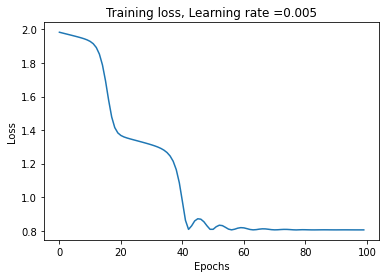

Train cost after epoch 0: 3.371398
Train cost after epoch 10: 1.849126
Train cost after epoch 20: 1.670535
Train cost after epoch 30: 1.543260
Train cost after epoch 40: 1.206276
Train cost after epoch 50: 1.044999
Train cost after epoch 60: 0.898613
Train cost after epoch 70: 0.849804
Train cost after epoch 80: 0.826981
Train cost after epoch 90: 0.814490


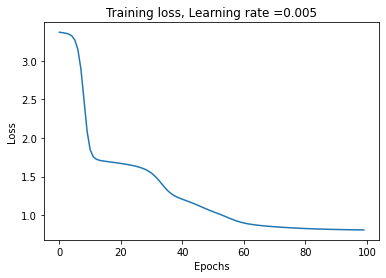

Train cost after epoch 0: 3.110743
Train cost after epoch 10: 1.592194
Train cost after epoch 20: 1.514508
Train cost after epoch 30: 1.463331
Train cost after epoch 40: 1.412517
Train cost after epoch 50: 1.360711
Train cost after epoch 60: 1.159965
Train cost after epoch 70: 1.091753
Train cost after epoch 80: 1.035275
Train cost after epoch 90: 0.987312


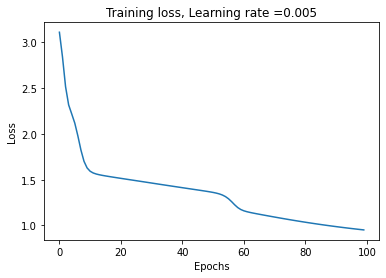

Train cost after epoch 0: 1.246466
Train cost after epoch 10: 1.007044
Train cost after epoch 20: 0.832409
Train cost after epoch 30: 0.818082
Train cost after epoch 40: 0.810105
Train cost after epoch 50: 0.805109
Train cost after epoch 60: 0.802803
Train cost after epoch 70: 0.801702
Train cost after epoch 80: 0.801089
Train cost after epoch 90: 0.800293


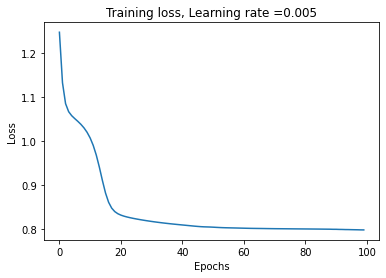

Train cost after epoch 0: 2.017038
Train cost after epoch 10: 1.932628
Train cost after epoch 20: 1.345160
Train cost after epoch 30: 1.267531
Train cost after epoch 40: 1.218408
Train cost after epoch 50: 1.172412
Train cost after epoch 60: 1.129903
Train cost after epoch 70: 1.090809
Train cost after epoch 80: 1.054922
Train cost after epoch 90: 1.022062


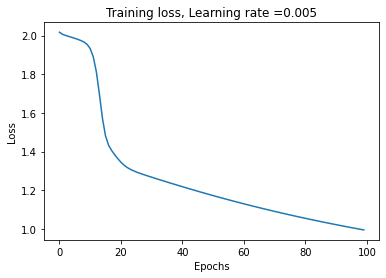

Train cost after epoch 0: 2.843405
Train cost after epoch 10: 2.488980
Train cost after epoch 20: 1.886194
Train cost after epoch 30: 1.081583
Train cost after epoch 40: 0.891922
Train cost after epoch 50: 0.804676
Train cost after epoch 60: 0.806148
Train cost after epoch 70: 0.805021
Train cost after epoch 80: 0.804876
Train cost after epoch 90: 0.804906


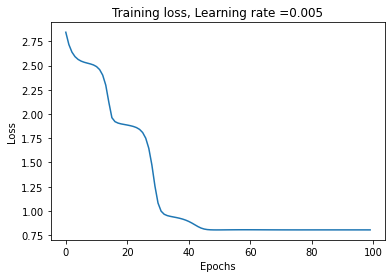

Train cost after epoch 0: 2.516075
Train cost after epoch 10: 2.446577
Train cost after epoch 20: 1.103932
Train cost after epoch 30: 1.051878
Train cost after epoch 40: 1.014036
Train cost after epoch 50: 0.979710
Train cost after epoch 60: 0.949373
Train cost after epoch 70: 0.922925
Train cost after epoch 80: 0.900115
Train cost after epoch 90: 0.880685


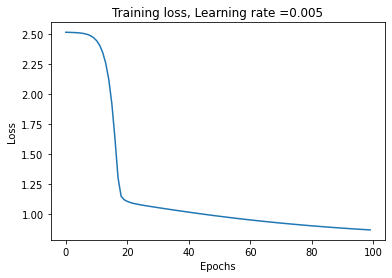

Train cost after epoch 0: 2.137864
Train cost after epoch 10: 1.362282
Train cost after epoch 20: 0.806285
Train cost after epoch 30: 0.811062
Train cost after epoch 40: 0.807413
Train cost after epoch 50: 0.802376
Train cost after epoch 60: 0.801873
Train cost after epoch 70: 0.801789
Train cost after epoch 80: 0.801483
Train cost after epoch 90: 0.801176


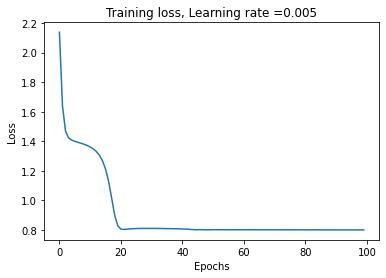

Train cost after epoch 0: 2.732795
Train cost after epoch 10: 2.673051
Train cost after epoch 20: 2.235996
Train cost after epoch 30: 2.040107
Train cost after epoch 40: 1.963840
Train cost after epoch 50: 1.805213
Train cost after epoch 60: 1.453769
Train cost after epoch 70: 1.212602
Train cost after epoch 80: 0.973384
Train cost after epoch 90: 0.916270


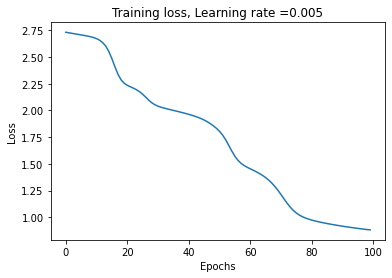

Train cost after epoch 0: 2.502780
Train cost after epoch 10: 0.911685
Train cost after epoch 20: 0.803876
Train cost after epoch 30: 0.801837
Train cost after epoch 40: 0.801762
Train cost after epoch 50: 0.801748
Train cost after epoch 60: 0.801673
Train cost after epoch 70: 0.801559
Train cost after epoch 80: 0.801305
Train cost after epoch 90: 0.801026


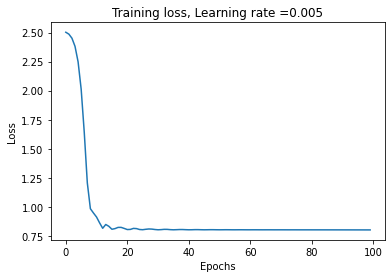

Train cost after epoch 0: 4.344257
Train cost after epoch 10: 2.856963
Train cost after epoch 20: 2.734098
Train cost after epoch 30: 2.429211
Train cost after epoch 40: 1.447485
Train cost after epoch 50: 1.308808
Train cost after epoch 60: 1.187673
Train cost after epoch 70: 1.122458
Train cost after epoch 80: 1.067246
Train cost after epoch 90: 1.020120


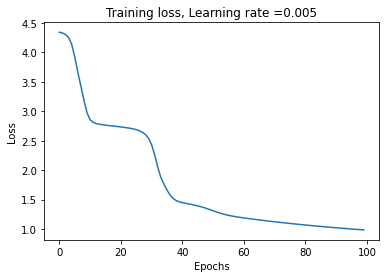

Train cost after epoch 0: 2.929883
Train cost after epoch 10: 1.978804
Train cost after epoch 20: 1.869089
Train cost after epoch 30: 1.806276
Train cost after epoch 40: 1.347920
Train cost after epoch 50: 1.040622
Train cost after epoch 60: 0.992087
Train cost after epoch 70: 0.951160
Train cost after epoch 80: 0.889377
Train cost after epoch 90: 0.815177


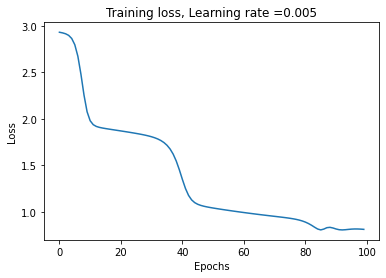

Train cost after epoch 0: 3.269305
Train cost after epoch 10: 3.184665
Train cost after epoch 20: 1.608757
Train cost after epoch 30: 1.397201
Train cost after epoch 40: 1.341711
Train cost after epoch 50: 1.256733
Train cost after epoch 60: 1.153608
Train cost after epoch 70: 1.056298
Train cost after epoch 80: 0.906895
Train cost after epoch 90: 0.844069


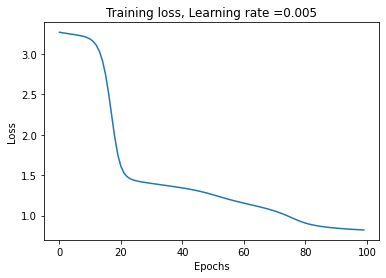

Train cost after epoch 0: 3.375730
Train cost after epoch 10: 0.813274
Train cost after epoch 20: 0.813292
Train cost after epoch 30: 0.809008
Train cost after epoch 40: 0.806102
Train cost after epoch 50: 0.805183
Train cost after epoch 60: 0.804918
Train cost after epoch 70: 0.804827
Train cost after epoch 80: 0.804193
Train cost after epoch 90: 0.801400


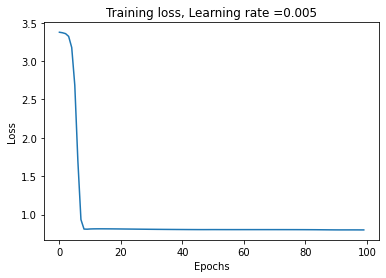

Train cost after epoch 0: 1.752412
Train cost after epoch 10: 1.698874
Train cost after epoch 20: 1.655044
Train cost after epoch 30: 1.611688
Train cost after epoch 40: 1.568869
Train cost after epoch 50: 1.526520
Train cost after epoch 60: 0.818874
Train cost after epoch 70: 0.809104
Train cost after epoch 80: 0.805711
Train cost after epoch 90: 0.804898


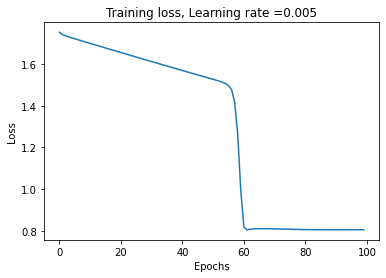

Train cost after epoch 0: 3.259228
Train cost after epoch 10: 2.893127
Train cost after epoch 20: 1.951106
Train cost after epoch 30: 1.711142
Train cost after epoch 40: 1.645178
Train cost after epoch 50: 1.436437
Train cost after epoch 60: 0.917820
Train cost after epoch 70: 0.809096
Train cost after epoch 80: 0.804738
Train cost after epoch 90: 0.805000


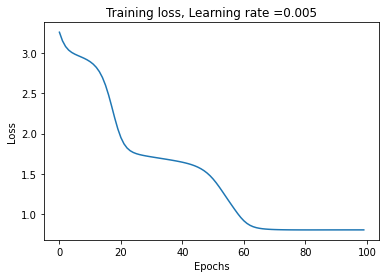

Train cost after epoch 0: 2.516782
Train cost after epoch 10: 1.459029
Train cost after epoch 20: 1.399457
Train cost after epoch 30: 1.354578
Train cost after epoch 40: 1.311016
Train cost after epoch 50: 1.269352
Train cost after epoch 60: 1.229469
Train cost after epoch 70: 1.191360
Train cost after epoch 80: 1.155025
Train cost after epoch 90: 1.120481


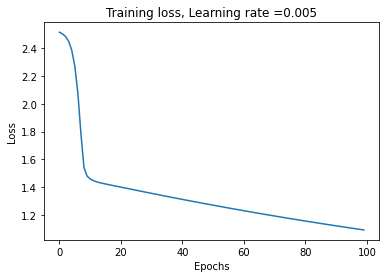

Train cost after epoch 0: 1.833840
Train cost after epoch 10: 1.688751
Train cost after epoch 20: 1.644417
Train cost after epoch 30: 1.600860
Train cost after epoch 40: 1.558002
Train cost after epoch 50: 1.515802
Train cost after epoch 60: 1.473491
Train cost after epoch 70: 1.370584
Train cost after epoch 80: 1.293661
Train cost after epoch 90: 1.222465


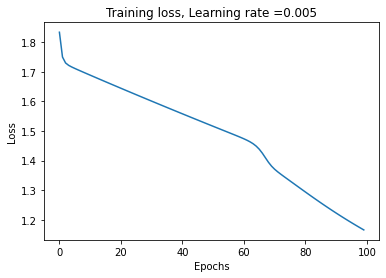

Train cost after epoch 0: 2.472909
Train cost after epoch 10: 1.766323
Train cost after epoch 20: 1.572289
Train cost after epoch 30: 1.487915
Train cost after epoch 40: 1.155011
Train cost after epoch 50: 0.905516
Train cost after epoch 60: 0.870794
Train cost after epoch 70: 0.845751
Train cost after epoch 80: 0.828774
Train cost after epoch 90: 0.818062


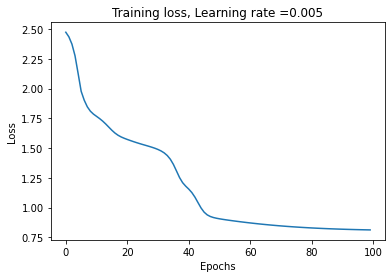

Train cost after epoch 0: 2.242743
Train cost after epoch 10: 2.015693
Train cost after epoch 20: 1.432352
Train cost after epoch 30: 1.229865
Train cost after epoch 40: 1.147840
Train cost after epoch 50: 1.094447
Train cost after epoch 60: 1.046304
Train cost after epoch 70: 1.004167
Train cost after epoch 80: 0.967878
Train cost after epoch 90: 0.936865


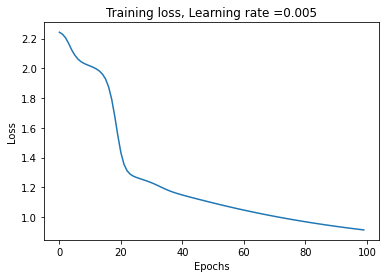

Train cost after epoch 0: 2.883211
Train cost after epoch 10: 2.239692
Train cost after epoch 20: 2.170979
Train cost after epoch 30: 2.051052
Train cost after epoch 40: 1.681773
Train cost after epoch 50: 1.603839
Train cost after epoch 60: 1.525282
Train cost after epoch 70: 1.424857
Train cost after epoch 80: 1.341501
Train cost after epoch 90: 1.269164


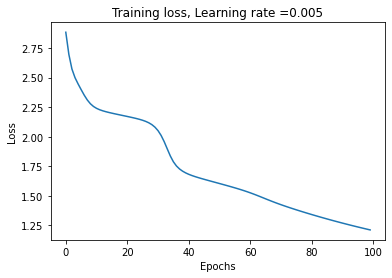

Train cost after epoch 0: 1.542243
Train cost after epoch 10: 1.498505
Train cost after epoch 20: 1.380882
Train cost after epoch 30: 1.102696
Train cost after epoch 40: 1.059763
Train cost after epoch 50: 1.019449
Train cost after epoch 60: 0.983536
Train cost after epoch 70: 0.952119
Train cost after epoch 80: 0.924908
Train cost after epoch 90: 0.901566


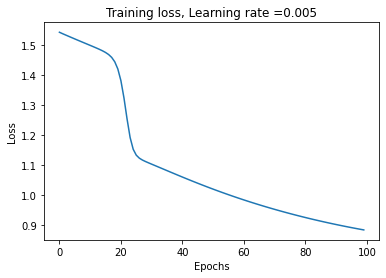

Train cost after epoch 0: 2.803944
Train cost after epoch 10: 2.664759
Train cost after epoch 20: 2.612218
Train cost after epoch 30: 2.561086
Train cost after epoch 40: 2.510466
Train cost after epoch 50: 2.455178
Train cost after epoch 60: 2.033672
Train cost after epoch 70: 1.744896
Train cost after epoch 80: 1.586916
Train cost after epoch 90: 1.503004


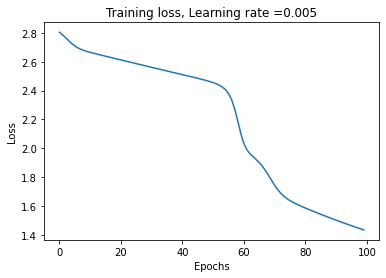

Train cost after epoch 0: 4.050602
Train cost after epoch 10: 2.684855
Train cost after epoch 20: 1.793897
Train cost after epoch 30: 1.159981
Train cost after epoch 40: 1.110066
Train cost after epoch 50: 1.066518
Train cost after epoch 60: 1.027519
Train cost after epoch 70: 0.992842
Train cost after epoch 80: 0.962173
Train cost after epoch 90: 0.935220


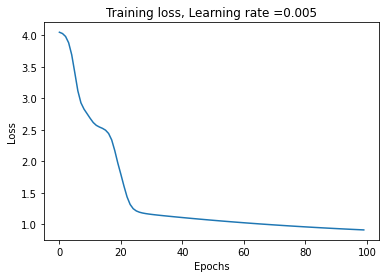

Train cost after epoch 0: 2.533938
Train cost after epoch 10: 2.463921
Train cost after epoch 20: 0.854635
Train cost after epoch 30: 0.813483
Train cost after epoch 40: 0.803662
Train cost after epoch 50: 0.804368
Train cost after epoch 60: 0.804410
Train cost after epoch 70: 0.803612
Train cost after epoch 80: 0.803492
Train cost after epoch 90: 0.803513


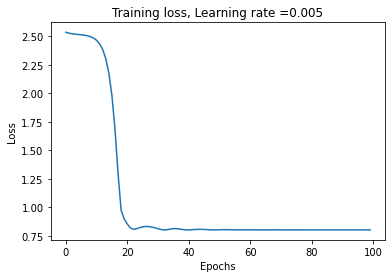

Train cost after epoch 0: 2.626707
Train cost after epoch 10: 1.580280
Train cost after epoch 20: 0.805170
Train cost after epoch 30: 0.803827
Train cost after epoch 40: 0.802348
Train cost after epoch 50: 0.800692
Train cost after epoch 60: 0.800499
Train cost after epoch 70: 0.800197
Train cost after epoch 80: 0.799931
Train cost after epoch 90: 0.799808


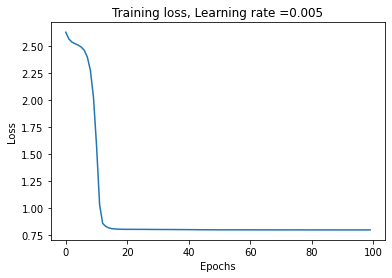

Train cost after epoch 0: 1.980889
Train cost after epoch 10: 1.935282
Train cost after epoch 20: 1.879057
Train cost after epoch 30: 1.689259
Train cost after epoch 40: 1.329835
Train cost after epoch 50: 1.250676
Train cost after epoch 60: 1.190246
Train cost after epoch 70: 1.047277
Train cost after epoch 80: 0.821696
Train cost after epoch 90: 0.807027


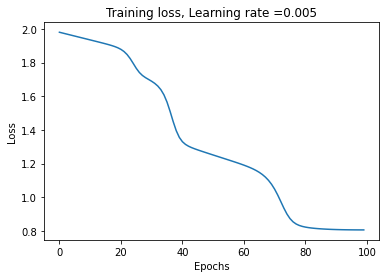

Train cost after epoch 0: 3.108410
Train cost after epoch 10: 3.060094
Train cost after epoch 20: 3.010990
Train cost after epoch 30: 2.745430
Train cost after epoch 40: 1.368173
Train cost after epoch 50: 1.124095
Train cost after epoch 60: 1.068068
Train cost after epoch 70: 1.021769
Train cost after epoch 80: 0.982211
Train cost after epoch 90: 0.948555


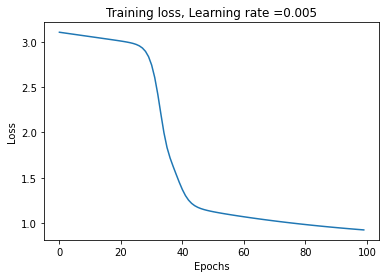

Train cost after epoch 0: 3.992037
Train cost after epoch 10: 2.538911
Train cost after epoch 20: 1.996455
Train cost after epoch 30: 1.638243
Train cost after epoch 40: 0.803475
Train cost after epoch 50: 0.807306
Train cost after epoch 60: 0.806300
Train cost after epoch 70: 0.805172
Train cost after epoch 80: 0.804878
Train cost after epoch 90: 0.804892


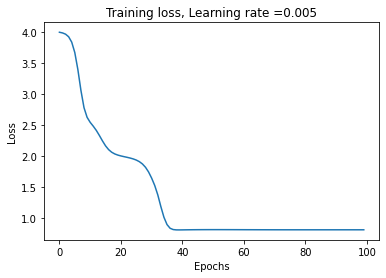

Train cost after epoch 0: 2.560999
Train cost after epoch 10: 1.463611
Train cost after epoch 20: 1.317176
Train cost after epoch 30: 0.845967
Train cost after epoch 40: 0.826600
Train cost after epoch 50: 0.815710
Train cost after epoch 60: 0.809430
Train cost after epoch 70: 0.805627
Train cost after epoch 80: 0.802484
Train cost after epoch 90: 0.800592


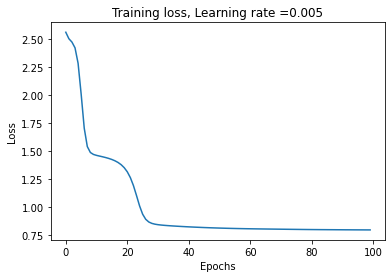

Train cost after epoch 0: 4.773767
Train cost after epoch 10: 2.085995
Train cost after epoch 20: 1.832978
Train cost after epoch 30: 1.755867
Train cost after epoch 40: 1.077677
Train cost after epoch 50: 0.943113
Train cost after epoch 60: 0.887106
Train cost after epoch 70: 0.855661
Train cost after epoch 80: 0.834742
Train cost after epoch 90: 0.821437


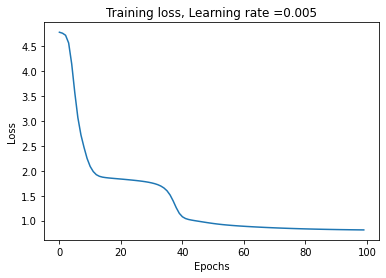

Train cost after epoch 0: 2.230809
Train cost after epoch 10: 2.164541
Train cost after epoch 20: 2.117077
Train cost after epoch 30: 2.012815
Train cost after epoch 40: 1.752918
Train cost after epoch 50: 1.689530
Train cost after epoch 60: 1.627420
Train cost after epoch 70: 1.568914
Train cost after epoch 80: 1.513942
Train cost after epoch 90: 1.462027


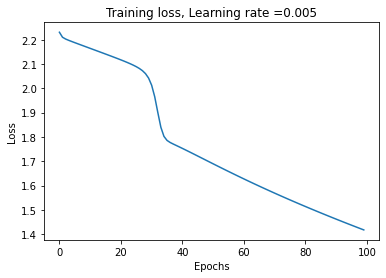

Train cost after epoch 0: 3.410944
Train cost after epoch 10: 3.345228
Train cost after epoch 20: 3.031819
Train cost after epoch 30: 0.969344
Train cost after epoch 40: 0.827517
Train cost after epoch 50: 0.803318
Train cost after epoch 60: 0.806040
Train cost after epoch 70: 0.804032
Train cost after epoch 80: 0.803262
Train cost after epoch 90: 0.803296


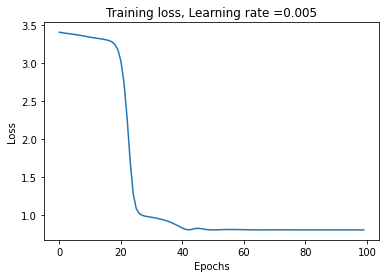

Train cost after epoch 0: 3.713422
Train cost after epoch 10: 3.640396
Train cost after epoch 20: 1.720513
Train cost after epoch 30: 1.235444
Train cost after epoch 40: 1.186578
Train cost after epoch 50: 1.142148
Train cost after epoch 60: 1.101259
Train cost after epoch 70: 1.063811
Train cost after epoch 80: 1.029608
Train cost after epoch 90: 0.998484


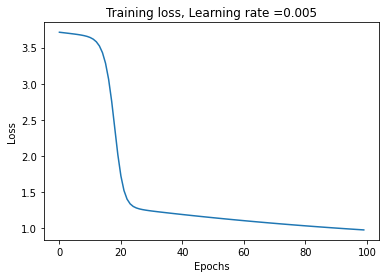

Train cost after epoch 0: 2.188275
Train cost after epoch 10: 2.123805
Train cost after epoch 20: 2.077067
Train cost after epoch 30: 2.030655
Train cost after epoch 40: 1.984597
Train cost after epoch 50: 1.938909
Train cost after epoch 60: 1.893603
Train cost after epoch 70: 1.848690
Train cost after epoch 80: 1.804189
Train cost after epoch 90: 1.760121


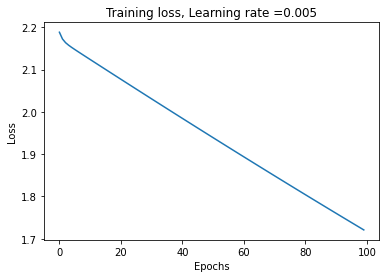

Train cost after epoch 0: 2.505682
Train cost after epoch 10: 0.871191
Train cost after epoch 20: 0.837255
Train cost after epoch 30: 0.825455
Train cost after epoch 40: 0.817180
Train cost after epoch 50: 0.811698
Train cost after epoch 60: 0.808350
Train cost after epoch 70: 0.806485
Train cost after epoch 80: 0.805548
Train cost after epoch 90: 0.805128


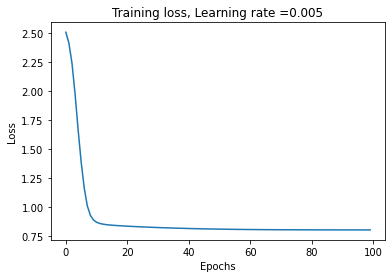

Train cost after epoch 0: 2.507166
Train cost after epoch 10: 2.459706
Train cost after epoch 20: 2.412057
Train cost after epoch 30: 1.842890
Train cost after epoch 40: 0.918145
Train cost after epoch 50: 0.808460
Train cost after epoch 60: 0.805203
Train cost after epoch 70: 0.804836
Train cost after epoch 80: 0.804927
Train cost after epoch 90: 0.804917


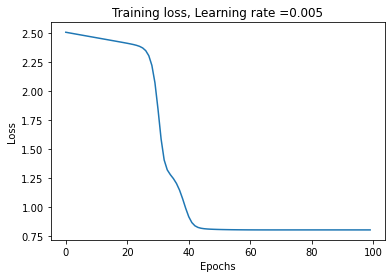

Train cost after epoch 0: 1.388991
Train cost after epoch 10: 1.348550
Train cost after epoch 20: 1.308903
Train cost after epoch 30: 1.270176
Train cost after epoch 40: 1.230029
Train cost after epoch 50: 0.837124
Train cost after epoch 60: 0.807870
Train cost after epoch 70: 0.805032
Train cost after epoch 80: 0.804975
Train cost after epoch 90: 0.804965


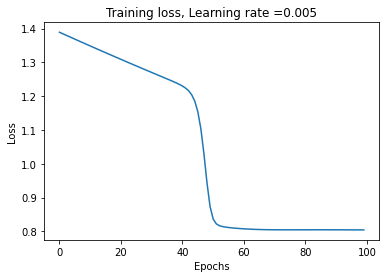

Train cost after epoch 0: 2.373370
Train cost after epoch 10: 1.691905
Train cost after epoch 20: 1.565007
Train cost after epoch 30: 1.514538
Train cost after epoch 40: 1.397032
Train cost after epoch 50: 1.229725
Train cost after epoch 60: 1.168665
Train cost after epoch 70: 1.114293
Train cost after epoch 80: 1.066418
Train cost after epoch 90: 1.024557


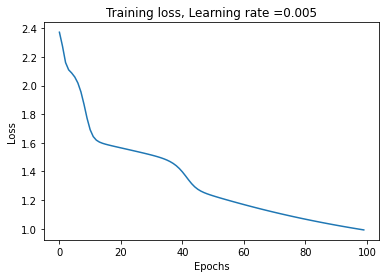

Train cost after epoch 0: 2.276438
Train cost after epoch 10: 2.220197
Train cost after epoch 20: 2.173009
Train cost after epoch 30: 2.126321
Train cost after epoch 40: 2.080051
Train cost after epoch 50: 2.034012
Train cost after epoch 60: 1.832388
Train cost after epoch 70: 1.478829
Train cost after epoch 80: 1.404841
Train cost after epoch 90: 1.335899


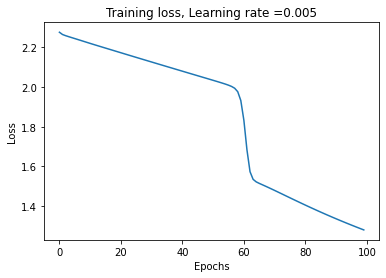

Train cost after epoch 0: 2.334074
Train cost after epoch 10: 2.002913
Train cost after epoch 20: 1.956364
Train cost after epoch 30: 1.910277
Train cost after epoch 40: 1.864034
Train cost after epoch 50: 1.785193
Train cost after epoch 60: 0.914250
Train cost after epoch 70: 0.877619
Train cost after epoch 80: 0.849302
Train cost after epoch 90: 0.830227


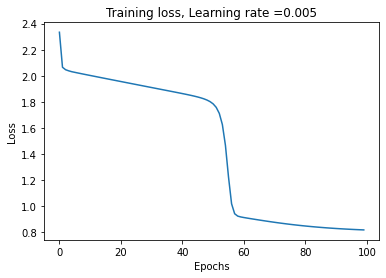

Train cost after epoch 0: 1.405258
Train cost after epoch 10: 1.364229
Train cost after epoch 20: 1.324304
Train cost after epoch 30: 1.285279
Train cost after epoch 40: 1.247289
Train cost after epoch 50: 1.210454
Train cost after epoch 60: 1.174887
Train cost after epoch 70: 1.140694
Train cost after epoch 80: 1.107979
Train cost after epoch 90: 1.076840


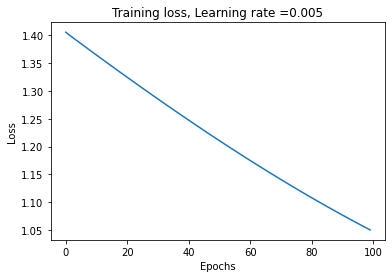

Train cost after epoch 0: 3.323805
Train cost after epoch 10: 2.788896
Train cost after epoch 20: 1.700452
Train cost after epoch 30: 1.404274
Train cost after epoch 40: 1.294143
Train cost after epoch 50: 1.150173
Train cost after epoch 60: 1.086215
Train cost after epoch 70: 1.034534
Train cost after epoch 80: 0.990771
Train cost after epoch 90: 0.953921


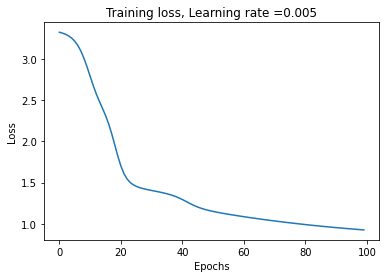

Train cost after epoch 0: 3.537876
Train cost after epoch 10: 1.690060
Train cost after epoch 20: 1.453735
Train cost after epoch 30: 1.399492
Train cost after epoch 40: 1.292732
Train cost after epoch 50: 1.191629
Train cost after epoch 60: 1.033725
Train cost after epoch 70: 0.932338
Train cost after epoch 80: 0.889352
Train cost after epoch 90: 0.858734


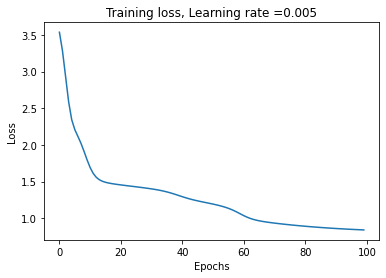

Train cost after epoch 0: 1.826063
Train cost after epoch 10: 1.769483
Train cost after epoch 20: 1.724935
Train cost after epoch 30: 1.378893
Train cost after epoch 40: 1.214778
Train cost after epoch 50: 1.163488
Train cost after epoch 60: 1.115436
Train cost after epoch 70: 1.072081
Train cost after epoch 80: 1.033307
Train cost after epoch 90: 0.998743


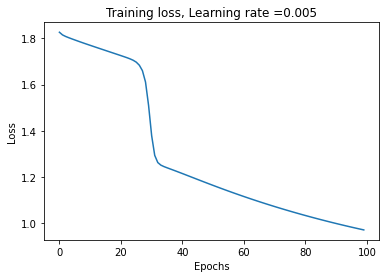

Train cost after epoch 0: 2.528323
Train cost after epoch 10: 2.511907
Train cost after epoch 20: 2.012505
Train cost after epoch 30: 1.459538
Train cost after epoch 40: 1.406493
Train cost after epoch 50: 1.355045
Train cost after epoch 60: 1.306464
Train cost after epoch 70: 1.260827
Train cost after epoch 80: 1.217919
Train cost after epoch 90: 1.177534


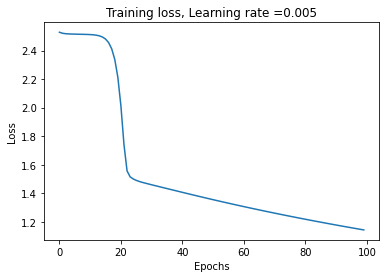

Train cost after epoch 0: 3.878881
Train cost after epoch 10: 1.581594
Train cost after epoch 20: 1.495413
Train cost after epoch 30: 1.364044
Train cost after epoch 40: 0.857210
Train cost after epoch 50: 0.826822
Train cost after epoch 60: 0.814743
Train cost after epoch 70: 0.808647
Train cost after epoch 80: 0.806018
Train cost after epoch 90: 0.805104


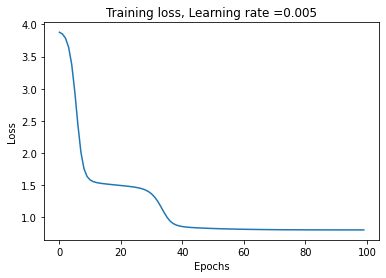

Train cost after epoch 0: 2.567355
Train cost after epoch 10: 0.854143
Train cost after epoch 20: 0.804579
Train cost after epoch 30: 0.802592
Train cost after epoch 40: 0.801963
Train cost after epoch 50: 0.801546
Train cost after epoch 60: 0.801165
Train cost after epoch 70: 0.800866
Train cost after epoch 80: 0.800483
Train cost after epoch 90: 0.800196


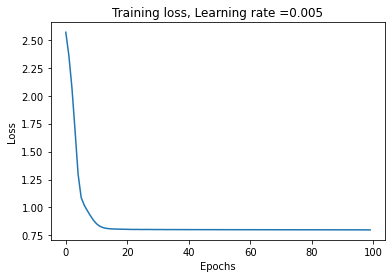

Train cost after epoch 0: 3.062047
Train cost after epoch 10: 2.523898
Train cost after epoch 20: 2.493441
Train cost after epoch 30: 1.104803
Train cost after epoch 40: 1.044900
Train cost after epoch 50: 1.001732
Train cost after epoch 60: 0.965132
Train cost after epoch 70: 0.933721
Train cost after epoch 80: 0.907168
Train cost after epoch 90: 0.884989


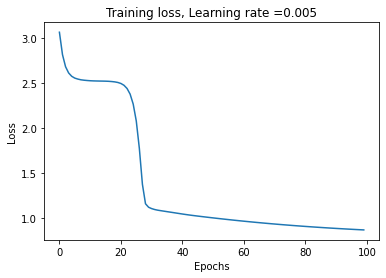

Train cost after epoch 0: 1.986148
Train cost after epoch 10: 1.405643
Train cost after epoch 20: 1.364224
Train cost after epoch 30: 1.308192
Train cost after epoch 40: 1.188078
Train cost after epoch 50: 1.135822
Train cost after epoch 60: 1.086826
Train cost after epoch 70: 1.043142
Train cost after epoch 80: 1.004734
Train cost after epoch 90: 0.971136


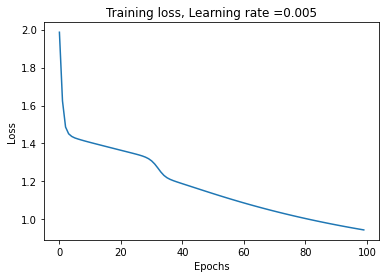

Train cost after epoch 0: 2.321135
Train cost after epoch 10: 2.132055
Train cost after epoch 20: 1.911614
Train cost after epoch 30: 1.857263
Train cost after epoch 40: 1.439852
Train cost after epoch 50: 0.873740
Train cost after epoch 60: 0.847128
Train cost after epoch 70: 0.828768
Train cost after epoch 80: 0.817310
Train cost after epoch 90: 0.810810


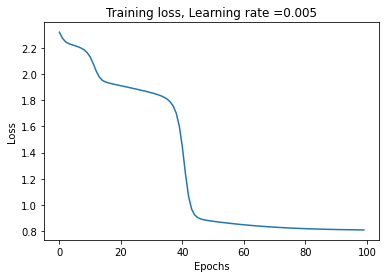

Train cost after epoch 0: 1.192907
Train cost after epoch 10: 1.122090
Train cost after epoch 20: 1.087934
Train cost after epoch 30: 1.055481
Train cost after epoch 40: 1.024864
Train cost after epoch 50: 0.996254
Train cost after epoch 60: 0.969784
Train cost after epoch 70: 0.945391
Train cost after epoch 80: 0.897628
Train cost after epoch 90: 0.808460


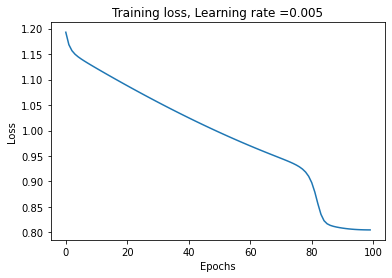

Train cost after epoch 0: 2.658978
Train cost after epoch 10: 1.402323
Train cost after epoch 20: 1.169684
Train cost after epoch 30: 1.099522
Train cost after epoch 40: 0.843494
Train cost after epoch 50: 0.812437
Train cost after epoch 60: 0.806269
Train cost after epoch 70: 0.802734
Train cost after epoch 80: 0.800186
Train cost after epoch 90: 0.799727


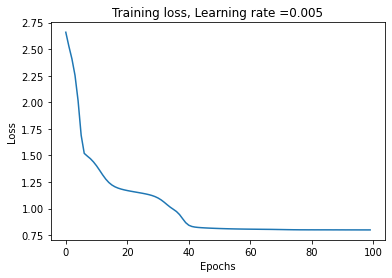

Train cost after epoch 0: 2.781491
Train cost after epoch 10: 2.671875
Train cost after epoch 20: 2.293979
Train cost after epoch 30: 2.216074
Train cost after epoch 40: 1.847181
Train cost after epoch 50: 1.533282
Train cost after epoch 60: 1.463219
Train cost after epoch 70: 1.400238
Train cost after epoch 80: 1.342578
Train cost after epoch 90: 1.289632


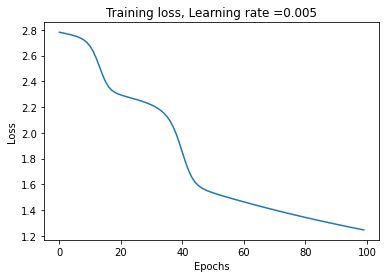

Train cost after epoch 0: 2.300769
Train cost after epoch 10: 1.635922
Train cost after epoch 20: 1.336568
Train cost after epoch 30: 1.247589
Train cost after epoch 40: 1.199459
Train cost after epoch 50: 1.148516
Train cost after epoch 60: 1.009788
Train cost after epoch 70: 0.940828
Train cost after epoch 80: 0.898601
Train cost after epoch 90: 0.867015


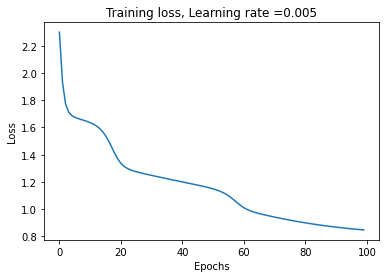

Train cost after epoch 0: 2.220662
Train cost after epoch 10: 2.171250
Train cost after epoch 20: 1.912998
Train cost after epoch 30: 1.854984
Train cost after epoch 40: 1.641848
Train cost after epoch 50: 1.305539
Train cost after epoch 60: 1.241519
Train cost after epoch 70: 1.183841
Train cost after epoch 80: 1.132270
Train cost after epoch 90: 1.086389


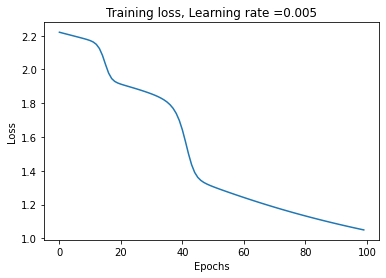

Train cost after epoch 0: 2.964167
Train cost after epoch 10: 1.238282
Train cost after epoch 20: 1.199150
Train cost after epoch 30: 1.158778
Train cost after epoch 40: 0.990990
Train cost after epoch 50: 0.852881
Train cost after epoch 60: 0.815635
Train cost after epoch 70: 0.805752
Train cost after epoch 80: 0.802747
Train cost after epoch 90: 0.803055


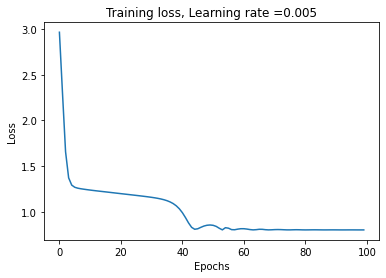

Train cost after epoch 0: 2.484860
Train cost after epoch 10: 2.078357
Train cost after epoch 20: 0.804902
Train cost after epoch 30: 0.806570
Train cost after epoch 40: 0.804092
Train cost after epoch 50: 0.803500
Train cost after epoch 60: 0.803282
Train cost after epoch 70: 0.803117
Train cost after epoch 80: 0.802934
Train cost after epoch 90: 0.802748


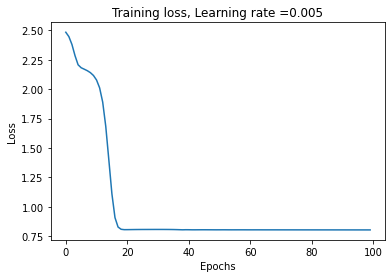

Train cost after epoch 0: 1.848723
Train cost after epoch 10: 1.745440
Train cost after epoch 20: 1.699620
Train cost after epoch 30: 1.654219
Train cost after epoch 40: 1.609472
Train cost after epoch 50: 1.538695
Train cost after epoch 60: 1.458430
Train cost after epoch 70: 1.389061
Train cost after epoch 80: 1.324618
Train cost after epoch 90: 1.266296


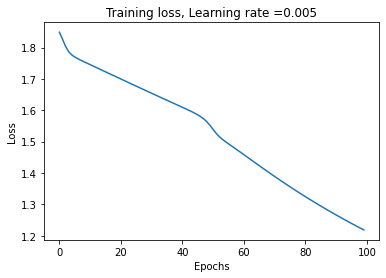

Train cost after epoch 0: 2.537929
Train cost after epoch 10: 1.866506
Train cost after epoch 20: 1.771963
Train cost after epoch 30: 1.514264
Train cost after epoch 40: 1.078764
Train cost after epoch 50: 1.031340
Train cost after epoch 60: 0.989216
Train cost after epoch 70: 0.953051
Train cost after epoch 80: 0.922573
Train cost after epoch 90: 0.897182


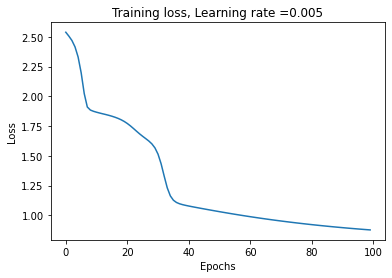

Train cost after epoch 0: 3.687839
Train cost after epoch 10: 1.719052
Train cost after epoch 20: 1.241631
Train cost after epoch 30: 1.183181
Train cost after epoch 40: 1.016492
Train cost after epoch 50: 0.972909
Train cost after epoch 60: 0.934873
Train cost after epoch 70: 0.903430
Train cost after epoch 80: 0.878235
Train cost after epoch 90: 0.858462


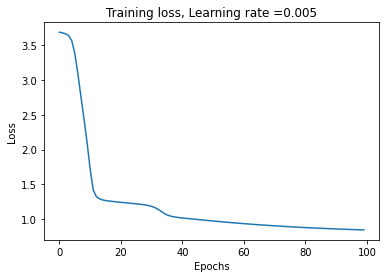

Train cost after epoch 0: 1.817281
Train cost after epoch 10: 1.327279
Train cost after epoch 20: 1.285173
Train cost after epoch 30: 1.243867
Train cost after epoch 40: 1.199128
Train cost after epoch 50: 1.063858
Train cost after epoch 60: 0.998893
Train cost after epoch 70: 0.952746
Train cost after epoch 80: 0.915042
Train cost after epoch 90: 0.885386


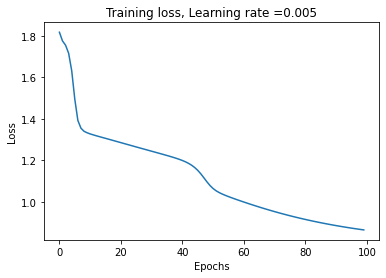

Train cost after epoch 0: 2.635163
Train cost after epoch 10: 2.445112
Train cost after epoch 20: 2.393603
Train cost after epoch 30: 1.822445
Train cost after epoch 40: 1.120165
Train cost after epoch 50: 1.059957
Train cost after epoch 60: 1.012876
Train cost after epoch 70: 0.972908
Train cost after epoch 80: 0.939156
Train cost after epoch 90: 0.910898


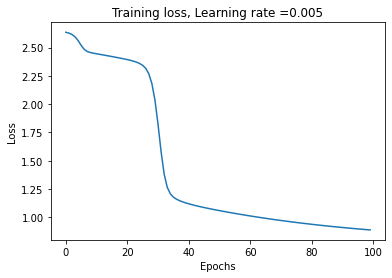

Train cost after epoch 0: 1.578293
Train cost after epoch 10: 1.535496
Train cost after epoch 20: 1.493235
Train cost after epoch 30: 1.451603
Train cost after epoch 40: 1.410693
Train cost after epoch 50: 1.370594
Train cost after epoch 60: 1.331385
Train cost after epoch 70: 1.293149
Train cost after epoch 80: 1.255966
Train cost after epoch 90: 1.219921


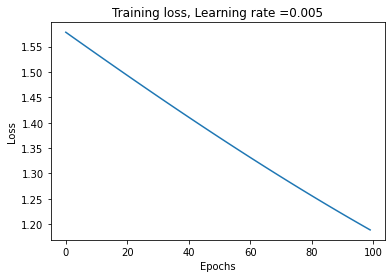

Train cost after epoch 0: 2.478691
Train cost after epoch 10: 1.726107
Train cost after epoch 20: 1.679224
Train cost after epoch 30: 1.332407
Train cost after epoch 40: 0.901083
Train cost after epoch 50: 0.808248
Train cost after epoch 60: 0.804800
Train cost after epoch 70: 0.804874
Train cost after epoch 80: 0.803975
Train cost after epoch 90: 0.803729


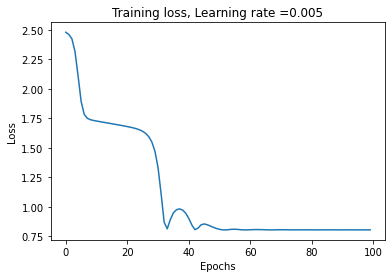

__________________________________________________ 0.4% GA is running...Train cost after epoch 0: 2.253335
Train cost after epoch 10: 1.972243
Train cost after epoch 20: 1.828870
Train cost after epoch 30: 1.082914
Train cost after epoch 40: 0.813363
Train cost after epoch 50: 0.806976
Train cost after epoch 60: 0.803944
Train cost after epoch 70: 0.801901
Train cost after epoch 80: 0.800322
Train cost after epoch 90: 0.799403


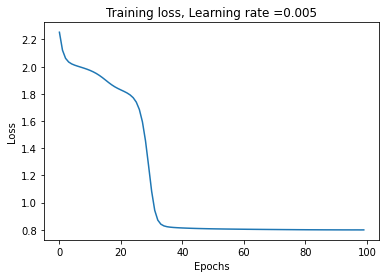

Train cost after epoch 0: 3.030674
Train cost after epoch 10: 1.614138
Train cost after epoch 20: 0.887958
Train cost after epoch 30: 0.865958
Train cost after epoch 40: 0.835024
Train cost after epoch 50: 0.809710
Train cost after epoch 60: 0.804994
Train cost after epoch 70: 0.804969
Train cost after epoch 80: 0.805035
Train cost after epoch 90: 0.804805


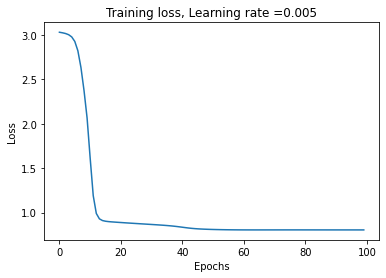

Train cost after epoch 0: 3.917110
Train cost after epoch 10: 3.847657
Train cost after epoch 20: 3.095896
Train cost after epoch 30: 2.679648
Train cost after epoch 40: 2.068219
Train cost after epoch 50: 1.019293
Train cost after epoch 60: 0.918849
Train cost after epoch 70: 0.879999
Train cost after epoch 80: 0.853995
Train cost after epoch 90: 0.836053


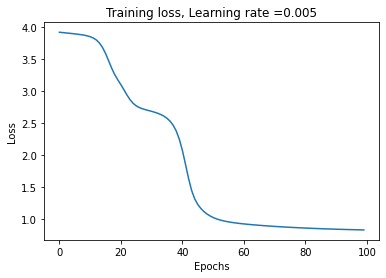

Train cost after epoch 0: 1.552639
Train cost after epoch 10: 1.510032
Train cost after epoch 20: 1.468051
Train cost after epoch 30: 1.426010
Train cost after epoch 40: 1.308529
Train cost after epoch 50: 1.245187
Train cost after epoch 60: 1.188292
Train cost after epoch 70: 1.136288
Train cost after epoch 80: 1.089846
Train cost after epoch 90: 1.048527


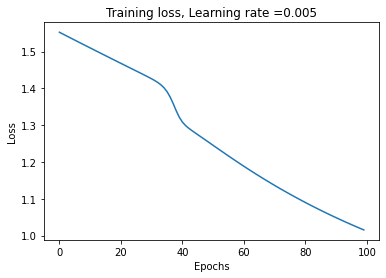

Train cost after epoch 0: 2.577424
Train cost after epoch 10: 1.538162
Train cost after epoch 20: 1.466067
Train cost after epoch 30: 1.419914
Train cost after epoch 40: 1.360582
Train cost after epoch 50: 1.139264
Train cost after epoch 60: 1.075182
Train cost after epoch 70: 1.023767
Train cost after epoch 80: 0.979975
Train cost after epoch 90: 0.943412


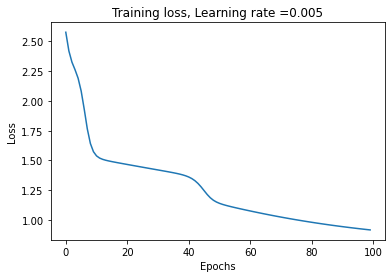

Train cost after epoch 0: 3.465496
Train cost after epoch 10: 3.006229
Train cost after epoch 20: 1.848885
Train cost after epoch 30: 1.639088
Train cost after epoch 40: 1.561979
Train cost after epoch 50: 1.417117
Train cost after epoch 60: 1.096078
Train cost after epoch 70: 0.868550
Train cost after epoch 80: 0.826981
Train cost after epoch 90: 0.812401


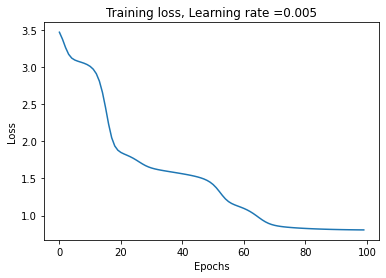

Train cost after epoch 0: 1.728760
Train cost after epoch 10: 1.430998
Train cost after epoch 20: 1.388843
Train cost after epoch 30: 1.337565
Train cost after epoch 40: 1.265079
Train cost after epoch 50: 1.208302
Train cost after epoch 60: 1.155382
Train cost after epoch 70: 1.107651
Train cost after epoch 80: 1.064993
Train cost after epoch 90: 1.026935


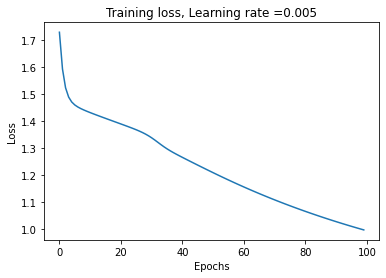

Train cost after epoch 0: 1.068354
Train cost after epoch 10: 0.843287
Train cost after epoch 20: 0.830717
Train cost after epoch 30: 0.821172
Train cost after epoch 40: 0.814373
Train cost after epoch 50: 0.809893
Train cost after epoch 60: 0.807141
Train cost after epoch 70: 0.805397
Train cost after epoch 80: 0.803729
Train cost after epoch 90: 0.802015


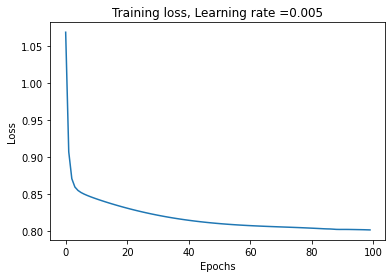

Train cost after epoch 0: 2.553713
Train cost after epoch 10: 1.300762
Train cost after epoch 20: 1.196980
Train cost after epoch 30: 1.093780
Train cost after epoch 40: 1.047135
Train cost after epoch 50: 1.005898
Train cost after epoch 60: 0.969683
Train cost after epoch 70: 0.938483
Train cost after epoch 80: 0.911903
Train cost after epoch 90: 0.889502


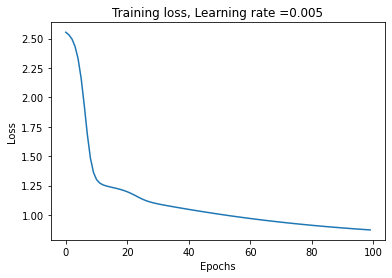

Train cost after epoch 0: 1.290617
Train cost after epoch 10: 1.232723
Train cost after epoch 20: 1.195435
Train cost after epoch 30: 1.159305
Train cost after epoch 40: 1.124629
Train cost after epoch 50: 1.091488
Train cost after epoch 60: 1.060045
Train cost after epoch 70: 1.030406
Train cost after epoch 80: 1.002679
Train cost after epoch 90: 0.976949


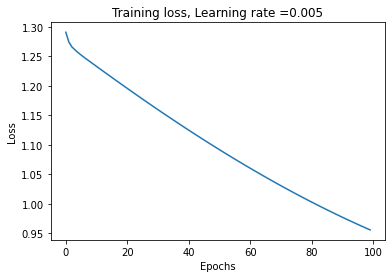

Train cost after epoch 0: 2.946296
Train cost after epoch 10: 2.883671
Train cost after epoch 20: 2.334010
Train cost after epoch 30: 1.617265
Train cost after epoch 40: 1.260152
Train cost after epoch 50: 1.148899
Train cost after epoch 60: 1.041759
Train cost after epoch 70: 0.826928
Train cost after epoch 80: 0.805113
Train cost after epoch 90: 0.807095


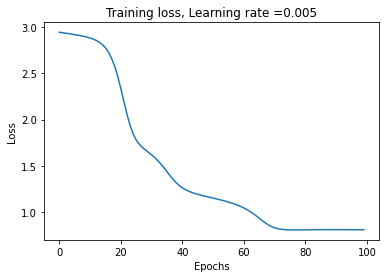

Train cost after epoch 0: 4.419578
Train cost after epoch 10: 3.671358
Train cost after epoch 20: 2.408212
Train cost after epoch 30: 2.311435
Train cost after epoch 40: 2.147786
Train cost after epoch 50: 1.435760
Train cost after epoch 60: 0.806863
Train cost after epoch 70: 0.813412
Train cost after epoch 80: 0.805739
Train cost after epoch 90: 0.804302


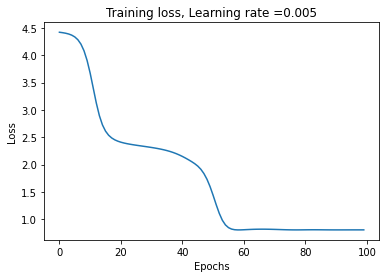

Train cost after epoch 0: 3.676981
Train cost after epoch 10: 2.396671
Train cost after epoch 20: 2.012708
Train cost after epoch 30: 1.940614
Train cost after epoch 40: 1.796238
Train cost after epoch 50: 0.985861
Train cost after epoch 60: 0.932588
Train cost after epoch 70: 0.896615
Train cost after epoch 80: 0.868901
Train cost after epoch 90: 0.848362


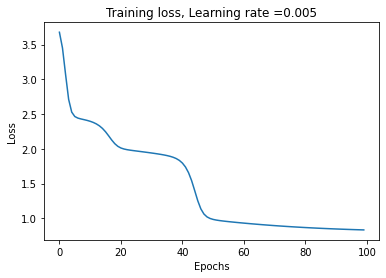

Train cost after epoch 0: 1.810171
Train cost after epoch 10: 1.744287
Train cost after epoch 20: 1.685126
Train cost after epoch 30: 0.806645
Train cost after epoch 40: 0.804907
Train cost after epoch 50: 0.804985
Train cost after epoch 60: 0.805009
Train cost after epoch 70: 0.804930
Train cost after epoch 80: 0.804895
Train cost after epoch 90: 0.804895


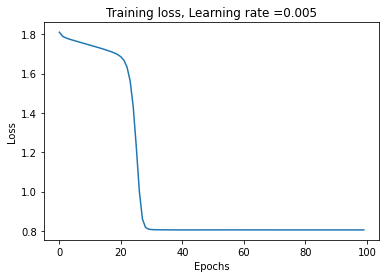

Train cost after epoch 0: 1.799194
Train cost after epoch 10: 1.093989
Train cost after epoch 20: 1.018233
Train cost after epoch 30: 0.950155
Train cost after epoch 40: 0.914887
Train cost after epoch 50: 0.885693
Train cost after epoch 60: 0.862463
Train cost after epoch 70: 0.844742
Train cost after epoch 80: 0.831673
Train cost after epoch 90: 0.822341


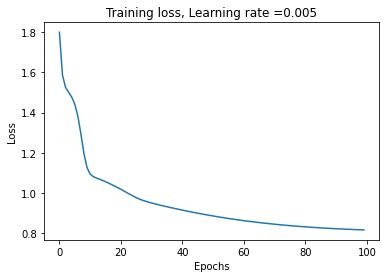

Train cost after epoch 0: 2.513812
Train cost after epoch 10: 2.246456
Train cost after epoch 20: 1.984171
Train cost after epoch 30: 1.816203
Train cost after epoch 40: 1.202264
Train cost after epoch 50: 1.148522
Train cost after epoch 60: 1.099023
Train cost after epoch 70: 1.054762
Train cost after epoch 80: 1.015679
Train cost after epoch 90: 0.981319


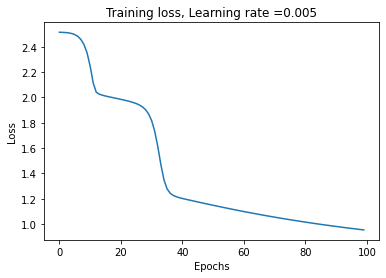

Train cost after epoch 0: 2.825429
Train cost after epoch 10: 1.529214
Train cost after epoch 20: 1.424240
Train cost after epoch 30: 1.233022
Train cost after epoch 40: 1.168471
Train cost after epoch 50: 1.119236
Train cost after epoch 60: 1.075428
Train cost after epoch 70: 1.036307
Train cost after epoch 80: 1.001426
Train cost after epoch 90: 0.970421


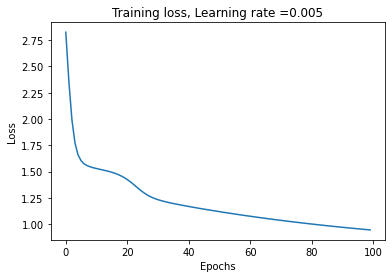

Train cost after epoch 0: 2.418281
Train cost after epoch 10: 0.971920
Train cost after epoch 20: 0.813365
Train cost after epoch 30: 0.813765
Train cost after epoch 40: 0.809970
Train cost after epoch 50: 0.806955
Train cost after epoch 60: 0.805416
Train cost after epoch 70: 0.804877
Train cost after epoch 80: 0.804768
Train cost after epoch 90: 0.804767


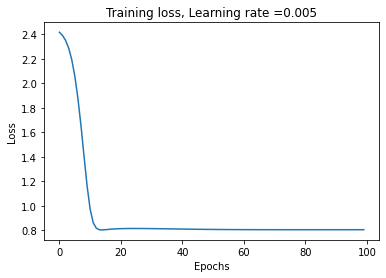

Train cost after epoch 0: 2.733336
Train cost after epoch 10: 2.103783
Train cost after epoch 20: 1.182907
Train cost after epoch 30: 1.139840
Train cost after epoch 40: 1.095118
Train cost after epoch 50: 0.973728
Train cost after epoch 60: 0.829655
Train cost after epoch 70: 0.812197
Train cost after epoch 80: 0.806265
Train cost after epoch 90: 0.804917


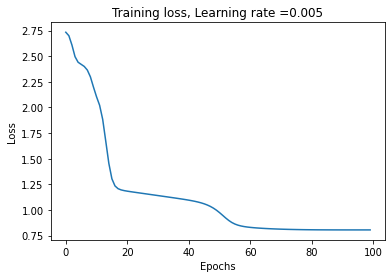

Train cost after epoch 0: 1.184054
Train cost after epoch 10: 1.105787
Train cost after epoch 20: 1.072336
Train cost after epoch 30: 1.040247
Train cost after epoch 40: 0.918560
Train cost after epoch 50: 0.865857
Train cost after epoch 60: 0.817695
Train cost after epoch 70: 0.805239
Train cost after epoch 80: 0.805010
Train cost after epoch 90: 0.805004


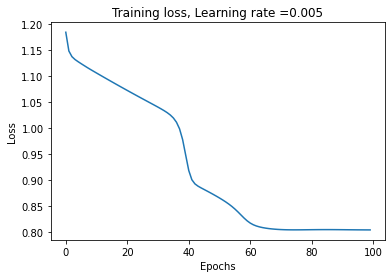

Train cost after epoch 0: 3.974185
Train cost after epoch 10: 3.756971
Train cost after epoch 20: 1.352019
Train cost after epoch 30: 1.304605
Train cost after epoch 40: 1.252900
Train cost after epoch 50: 1.153722
Train cost after epoch 60: 1.094765
Train cost after epoch 70: 1.042337
Train cost after epoch 80: 0.997230
Train cost after epoch 90: 0.959161


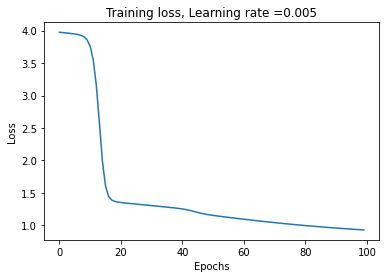

Train cost after epoch 0: 1.920959
Train cost after epoch 10: 1.875558
Train cost after epoch 20: 1.822526
Train cost after epoch 30: 1.308120
Train cost after epoch 40: 0.805138
Train cost after epoch 50: 0.806179
Train cost after epoch 60: 0.805483
Train cost after epoch 70: 0.804963
Train cost after epoch 80: 0.804926
Train cost after epoch 90: 0.804938


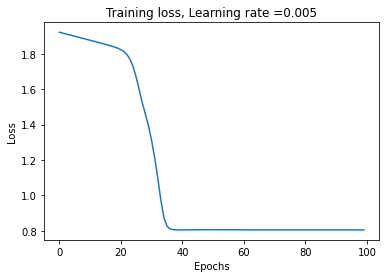

Train cost after epoch 0: 3.739510
Train cost after epoch 10: 2.911305
Train cost after epoch 20: 2.161300
Train cost after epoch 30: 1.496482
Train cost after epoch 40: 1.146728
Train cost after epoch 50: 1.094592
Train cost after epoch 60: 1.049352
Train cost after epoch 70: 1.009578
Train cost after epoch 80: 0.974856
Train cost after epoch 90: 0.944701


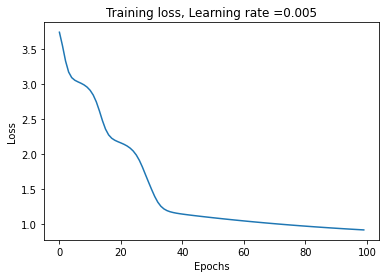

Train cost after epoch 0: 2.689061
Train cost after epoch 10: 2.627752
Train cost after epoch 20: 2.579669
Train cost after epoch 30: 2.526740
Train cost after epoch 40: 2.190852
Train cost after epoch 50: 1.548948
Train cost after epoch 60: 1.386426
Train cost after epoch 70: 1.249157
Train cost after epoch 80: 0.892208
Train cost after epoch 90: 0.809305


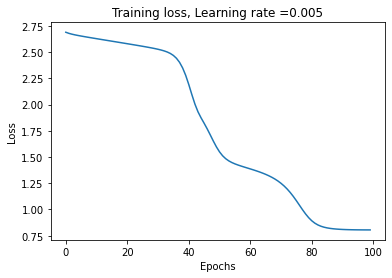

Train cost after epoch 0: 1.715157
Train cost after epoch 10: 1.670959
Train cost after epoch 20: 1.627319
Train cost after epoch 30: 1.565236
Train cost after epoch 40: 1.084589
Train cost after epoch 50: 1.013956
Train cost after epoch 60: 0.970663
Train cost after epoch 70: 0.934151
Train cost after epoch 80: 0.904176
Train cost after epoch 90: 0.879979


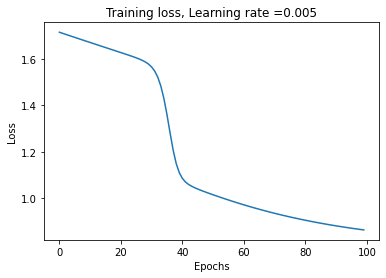

Train cost after epoch 0: 3.077395
Train cost after epoch 10: 2.599706
Train cost after epoch 20: 2.019902
Train cost after epoch 30: 1.661987
Train cost after epoch 40: 1.432853
Train cost after epoch 50: 1.374699
Train cost after epoch 60: 1.319377
Train cost after epoch 70: 1.268114
Train cost after epoch 80: 1.220737
Train cost after epoch 90: 1.176847


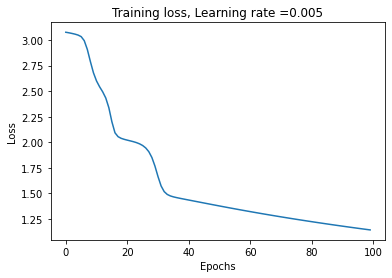

Train cost after epoch 0: 2.802609
Train cost after epoch 10: 2.739942
Train cost after epoch 20: 1.553890
Train cost after epoch 30: 0.917208
Train cost after epoch 40: 0.805447
Train cost after epoch 50: 0.804726
Train cost after epoch 60: 0.804397
Train cost after epoch 70: 0.803633
Train cost after epoch 80: 0.803259
Train cost after epoch 90: 0.802476


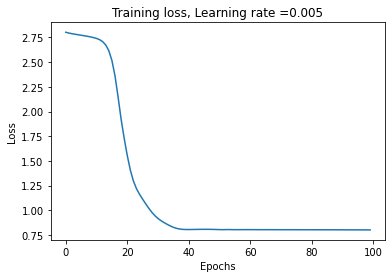

Train cost after epoch 0: 2.429272
Train cost after epoch 10: 2.374994
Train cost after epoch 20: 2.242054
Train cost after epoch 30: 0.905796
Train cost after epoch 40: 0.877966
Train cost after epoch 50: 0.855500
Train cost after epoch 60: 0.838444
Train cost after epoch 70: 0.826225
Train cost after epoch 80: 0.817886
Train cost after epoch 90: 0.812459


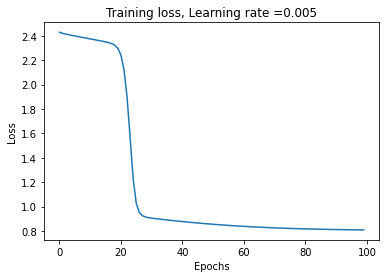

Train cost after epoch 0: 3.162841
Train cost after epoch 10: 2.615543
Train cost after epoch 20: 2.565777
Train cost after epoch 30: 2.484025
Train cost after epoch 40: 0.879884
Train cost after epoch 50: 0.827992
Train cost after epoch 60: 0.815160
Train cost after epoch 70: 0.808735
Train cost after epoch 80: 0.806009
Train cost after epoch 90: 0.805100


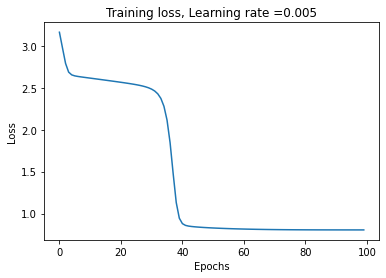

Train cost after epoch 0: 2.637383
Train cost after epoch 10: 2.347528
Train cost after epoch 20: 2.289675
Train cost after epoch 30: 2.230558
Train cost after epoch 40: 1.861873
Train cost after epoch 50: 1.494106
Train cost after epoch 60: 1.421951
Train cost after epoch 70: 1.353811
Train cost after epoch 80: 1.226961
Train cost after epoch 90: 0.824351


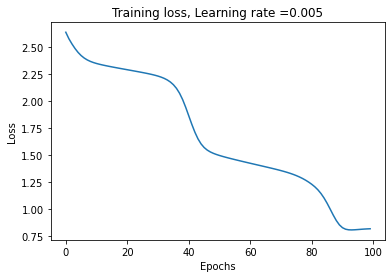

Train cost after epoch 0: 4.303860
Train cost after epoch 10: 1.328731
Train cost after epoch 20: 0.821712
Train cost after epoch 30: 0.809945
Train cost after epoch 40: 0.806460
Train cost after epoch 50: 0.805217
Train cost after epoch 60: 0.804894
Train cost after epoch 70: 0.804818
Train cost after epoch 80: 0.804713
Train cost after epoch 90: 0.804611


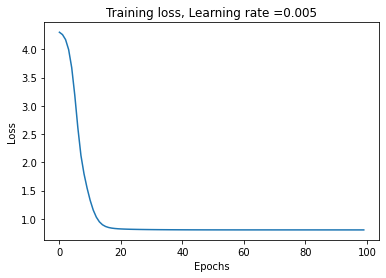

Train cost after epoch 0: 2.100704
Train cost after epoch 10: 1.997502
Train cost after epoch 20: 1.890203
Train cost after epoch 30: 1.461960
Train cost after epoch 40: 1.294238
Train cost after epoch 50: 1.238436
Train cost after epoch 60: 1.186533
Train cost after epoch 70: 1.139337
Train cost after epoch 80: 1.096607
Train cost after epoch 90: 1.057919


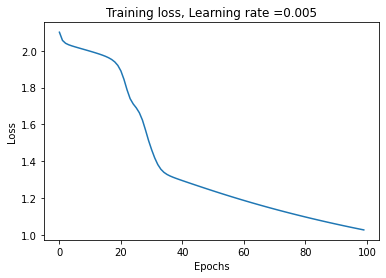

Train cost after epoch 0: 0.833549
Train cost after epoch 10: 0.816554
Train cost after epoch 20: 0.807933
Train cost after epoch 30: 0.805261
Train cost after epoch 40: 0.803732
Train cost after epoch 50: 0.802594
Train cost after epoch 60: 0.801748
Train cost after epoch 70: 0.801462
Train cost after epoch 80: 0.801265
Train cost after epoch 90: 0.801185


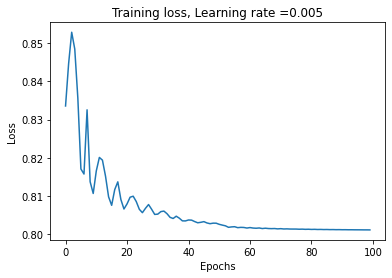

Train cost after epoch 0: 3.574855
Train cost after epoch 10: 3.405473
Train cost after epoch 20: 1.917872
Train cost after epoch 30: 1.441137
Train cost after epoch 40: 1.138776
Train cost after epoch 50: 1.047971
Train cost after epoch 60: 0.998285
Train cost after epoch 70: 0.958022
Train cost after epoch 80: 0.924830
Train cost after epoch 90: 0.897626


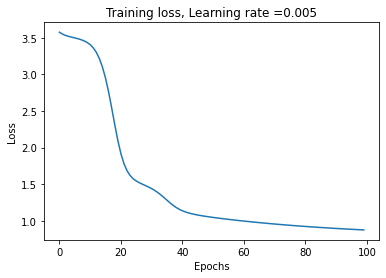

Train cost after epoch 0: 2.541787
Train cost after epoch 10: 1.593505
Train cost after epoch 20: 1.254187
Train cost after epoch 30: 1.209330
Train cost after epoch 40: 1.165293
Train cost after epoch 50: 1.123802
Train cost after epoch 60: 1.085388
Train cost after epoch 70: 1.050047
Train cost after epoch 80: 1.017656
Train cost after epoch 90: 0.988114


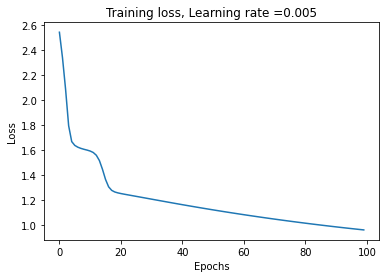

Train cost after epoch 0: 1.951329
Train cost after epoch 10: 1.655089
Train cost after epoch 20: 1.610931
Train cost after epoch 30: 1.567468
Train cost after epoch 40: 1.508652
Train cost after epoch 50: 0.904997
Train cost after epoch 60: 0.857374
Train cost after epoch 70: 0.834426
Train cost after epoch 80: 0.819892
Train cost after epoch 90: 0.811729


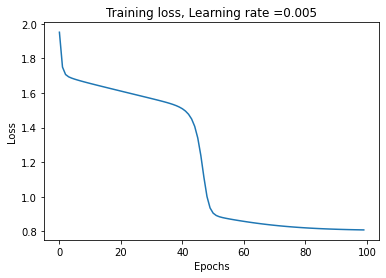

Train cost after epoch 0: 2.802213
Train cost after epoch 10: 1.995900
Train cost after epoch 20: 1.948462
Train cost after epoch 30: 1.900588
Train cost after epoch 40: 1.812124
Train cost after epoch 50: 1.746410
Train cost after epoch 60: 1.680447
Train cost after epoch 70: 1.618155
Train cost after epoch 80: 1.559895
Train cost after epoch 90: 1.505159


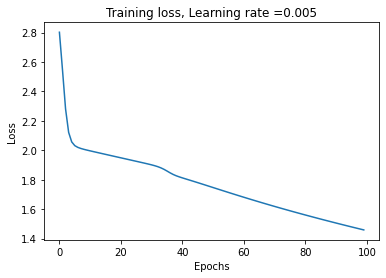

Train cost after epoch 0: 3.061867
Train cost after epoch 10: 2.103256
Train cost after epoch 20: 1.905005
Train cost after epoch 30: 1.456019
Train cost after epoch 40: 0.804404
Train cost after epoch 50: 0.810870
Train cost after epoch 60: 0.807250
Train cost after epoch 70: 0.805007
Train cost after epoch 80: 0.805132
Train cost after epoch 90: 0.804940


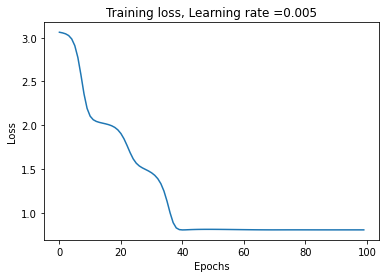

Train cost after epoch 0: 1.720794
Train cost after epoch 10: 1.318108
Train cost after epoch 20: 1.132624
Train cost after epoch 30: 0.908261
Train cost after epoch 40: 0.879349
Train cost after epoch 50: 0.856834
Train cost after epoch 60: 0.839800
Train cost after epoch 70: 0.827515
Train cost after epoch 80: 0.819029
Train cost after epoch 90: 0.813417


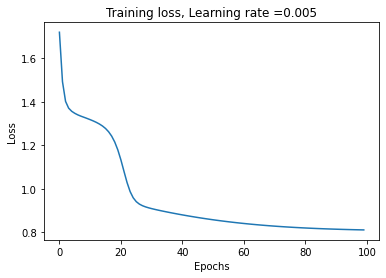

Train cost after epoch 0: 1.920589
Train cost after epoch 10: 1.641036
Train cost after epoch 20: 1.437005
Train cost after epoch 30: 0.827351
Train cost after epoch 40: 0.810344
Train cost after epoch 50: 0.806148
Train cost after epoch 60: 0.804725
Train cost after epoch 70: 0.804146
Train cost after epoch 80: 0.804000
Train cost after epoch 90: 0.803960


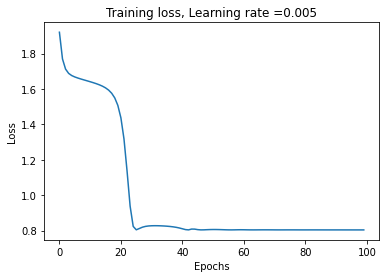

Train cost after epoch 0: 2.139036
Train cost after epoch 10: 1.914959
Train cost after epoch 20: 1.850808
Train cost after epoch 30: 1.170891
Train cost after epoch 40: 1.095684
Train cost after epoch 50: 1.021547
Train cost after epoch 60: 0.851420
Train cost after epoch 70: 0.831281
Train cost after epoch 80: 0.811899
Train cost after epoch 90: 0.806242


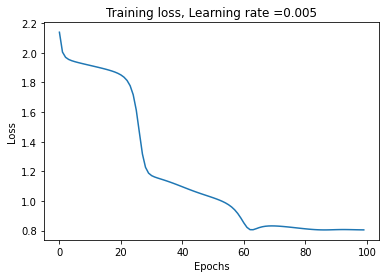

Train cost after epoch 0: 1.481915
Train cost after epoch 10: 1.245230
Train cost after epoch 20: 1.064485
Train cost after epoch 30: 1.028454
Train cost after epoch 40: 0.994566
Train cost after epoch 50: 0.963929
Train cost after epoch 60: 0.936711
Train cost after epoch 70: 0.912830
Train cost after epoch 80: 0.892136
Train cost after epoch 90: 0.874445


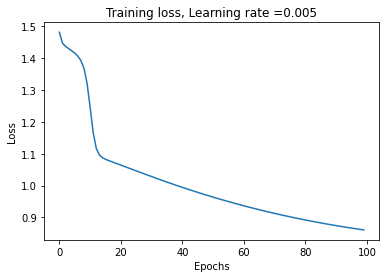

Train cost after epoch 0: 1.924845
Train cost after epoch 10: 1.877992
Train cost after epoch 20: 1.832860
Train cost after epoch 30: 1.788103
Train cost after epoch 40: 1.743733
Train cost after epoch 50: 1.698622
Train cost after epoch 60: 1.394030
Train cost after epoch 70: 0.928586
Train cost after epoch 80: 0.901134
Train cost after epoch 90: 0.815352


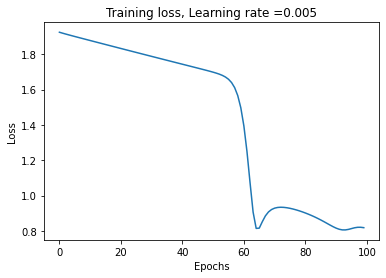

Train cost after epoch 0: 3.279652
Train cost after epoch 10: 3.107853
Train cost after epoch 20: 1.513828
Train cost after epoch 30: 1.322012
Train cost after epoch 40: 1.268312
Train cost after epoch 50: 1.101747
Train cost after epoch 60: 0.812561
Train cost after epoch 70: 0.815380
Train cost after epoch 80: 0.807877
Train cost after epoch 90: 0.804768


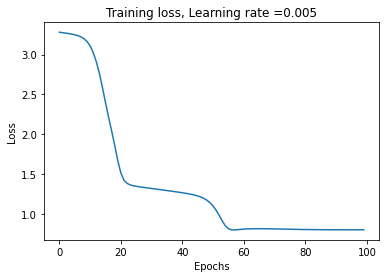

Train cost after epoch 0: 3.004698
Train cost after epoch 10: 2.533855
Train cost after epoch 20: 2.064874
Train cost after epoch 30: 1.977090
Train cost after epoch 40: 1.279349
Train cost after epoch 50: 0.814534
Train cost after epoch 60: 0.816931
Train cost after epoch 70: 0.810694
Train cost after epoch 80: 0.806600
Train cost after epoch 90: 0.805163


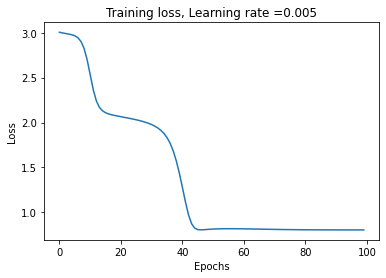

Train cost after epoch 0: 2.911188
Train cost after epoch 10: 2.309358
Train cost after epoch 20: 2.250632
Train cost after epoch 30: 1.845781
Train cost after epoch 40: 1.292680
Train cost after epoch 50: 1.228979
Train cost after epoch 60: 1.159566
Train cost after epoch 70: 1.087590
Train cost after epoch 80: 1.021525
Train cost after epoch 90: 0.909162


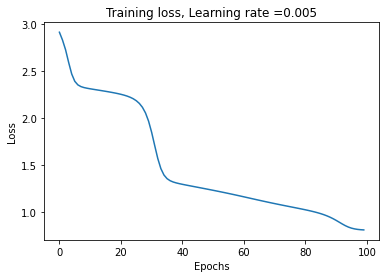

Train cost after epoch 0: 2.491086
Train cost after epoch 10: 2.356226
Train cost after epoch 20: 2.168392
Train cost after epoch 30: 1.894483
Train cost after epoch 40: 1.123139
Train cost after epoch 50: 0.975657
Train cost after epoch 60: 0.935033
Train cost after epoch 70: 0.902002
Train cost after epoch 80: 0.875910
Train cost after epoch 90: 0.855778


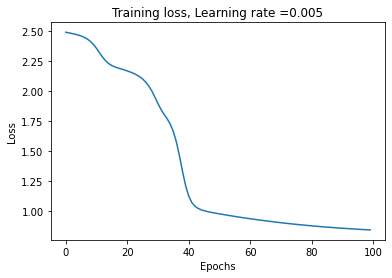

Train cost after epoch 0: 2.514420
Train cost after epoch 10: 2.431132
Train cost after epoch 20: 2.137029
Train cost after epoch 30: 1.985542
Train cost after epoch 40: 1.419240
Train cost after epoch 50: 0.843944
Train cost after epoch 60: 0.808999
Train cost after epoch 70: 0.808838
Train cost after epoch 80: 0.807837
Train cost after epoch 90: 0.807459


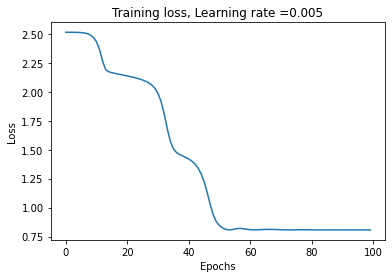

Train cost after epoch 0: 1.570462
Train cost after epoch 10: 1.515789
Train cost after epoch 20: 1.473533
Train cost after epoch 30: 1.428160
Train cost after epoch 40: 1.126554
Train cost after epoch 50: 1.016042
Train cost after epoch 60: 0.970632
Train cost after epoch 70: 0.915363
Train cost after epoch 80: 0.861218
Train cost after epoch 90: 0.831258


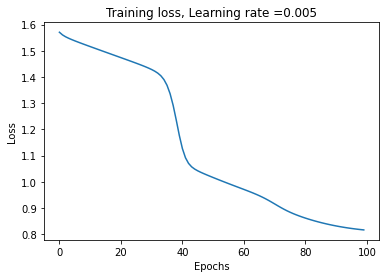

Train cost after epoch 0: 1.788751
Train cost after epoch 10: 1.732033
Train cost after epoch 20: 1.687889
Train cost after epoch 30: 1.644143
Train cost after epoch 40: 1.492469
Train cost after epoch 50: 1.332396
Train cost after epoch 60: 1.271819
Train cost after epoch 70: 1.214997
Train cost after epoch 80: 1.163602
Train cost after epoch 90: 1.117338


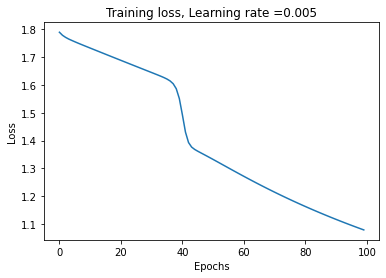

Train cost after epoch 0: 1.381610
Train cost after epoch 10: 1.313391
Train cost after epoch 20: 1.274298
Train cost after epoch 30: 1.236214
Train cost after epoch 40: 1.199149
Train cost after epoch 50: 1.153075
Train cost after epoch 60: 1.003959
Train cost after epoch 70: 0.953380
Train cost after epoch 80: 0.911200
Train cost after epoch 90: 0.878590


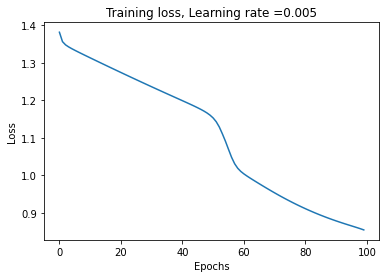

Train cost after epoch 0: 2.462248
Train cost after epoch 10: 1.799188
Train cost after epoch 20: 1.751516
Train cost after epoch 30: 1.704829
Train cost after epoch 40: 1.658867
Train cost after epoch 50: 1.613789
Train cost after epoch 60: 1.569607
Train cost after epoch 70: 1.526308
Train cost after epoch 80: 1.483887
Train cost after epoch 90: 1.442356


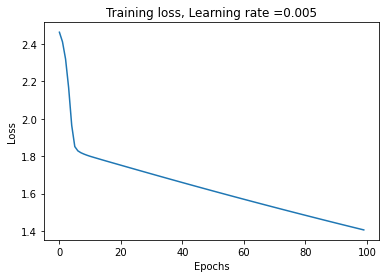

Train cost after epoch 0: 2.159104
Train cost after epoch 10: 1.986632
Train cost after epoch 20: 1.939267
Train cost after epoch 30: 1.892556
Train cost after epoch 40: 1.846362
Train cost after epoch 50: 1.794836
Train cost after epoch 60: 1.599856
Train cost after epoch 70: 1.510574
Train cost after epoch 80: 1.425648
Train cost after epoch 90: 1.336480


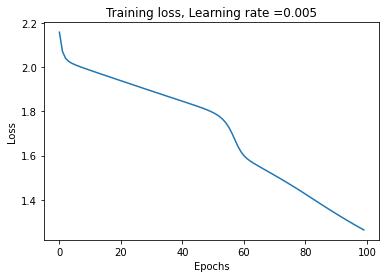

Train cost after epoch 0: 2.517391
Train cost after epoch 10: 2.510048
Train cost after epoch 20: 1.831394
Train cost after epoch 30: 1.093810
Train cost after epoch 40: 1.051854
Train cost after epoch 50: 1.012922
Train cost after epoch 60: 0.978267
Train cost after epoch 70: 0.947901
Train cost after epoch 80: 0.921554
Train cost after epoch 90: 0.898920


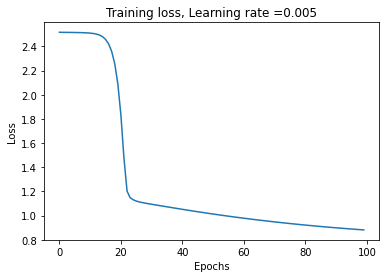

Train cost after epoch 0: 2.491357
Train cost after epoch 10: 1.609334
Train cost after epoch 20: 1.556582
Train cost after epoch 30: 1.509834
Train cost after epoch 40: 1.462821
Train cost after epoch 50: 1.147314
Train cost after epoch 60: 0.885415
Train cost after epoch 70: 0.864249
Train cost after epoch 80: 0.839594
Train cost after epoch 90: 0.822891


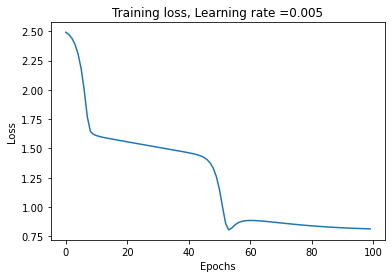

Train cost after epoch 0: 3.209141
Train cost after epoch 10: 2.975029
Train cost after epoch 20: 1.311155
Train cost after epoch 30: 1.244676
Train cost after epoch 40: 1.198178
Train cost after epoch 50: 1.153535
Train cost after epoch 60: 1.027983
Train cost after epoch 70: 0.872878
Train cost after epoch 80: 0.841314
Train cost after epoch 90: 0.822276


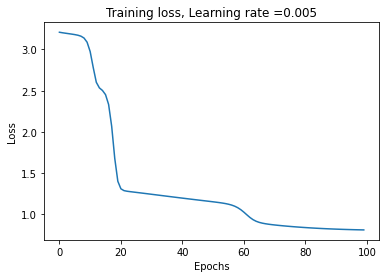

Train cost after epoch 0: 2.713928
Train cost after epoch 10: 2.623661
Train cost after epoch 20: 2.019446
Train cost after epoch 30: 1.667643
Train cost after epoch 40: 1.527393
Train cost after epoch 50: 1.436186
Train cost after epoch 60: 1.369392
Train cost after epoch 70: 1.309604
Train cost after epoch 80: 1.255320
Train cost after epoch 90: 1.205763


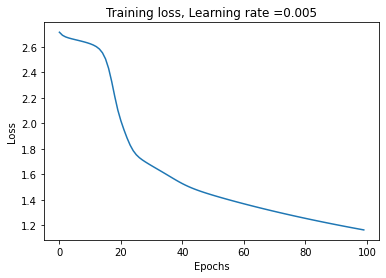

Train cost after epoch 0: 2.160562
Train cost after epoch 10: 0.808378
Train cost after epoch 20: 0.805097
Train cost after epoch 30: 0.803410
Train cost after epoch 40: 0.802203
Train cost after epoch 50: 0.801424
Train cost after epoch 60: 0.800769
Train cost after epoch 70: 0.800213
Train cost after epoch 80: 0.799763
Train cost after epoch 90: 0.799423


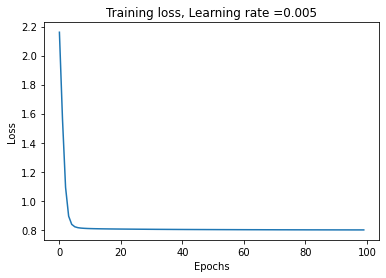

Train cost after epoch 0: 2.057752
Train cost after epoch 10: 1.184058
Train cost after epoch 20: 1.147242
Train cost after epoch 30: 1.111968
Train cost after epoch 40: 1.078416
Train cost after epoch 50: 1.046744
Train cost after epoch 60: 1.017071
Train cost after epoch 70: 0.989490
Train cost after epoch 80: 0.964077
Train cost after epoch 90: 0.940885


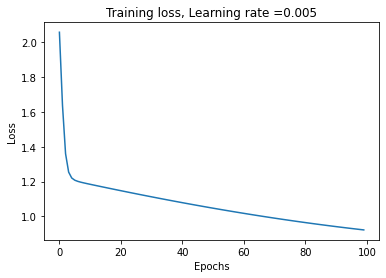

Train cost after epoch 0: 3.585481
Train cost after epoch 10: 3.110216
Train cost after epoch 20: 2.331732
Train cost after epoch 30: 1.639035
Train cost after epoch 40: 0.837352
Train cost after epoch 50: 0.820746
Train cost after epoch 60: 0.811998
Train cost after epoch 70: 0.807585
Train cost after epoch 80: 0.805706
Train cost after epoch 90: 0.805061


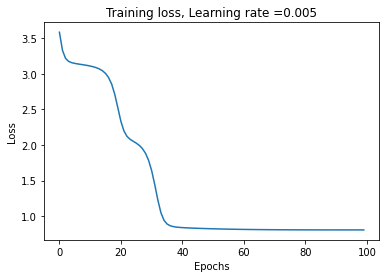

Train cost after epoch 0: 0.847671
Train cost after epoch 10: 0.832224
Train cost after epoch 20: 0.821187
Train cost after epoch 30: 0.813329
Train cost after epoch 40: 0.807454
Train cost after epoch 50: 0.802942
Train cost after epoch 60: 0.800021
Train cost after epoch 70: 0.798714
Train cost after epoch 80: 0.798013
Train cost after epoch 90: 0.797655


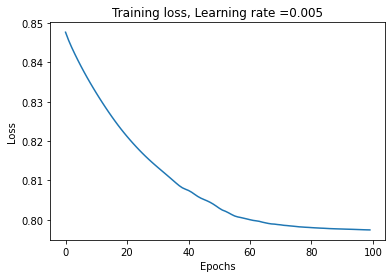

Train cost after epoch 0: 3.901468
Train cost after epoch 10: 3.731757
Train cost after epoch 20: 1.412252
Train cost after epoch 30: 1.173330
Train cost after epoch 40: 0.813993
Train cost after epoch 50: 0.805988
Train cost after epoch 60: 0.804909
Train cost after epoch 70: 0.804978
Train cost after epoch 80: 0.804994
Train cost after epoch 90: 0.804932


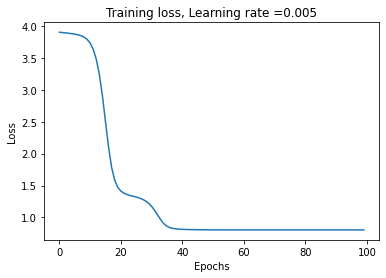

Train cost after epoch 0: 3.209024
Train cost after epoch 10: 1.112786
Train cost after epoch 20: 1.076447
Train cost after epoch 30: 1.042407
Train cost after epoch 40: 1.011076
Train cost after epoch 50: 0.982146
Train cost after epoch 60: 0.955721
Train cost after epoch 70: 0.931830
Train cost after epoch 80: 0.910496
Train cost after epoch 90: 0.891672


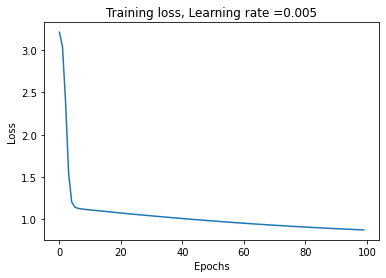

Train cost after epoch 0: 3.756296
Train cost after epoch 10: 3.156152
Train cost after epoch 20: 1.501921
Train cost after epoch 30: 1.421546
Train cost after epoch 40: 1.288887
Train cost after epoch 50: 0.921212
Train cost after epoch 60: 0.873495
Train cost after epoch 70: 0.846923
Train cost after epoch 80: 0.829254
Train cost after epoch 90: 0.818192


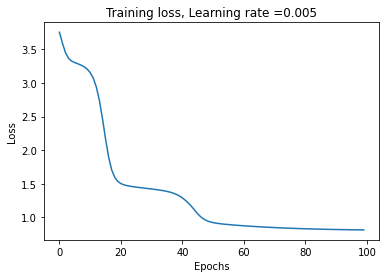

Train cost after epoch 0: 1.343418
Train cost after epoch 10: 1.297377
Train cost after epoch 20: 1.257997
Train cost after epoch 30: 1.149848
Train cost after epoch 40: 1.037775
Train cost after epoch 50: 0.994471
Train cost after epoch 60: 0.956044
Train cost after epoch 70: 0.923601
Train cost after epoch 80: 0.896783
Train cost after epoch 90: 0.874943


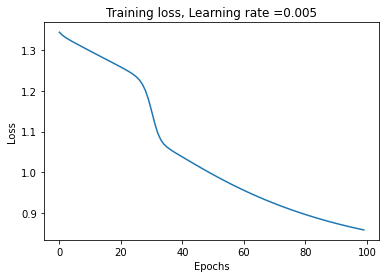

Train cost after epoch 0: 2.412645
Train cost after epoch 10: 2.364856
Train cost after epoch 20: 1.170274
Train cost after epoch 30: 0.916646
Train cost after epoch 40: 0.888012
Train cost after epoch 50: 0.821081
Train cost after epoch 60: 0.810001
Train cost after epoch 70: 0.809612
Train cost after epoch 80: 0.808956
Train cost after epoch 90: 0.808754


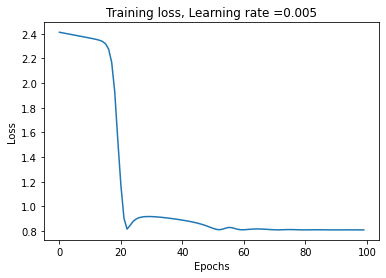

Train cost after epoch 0: 2.076804
Train cost after epoch 10: 1.838124
Train cost after epoch 20: 0.821766
Train cost after epoch 30: 0.810907
Train cost after epoch 40: 0.806527
Train cost after epoch 50: 0.803715
Train cost after epoch 60: 0.800934
Train cost after epoch 70: 0.799293
Train cost after epoch 80: 0.798231
Train cost after epoch 90: 0.797871


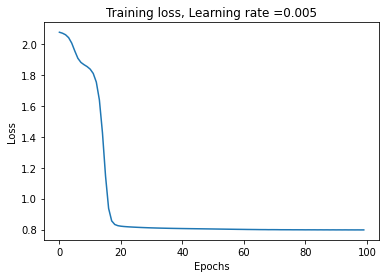

Train cost after epoch 0: 2.972706
Train cost after epoch 10: 2.832843
Train cost after epoch 20: 1.443395
Train cost after epoch 30: 1.120927
Train cost after epoch 40: 0.911258
Train cost after epoch 50: 0.880194
Train cost after epoch 60: 0.856167
Train cost after epoch 70: 0.838480
Train cost after epoch 80: 0.826064
Train cost after epoch 90: 0.817714


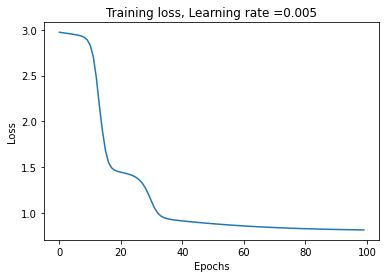

Train cost after epoch 0: 2.840590
Train cost after epoch 10: 2.195257
Train cost after epoch 20: 2.077982
Train cost after epoch 30: 1.744201
Train cost after epoch 40: 1.167645
Train cost after epoch 50: 1.082503
Train cost after epoch 60: 0.882562
Train cost after epoch 70: 0.805054
Train cost after epoch 80: 0.806430
Train cost after epoch 90: 0.804293


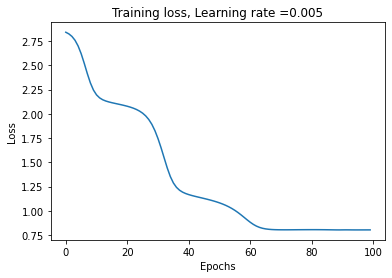

Train cost after epoch 0: 1.535054
Train cost after epoch 10: 1.491679
Train cost after epoch 20: 1.449918
Train cost after epoch 30: 1.408849
Train cost after epoch 40: 1.368514
Train cost after epoch 50: 1.305958
Train cost after epoch 60: 0.824101
Train cost after epoch 70: 0.810921
Train cost after epoch 80: 0.805839
Train cost after epoch 90: 0.804899


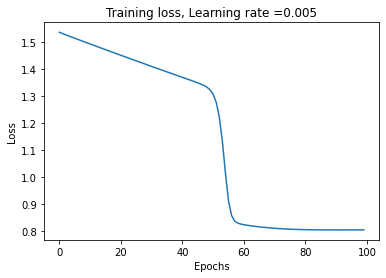

__________________________________________________ 0.5% GA is running...Train cost after epoch 0: 2.849049
Train cost after epoch 10: 1.780611
Train cost after epoch 20: 1.734565
Train cost after epoch 30: 1.688311
Train cost after epoch 40: 1.628372
Train cost after epoch 50: 1.362654
Train cost after epoch 60: 1.266590
Train cost after epoch 70: 1.162126
Train cost after epoch 80: 0.940065
Train cost after epoch 90: 0.883685


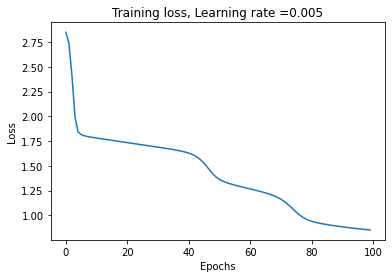

Train cost after epoch 0: 5.369292
Train cost after epoch 10: 2.864507
Train cost after epoch 20: 1.984707
Train cost after epoch 30: 1.363096
Train cost after epoch 40: 1.308385
Train cost after epoch 50: 1.254884
Train cost after epoch 60: 1.017484
Train cost after epoch 70: 0.883775
Train cost after epoch 80: 0.832674
Train cost after epoch 90: 0.814344


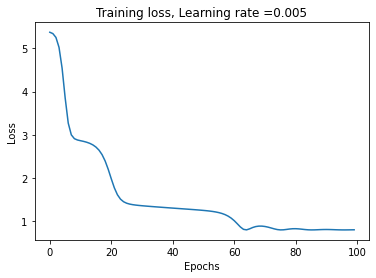

Train cost after epoch 0: 3.126399
Train cost after epoch 10: 2.427780
Train cost after epoch 20: 1.661325
Train cost after epoch 30: 1.539521
Train cost after epoch 40: 1.287578
Train cost after epoch 50: 1.202870
Train cost after epoch 60: 1.040006
Train cost after epoch 70: 0.980749
Train cost after epoch 80: 0.935087
Train cost after epoch 90: 0.899133


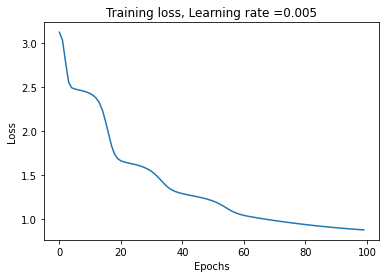

Train cost after epoch 0: 1.423546
Train cost after epoch 10: 1.382423
Train cost after epoch 20: 1.342210
Train cost after epoch 30: 1.302860
Train cost after epoch 40: 1.264503
Train cost after epoch 50: 1.227259
Train cost after epoch 60: 1.191237
Train cost after epoch 70: 1.156541
Train cost after epoch 80: 1.123274
Train cost after epoch 90: 1.091534


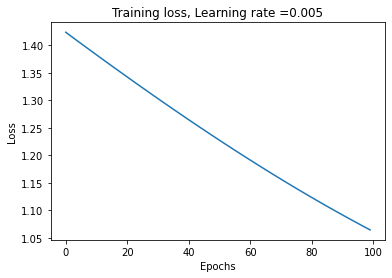

Train cost after epoch 0: 3.045166
Train cost after epoch 10: 1.705073
Train cost after epoch 20: 1.657343
Train cost after epoch 30: 1.608114
Train cost after epoch 40: 1.351952
Train cost after epoch 50: 1.011114
Train cost after epoch 60: 0.851776
Train cost after epoch 70: 0.813791
Train cost after epoch 80: 0.810041
Train cost after epoch 90: 0.810522


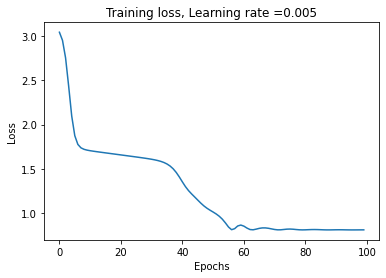

Train cost after epoch 0: 2.683332
Train cost after epoch 10: 2.493061
Train cost after epoch 20: 1.089784
Train cost after epoch 30: 0.820400
Train cost after epoch 40: 0.807504
Train cost after epoch 50: 0.805855
Train cost after epoch 60: 0.805331
Train cost after epoch 70: 0.805147
Train cost after epoch 80: 0.805058
Train cost after epoch 90: 0.805002


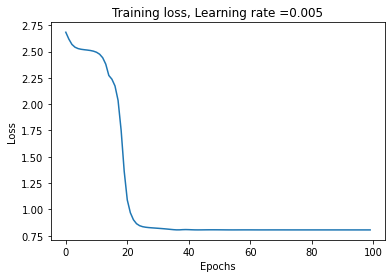

Train cost after epoch 0: 3.400263
Train cost after epoch 10: 3.253536
Train cost after epoch 20: 2.211948
Train cost after epoch 30: 1.143645
Train cost after epoch 40: 1.011303
Train cost after epoch 50: 0.908211
Train cost after epoch 60: 0.874227
Train cost after epoch 70: 0.848578
Train cost after epoch 80: 0.830924
Train cost after epoch 90: 0.819577


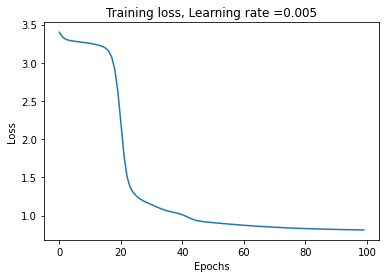

Train cost after epoch 0: 3.386303
Train cost after epoch 10: 2.052455
Train cost after epoch 20: 1.749206
Train cost after epoch 30: 1.580250
Train cost after epoch 40: 1.381360
Train cost after epoch 50: 0.855642
Train cost after epoch 60: 0.823083
Train cost after epoch 70: 0.811286
Train cost after epoch 80: 0.806541
Train cost after epoch 90: 0.805121


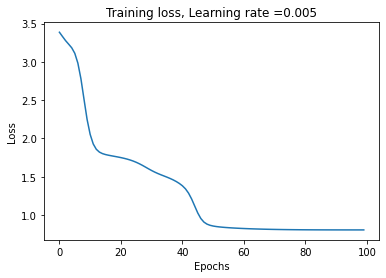

Train cost after epoch 0: 2.218529
Train cost after epoch 10: 1.851158
Train cost after epoch 20: 1.801207
Train cost after epoch 30: 1.735450
Train cost after epoch 40: 0.946504
Train cost after epoch 50: 0.899792
Train cost after epoch 60: 0.870202
Train cost after epoch 70: 0.847899
Train cost after epoch 80: 0.832101
Train cost after epoch 90: 0.821429


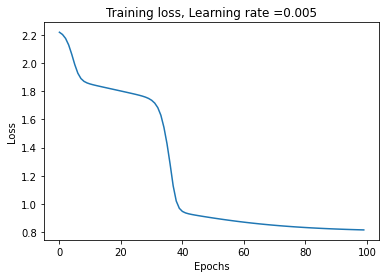

Train cost after epoch 0: 2.527590
Train cost after epoch 10: 2.469229
Train cost after epoch 20: 1.858253
Train cost after epoch 30: 0.824878
Train cost after epoch 40: 0.805219
Train cost after epoch 50: 0.806691
Train cost after epoch 60: 0.806086
Train cost after epoch 70: 0.805493
Train cost after epoch 80: 0.805237
Train cost after epoch 90: 0.805171


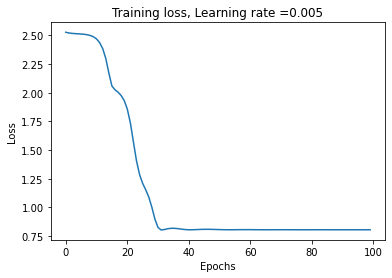

Train cost after epoch 0: 2.412214
Train cost after epoch 10: 2.311759
Train cost after epoch 20: 0.959368
Train cost after epoch 30: 0.915574
Train cost after epoch 40: 0.888877
Train cost after epoch 50: 0.866607
Train cost after epoch 60: 0.843672
Train cost after epoch 70: 0.816460
Train cost after epoch 80: 0.805894
Train cost after epoch 90: 0.804449


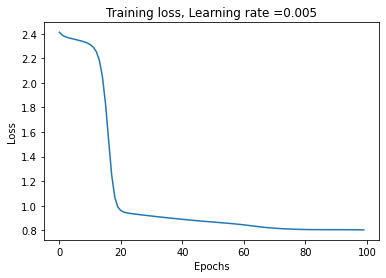

Train cost after epoch 0: 3.857042
Train cost after epoch 10: 2.463716
Train cost after epoch 20: 1.899086
Train cost after epoch 30: 1.756532
Train cost after epoch 40: 1.593958
Train cost after epoch 50: 1.155135
Train cost after epoch 60: 0.812316
Train cost after epoch 70: 0.804026
Train cost after epoch 80: 0.804934
Train cost after epoch 90: 0.805110


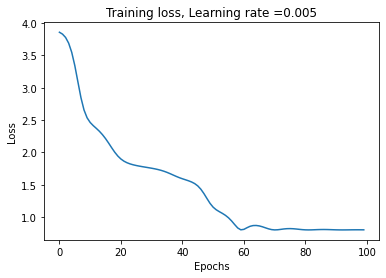

Train cost after epoch 0: 2.022113
Train cost after epoch 10: 1.975217
Train cost after epoch 20: 1.905637
Train cost after epoch 30: 1.011411
Train cost after epoch 40: 0.921517
Train cost after epoch 50: 0.890627
Train cost after epoch 60: 0.866100
Train cost after epoch 70: 0.847339
Train cost after epoch 80: 0.833477
Train cost after epoch 90: 0.823561


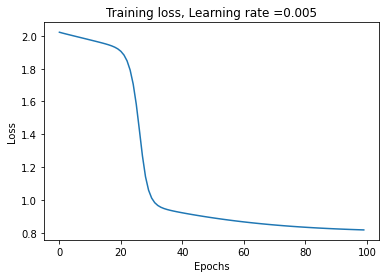

Train cost after epoch 0: 2.445970
Train cost after epoch 10: 1.841120
Train cost after epoch 20: 1.602255
Train cost after epoch 30: 1.391251
Train cost after epoch 40: 1.293752
Train cost after epoch 50: 1.182996
Train cost after epoch 60: 1.117081
Train cost after epoch 70: 1.048170
Train cost after epoch 80: 0.989496
Train cost after epoch 90: 0.941532


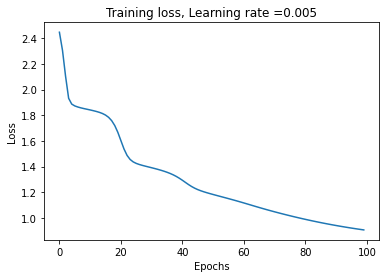

Train cost after epoch 0: 2.248142
Train cost after epoch 10: 1.936887
Train cost after epoch 20: 1.810463
Train cost after epoch 30: 1.639848
Train cost after epoch 40: 0.851517
Train cost after epoch 50: 0.829060
Train cost after epoch 60: 0.816552
Train cost after epoch 70: 0.809790
Train cost after epoch 80: 0.806652
Train cost after epoch 90: 0.805438


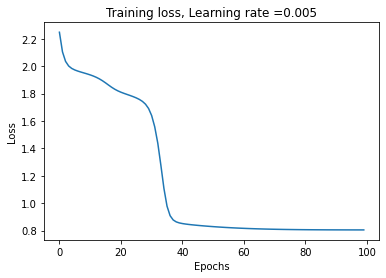

Train cost after epoch 0: 2.328391
Train cost after epoch 10: 0.935256
Train cost after epoch 20: 0.910624
Train cost after epoch 30: 0.885994
Train cost after epoch 40: 0.815051
Train cost after epoch 50: 0.805553
Train cost after epoch 60: 0.804955
Train cost after epoch 70: 0.805140
Train cost after epoch 80: 0.804933
Train cost after epoch 90: 0.804874


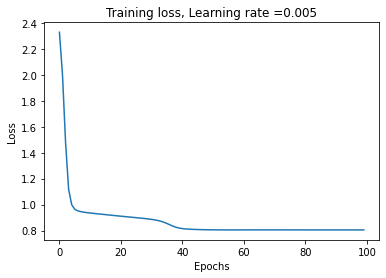

Train cost after epoch 0: 3.086193
Train cost after epoch 10: 2.341543
Train cost after epoch 20: 2.279003
Train cost after epoch 30: 1.846974
Train cost after epoch 40: 1.558055
Train cost after epoch 50: 1.475840
Train cost after epoch 60: 1.199783
Train cost after epoch 70: 1.059684
Train cost after epoch 80: 1.002867
Train cost after epoch 90: 0.956400


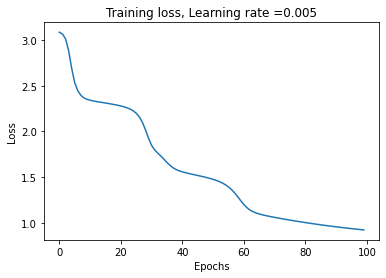

Train cost after epoch 0: 2.386520
Train cost after epoch 10: 1.362576
Train cost after epoch 20: 1.316383
Train cost after epoch 30: 0.971101
Train cost after epoch 40: 0.900958
Train cost after epoch 50: 0.872525
Train cost after epoch 60: 0.850481
Train cost after epoch 70: 0.834334
Train cost after epoch 80: 0.822812
Train cost after epoch 90: 0.814758


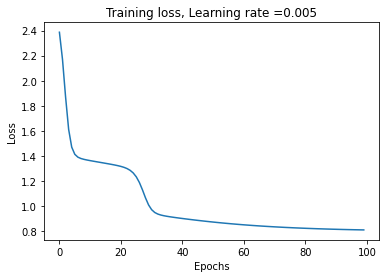

Train cost after epoch 0: 2.494474
Train cost after epoch 10: 1.946733
Train cost after epoch 20: 1.841653
Train cost after epoch 30: 1.632528
Train cost after epoch 40: 1.248842
Train cost after epoch 50: 0.858130
Train cost after epoch 60: 0.835482
Train cost after epoch 70: 0.820590
Train cost after epoch 80: 0.812062
Train cost after epoch 90: 0.807765


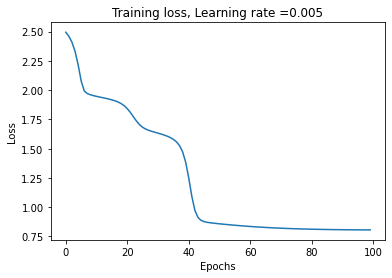

Train cost after epoch 0: 2.537906
Train cost after epoch 10: 1.645997
Train cost after epoch 20: 0.906009
Train cost after epoch 30: 0.817954
Train cost after epoch 40: 0.810063
Train cost after epoch 50: 0.806995
Train cost after epoch 60: 0.805899
Train cost after epoch 70: 0.805496
Train cost after epoch 80: 0.805368
Train cost after epoch 90: 0.805332


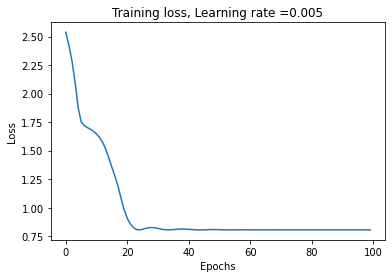

Train cost after epoch 0: 2.618195
Train cost after epoch 10: 0.910198
Train cost after epoch 20: 0.814710
Train cost after epoch 30: 0.806977
Train cost after epoch 40: 0.804862
Train cost after epoch 50: 0.803535
Train cost after epoch 60: 0.802029
Train cost after epoch 70: 0.801830
Train cost after epoch 80: 0.801663
Train cost after epoch 90: 0.801384


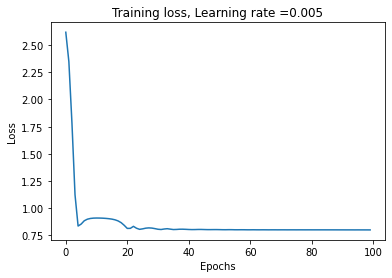

Train cost after epoch 0: 2.471465
Train cost after epoch 10: 2.349918
Train cost after epoch 20: 1.392545
Train cost after epoch 30: 1.225877
Train cost after epoch 40: 1.149435
Train cost after epoch 50: 1.016744
Train cost after epoch 60: 0.962692
Train cost after epoch 70: 0.921869
Train cost after epoch 80: 0.889740
Train cost after epoch 90: 0.865125


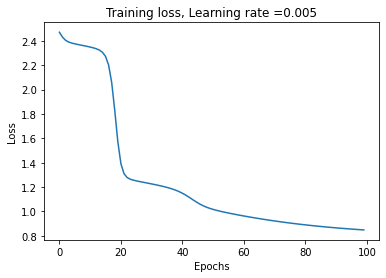

Train cost after epoch 0: 1.167960
Train cost after epoch 10: 0.809071
Train cost after epoch 20: 0.805452
Train cost after epoch 30: 0.803911
Train cost after epoch 40: 0.803228
Train cost after epoch 50: 0.802682
Train cost after epoch 60: 0.802171
Train cost after epoch 70: 0.801712
Train cost after epoch 80: 0.801132
Train cost after epoch 90: 0.800317


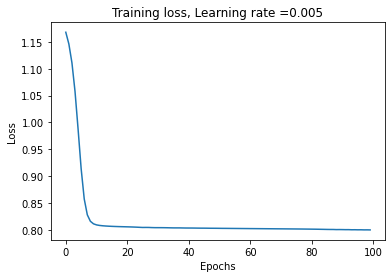

Train cost after epoch 0: 2.437283
Train cost after epoch 10: 1.870433
Train cost after epoch 20: 1.617447
Train cost after epoch 30: 1.293882
Train cost after epoch 40: 0.805903
Train cost after epoch 50: 0.804993
Train cost after epoch 60: 0.806648
Train cost after epoch 70: 0.805059
Train cost after epoch 80: 0.805222
Train cost after epoch 90: 0.805018


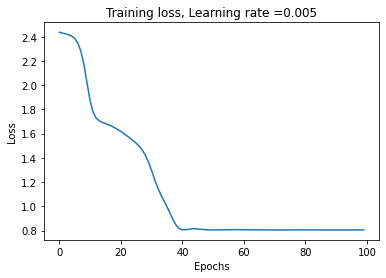

Train cost after epoch 0: 1.619292
Train cost after epoch 10: 1.570441
Train cost after epoch 20: 1.527624
Train cost after epoch 30: 1.485441
Train cost after epoch 40: 1.443962
Train cost after epoch 50: 1.403262
Train cost after epoch 60: 1.363412
Train cost after epoch 70: 1.324483
Train cost after epoch 80: 1.286551
Train cost after epoch 90: 1.249692


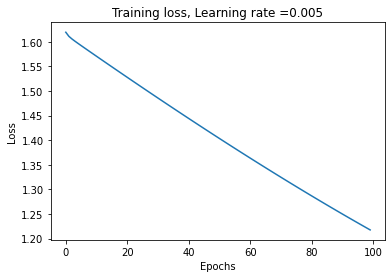

Train cost after epoch 0: 2.024537
Train cost after epoch 10: 0.987060
Train cost after epoch 20: 0.958518
Train cost after epoch 30: 0.932762
Train cost after epoch 40: 0.909672
Train cost after epoch 50: 0.889354
Train cost after epoch 60: 0.871816
Train cost after epoch 70: 0.856975
Train cost after epoch 80: 0.844677
Train cost after epoch 90: 0.834705


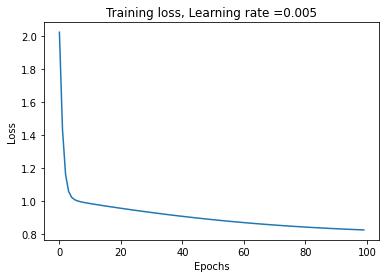

Train cost after epoch 0: 1.901935
Train cost after epoch 10: 1.834477
Train cost after epoch 20: 1.785574
Train cost after epoch 30: 1.660628
Train cost after epoch 40: 1.600827
Train cost after epoch 50: 1.540384
Train cost after epoch 60: 1.192073
Train cost after epoch 70: 0.853868
Train cost after epoch 80: 0.805098
Train cost after epoch 90: 0.807065


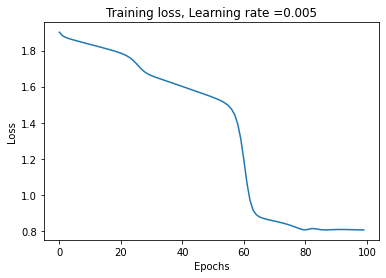

Train cost after epoch 0: 2.194235
Train cost after epoch 10: 2.079480
Train cost after epoch 20: 2.033234
Train cost after epoch 30: 1.987224
Train cost after epoch 40: 1.816058
Train cost after epoch 50: 0.807961
Train cost after epoch 60: 0.805253
Train cost after epoch 70: 0.805028
Train cost after epoch 80: 0.805087
Train cost after epoch 90: 0.805018


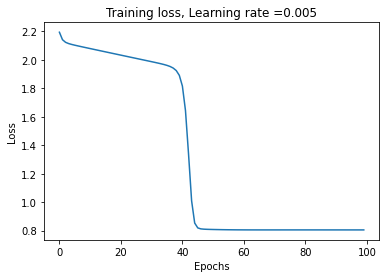

Train cost after epoch 0: 2.202723
Train cost after epoch 10: 2.151292
Train cost after epoch 20: 2.031825
Train cost after epoch 30: 1.123385
Train cost after epoch 40: 1.068802
Train cost after epoch 50: 1.025684
Train cost after epoch 60: 0.987270
Train cost after epoch 70: 0.953917
Train cost after epoch 80: 0.925400
Train cost after epoch 90: 0.901176


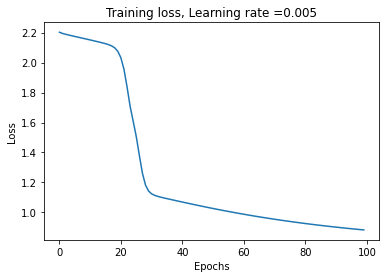

Train cost after epoch 0: 3.191148
Train cost after epoch 10: 1.914667
Train cost after epoch 20: 1.321996
Train cost after epoch 30: 1.274127
Train cost after epoch 40: 1.229553
Train cost after epoch 50: 1.187403
Train cost after epoch 60: 1.147819
Train cost after epoch 70: 1.110743
Train cost after epoch 80: 1.076099
Train cost after epoch 90: 1.043842


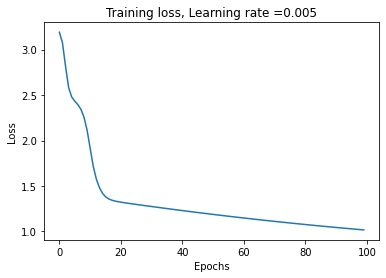

Train cost after epoch 0: 2.516597
Train cost after epoch 10: 2.479090
Train cost after epoch 20: 0.919170
Train cost after epoch 30: 0.857116
Train cost after epoch 40: 0.839463
Train cost after epoch 50: 0.826628
Train cost after epoch 60: 0.817881
Train cost after epoch 70: 0.812313
Train cost after epoch 80: 0.808999
Train cost after epoch 90: 0.807159


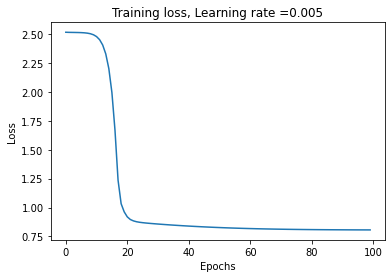

Train cost after epoch 0: 3.187006
Train cost after epoch 10: 1.900224
Train cost after epoch 20: 1.644935
Train cost after epoch 30: 1.103123
Train cost after epoch 40: 0.805755
Train cost after epoch 50: 0.804950
Train cost after epoch 60: 0.805159
Train cost after epoch 70: 0.805021
Train cost after epoch 80: 0.804908
Train cost after epoch 90: 0.804890


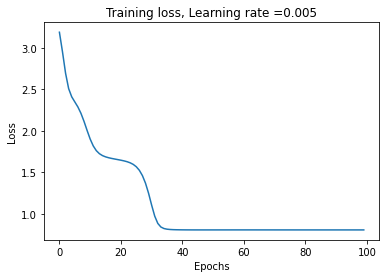

Train cost after epoch 0: 3.437140
Train cost after epoch 10: 2.399458
Train cost after epoch 20: 2.345521
Train cost after epoch 30: 2.258075
Train cost after epoch 40: 1.831037
Train cost after epoch 50: 1.757268
Train cost after epoch 60: 1.691631
Train cost after epoch 70: 1.629930
Train cost after epoch 80: 1.572160
Train cost after epoch 90: 1.517776


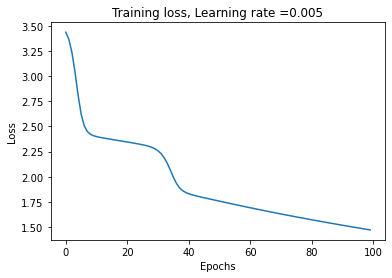

Train cost after epoch 0: 3.271581
Train cost after epoch 10: 1.697566
Train cost after epoch 20: 1.602454
Train cost after epoch 30: 1.554903
Train cost after epoch 40: 1.508621
Train cost after epoch 50: 1.463698
Train cost after epoch 60: 1.419957
Train cost after epoch 70: 1.361895
Train cost after epoch 80: 1.274153
Train cost after epoch 90: 1.163666


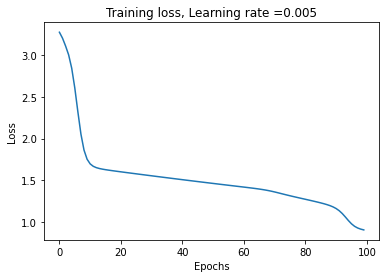

Train cost after epoch 0: 1.768599
Train cost after epoch 10: 1.591156
Train cost after epoch 20: 1.495201
Train cost after epoch 30: 0.839608
Train cost after epoch 40: 0.813136
Train cost after epoch 50: 0.804608
Train cost after epoch 60: 0.805731
Train cost after epoch 70: 0.805104
Train cost after epoch 80: 0.804657
Train cost after epoch 90: 0.804373


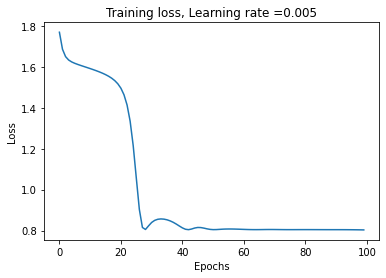

Train cost after epoch 0: 2.305364
Train cost after epoch 10: 1.889482
Train cost after epoch 20: 1.533717
Train cost after epoch 30: 1.478545
Train cost after epoch 40: 1.428718
Train cost after epoch 50: 1.381050
Train cost after epoch 60: 1.335641
Train cost after epoch 70: 1.292371
Train cost after epoch 80: 1.251102
Train cost after epoch 90: 1.211741


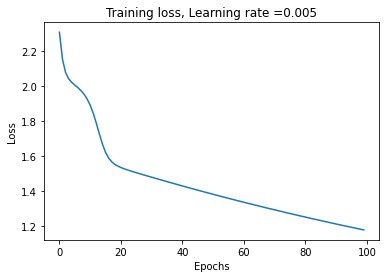

Train cost after epoch 0: 3.885345
Train cost after epoch 10: 3.538914
Train cost after epoch 20: 1.756422
Train cost after epoch 30: 1.367932
Train cost after epoch 40: 1.247178
Train cost after epoch 50: 1.193921
Train cost after epoch 60: 1.144856
Train cost after epoch 70: 1.100434
Train cost after epoch 80: 1.060393
Train cost after epoch 90: 1.024349


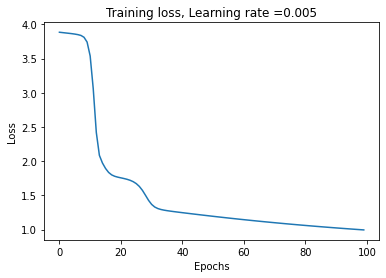

Train cost after epoch 0: 3.243212
Train cost after epoch 10: 2.386654
Train cost after epoch 20: 1.800550
Train cost after epoch 30: 1.749546
Train cost after epoch 40: 1.617287
Train cost after epoch 50: 0.823548
Train cost after epoch 60: 0.808846
Train cost after epoch 70: 0.805338
Train cost after epoch 80: 0.804897
Train cost after epoch 90: 0.804991


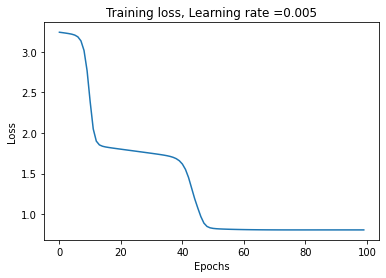

Train cost after epoch 0: 2.382726
Train cost after epoch 10: 2.335712
Train cost after epoch 20: 2.267665
Train cost after epoch 30: 0.813831
Train cost after epoch 40: 0.805562
Train cost after epoch 50: 0.805038
Train cost after epoch 60: 0.805039
Train cost after epoch 70: 0.804650
Train cost after epoch 80: 0.804151
Train cost after epoch 90: 0.801734


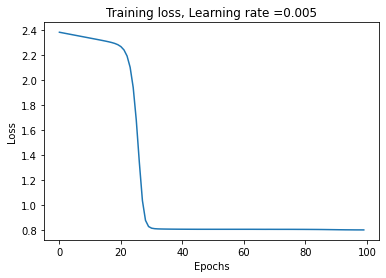

Train cost after epoch 0: 1.910209
Train cost after epoch 10: 1.611885
Train cost after epoch 20: 1.564307
Train cost after epoch 30: 1.518458
Train cost after epoch 40: 1.472696
Train cost after epoch 50: 1.160612
Train cost after epoch 60: 0.961420
Train cost after epoch 70: 0.918929
Train cost after epoch 80: 0.885006
Train cost after epoch 90: 0.859548


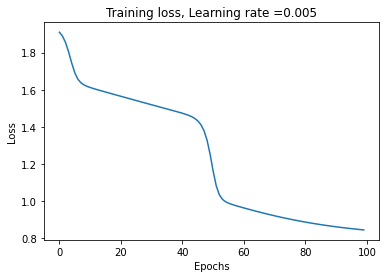

Train cost after epoch 0: 3.341758
Train cost after epoch 10: 2.245276
Train cost after epoch 20: 2.192050
Train cost after epoch 30: 2.101222
Train cost after epoch 40: 1.735963
Train cost after epoch 50: 1.550077
Train cost after epoch 60: 1.187892
Train cost after epoch 70: 0.817734
Train cost after epoch 80: 0.806579
Train cost after epoch 90: 0.804904


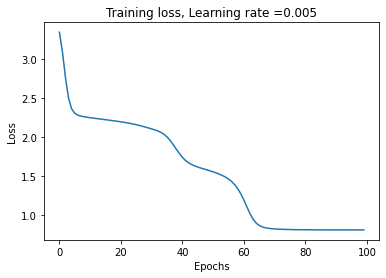

Train cost after epoch 0: 2.533897
Train cost after epoch 10: 2.033839
Train cost after epoch 20: 1.975229
Train cost after epoch 30: 0.832144
Train cost after epoch 40: 0.804535
Train cost after epoch 50: 0.805598
Train cost after epoch 60: 0.804930
Train cost after epoch 70: 0.804727
Train cost after epoch 80: 0.804585
Train cost after epoch 90: 0.804418


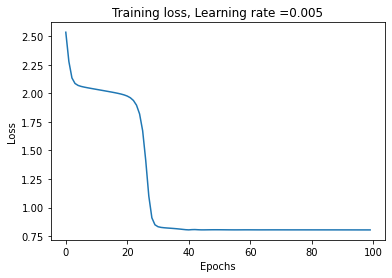

Train cost after epoch 0: 4.272542
Train cost after epoch 10: 1.262228
Train cost after epoch 20: 0.942281
Train cost after epoch 30: 0.912107
Train cost after epoch 40: 0.889043
Train cost after epoch 50: 0.869688
Train cost after epoch 60: 0.853766
Train cost after epoch 70: 0.840926
Train cost after epoch 80: 0.830816
Train cost after epoch 90: 0.823062


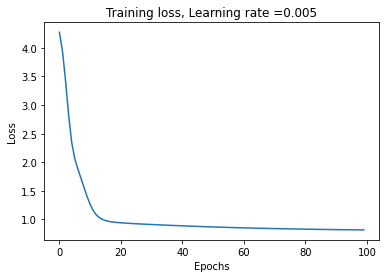

Train cost after epoch 0: 2.823421
Train cost after epoch 10: 1.948992
Train cost after epoch 20: 1.556063
Train cost after epoch 30: 1.508344
Train cost after epoch 40: 1.460247
Train cost after epoch 50: 1.413469
Train cost after epoch 60: 1.367875
Train cost after epoch 70: 1.321086
Train cost after epoch 80: 1.251117
Train cost after epoch 90: 1.109817


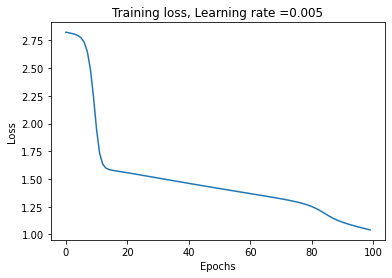

Train cost after epoch 0: 3.953974
Train cost after epoch 10: 1.403391
Train cost after epoch 20: 1.343728
Train cost after epoch 30: 1.277791
Train cost after epoch 40: 0.805944
Train cost after epoch 50: 0.803754
Train cost after epoch 60: 0.803498
Train cost after epoch 70: 0.802553
Train cost after epoch 80: 0.802217
Train cost after epoch 90: 0.802131


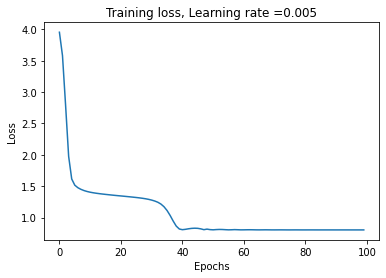

Train cost after epoch 0: 1.907676
Train cost after epoch 10: 1.807711
Train cost after epoch 20: 1.761764
Train cost after epoch 30: 1.691765
Train cost after epoch 40: 1.588960
Train cost after epoch 50: 1.526300
Train cost after epoch 60: 1.466074
Train cost after epoch 70: 1.409882
Train cost after epoch 80: 1.357575
Train cost after epoch 90: 1.308671


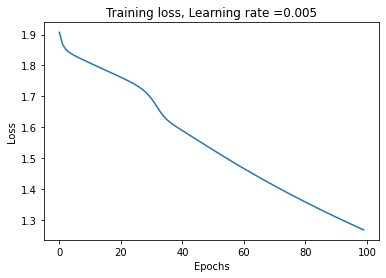

Train cost after epoch 0: 3.375254
Train cost after epoch 10: 2.632296
Train cost after epoch 20: 1.869729
Train cost after epoch 30: 1.771840
Train cost after epoch 40: 1.712978
Train cost after epoch 50: 1.529340
Train cost after epoch 60: 1.007052
Train cost after epoch 70: 0.900295
Train cost after epoch 80: 0.827283
Train cost after epoch 90: 0.809623


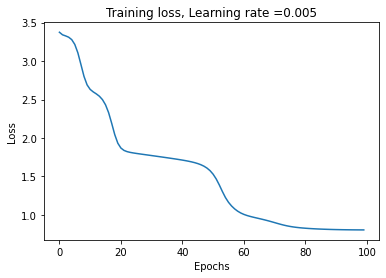

Train cost after epoch 0: 2.650906
Train cost after epoch 10: 2.602948
Train cost after epoch 20: 2.554816
Train cost after epoch 30: 2.463512
Train cost after epoch 40: 1.039806
Train cost after epoch 50: 0.994584
Train cost after epoch 60: 0.954745
Train cost after epoch 70: 0.921151
Train cost after epoch 80: 0.893659
Train cost after epoch 90: 0.871563


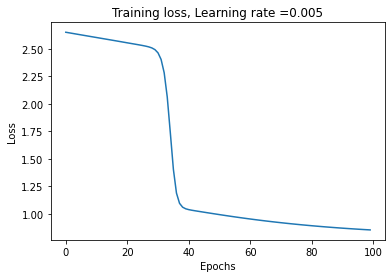

Train cost after epoch 0: 2.576796
Train cost after epoch 10: 2.208427
Train cost after epoch 20: 1.124021
Train cost after epoch 30: 0.954721
Train cost after epoch 40: 0.894529
Train cost after epoch 50: 0.866811
Train cost after epoch 60: 0.846140
Train cost after epoch 70: 0.831131
Train cost after epoch 80: 0.820623
Train cost after epoch 90: 0.813486


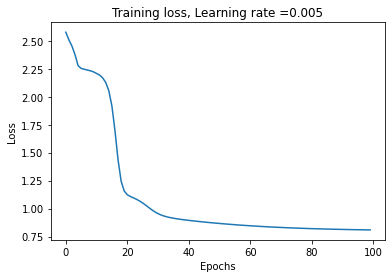

Train cost after epoch 0: 2.242451
Train cost after epoch 10: 2.187411
Train cost after epoch 20: 2.133518
Train cost after epoch 30: 1.268183
Train cost after epoch 40: 1.199044
Train cost after epoch 50: 1.145211
Train cost after epoch 60: 0.949050
Train cost after epoch 70: 0.804741
Train cost after epoch 80: 0.805658
Train cost after epoch 90: 0.805456


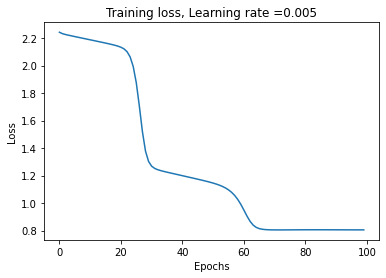

Train cost after epoch 0: 2.793599
Train cost after epoch 10: 2.336385
Train cost after epoch 20: 2.282700
Train cost after epoch 30: 1.871812
Train cost after epoch 40: 1.807785
Train cost after epoch 50: 1.549676
Train cost after epoch 60: 1.098643
Train cost after epoch 70: 0.949275
Train cost after epoch 80: 0.904780
Train cost after epoch 90: 0.871937


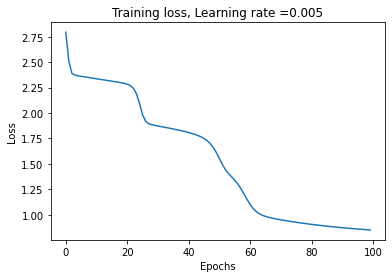

Train cost after epoch 0: 4.037912
Train cost after epoch 10: 3.356305
Train cost after epoch 20: 1.386241
Train cost after epoch 30: 1.337944
Train cost after epoch 40: 1.291754
Train cost after epoch 50: 1.247811
Train cost after epoch 60: 1.206302
Train cost after epoch 70: 1.167092
Train cost after epoch 80: 1.130032
Train cost after epoch 90: 1.095236


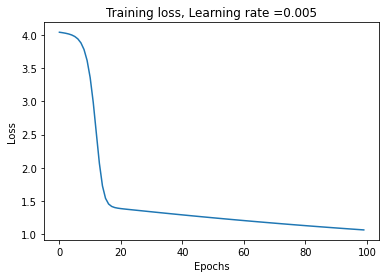

Train cost after epoch 0: 0.978852
Train cost after epoch 10: 0.808332
Train cost after epoch 20: 0.809981
Train cost after epoch 30: 0.807284
Train cost after epoch 40: 0.804157
Train cost after epoch 50: 0.804450
Train cost after epoch 60: 0.803001
Train cost after epoch 70: 0.801060
Train cost after epoch 80: 0.799513
Train cost after epoch 90: 0.798447


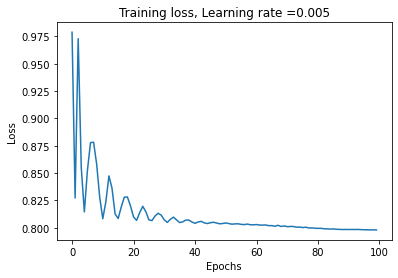

Train cost after epoch 0: 3.157331
Train cost after epoch 10: 3.108191
Train cost after epoch 20: 3.009270
Train cost after epoch 30: 2.816656
Train cost after epoch 40: 2.028248
Train cost after epoch 50: 1.229796
Train cost after epoch 60: 1.072504
Train cost after epoch 70: 1.018691
Train cost after epoch 80: 0.974296
Train cost after epoch 90: 0.937632


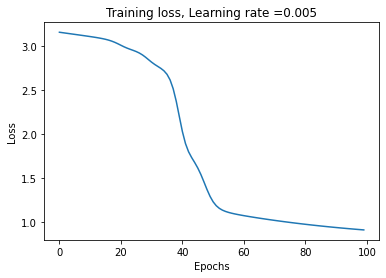

Train cost after epoch 0: 2.769157
Train cost after epoch 10: 2.720075
Train cost after epoch 20: 1.786193
Train cost after epoch 30: 1.263735
Train cost after epoch 40: 1.166978
Train cost after epoch 50: 0.869880
Train cost after epoch 60: 0.827322
Train cost after epoch 70: 0.810940
Train cost after epoch 80: 0.806554
Train cost after epoch 90: 0.805204


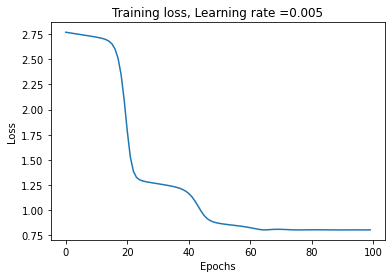

Train cost after epoch 0: 3.934584
Train cost after epoch 10: 2.602473
Train cost after epoch 20: 2.342302
Train cost after epoch 30: 2.270579
Train cost after epoch 40: 1.921414
Train cost after epoch 50: 1.661368
Train cost after epoch 60: 1.499859
Train cost after epoch 70: 1.404472
Train cost after epoch 80: 1.331370
Train cost after epoch 90: 1.267206


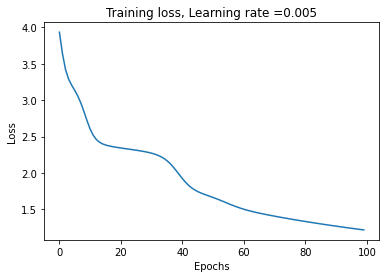

Train cost after epoch 0: 2.586987
Train cost after epoch 10: 1.139281
Train cost after epoch 20: 0.941448
Train cost after epoch 30: 0.875501
Train cost after epoch 40: 0.810261
Train cost after epoch 50: 0.804522
Train cost after epoch 60: 0.800994
Train cost after epoch 70: 0.800611
Train cost after epoch 80: 0.800539
Train cost after epoch 90: 0.800413


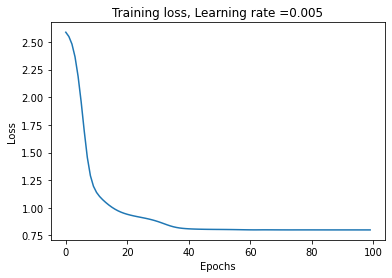

Train cost after epoch 0: 2.703915
Train cost after epoch 10: 2.653949
Train cost after epoch 20: 2.421734
Train cost after epoch 30: 1.974313
Train cost after epoch 40: 1.899087
Train cost after epoch 50: 1.633745
Train cost after epoch 60: 1.049803
Train cost after epoch 70: 0.857414
Train cost after epoch 80: 0.825381
Train cost after epoch 90: 0.811229


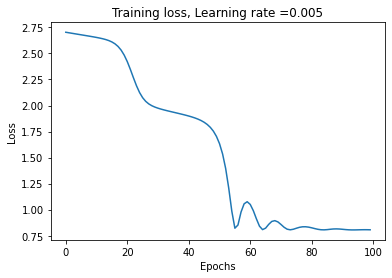

Train cost after epoch 0: 3.060245
Train cost after epoch 10: 3.010337
Train cost after epoch 20: 2.960246
Train cost after epoch 30: 2.738433
Train cost after epoch 40: 2.036921
Train cost after epoch 50: 1.940234
Train cost after epoch 60: 1.832474
Train cost after epoch 70: 1.730496
Train cost after epoch 80: 1.643935
Train cost after epoch 90: 1.566585


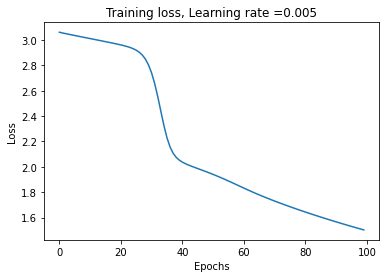

Train cost after epoch 0: 2.446516
Train cost after epoch 10: 2.384687
Train cost after epoch 20: 1.229387
Train cost after epoch 30: 0.837846
Train cost after epoch 40: 0.807885
Train cost after epoch 50: 0.803013
Train cost after epoch 60: 0.802391
Train cost after epoch 70: 0.801821
Train cost after epoch 80: 0.801630
Train cost after epoch 90: 0.801560


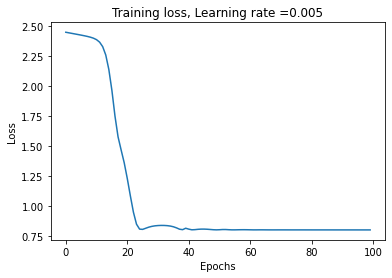

Train cost after epoch 0: 4.427603
Train cost after epoch 10: 2.508598
Train cost after epoch 20: 2.430619
Train cost after epoch 30: 2.365113
Train cost after epoch 40: 1.966985
Train cost after epoch 50: 1.407861
Train cost after epoch 60: 1.330999
Train cost after epoch 70: 1.268092
Train cost after epoch 80: 1.211653
Train cost after epoch 90: 1.160994


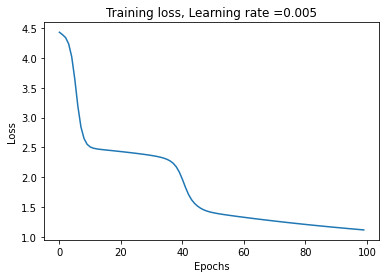

Train cost after epoch 0: 2.877435
Train cost after epoch 10: 2.724911
Train cost after epoch 20: 1.645572
Train cost after epoch 30: 1.593032
Train cost after epoch 40: 1.477100
Train cost after epoch 50: 0.830247
Train cost after epoch 60: 0.806258
Train cost after epoch 70: 0.806490
Train cost after epoch 80: 0.805807
Train cost after epoch 90: 0.805058


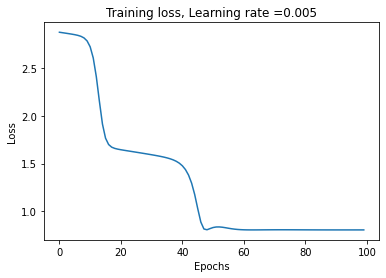

Train cost after epoch 0: 1.228748
Train cost after epoch 10: 1.191437
Train cost after epoch 20: 1.155255
Train cost after epoch 30: 1.120414
Train cost after epoch 40: 1.087113
Train cost after epoch 50: 1.055516
Train cost after epoch 60: 1.025762
Train cost after epoch 70: 0.997969
Train cost after epoch 80: 0.972232
Train cost after epoch 90: 0.948620


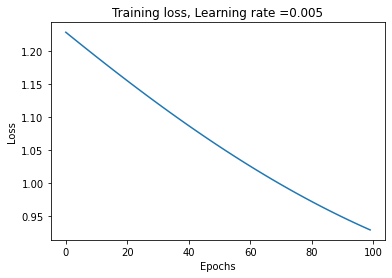

Train cost after epoch 0: 4.179688
Train cost after epoch 10: 2.819390
Train cost after epoch 20: 1.365303
Train cost after epoch 30: 0.905395
Train cost after epoch 40: 0.835108
Train cost after epoch 50: 0.821179
Train cost after epoch 60: 0.813016
Train cost after epoch 70: 0.808530
Train cost after epoch 80: 0.806320
Train cost after epoch 90: 0.805363


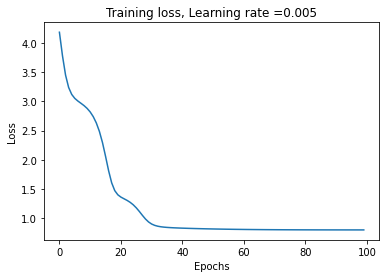

Train cost after epoch 0: 2.815935
Train cost after epoch 10: 0.942111
Train cost after epoch 20: 0.858421
Train cost after epoch 30: 0.813142
Train cost after epoch 40: 0.808731
Train cost after epoch 50: 0.808033
Train cost after epoch 60: 0.807214
Train cost after epoch 70: 0.804816
Train cost after epoch 80: 0.796843
Train cost after epoch 90: 0.796040


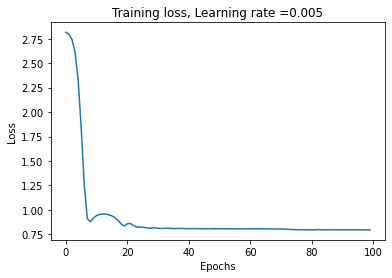

Train cost after epoch 0: 3.060824
Train cost after epoch 10: 1.411993
Train cost after epoch 20: 1.264202
Train cost after epoch 30: 1.014619
Train cost after epoch 40: 0.967057
Train cost after epoch 50: 0.932125
Train cost after epoch 60: 0.903032
Train cost after epoch 70: 0.879234
Train cost after epoch 80: 0.860032
Train cost after epoch 90: 0.844767


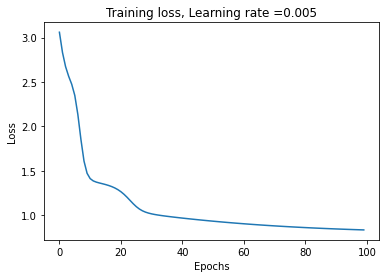

Train cost after epoch 0: 2.109040
Train cost after epoch 10: 1.763062
Train cost after epoch 20: 1.698628
Train cost after epoch 30: 1.598954
Train cost after epoch 40: 1.203178
Train cost after epoch 50: 1.149030
Train cost after epoch 60: 1.098831
Train cost after epoch 70: 1.053965
Train cost after epoch 80: 1.014449
Train cost after epoch 90: 0.979812


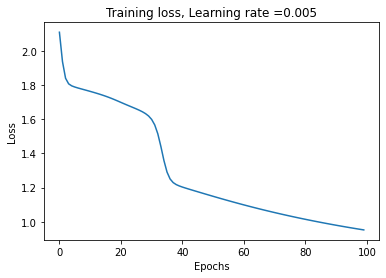

Train cost after epoch 0: 1.873550
Train cost after epoch 10: 1.769903
Train cost after epoch 20: 1.712740
Train cost after epoch 30: 1.017875
Train cost after epoch 40: 0.881301
Train cost after epoch 50: 0.820448
Train cost after epoch 60: 0.808932
Train cost after epoch 70: 0.805369
Train cost after epoch 80: 0.804691
Train cost after epoch 90: 0.803393


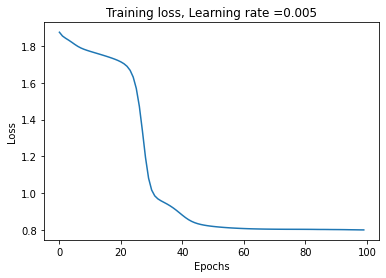

Train cost after epoch 0: 3.339150
Train cost after epoch 10: 1.423643
Train cost after epoch 20: 1.374224
Train cost after epoch 30: 1.332112
Train cost after epoch 40: 1.291081
Train cost after epoch 50: 1.231398
Train cost after epoch 60: 1.064816
Train cost after epoch 70: 0.994596
Train cost after epoch 80: 0.945921
Train cost after epoch 90: 0.907722


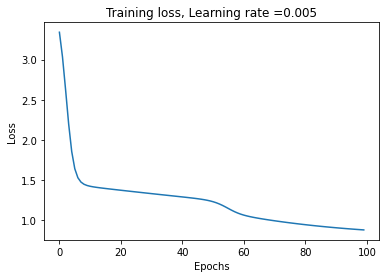

Train cost after epoch 0: 1.782802
Train cost after epoch 10: 0.976406
Train cost after epoch 20: 0.948255
Train cost after epoch 30: 0.922839
Train cost after epoch 40: 0.900189
Train cost after epoch 50: 0.843142
Train cost after epoch 60: 0.803454
Train cost after epoch 70: 0.803915
Train cost after epoch 80: 0.803167
Train cost after epoch 90: 0.802711


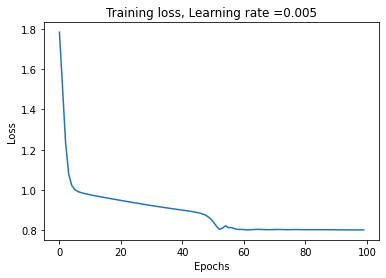

__________________________________________________ 0.6% GA is running...Train cost after epoch 0: 2.984019
Train cost after epoch 10: 2.293422
Train cost after epoch 20: 2.118618
Train cost after epoch 30: 1.922967
Train cost after epoch 40: 1.734658
Train cost after epoch 50: 0.819974
Train cost after epoch 60: 0.804986
Train cost after epoch 70: 0.804730
Train cost after epoch 80: 0.804527
Train cost after epoch 90: 0.804379


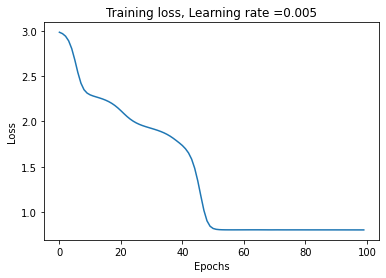

Train cost after epoch 0: 1.578505
Train cost after epoch 10: 1.281062
Train cost after epoch 20: 1.190634
Train cost after epoch 30: 1.008995
Train cost after epoch 40: 0.833132
Train cost after epoch 50: 0.806651
Train cost after epoch 60: 0.805394
Train cost after epoch 70: 0.804968
Train cost after epoch 80: 0.805001
Train cost after epoch 90: 0.804905


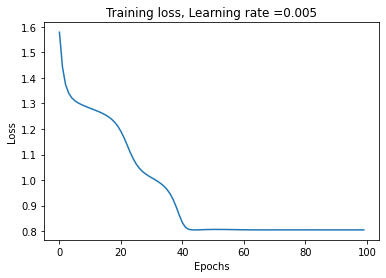

Train cost after epoch 0: 2.466119
Train cost after epoch 10: 1.129457
Train cost after epoch 20: 0.994691
Train cost after epoch 30: 0.814777
Train cost after epoch 40: 0.811837
Train cost after epoch 50: 0.805406
Train cost after epoch 60: 0.804713
Train cost after epoch 70: 0.803926
Train cost after epoch 80: 0.803838
Train cost after epoch 90: 0.803725


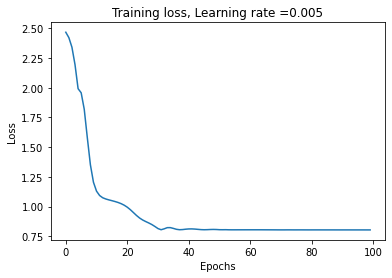

Train cost after epoch 0: 2.605859
Train cost after epoch 10: 1.321945
Train cost after epoch 20: 1.182170
Train cost after epoch 30: 0.971645
Train cost after epoch 40: 0.932333
Train cost after epoch 50: 0.901282
Train cost after epoch 60: 0.875998
Train cost after epoch 70: 0.856119
Train cost after epoch 80: 0.840912
Train cost after epoch 90: 0.829580


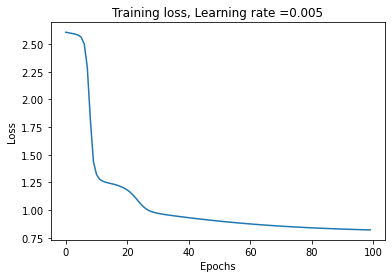

Train cost after epoch 0: 3.058594
Train cost after epoch 10: 2.958822
Train cost after epoch 20: 2.012664
Train cost after epoch 30: 0.808699
Train cost after epoch 40: 0.814835
Train cost after epoch 50: 0.809853
Train cost after epoch 60: 0.806851
Train cost after epoch 70: 0.805073
Train cost after epoch 80: 0.804544
Train cost after epoch 90: 0.804409


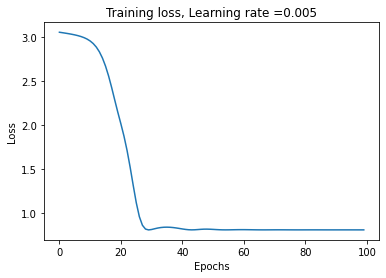

Train cost after epoch 0: 1.827769
Train cost after epoch 10: 1.685489
Train cost after epoch 20: 1.192433
Train cost after epoch 30: 1.143391
Train cost after epoch 40: 1.101573
Train cost after epoch 50: 1.062795
Train cost after epoch 60: 1.027453
Train cost after epoch 70: 0.995434
Train cost after epoch 80: 0.966603
Train cost after epoch 90: 0.940832


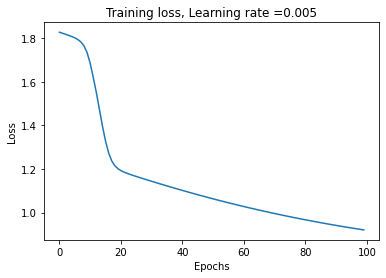

Train cost after epoch 0: 2.671569
Train cost after epoch 10: 1.681052
Train cost after epoch 20: 1.620352
Train cost after epoch 30: 1.543849
Train cost after epoch 40: 1.444305
Train cost after epoch 50: 1.031986
Train cost after epoch 60: 0.983056
Train cost after epoch 70: 0.941342
Train cost after epoch 80: 0.907357
Train cost after epoch 90: 0.880471


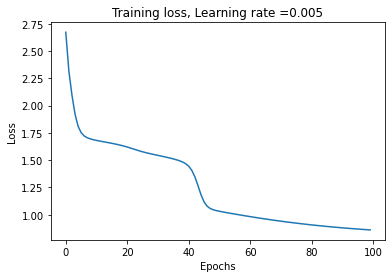

Train cost after epoch 0: 3.901129
Train cost after epoch 10: 2.740336
Train cost after epoch 20: 2.170424
Train cost after epoch 30: 1.964435
Train cost after epoch 40: 0.820568
Train cost after epoch 50: 0.806967
Train cost after epoch 60: 0.805111
Train cost after epoch 70: 0.804896
Train cost after epoch 80: 0.804941
Train cost after epoch 90: 0.804936


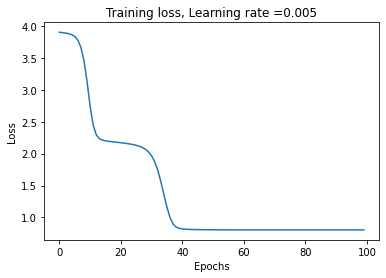

Train cost after epoch 0: 1.800997
Train cost after epoch 10: 1.737760
Train cost after epoch 20: 1.689257
Train cost after epoch 30: 1.015376
Train cost after epoch 40: 0.968346
Train cost after epoch 50: 0.932905
Train cost after epoch 60: 0.902809
Train cost after epoch 70: 0.878317
Train cost after epoch 80: 0.858873
Train cost after epoch 90: 0.843764


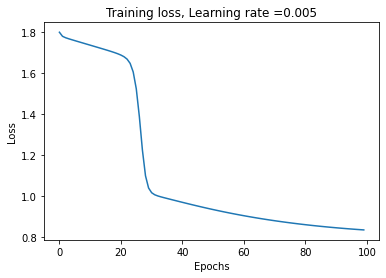

Train cost after epoch 0: 2.871737
Train cost after epoch 10: 1.141374
Train cost after epoch 20: 1.051153
Train cost after epoch 30: 1.012929
Train cost after epoch 40: 0.979959
Train cost after epoch 50: 0.950661
Train cost after epoch 60: 0.924819
Train cost after epoch 70: 0.902286
Train cost after epoch 80: 0.882898
Train cost after epoch 90: 0.866462


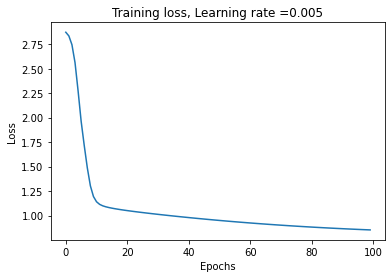

Train cost after epoch 0: 3.256142
Train cost after epoch 10: 2.811571
Train cost after epoch 20: 1.467381
Train cost after epoch 30: 1.268300
Train cost after epoch 40: 1.198458
Train cost after epoch 50: 1.022624
Train cost after epoch 60: 0.895766
Train cost after epoch 70: 0.859273
Train cost after epoch 80: 0.836204
Train cost after epoch 90: 0.821793


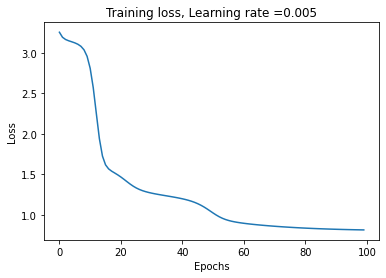

Train cost after epoch 0: 1.541451
Train cost after epoch 10: 0.945631
Train cost after epoch 20: 0.908578
Train cost after epoch 30: 0.885118
Train cost after epoch 40: 0.865483
Train cost after epoch 50: 0.849457
Train cost after epoch 60: 0.836772
Train cost after epoch 70: 0.827041
Train cost after epoch 80: 0.819817
Train cost after epoch 90: 0.814632


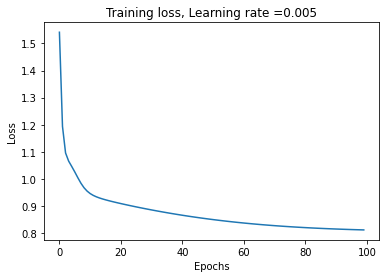

Train cost after epoch 0: 2.009083
Train cost after epoch 10: 1.168418
Train cost after epoch 20: 1.108039
Train cost after epoch 30: 1.070880
Train cost after epoch 40: 1.036986
Train cost after epoch 50: 1.005759
Train cost after epoch 60: 0.977172
Train cost after epoch 70: 0.951219
Train cost after epoch 80: 0.927884
Train cost after epoch 90: 0.907132


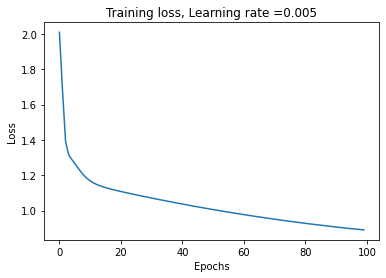

Train cost after epoch 0: 2.522493
Train cost after epoch 10: 1.656331
Train cost after epoch 20: 1.499268
Train cost after epoch 30: 1.449611
Train cost after epoch 40: 1.383341
Train cost after epoch 50: 1.250901
Train cost after epoch 60: 1.109941
Train cost after epoch 70: 1.045493
Train cost after epoch 80: 0.992302
Train cost after epoch 90: 0.948222


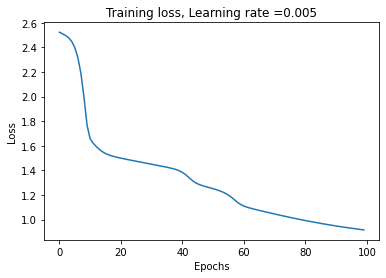

Train cost after epoch 0: 2.025308
Train cost after epoch 10: 1.923344
Train cost after epoch 20: 1.877183
Train cost after epoch 30: 1.831925
Train cost after epoch 40: 1.784298
Train cost after epoch 50: 1.632623
Train cost after epoch 60: 1.344968
Train cost after epoch 70: 1.273595
Train cost after epoch 80: 1.210104
Train cost after epoch 90: 1.153786


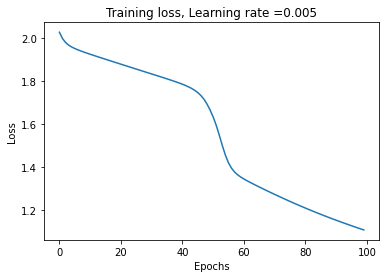

Train cost after epoch 0: 1.989400
Train cost after epoch 10: 1.183177
Train cost after epoch 20: 0.843778
Train cost after epoch 30: 0.825577
Train cost after epoch 40: 0.815596
Train cost after epoch 50: 0.809734
Train cost after epoch 60: 0.806770
Train cost after epoch 70: 0.805519
Train cost after epoch 80: 0.805099
Train cost after epoch 90: 0.804999


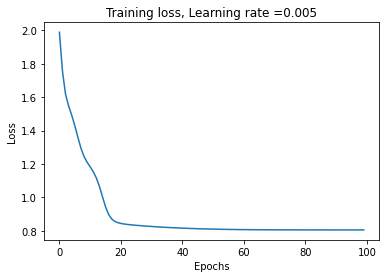

Train cost after epoch 0: 3.433599
Train cost after epoch 10: 2.363837
Train cost after epoch 20: 1.771096
Train cost after epoch 30: 1.493850
Train cost after epoch 40: 1.440705
Train cost after epoch 50: 1.389094
Train cost after epoch 60: 1.340237
Train cost after epoch 70: 1.294155
Train cost after epoch 80: 1.250630
Train cost after epoch 90: 1.209466


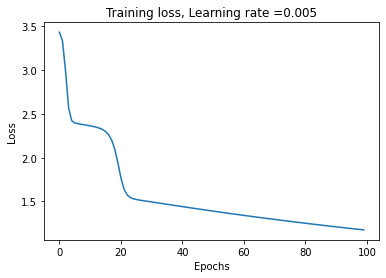

Train cost after epoch 0: 1.909729
Train cost after epoch 10: 1.748347
Train cost after epoch 20: 1.656282
Train cost after epoch 30: 1.328586
Train cost after epoch 40: 0.864446
Train cost after epoch 50: 0.805529
Train cost after epoch 60: 0.806248
Train cost after epoch 70: 0.804901
Train cost after epoch 80: 0.805048
Train cost after epoch 90: 0.804918


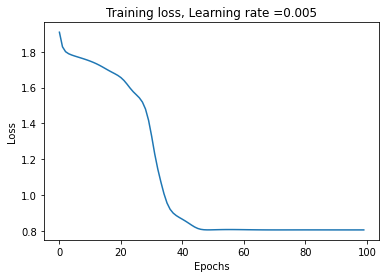

Train cost after epoch 0: 4.018594
Train cost after epoch 10: 3.313879
Train cost after epoch 20: 3.125111
Train cost after epoch 30: 1.970723
Train cost after epoch 40: 1.630644
Train cost after epoch 50: 0.928586
Train cost after epoch 60: 0.847157
Train cost after epoch 70: 0.826663
Train cost after epoch 80: 0.815142
Train cost after epoch 90: 0.809177


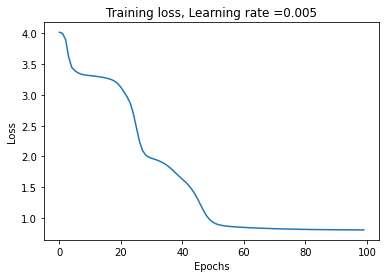

Train cost after epoch 0: 1.835491
Train cost after epoch 10: 1.789925
Train cost after epoch 20: 1.743367
Train cost after epoch 30: 1.103130
Train cost after epoch 40: 1.044594
Train cost after epoch 50: 1.002785
Train cost after epoch 60: 0.965709
Train cost after epoch 70: 0.933939
Train cost after epoch 80: 0.907133
Train cost after epoch 90: 0.884792


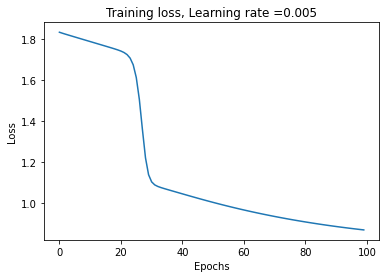

Train cost after epoch 0: 1.597026
Train cost after epoch 10: 0.885898
Train cost after epoch 20: 0.848118
Train cost after epoch 30: 0.814435
Train cost after epoch 40: 0.803284
Train cost after epoch 50: 0.804388
Train cost after epoch 60: 0.803050
Train cost after epoch 70: 0.803138
Train cost after epoch 80: 0.802941
Train cost after epoch 90: 0.802774


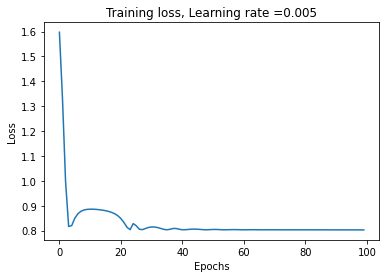

Train cost after epoch 0: 2.158463
Train cost after epoch 10: 1.931061
Train cost after epoch 20: 0.868231
Train cost after epoch 30: 0.848183
Train cost after epoch 40: 0.833377
Train cost after epoch 50: 0.822485
Train cost after epoch 60: 0.814262
Train cost after epoch 70: 0.803299
Train cost after epoch 80: 0.801353
Train cost after epoch 90: 0.800781


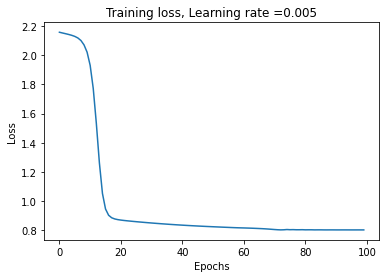

Train cost after epoch 0: 3.212969
Train cost after epoch 10: 1.150120
Train cost after epoch 20: 1.092092
Train cost after epoch 30: 1.055744
Train cost after epoch 40: 1.022048
Train cost after epoch 50: 0.991171
Train cost after epoch 60: 0.963126
Train cost after epoch 70: 0.937858
Train cost after epoch 80: 0.915314
Train cost after epoch 90: 0.895438


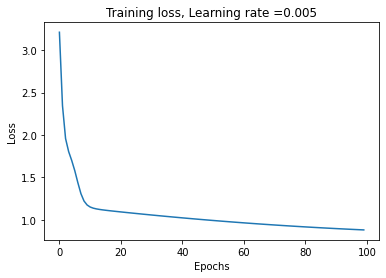

Train cost after epoch 0: 2.515882
Train cost after epoch 10: 2.471275
Train cost after epoch 20: 2.208362
Train cost after epoch 30: 0.806918
Train cost after epoch 40: 0.807838
Train cost after epoch 50: 0.805947
Train cost after epoch 60: 0.804995
Train cost after epoch 70: 0.804902
Train cost after epoch 80: 0.804933
Train cost after epoch 90: 0.804910


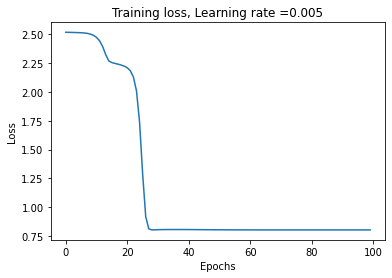

Train cost after epoch 0: 1.370358
Train cost after epoch 10: 1.078601
Train cost after epoch 20: 1.045863
Train cost after epoch 30: 1.015215
Train cost after epoch 40: 0.986636
Train cost after epoch 50: 0.960260
Train cost after epoch 60: 0.936244
Train cost after epoch 70: 0.914644
Train cost after epoch 80: 0.895472
Train cost after epoch 90: 0.878697


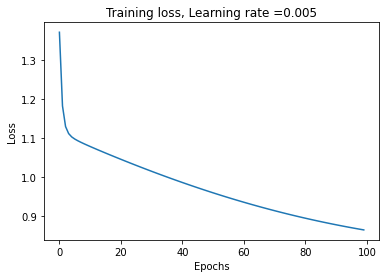

Train cost after epoch 0: 3.050249
Train cost after epoch 10: 2.034886
Train cost after epoch 20: 1.324958
Train cost after epoch 30: 1.175603
Train cost after epoch 40: 1.114101
Train cost after epoch 50: 1.016636
Train cost after epoch 60: 0.958446
Train cost after epoch 70: 0.916401
Train cost after epoch 80: 0.883915
Train cost after epoch 90: 0.859513


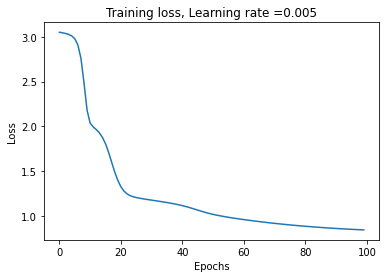

Train cost after epoch 0: 2.015568
Train cost after epoch 10: 1.836592
Train cost after epoch 20: 1.715330
Train cost after epoch 30: 1.609409
Train cost after epoch 40: 1.553234
Train cost after epoch 50: 1.498954
Train cost after epoch 60: 1.447446
Train cost after epoch 70: 1.398554
Train cost after epoch 80: 1.348150
Train cost after epoch 90: 1.068587


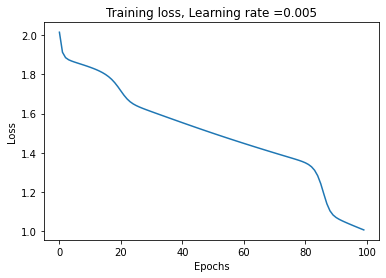

Train cost after epoch 0: 1.649583
Train cost after epoch 10: 1.604296
Train cost after epoch 20: 1.561308
Train cost after epoch 30: 1.518322
Train cost after epoch 40: 1.103138
Train cost after epoch 50: 0.858651
Train cost after epoch 60: 0.836134
Train cost after epoch 70: 0.821146
Train cost after epoch 80: 0.812460
Train cost after epoch 90: 0.808007


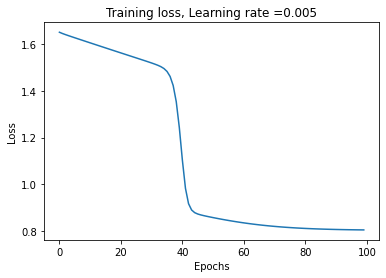

Train cost after epoch 0: 3.017580
Train cost after epoch 10: 1.488547
Train cost after epoch 20: 1.411327
Train cost after epoch 30: 1.172876
Train cost after epoch 40: 1.039791
Train cost after epoch 50: 0.889580
Train cost after epoch 60: 0.806668
Train cost after epoch 70: 0.805290
Train cost after epoch 80: 0.805561
Train cost after epoch 90: 0.804981


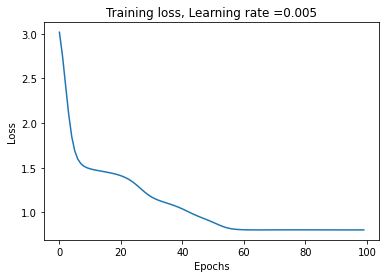

Train cost after epoch 0: 2.621444
Train cost after epoch 10: 1.487938
Train cost after epoch 20: 1.423379
Train cost after epoch 30: 1.303129
Train cost after epoch 40: 1.142960
Train cost after epoch 50: 1.091535
Train cost after epoch 60: 1.044481
Train cost after epoch 70: 1.003193
Train cost after epoch 80: 0.967537
Train cost after epoch 90: 0.936971


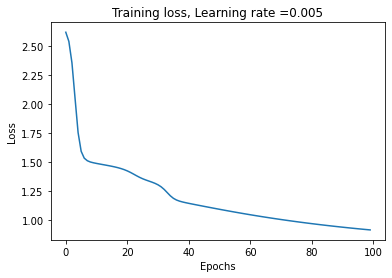

Train cost after epoch 0: 2.304811
Train cost after epoch 10: 2.250024
Train cost after epoch 20: 1.256748
Train cost after epoch 30: 0.925499
Train cost after epoch 40: 0.896564
Train cost after epoch 50: 0.872594
Train cost after epoch 60: 0.853524
Train cost after epoch 70: 0.838874
Train cost after epoch 80: 0.827967
Train cost after epoch 90: 0.820099


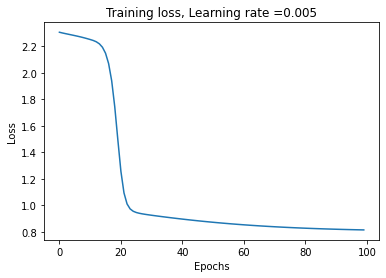

Train cost after epoch 0: 2.812334
Train cost after epoch 10: 2.688322
Train cost after epoch 20: 2.617667
Train cost after epoch 30: 1.138317
Train cost after epoch 40: 0.894446
Train cost after epoch 50: 0.867398
Train cost after epoch 60: 0.846698
Train cost after epoch 70: 0.831716
Train cost after epoch 80: 0.821398
Train cost after epoch 90: 0.814615


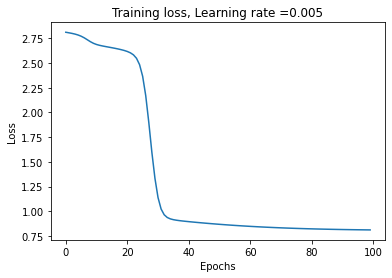

Train cost after epoch 0: 4.124469
Train cost after epoch 10: 2.280885
Train cost after epoch 20: 1.993476
Train cost after epoch 30: 0.959552
Train cost after epoch 40: 0.855598
Train cost after epoch 50: 0.821363
Train cost after epoch 60: 0.811782
Train cost after epoch 70: 0.805459
Train cost after epoch 80: 0.805992
Train cost after epoch 90: 0.805401


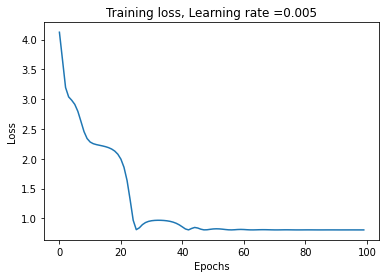

Train cost after epoch 0: 3.409805
Train cost after epoch 10: 3.150056
Train cost after epoch 20: 1.148293
Train cost after epoch 30: 1.084543
Train cost after epoch 40: 1.045244
Train cost after epoch 50: 1.009550
Train cost after epoch 60: 0.977697
Train cost after epoch 70: 0.949405
Train cost after epoch 80: 0.924469
Train cost after epoch 90: 0.902704


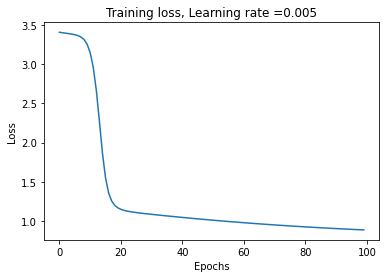

Train cost after epoch 0: 2.633496
Train cost after epoch 10: 1.880591
Train cost after epoch 20: 1.490669
Train cost after epoch 30: 1.435143
Train cost after epoch 40: 1.373612
Train cost after epoch 50: 0.995167
Train cost after epoch 60: 0.897424
Train cost after epoch 70: 0.865066
Train cost after epoch 80: 0.841900
Train cost after epoch 90: 0.826536


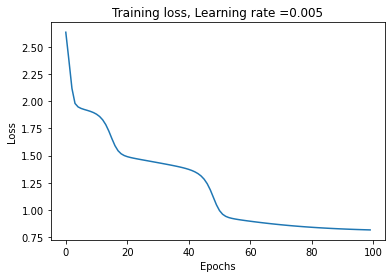

Train cost after epoch 0: 2.305505
Train cost after epoch 10: 2.246362
Train cost after epoch 20: 2.083235
Train cost after epoch 30: 1.083173
Train cost after epoch 40: 0.935491
Train cost after epoch 50: 0.903233
Train cost after epoch 60: 0.876879
Train cost after epoch 70: 0.856216
Train cost after epoch 80: 0.840368
Train cost after epoch 90: 0.828258


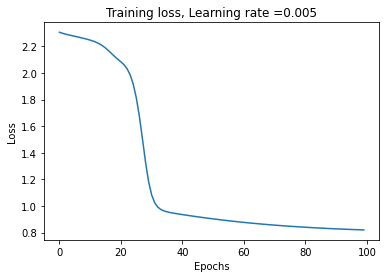

Train cost after epoch 0: 3.518043
Train cost after epoch 10: 2.167138
Train cost after epoch 20: 2.116445
Train cost after epoch 30: 2.031174
Train cost after epoch 40: 1.057545
Train cost after epoch 50: 0.886481
Train cost after epoch 60: 0.858371
Train cost after epoch 70: 0.838233
Train cost after epoch 80: 0.824639
Train cost after epoch 90: 0.815984


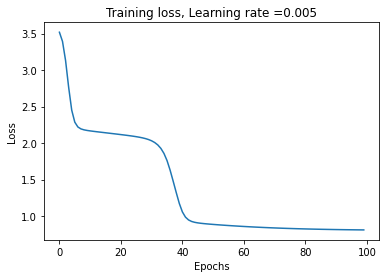

Train cost after epoch 0: 1.573870
Train cost after epoch 10: 1.522245
Train cost after epoch 20: 1.248361
Train cost after epoch 30: 1.123688
Train cost after epoch 40: 0.906360
Train cost after epoch 50: 0.870740
Train cost after epoch 60: 0.845835
Train cost after epoch 70: 0.828266
Train cost after epoch 80: 0.816911
Train cost after epoch 90: 0.810347


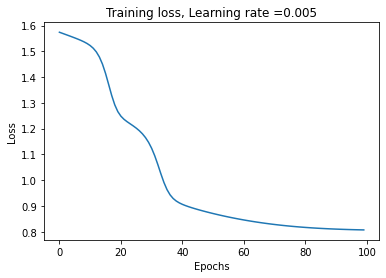

Train cost after epoch 0: 2.420599
Train cost after epoch 10: 0.962521
Train cost after epoch 20: 0.846240
Train cost after epoch 30: 0.821025
Train cost after epoch 40: 0.812830
Train cost after epoch 50: 0.802337
Train cost after epoch 60: 0.803232
Train cost after epoch 70: 0.802267
Train cost after epoch 80: 0.801785
Train cost after epoch 90: 0.801190


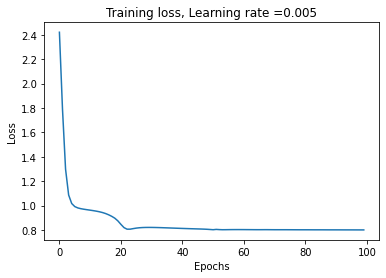

Train cost after epoch 0: 3.286995
Train cost after epoch 10: 3.029986
Train cost after epoch 20: 2.560682
Train cost after epoch 30: 2.210594
Train cost after epoch 40: 2.137126
Train cost after epoch 50: 1.715597
Train cost after epoch 60: 1.488214
Train cost after epoch 70: 1.417412
Train cost after epoch 80: 1.352581
Train cost after epoch 90: 1.293836


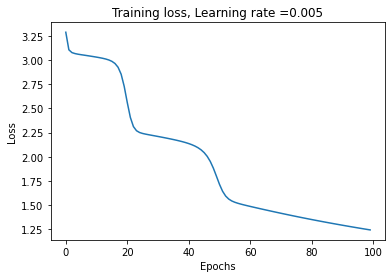

Train cost after epoch 0: 3.362946
Train cost after epoch 10: 3.232452
Train cost after epoch 20: 1.606170
Train cost after epoch 30: 1.425067
Train cost after epoch 40: 1.162976
Train cost after epoch 50: 1.063794
Train cost after epoch 60: 1.005993
Train cost after epoch 70: 0.961286
Train cost after epoch 80: 0.924825
Train cost after epoch 90: 0.895490


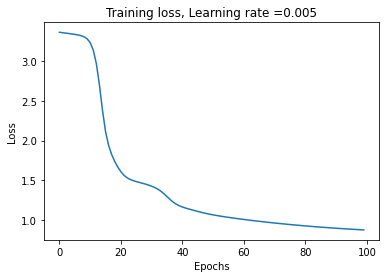

Train cost after epoch 0: 3.911167
Train cost after epoch 10: 2.503019
Train cost after epoch 20: 2.103812
Train cost after epoch 30: 1.871994
Train cost after epoch 40: 1.450319
Train cost after epoch 50: 1.019833
Train cost after epoch 60: 0.895411
Train cost after epoch 70: 0.862093
Train cost after epoch 80: 0.839756
Train cost after epoch 90: 0.825127


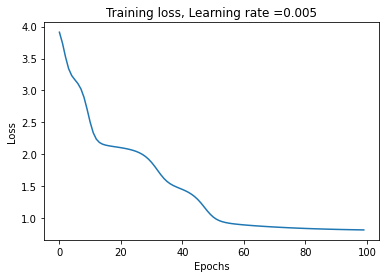

Train cost after epoch 0: 2.459906
Train cost after epoch 10: 1.590036
Train cost after epoch 20: 1.541015
Train cost after epoch 30: 1.057645
Train cost after epoch 40: 1.013764
Train cost after epoch 50: 0.926115
Train cost after epoch 60: 0.806301
Train cost after epoch 70: 0.810226
Train cost after epoch 80: 0.809380
Train cost after epoch 90: 0.805493


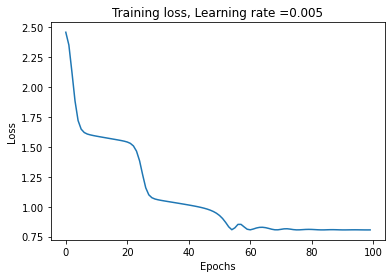

Train cost after epoch 0: 2.355171
Train cost after epoch 10: 1.782688
Train cost after epoch 20: 1.170077
Train cost after epoch 30: 1.012338
Train cost after epoch 40: 0.969536
Train cost after epoch 50: 0.909691
Train cost after epoch 60: 0.828877
Train cost after epoch 70: 0.806630
Train cost after epoch 80: 0.804851
Train cost after epoch 90: 0.805277


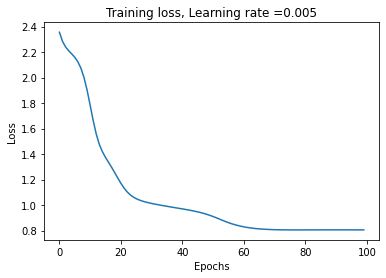

Train cost after epoch 0: 3.096724
Train cost after epoch 10: 3.045535
Train cost after epoch 20: 2.206811
Train cost after epoch 30: 0.923255
Train cost after epoch 40: 0.892399
Train cost after epoch 50: 0.868333
Train cost after epoch 60: 0.849454
Train cost after epoch 70: 0.835231
Train cost after epoch 80: 0.824888
Train cost after epoch 90: 0.817627


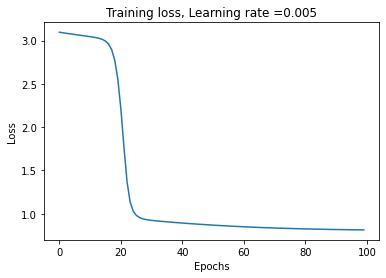

Train cost after epoch 0: 1.956185
Train cost after epoch 10: 1.605673
Train cost after epoch 20: 1.281213
Train cost after epoch 30: 0.822270
Train cost after epoch 40: 0.811950
Train cost after epoch 50: 0.807269
Train cost after epoch 60: 0.805394
Train cost after epoch 70: 0.803795
Train cost after epoch 80: 0.801590
Train cost after epoch 90: 0.800909


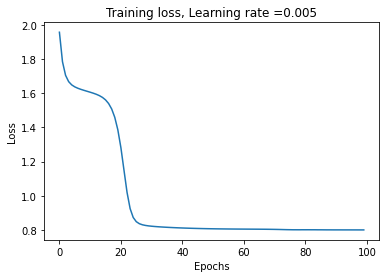

Train cost after epoch 0: 2.473049
Train cost after epoch 10: 2.422519
Train cost after epoch 20: 1.975316
Train cost after epoch 30: 1.496211
Train cost after epoch 40: 1.435132
Train cost after epoch 50: 1.299760
Train cost after epoch 60: 1.102733
Train cost after epoch 70: 1.031908
Train cost after epoch 80: 0.980217
Train cost after epoch 90: 0.938276


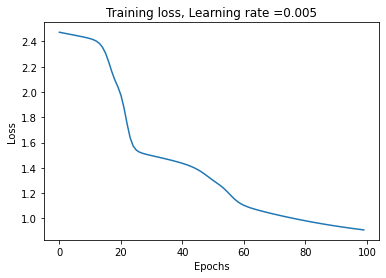

Train cost after epoch 0: 3.335494
Train cost after epoch 10: 3.284100
Train cost after epoch 20: 2.880363
Train cost after epoch 30: 2.086906
Train cost after epoch 40: 1.647343
Train cost after epoch 50: 1.493127
Train cost after epoch 60: 1.165910
Train cost after epoch 70: 0.838558
Train cost after epoch 80: 0.814532
Train cost after epoch 90: 0.807217


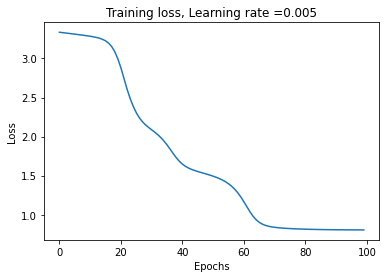

Train cost after epoch 0: 2.607136
Train cost after epoch 10: 2.461123
Train cost after epoch 20: 2.059948
Train cost after epoch 30: 1.525341
Train cost after epoch 40: 1.451112
Train cost after epoch 50: 1.392975
Train cost after epoch 60: 1.179553
Train cost after epoch 70: 0.972917
Train cost after epoch 80: 0.925335
Train cost after epoch 90: 0.888051


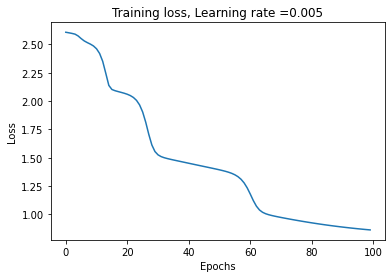

Train cost after epoch 0: 2.287930
Train cost after epoch 10: 2.240930
Train cost after epoch 20: 2.165136
Train cost after epoch 30: 1.876008
Train cost after epoch 40: 0.848856
Train cost after epoch 50: 0.820078
Train cost after epoch 60: 0.810949
Train cost after epoch 70: 0.806772
Train cost after epoch 80: 0.805295
Train cost after epoch 90: 0.804941


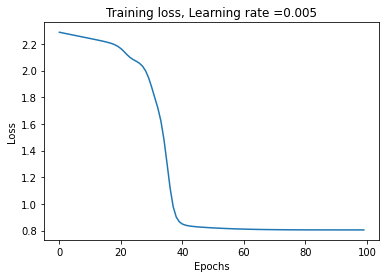

Train cost after epoch 0: 1.858967
Train cost after epoch 10: 0.998348
Train cost after epoch 20: 0.967378
Train cost after epoch 30: 0.940212
Train cost after epoch 40: 0.915677
Train cost after epoch 50: 0.860850
Train cost after epoch 60: 0.820227
Train cost after epoch 70: 0.809720
Train cost after epoch 80: 0.807619
Train cost after epoch 90: 0.807676


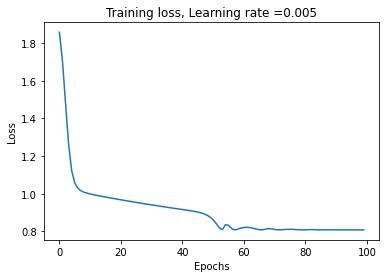

Train cost after epoch 0: 1.457756
Train cost after epoch 10: 1.400078
Train cost after epoch 20: 1.359031
Train cost after epoch 30: 1.318288
Train cost after epoch 40: 1.243726
Train cost after epoch 50: 1.184906
Train cost after epoch 60: 1.130207
Train cost after epoch 70: 1.080831
Train cost after epoch 80: 1.037371
Train cost after epoch 90: 0.999352


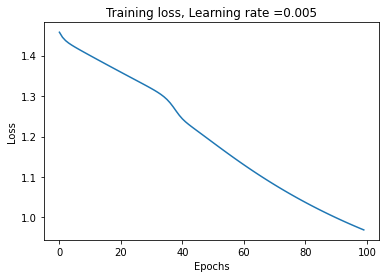

Train cost after epoch 0: 2.119633
Train cost after epoch 10: 2.050308
Train cost after epoch 20: 1.938983
Train cost after epoch 30: 1.417373
Train cost after epoch 40: 1.359814
Train cost after epoch 50: 1.306901
Train cost after epoch 60: 1.257326
Train cost after epoch 70: 1.211296
Train cost after epoch 80: 1.168552
Train cost after epoch 90: 1.128822


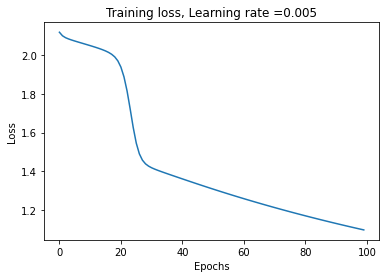

Train cost after epoch 0: 2.759296
Train cost after epoch 10: 2.560351
Train cost after epoch 20: 1.532469
Train cost after epoch 30: 1.430582
Train cost after epoch 40: 0.963616
Train cost after epoch 50: 0.881900
Train cost after epoch 60: 0.854333
Train cost after epoch 70: 0.835235
Train cost after epoch 80: 0.822573
Train cost after epoch 90: 0.814648


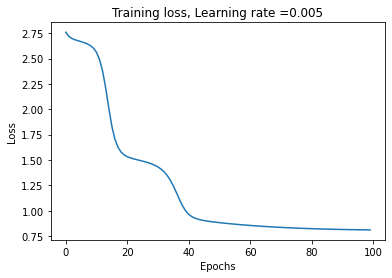

Train cost after epoch 0: 3.020874
Train cost after epoch 10: 2.966733
Train cost after epoch 20: 2.025283
Train cost after epoch 30: 1.820658
Train cost after epoch 40: 1.320538
Train cost after epoch 50: 1.228507
Train cost after epoch 60: 1.171623
Train cost after epoch 70: 1.120836
Train cost after epoch 80: 1.075686
Train cost after epoch 90: 1.035583


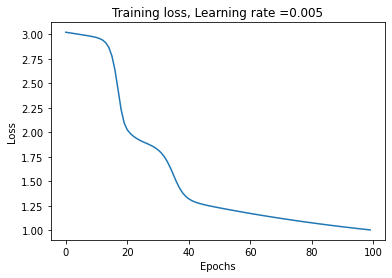

Train cost after epoch 0: 2.512506
Train cost after epoch 10: 2.169849
Train cost after epoch 20: 1.909476
Train cost after epoch 30: 1.810032
Train cost after epoch 40: 1.457183
Train cost after epoch 50: 1.282593
Train cost after epoch 60: 0.994151
Train cost after epoch 70: 0.907981
Train cost after epoch 80: 0.871126
Train cost after epoch 90: 0.845418


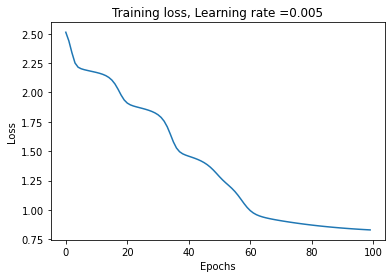

Train cost after epoch 0: 3.548673
Train cost after epoch 10: 2.406503
Train cost after epoch 20: 1.775296
Train cost after epoch 30: 1.467663
Train cost after epoch 40: 1.348350
Train cost after epoch 50: 0.882526
Train cost after epoch 60: 0.806842
Train cost after epoch 70: 0.809037
Train cost after epoch 80: 0.804837
Train cost after epoch 90: 0.805136


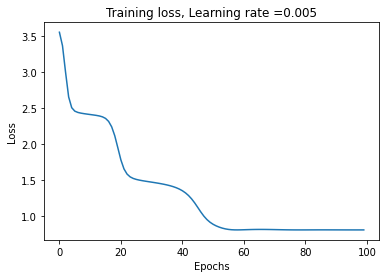

Train cost after epoch 0: 1.905298
Train cost after epoch 10: 1.859894
Train cost after epoch 20: 1.814995
Train cost after epoch 30: 1.770449
Train cost after epoch 40: 1.726305
Train cost after epoch 50: 1.682608
Train cost after epoch 60: 1.639401
Train cost after epoch 70: 1.596727
Train cost after epoch 80: 1.554631
Train cost after epoch 90: 1.513160


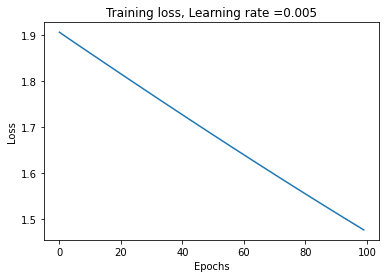

Train cost after epoch 0: 3.162550
Train cost after epoch 10: 2.421997
Train cost after epoch 20: 2.322938
Train cost after epoch 30: 1.653080
Train cost after epoch 40: 1.551213
Train cost after epoch 50: 1.281134
Train cost after epoch 60: 1.116008
Train cost after epoch 70: 1.056743
Train cost after epoch 80: 1.007364
Train cost after epoch 90: 0.966082


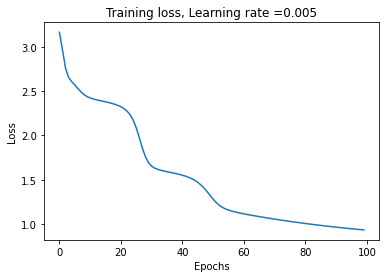

Train cost after epoch 0: 3.380703
Train cost after epoch 10: 1.915248
Train cost after epoch 20: 1.799052
Train cost after epoch 30: 1.611215
Train cost after epoch 40: 1.478987
Train cost after epoch 50: 1.054753
Train cost after epoch 60: 1.003302
Train cost after epoch 70: 0.959675
Train cost after epoch 80: 0.923652
Train cost after epoch 90: 0.894622


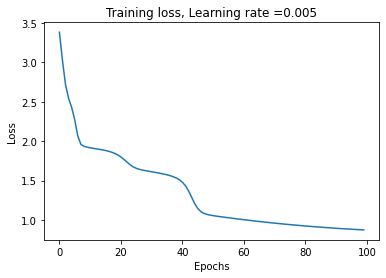

Train cost after epoch 0: 1.239675
Train cost after epoch 10: 1.200719
Train cost after epoch 20: 1.164279
Train cost after epoch 30: 1.129152
Train cost after epoch 40: 1.095532
Train cost after epoch 50: 1.063580
Train cost after epoch 60: 1.033437
Train cost after epoch 70: 1.005219
Train cost after epoch 80: 0.979023
Train cost after epoch 90: 0.954925


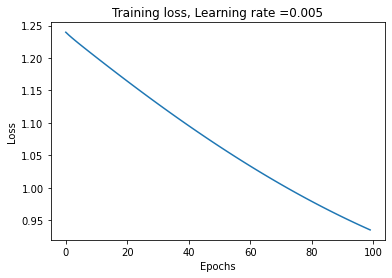

Train cost after epoch 0: 2.765055
Train cost after epoch 10: 1.630291
Train cost after epoch 20: 0.929346
Train cost after epoch 30: 0.891532
Train cost after epoch 40: 0.868234
Train cost after epoch 50: 0.849963
Train cost after epoch 60: 0.835967
Train cost after epoch 70: 0.825611
Train cost after epoch 80: 0.818215
Train cost after epoch 90: 0.813130


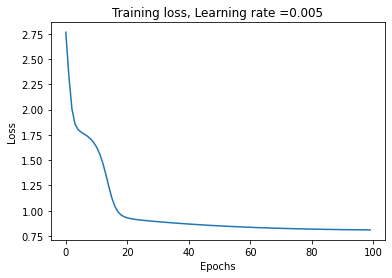

Train cost after epoch 0: 2.464764
Train cost after epoch 10: 1.799205
Train cost after epoch 20: 1.740773
Train cost after epoch 30: 1.500390
Train cost after epoch 40: 1.421600
Train cost after epoch 50: 1.291221
Train cost after epoch 60: 0.951449
Train cost after epoch 70: 0.905927
Train cost after epoch 80: 0.872311
Train cost after epoch 90: 0.848090


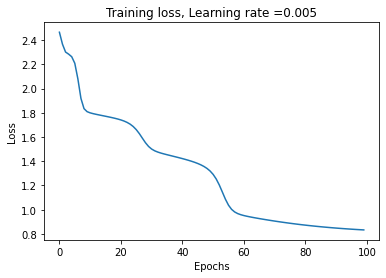

Train cost after epoch 0: 2.096387
Train cost after epoch 10: 0.851783
Train cost after epoch 20: 0.837311
Train cost after epoch 30: 0.826216
Train cost after epoch 40: 0.818080
Train cost after epoch 50: 0.812494
Train cost after epoch 60: 0.808935
Train cost after epoch 70: 0.806846
Train cost after epoch 80: 0.805725
Train cost after epoch 90: 0.805175


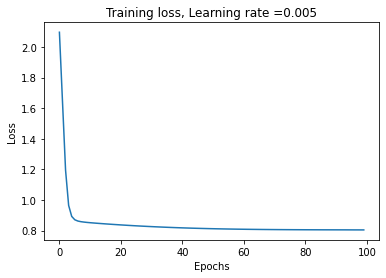

Train cost after epoch 0: 3.016129
Train cost after epoch 10: 2.340009
Train cost after epoch 20: 1.269035
Train cost after epoch 30: 1.179367
Train cost after epoch 40: 0.825977
Train cost after epoch 50: 0.805870
Train cost after epoch 60: 0.803601
Train cost after epoch 70: 0.802732
Train cost after epoch 80: 0.802255
Train cost after epoch 90: 0.801793


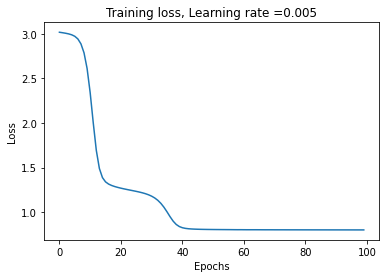

Train cost after epoch 0: 3.181889
Train cost after epoch 10: 2.406495
Train cost after epoch 20: 1.769526
Train cost after epoch 30: 1.123101
Train cost after epoch 40: 1.025653
Train cost after epoch 50: 0.982057
Train cost after epoch 60: 0.946111
Train cost after epoch 70: 0.916030
Train cost after epoch 80: 0.891106
Train cost after epoch 90: 0.870732


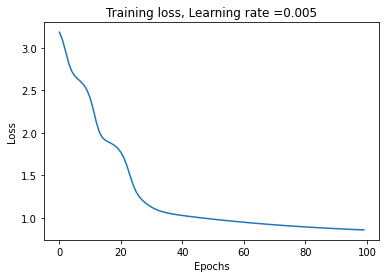

Train cost after epoch 0: 3.918571
Train cost after epoch 10: 2.734972
Train cost after epoch 20: 2.211230
Train cost after epoch 30: 1.029103
Train cost after epoch 40: 0.896209
Train cost after epoch 50: 0.869030
Train cost after epoch 60: 0.848081
Train cost after epoch 70: 0.832835
Train cost after epoch 80: 0.822257
Train cost after epoch 90: 0.815240


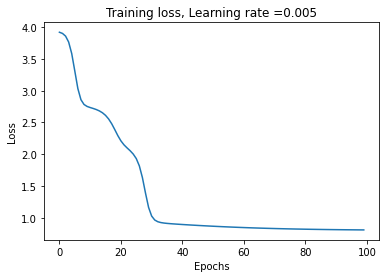

Train cost after epoch 0: 2.624380
Train cost after epoch 10: 1.982225
Train cost after epoch 20: 1.617154
Train cost after epoch 30: 1.397104
Train cost after epoch 40: 0.948782
Train cost after epoch 50: 0.908340
Train cost after epoch 60: 0.878117
Train cost after epoch 70: 0.855083
Train cost after epoch 80: 0.838226
Train cost after epoch 90: 0.826324


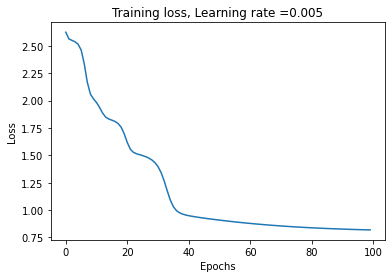

Train cost after epoch 0: 2.166044
Train cost after epoch 10: 1.390546
Train cost after epoch 20: 1.342732
Train cost after epoch 30: 1.301602
Train cost after epoch 40: 1.262081
Train cost after epoch 50: 1.217800
Train cost after epoch 60: 1.149442
Train cost after epoch 70: 1.089389
Train cost after epoch 80: 1.035868
Train cost after epoch 90: 0.990439


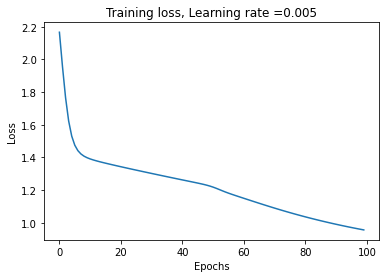

Train cost after epoch 0: 2.469380
Train cost after epoch 10: 2.149096
Train cost after epoch 20: 1.888545
Train cost after epoch 30: 1.414999
Train cost after epoch 40: 1.352249
Train cost after epoch 50: 1.291760
Train cost after epoch 60: 1.232541
Train cost after epoch 70: 1.178362
Train cost after epoch 80: 1.129646
Train cost after epoch 90: 1.085921


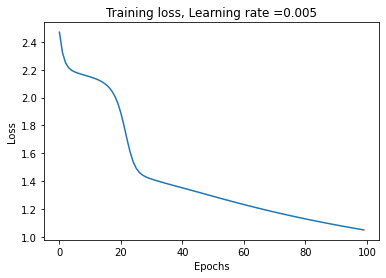

__________________________________________________ 0.7% GA is running...Train cost after epoch 0: 2.533605
Train cost after epoch 10: 2.378875
Train cost after epoch 20: 1.568825
Train cost after epoch 30: 1.141037
Train cost after epoch 40: 0.816314
Train cost after epoch 50: 0.805626
Train cost after epoch 60: 0.804785
Train cost after epoch 70: 0.804618
Train cost after epoch 80: 0.804582
Train cost after epoch 90: 0.804503


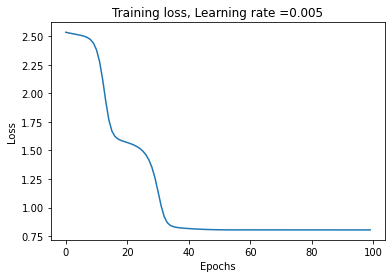

Train cost after epoch 0: 1.905034
Train cost after epoch 10: 1.859693
Train cost after epoch 20: 1.811950
Train cost after epoch 30: 1.311251
Train cost after epoch 40: 0.872651
Train cost after epoch 50: 0.847842
Train cost after epoch 60: 0.830738
Train cost after epoch 70: 0.819441
Train cost after epoch 80: 0.812529
Train cost after epoch 90: 0.808609


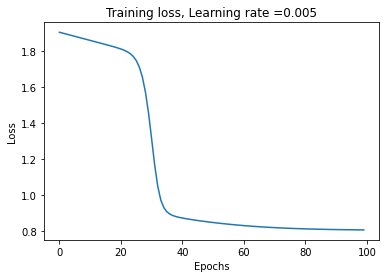

Train cost after epoch 0: 1.110921
Train cost after epoch 10: 1.050012
Train cost after epoch 20: 1.018682
Train cost after epoch 30: 0.989411
Train cost after epoch 40: 0.962296
Train cost after epoch 50: 0.937578
Train cost after epoch 60: 0.915322
Train cost after epoch 70: 0.895550
Train cost after epoch 80: 0.878243
Train cost after epoch 90: 0.863328


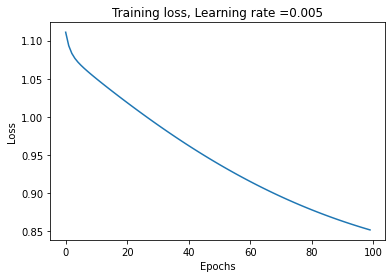

Train cost after epoch 0: 4.343772
Train cost after epoch 10: 1.337891
Train cost after epoch 20: 0.824227
Train cost after epoch 30: 0.814222
Train cost after epoch 40: 0.808591
Train cost after epoch 50: 0.804859
Train cost after epoch 60: 0.804903
Train cost after epoch 70: 0.804584
Train cost after epoch 80: 0.803265
Train cost after epoch 90: 0.801232


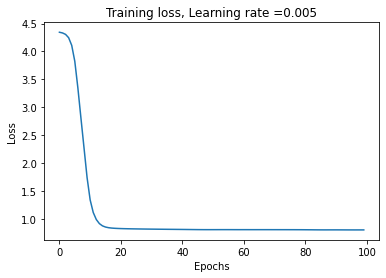

Train cost after epoch 0: 2.416122
Train cost after epoch 10: 2.271374
Train cost after epoch 20: 1.169774
Train cost after epoch 30: 1.060603
Train cost after epoch 40: 0.880062
Train cost after epoch 50: 0.847541
Train cost after epoch 60: 0.828241
Train cost after epoch 70: 0.816430
Train cost after epoch 80: 0.809953
Train cost after epoch 90: 0.806817


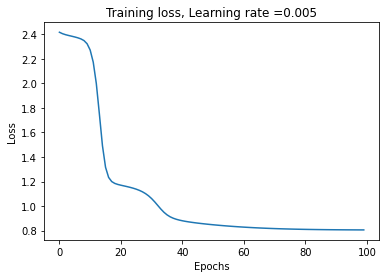

Train cost after epoch 0: 2.656820
Train cost after epoch 10: 1.908213
Train cost after epoch 20: 1.856903
Train cost after epoch 30: 1.612742
Train cost after epoch 40: 1.026347
Train cost after epoch 50: 0.979197
Train cost after epoch 60: 0.941255
Train cost after epoch 70: 0.909765
Train cost after epoch 80: 0.884231
Train cost after epoch 90: 0.863885


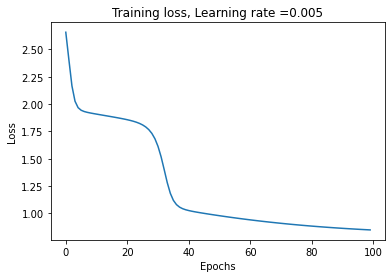

Train cost after epoch 0: 1.392868
Train cost after epoch 10: 1.233577
Train cost after epoch 20: 0.860050
Train cost after epoch 30: 0.840239
Train cost after epoch 40: 0.826092
Train cost after epoch 50: 0.816492
Train cost after epoch 60: 0.810642
Train cost after epoch 70: 0.807441
Train cost after epoch 80: 0.805882
Train cost after epoch 90: 0.805219


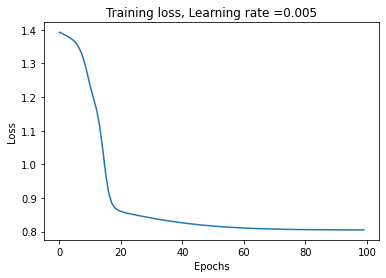

Train cost after epoch 0: 1.758351
Train cost after epoch 10: 1.698711
Train cost after epoch 20: 1.654515
Train cost after epoch 30: 1.573099
Train cost after epoch 40: 1.114066
Train cost after epoch 50: 1.063283
Train cost after epoch 60: 1.017781
Train cost after epoch 70: 0.978232
Train cost after epoch 80: 0.944539
Train cost after epoch 90: 0.916121


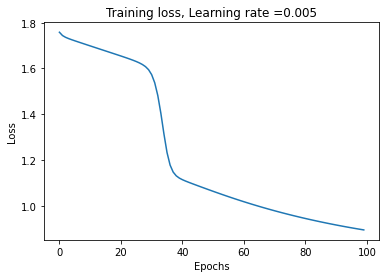

Train cost after epoch 0: 3.010666
Train cost after epoch 10: 1.564645
Train cost after epoch 20: 1.440924
Train cost after epoch 30: 0.894658
Train cost after epoch 40: 0.853074
Train cost after epoch 50: 0.834496
Train cost after epoch 60: 0.821951
Train cost after epoch 70: 0.814046
Train cost after epoch 80: 0.809438
Train cost after epoch 90: 0.806963


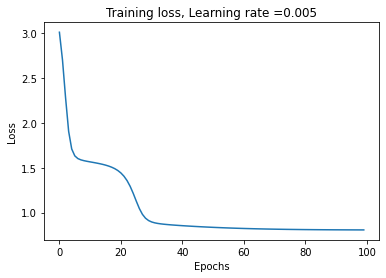

Train cost after epoch 0: 1.613929
Train cost after epoch 10: 1.477563
Train cost after epoch 20: 1.309222
Train cost after epoch 30: 1.240386
Train cost after epoch 40: 1.177991
Train cost after epoch 50: 1.126374
Train cost after epoch 60: 1.079123
Train cost after epoch 70: 1.037113
Train cost after epoch 80: 1.000090
Train cost after epoch 90: 0.967598


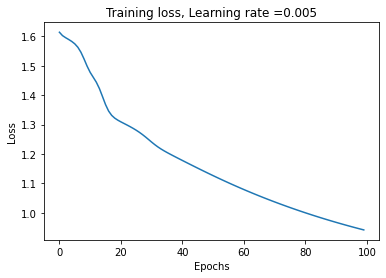

Train cost after epoch 0: 2.183338
Train cost after epoch 10: 2.077186
Train cost after epoch 20: 1.023329
Train cost after epoch 30: 0.987903
Train cost after epoch 40: 0.955411
Train cost after epoch 50: 0.926657
Train cost after epoch 60: 0.901896
Train cost after epoch 70: 0.880956
Train cost after epoch 80: 0.863552
Train cost after epoch 90: 0.849339


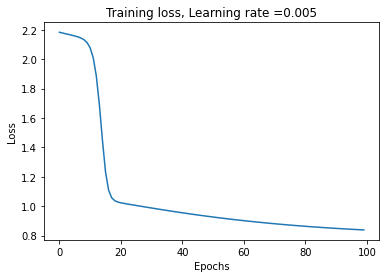

Train cost after epoch 0: 3.399516
Train cost after epoch 10: 2.885129
Train cost after epoch 20: 1.290125
Train cost after epoch 30: 1.046558
Train cost after epoch 40: 1.005961
Train cost after epoch 50: 0.970529
Train cost after epoch 60: 0.939657
Train cost after epoch 70: 0.913156
Train cost after epoch 80: 0.890696
Train cost after epoch 90: 0.871912


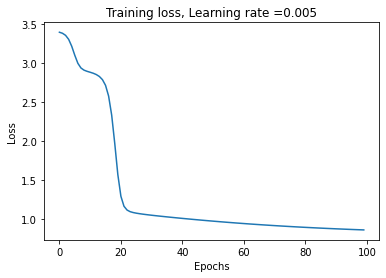

Train cost after epoch 0: 3.688362
Train cost after epoch 10: 1.746101
Train cost after epoch 20: 1.625102
Train cost after epoch 30: 1.576737
Train cost after epoch 40: 1.508092
Train cost after epoch 50: 1.084668
Train cost after epoch 60: 0.980725
Train cost after epoch 70: 0.935550
Train cost after epoch 80: 0.900287
Train cost after epoch 90: 0.873138


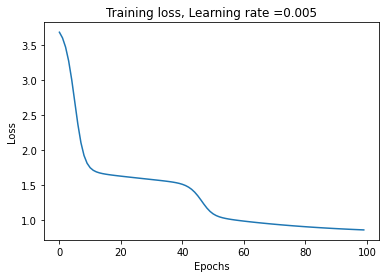

Train cost after epoch 0: 2.396941
Train cost after epoch 10: 1.906411
Train cost after epoch 20: 1.847388
Train cost after epoch 30: 1.791087
Train cost after epoch 40: 1.551598
Train cost after epoch 50: 1.058241
Train cost after epoch 60: 0.995617
Train cost after epoch 70: 0.952003
Train cost after epoch 80: 0.916701
Train cost after epoch 90: 0.888527


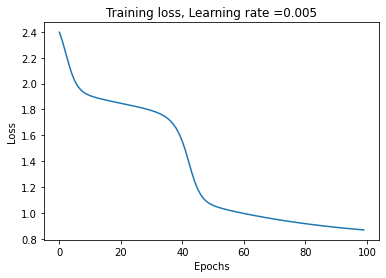

Train cost after epoch 0: 1.955431
Train cost after epoch 10: 1.909749
Train cost after epoch 20: 1.861373
Train cost after epoch 30: 0.940338
Train cost after epoch 40: 0.841092
Train cost after epoch 50: 0.807225
Train cost after epoch 60: 0.806411
Train cost after epoch 70: 0.804756
Train cost after epoch 80: 0.804935
Train cost after epoch 90: 0.804814


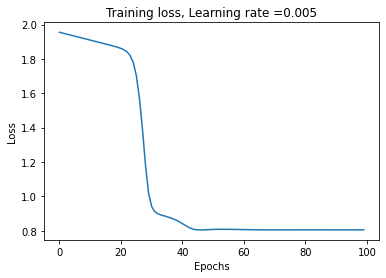

Train cost after epoch 0: 2.893205
Train cost after epoch 10: 2.662534
Train cost after epoch 20: 1.350310
Train cost after epoch 30: 1.298389
Train cost after epoch 40: 1.252485
Train cost after epoch 50: 1.208912
Train cost after epoch 60: 1.167968
Train cost after epoch 70: 1.129605
Train cost after epoch 80: 1.093726
Train cost after epoch 90: 1.060264


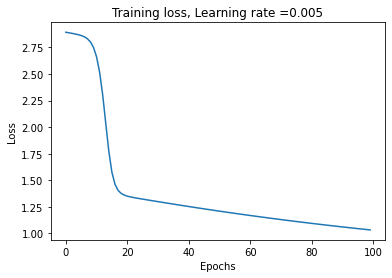

Train cost after epoch 0: 2.593114
Train cost after epoch 10: 2.028428
Train cost after epoch 20: 1.974856
Train cost after epoch 30: 1.813319
Train cost after epoch 40: 1.023729
Train cost after epoch 50: 0.911331
Train cost after epoch 60: 0.840109
Train cost after epoch 70: 0.817460
Train cost after epoch 80: 0.808579
Train cost after epoch 90: 0.805564


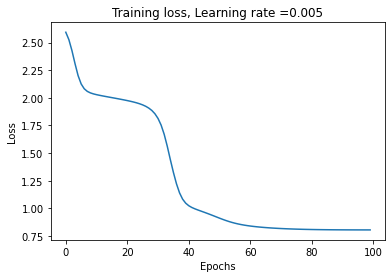

Train cost after epoch 0: 2.516767
Train cost after epoch 10: 2.437634
Train cost after epoch 20: 1.576920
Train cost after epoch 30: 1.367439
Train cost after epoch 40: 1.086526
Train cost after epoch 50: 1.038868
Train cost after epoch 60: 0.996565
Train cost after epoch 70: 0.960078
Train cost after epoch 80: 0.929120
Train cost after epoch 90: 0.903123


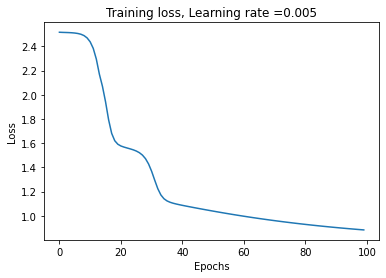

Train cost after epoch 0: 1.470814
Train cost after epoch 10: 1.423577
Train cost after epoch 20: 1.382707
Train cost after epoch 30: 1.342645
Train cost after epoch 40: 1.303496
Train cost after epoch 50: 1.265368
Train cost after epoch 60: 1.228362
Train cost after epoch 70: 1.192576
Train cost after epoch 80: 1.158105
Train cost after epoch 90: 1.125048


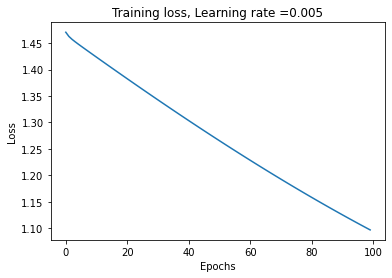

Train cost after epoch 0: 1.412653
Train cost after epoch 10: 1.287172
Train cost after epoch 20: 1.240860
Train cost after epoch 30: 0.952862
Train cost after epoch 40: 0.834275
Train cost after epoch 50: 0.819360
Train cost after epoch 60: 0.810663
Train cost after epoch 70: 0.805691
Train cost after epoch 80: 0.802146
Train cost after epoch 90: 0.799234


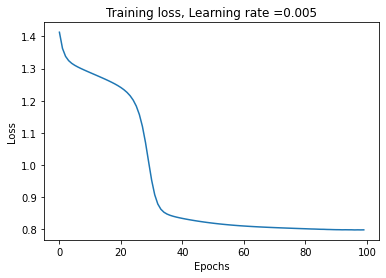

Train cost after epoch 0: 2.646066
Train cost after epoch 10: 2.502289
Train cost after epoch 20: 1.917232
Train cost after epoch 30: 1.861219
Train cost after epoch 40: 1.780395
Train cost after epoch 50: 0.915586
Train cost after epoch 60: 0.823368
Train cost after epoch 70: 0.811852
Train cost after epoch 80: 0.806865
Train cost after epoch 90: 0.805238


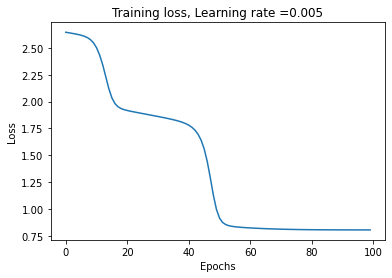

Train cost after epoch 0: 2.455102
Train cost after epoch 10: 1.182138
Train cost after epoch 20: 1.139471
Train cost after epoch 30: 1.102191
Train cost after epoch 40: 1.067009
Train cost after epoch 50: 1.034217
Train cost after epoch 60: 1.003899
Train cost after epoch 70: 0.976082
Train cost after epoch 80: 0.950777
Train cost after epoch 90: 0.927977


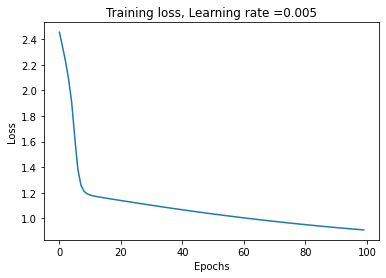

Train cost after epoch 0: 1.882775
Train cost after epoch 10: 0.944927
Train cost after epoch 20: 0.918167
Train cost after epoch 30: 0.832043
Train cost after epoch 40: 0.802168
Train cost after epoch 50: 0.800832
Train cost after epoch 60: 0.800786
Train cost after epoch 70: 0.800539
Train cost after epoch 80: 0.800457
Train cost after epoch 90: 0.800389


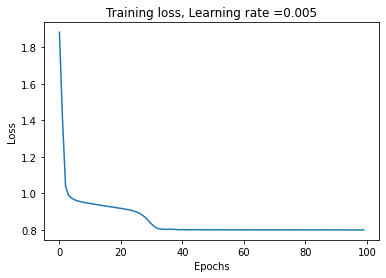

Train cost after epoch 0: 2.166648
Train cost after epoch 10: 2.090553
Train cost after epoch 20: 1.994999
Train cost after epoch 30: 1.270304
Train cost after epoch 40: 1.215000
Train cost after epoch 50: 1.077990
Train cost after epoch 60: 0.909892
Train cost after epoch 70: 0.871705
Train cost after epoch 80: 0.845309
Train cost after epoch 90: 0.827912


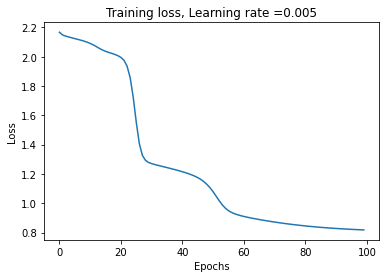

Train cost after epoch 0: 2.148190
Train cost after epoch 10: 1.955833
Train cost after epoch 20: 1.666535
Train cost after epoch 30: 1.615319
Train cost after epoch 40: 1.529850
Train cost after epoch 50: 1.012462
Train cost after epoch 60: 0.886621
Train cost after epoch 70: 0.813268
Train cost after epoch 80: 0.804840
Train cost after epoch 90: 0.805275


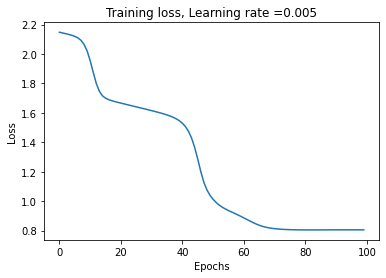

Train cost after epoch 0: 1.001202
Train cost after epoch 10: 0.962869
Train cost after epoch 20: 0.936694
Train cost after epoch 30: 0.912985
Train cost after epoch 40: 0.891960
Train cost after epoch 50: 0.873719
Train cost after epoch 60: 0.858240
Train cost after epoch 70: 0.845393
Train cost after epoch 80: 0.833676
Train cost after epoch 90: 0.801205


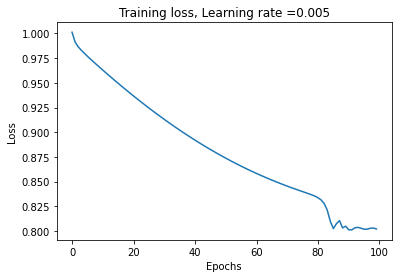

Train cost after epoch 0: 1.184557
Train cost after epoch 10: 1.034286
Train cost after epoch 20: 1.002548
Train cost after epoch 30: 0.970204
Train cost after epoch 40: 0.807775
Train cost after epoch 50: 0.808308
Train cost after epoch 60: 0.805477
Train cost after epoch 70: 0.804903
Train cost after epoch 80: 0.805030
Train cost after epoch 90: 0.804908


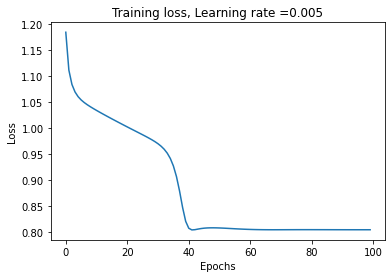

Train cost after epoch 0: 2.296332
Train cost after epoch 10: 2.248657
Train cost after epoch 20: 1.592144
Train cost after epoch 30: 1.537968
Train cost after epoch 40: 1.401608
Train cost after epoch 50: 1.314426
Train cost after epoch 60: 0.855542
Train cost after epoch 70: 0.816907
Train cost after epoch 80: 0.807869
Train cost after epoch 90: 0.805133


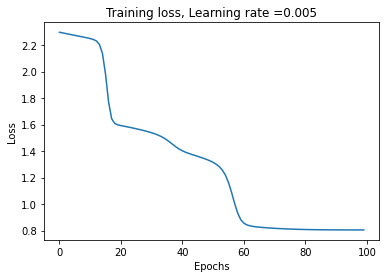

Train cost after epoch 0: 1.726552
Train cost after epoch 10: 1.195933
Train cost after epoch 20: 1.158059
Train cost after epoch 30: 1.121504
Train cost after epoch 40: 1.086759
Train cost after epoch 50: 1.054040
Train cost after epoch 60: 1.023451
Train cost after epoch 70: 0.995063
Train cost after epoch 80: 0.968931
Train cost after epoch 90: 0.945091


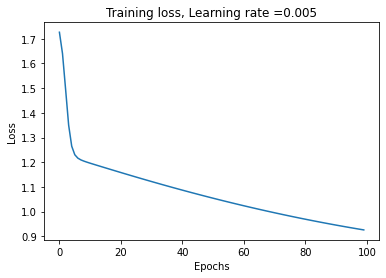

Train cost after epoch 0: 1.644036
Train cost after epoch 10: 1.600612
Train cost after epoch 20: 1.557676
Train cost after epoch 30: 1.515293
Train cost after epoch 40: 1.473547
Train cost after epoch 50: 1.432515
Train cost after epoch 60: 1.392267
Train cost after epoch 70: 1.352874
Train cost after epoch 80: 1.314410
Train cost after epoch 90: 1.276950


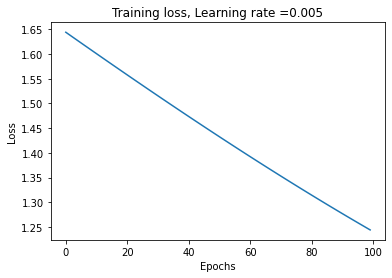

Train cost after epoch 0: 1.475352
Train cost after epoch 10: 1.433179
Train cost after epoch 20: 1.392165
Train cost after epoch 30: 1.350999
Train cost after epoch 40: 1.165531
Train cost after epoch 50: 1.044402
Train cost after epoch 60: 0.997196
Train cost after epoch 70: 0.956224
Train cost after epoch 80: 0.922237
Train cost after epoch 90: 0.894578


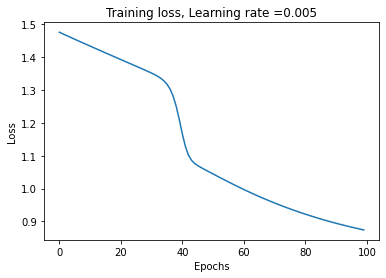

Train cost after epoch 0: 2.753412
Train cost after epoch 10: 2.638812
Train cost after epoch 20: 2.580269
Train cost after epoch 30: 1.456342
Train cost after epoch 40: 0.859666
Train cost after epoch 50: 0.838582
Train cost after epoch 60: 0.824350
Train cost after epoch 70: 0.815212
Train cost after epoch 80: 0.808081
Train cost after epoch 90: 0.806440


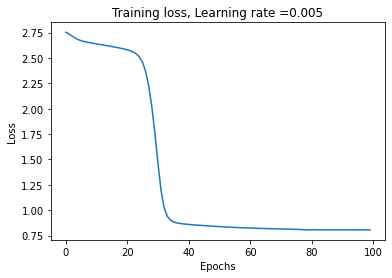

Train cost after epoch 0: 2.189409
Train cost after epoch 10: 1.946583
Train cost after epoch 20: 1.294758
Train cost after epoch 30: 0.852227
Train cost after epoch 40: 0.834348
Train cost after epoch 50: 0.821699
Train cost after epoch 60: 0.813638
Train cost after epoch 70: 0.809007
Train cost after epoch 80: 0.806618
Train cost after epoch 90: 0.805523


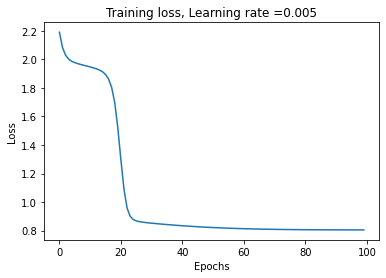

Train cost after epoch 0: 2.651325
Train cost after epoch 10: 1.382721
Train cost after epoch 20: 1.337513
Train cost after epoch 30: 1.296371
Train cost after epoch 40: 1.194120
Train cost after epoch 50: 0.862193
Train cost after epoch 60: 0.833349
Train cost after epoch 70: 0.818106
Train cost after epoch 80: 0.810094
Train cost after epoch 90: 0.806556


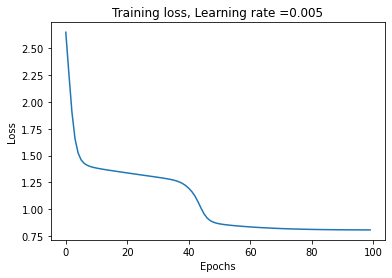

Train cost after epoch 0: 1.725997
Train cost after epoch 10: 1.681913
Train cost after epoch 20: 1.638252
Train cost after epoch 30: 1.595068
Train cost after epoch 40: 1.551928
Train cost after epoch 50: 1.332338
Train cost after epoch 60: 1.248179
Train cost after epoch 70: 1.186488
Train cost after epoch 80: 1.130736
Train cost after epoch 90: 1.081632


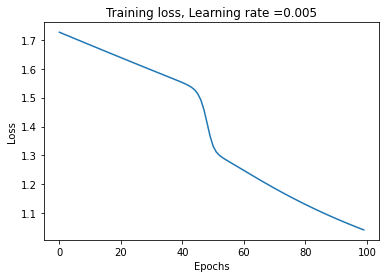

Train cost after epoch 0: 2.220841
Train cost after epoch 10: 1.941718
Train cost after epoch 20: 1.892791
Train cost after epoch 30: 1.842636
Train cost after epoch 40: 1.733724
Train cost after epoch 50: 0.810082
Train cost after epoch 60: 0.809185
Train cost after epoch 70: 0.805882
Train cost after epoch 80: 0.804860
Train cost after epoch 90: 0.804890


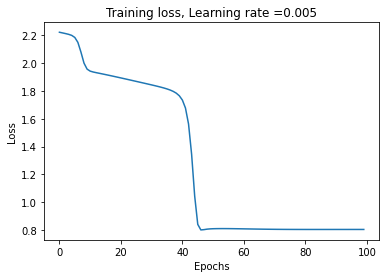

Train cost after epoch 0: 1.659260
Train cost after epoch 10: 1.604614
Train cost after epoch 20: 1.435218
Train cost after epoch 30: 1.357769
Train cost after epoch 40: 1.246128
Train cost after epoch 50: 1.171448
Train cost after epoch 60: 1.115908
Train cost after epoch 70: 1.066902
Train cost after epoch 80: 1.024091
Train cost after epoch 90: 0.986882


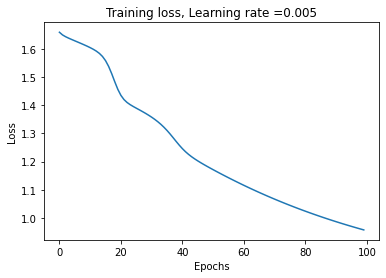

Train cost after epoch 0: 2.284492
Train cost after epoch 10: 1.220130
Train cost after epoch 20: 1.174905
Train cost after epoch 30: 1.136294
Train cost after epoch 40: 1.099470
Train cost after epoch 50: 1.064899
Train cost after epoch 60: 1.032679
Train cost after epoch 70: 1.000515
Train cost after epoch 80: 0.943055
Train cost after epoch 90: 0.896186


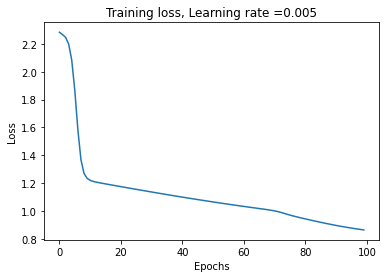

Train cost after epoch 0: 1.920680
Train cost after epoch 10: 1.243055
Train cost after epoch 20: 1.204761
Train cost after epoch 30: 1.168061
Train cost after epoch 40: 1.129957
Train cost after epoch 50: 1.034091
Train cost after epoch 60: 0.976623
Train cost after epoch 70: 0.932766
Train cost after epoch 80: 0.897650
Train cost after epoch 90: 0.870664


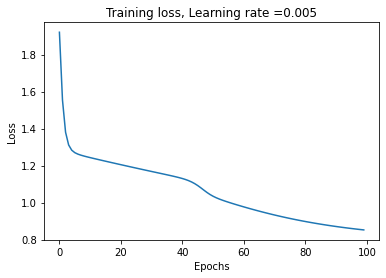

Train cost after epoch 0: 1.655961
Train cost after epoch 10: 1.612367
Train cost after epoch 20: 1.567535
Train cost after epoch 30: 1.401025
Train cost after epoch 40: 1.335302
Train cost after epoch 50: 1.276178
Train cost after epoch 60: 1.208490
Train cost after epoch 70: 1.143528
Train cost after epoch 80: 1.085856
Train cost after epoch 90: 1.036215


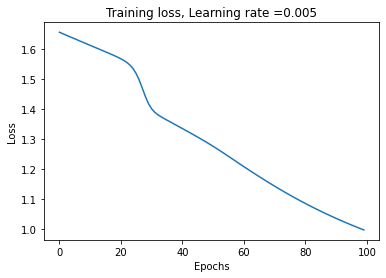

Train cost after epoch 0: 3.084829
Train cost after epoch 10: 2.007132
Train cost after epoch 20: 1.752566
Train cost after epoch 30: 1.601257
Train cost after epoch 40: 1.368471
Train cost after epoch 50: 0.956199
Train cost after epoch 60: 0.815469
Train cost after epoch 70: 0.813270
Train cost after epoch 80: 0.808023
Train cost after epoch 90: 0.807478


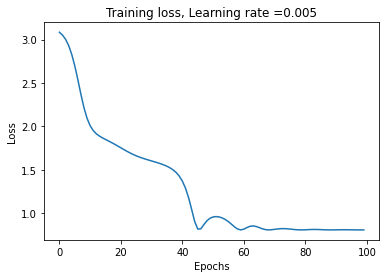

Train cost after epoch 0: 3.244048
Train cost after epoch 10: 1.422846
Train cost after epoch 20: 1.012474
Train cost after epoch 30: 0.975136
Train cost after epoch 40: 0.933447
Train cost after epoch 50: 0.839575
Train cost after epoch 60: 0.819054
Train cost after epoch 70: 0.809213
Train cost after epoch 80: 0.805642
Train cost after epoch 90: 0.804902


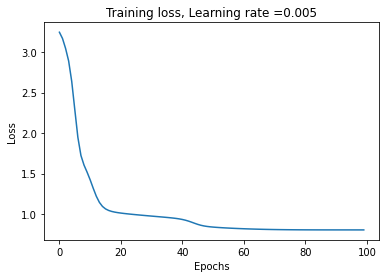

Train cost after epoch 0: 1.609343
Train cost after epoch 10: 1.511375
Train cost after epoch 20: 1.468379
Train cost after epoch 30: 1.375661
Train cost after epoch 40: 0.911054
Train cost after epoch 50: 0.878276
Train cost after epoch 60: 0.853360
Train cost after epoch 70: 0.835337
Train cost after epoch 80: 0.823118
Train cost after epoch 90: 0.815275


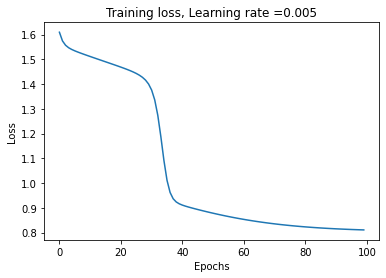

Train cost after epoch 0: 4.049268
Train cost after epoch 10: 2.230284
Train cost after epoch 20: 2.179965
Train cost after epoch 30: 2.090042
Train cost after epoch 40: 1.353082
Train cost after epoch 50: 1.157122
Train cost after epoch 60: 1.076051
Train cost after epoch 70: 0.874033
Train cost after epoch 80: 0.828859
Train cost after epoch 90: 0.812953


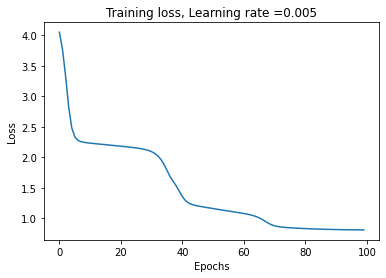

Train cost after epoch 0: 4.059906
Train cost after epoch 10: 2.241569
Train cost after epoch 20: 0.928859
Train cost after epoch 30: 0.859627
Train cost after epoch 40: 0.833796
Train cost after epoch 50: 0.804150
Train cost after epoch 60: 0.801577
Train cost after epoch 70: 0.801974
Train cost after epoch 80: 0.801688
Train cost after epoch 90: 0.801438


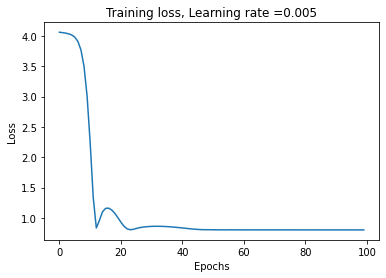

Train cost after epoch 0: 1.709821
Train cost after epoch 10: 1.660720
Train cost after epoch 20: 1.585042
Train cost after epoch 30: 0.812290
Train cost after epoch 40: 0.806521
Train cost after epoch 50: 0.805026
Train cost after epoch 60: 0.804665
Train cost after epoch 70: 0.800789
Train cost after epoch 80: 0.799155
Train cost after epoch 90: 0.798783


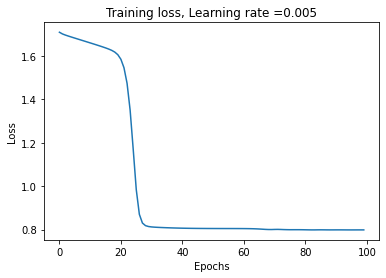

Train cost after epoch 0: 1.712537
Train cost after epoch 10: 0.887341
Train cost after epoch 20: 0.863351
Train cost after epoch 30: 0.846609
Train cost after epoch 40: 0.833288
Train cost after epoch 50: 0.822999
Train cost after epoch 60: 0.815108
Train cost after epoch 70: 0.808995
Train cost after epoch 80: 0.804733
Train cost after epoch 90: 0.801851


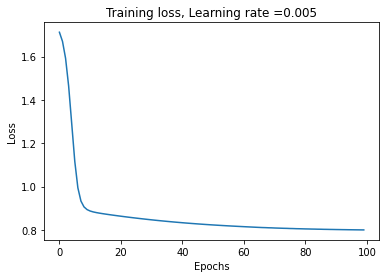

Train cost after epoch 0: 1.407815
Train cost after epoch 10: 1.365769
Train cost after epoch 20: 1.325619
Train cost after epoch 30: 1.129966
Train cost after epoch 40: 0.812869
Train cost after epoch 50: 0.806988
Train cost after epoch 60: 0.805017
Train cost after epoch 70: 0.804931
Train cost after epoch 80: 0.804879
Train cost after epoch 90: 0.804176


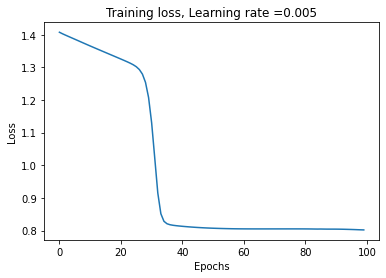

Train cost after epoch 0: 2.382714
Train cost after epoch 10: 2.164391
Train cost after epoch 20: 2.060390
Train cost after epoch 30: 1.459528
Train cost after epoch 40: 1.382341
Train cost after epoch 50: 0.932723
Train cost after epoch 60: 0.850644
Train cost after epoch 70: 0.838569
Train cost after epoch 80: 0.816916
Train cost after epoch 90: 0.803038


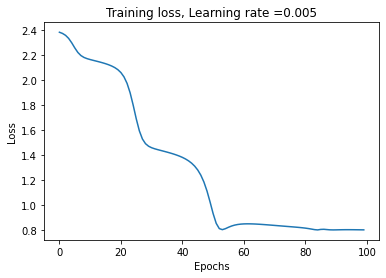

Train cost after epoch 0: 3.437354
Train cost after epoch 10: 3.379467
Train cost after epoch 20: 3.301362
Train cost after epoch 30: 2.022099
Train cost after epoch 40: 1.339072
Train cost after epoch 50: 1.275496
Train cost after epoch 60: 1.222415
Train cost after epoch 70: 1.174185
Train cost after epoch 80: 1.130233
Train cost after epoch 90: 1.090105


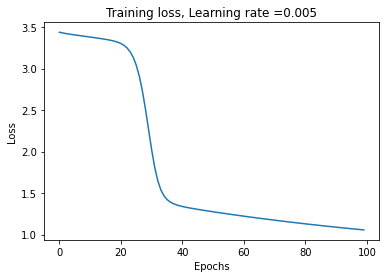

Train cost after epoch 0: 1.974855
Train cost after epoch 10: 1.928777
Train cost after epoch 20: 1.883364
Train cost after epoch 30: 1.836291
Train cost after epoch 40: 1.604653
Train cost after epoch 50: 1.312795
Train cost after epoch 60: 1.243241
Train cost after epoch 70: 1.168458
Train cost after epoch 80: 1.064038
Train cost after epoch 90: 0.982001


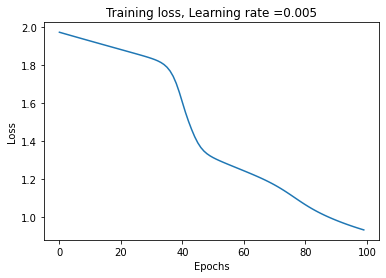

Train cost after epoch 0: 3.604171
Train cost after epoch 10: 2.291588
Train cost after epoch 20: 2.242123
Train cost after epoch 30: 2.191599
Train cost after epoch 40: 1.746630
Train cost after epoch 50: 1.199953
Train cost after epoch 60: 1.030524
Train cost after epoch 70: 0.856727
Train cost after epoch 80: 0.828904
Train cost after epoch 90: 0.814498


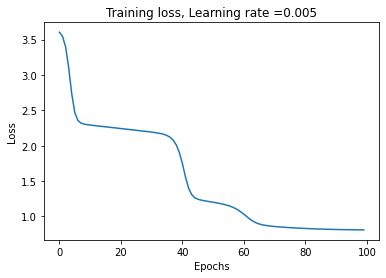

Train cost after epoch 0: 2.238889
Train cost after epoch 10: 2.124604
Train cost after epoch 20: 1.282923
Train cost after epoch 30: 1.235346
Train cost after epoch 40: 1.182190
Train cost after epoch 50: 0.938359
Train cost after epoch 60: 0.805981
Train cost after epoch 70: 0.804902
Train cost after epoch 80: 0.805256
Train cost after epoch 90: 0.805050


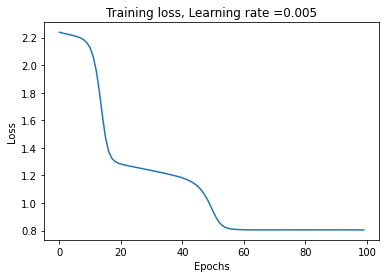

Train cost after epoch 0: 2.277730
Train cost after epoch 10: 2.229151
Train cost after epoch 20: 2.063829
Train cost after epoch 30: 1.024204
Train cost after epoch 40: 0.970814
Train cost after epoch 50: 0.926589
Train cost after epoch 60: 0.883109
Train cost after epoch 70: 0.851113
Train cost after epoch 80: 0.829581
Train cost after epoch 90: 0.816694


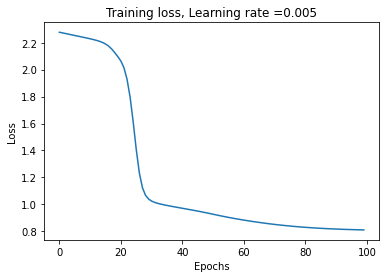

Train cost after epoch 0: 4.565364
Train cost after epoch 10: 2.999126
Train cost after epoch 20: 2.284584
Train cost after epoch 30: 1.011620
Train cost after epoch 40: 0.973811
Train cost after epoch 50: 0.940329
Train cost after epoch 60: 0.911688
Train cost after epoch 70: 0.887776
Train cost after epoch 80: 0.868159
Train cost after epoch 90: 0.852342


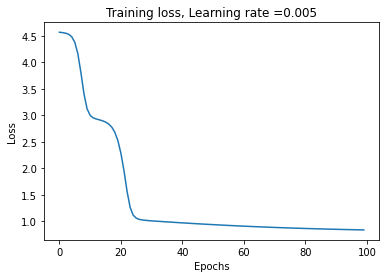

Train cost after epoch 0: 2.180276
Train cost after epoch 10: 1.673579
Train cost after epoch 20: 1.298403
Train cost after epoch 30: 1.253427
Train cost after epoch 40: 1.210408
Train cost after epoch 50: 1.169679
Train cost after epoch 60: 1.131393
Train cost after epoch 70: 1.095520
Train cost after epoch 80: 1.062016
Train cost after epoch 90: 1.030855


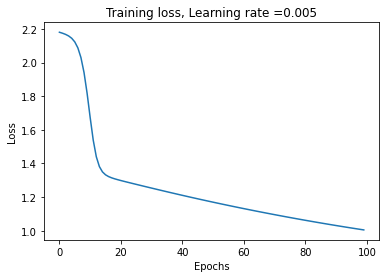

Train cost after epoch 0: 1.046322
Train cost after epoch 10: 0.989523
Train cost after epoch 20: 0.961308
Train cost after epoch 30: 0.876514
Train cost after epoch 40: 0.833896
Train cost after epoch 50: 0.819032
Train cost after epoch 60: 0.809294
Train cost after epoch 70: 0.802878
Train cost after epoch 80: 0.800512
Train cost after epoch 90: 0.799501


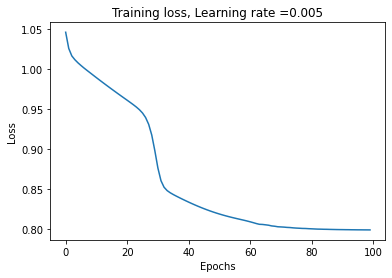

Train cost after epoch 0: 2.558528
Train cost after epoch 10: 1.524892
Train cost after epoch 20: 1.326863
Train cost after epoch 30: 1.026429
Train cost after epoch 40: 0.965900
Train cost after epoch 50: 0.924868
Train cost after epoch 60: 0.862474
Train cost after epoch 70: 0.824110
Train cost after epoch 80: 0.809954
Train cost after epoch 90: 0.805447


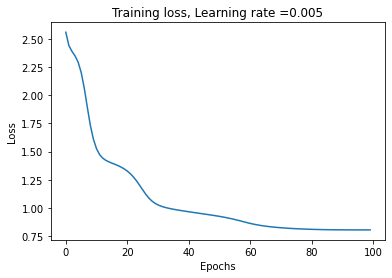

Train cost after epoch 0: 3.950232
Train cost after epoch 10: 2.801577
Train cost after epoch 20: 2.124390
Train cost after epoch 30: 2.046787
Train cost after epoch 40: 1.989745
Train cost after epoch 50: 1.928507
Train cost after epoch 60: 1.314353
Train cost after epoch 70: 0.859854
Train cost after epoch 80: 0.834007
Train cost after epoch 90: 0.818541


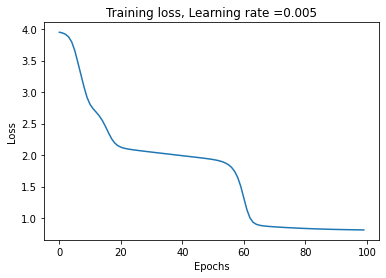

Train cost after epoch 0: 1.747685
Train cost after epoch 10: 1.652605
Train cost after epoch 20: 1.608883
Train cost after epoch 30: 1.565765
Train cost after epoch 40: 1.516651
Train cost after epoch 50: 1.268480
Train cost after epoch 60: 1.207569
Train cost after epoch 70: 1.149367
Train cost after epoch 80: 1.097436
Train cost after epoch 90: 1.051874


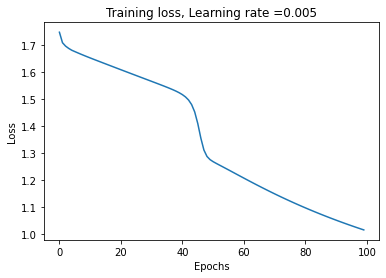

Train cost after epoch 0: 3.892847
Train cost after epoch 10: 1.641046
Train cost after epoch 20: 1.518113
Train cost after epoch 30: 1.304752
Train cost after epoch 40: 1.246431
Train cost after epoch 50: 1.195762
Train cost after epoch 60: 1.149107
Train cost after epoch 70: 1.079874
Train cost after epoch 80: 0.816852
Train cost after epoch 90: 0.805947


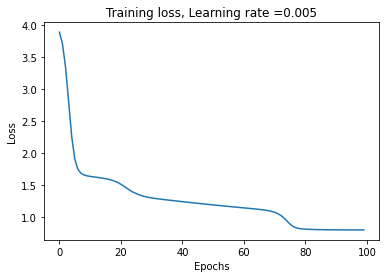

Train cost after epoch 0: 1.279247
Train cost after epoch 10: 1.171071
Train cost after epoch 20: 1.134760
Train cost after epoch 30: 1.098677
Train cost after epoch 40: 0.952236
Train cost after epoch 50: 0.805031
Train cost after epoch 60: 0.805152
Train cost after epoch 70: 0.804385
Train cost after epoch 80: 0.804114
Train cost after epoch 90: 0.803251


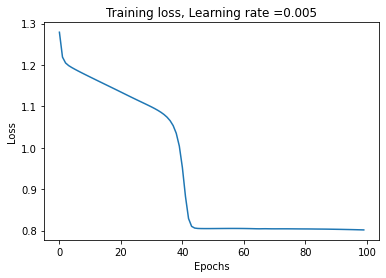

Train cost after epoch 0: 2.130378
Train cost after epoch 10: 0.897953
Train cost after epoch 20: 0.849230
Train cost after epoch 30: 0.818653
Train cost after epoch 40: 0.808793
Train cost after epoch 50: 0.804420
Train cost after epoch 60: 0.800972
Train cost after epoch 70: 0.799825
Train cost after epoch 80: 0.799132
Train cost after epoch 90: 0.798754


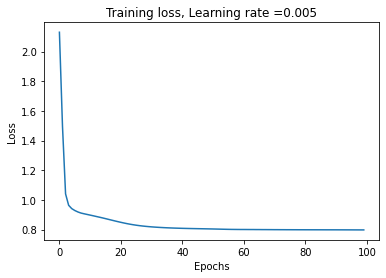

Train cost after epoch 0: 3.085368
Train cost after epoch 10: 1.165654
Train cost after epoch 20: 0.968600
Train cost after epoch 30: 0.938625
Train cost after epoch 40: 0.912735
Train cost after epoch 50: 0.887639
Train cost after epoch 60: 0.807379
Train cost after epoch 70: 0.806348
Train cost after epoch 80: 0.805084
Train cost after epoch 90: 0.804873


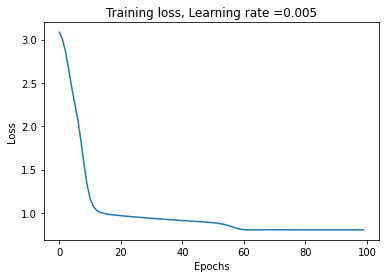

Train cost after epoch 0: 3.687232
Train cost after epoch 10: 2.059660
Train cost after epoch 20: 1.728136
Train cost after epoch 30: 0.813614
Train cost after epoch 40: 0.864796
Train cost after epoch 50: 0.805067
Train cost after epoch 60: 0.805021
Train cost after epoch 70: 0.804979
Train cost after epoch 80: 0.804794
Train cost after epoch 90: 0.804809


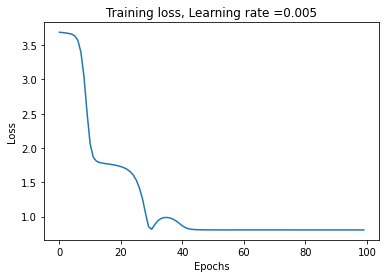

Train cost after epoch 0: 3.304074
Train cost after epoch 10: 3.197772
Train cost after epoch 20: 2.600532
Train cost after epoch 30: 2.173590
Train cost after epoch 40: 1.948622
Train cost after epoch 50: 1.884311
Train cost after epoch 60: 1.821977
Train cost after epoch 70: 1.762905
Train cost after epoch 80: 1.706874
Train cost after epoch 90: 1.653414


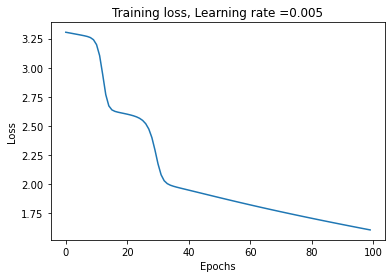

Train cost after epoch 0: 2.567844
Train cost after epoch 10: 2.273461
Train cost after epoch 20: 2.218678
Train cost after epoch 30: 1.799142
Train cost after epoch 40: 0.977400
Train cost after epoch 50: 0.953625
Train cost after epoch 60: 0.918161
Train cost after epoch 70: 0.886500
Train cost after epoch 80: 0.855080
Train cost after epoch 90: 0.811869


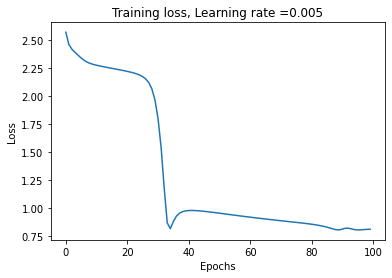

Train cost after epoch 0: 1.834077
Train cost after epoch 10: 1.221988
Train cost after epoch 20: 0.907432
Train cost after epoch 30: 0.830584
Train cost after epoch 40: 0.810794
Train cost after epoch 50: 0.805973
Train cost after epoch 60: 0.805355
Train cost after epoch 70: 0.805191
Train cost after epoch 80: 0.805146
Train cost after epoch 90: 0.805118


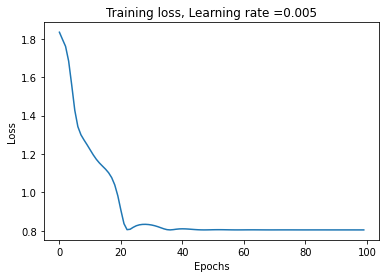

Train cost after epoch 0: 2.489626
Train cost after epoch 10: 2.438239
Train cost after epoch 20: 1.656018
Train cost after epoch 30: 1.606469
Train cost after epoch 40: 1.555104
Train cost after epoch 50: 1.505193
Train cost after epoch 60: 1.457303
Train cost after epoch 70: 1.411366
Train cost after epoch 80: 1.367233
Train cost after epoch 90: 1.324786


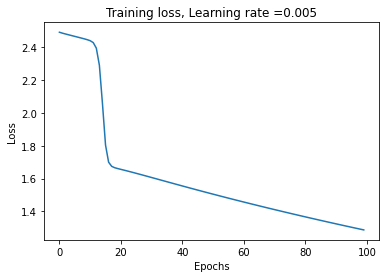

Train cost after epoch 0: 2.301526
Train cost after epoch 10: 2.253605
Train cost after epoch 20: 1.898167
Train cost after epoch 30: 1.618061
Train cost after epoch 40: 1.083621
Train cost after epoch 50: 0.998676
Train cost after epoch 60: 0.891870
Train cost after epoch 70: 0.809271
Train cost after epoch 80: 0.810479
Train cost after epoch 90: 0.805376


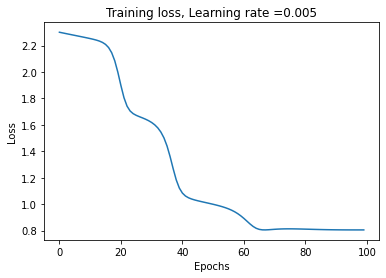

__________________________________________________ 0.8% GA is running...Train cost after epoch 0: 1.375897
Train cost after epoch 10: 1.240974
Train cost after epoch 20: 1.203032
Train cost after epoch 30: 1.161241
Train cost after epoch 40: 0.900366
Train cost after epoch 50: 0.851869
Train cost after epoch 60: 0.831225
Train cost after epoch 70: 0.818076
Train cost after epoch 80: 0.810749
Train cost after epoch 90: 0.807161


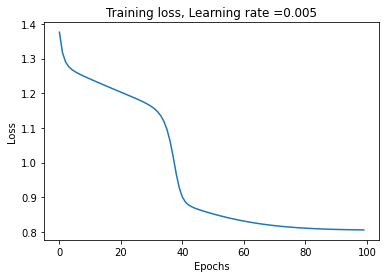

Train cost after epoch 0: 3.421332
Train cost after epoch 10: 2.028794
Train cost after epoch 20: 1.959085
Train cost after epoch 30: 1.419829
Train cost after epoch 40: 1.132209
Train cost after epoch 50: 1.075832
Train cost after epoch 60: 1.019840
Train cost after epoch 70: 0.966987
Train cost after epoch 80: 0.922937
Train cost after epoch 90: 0.888488


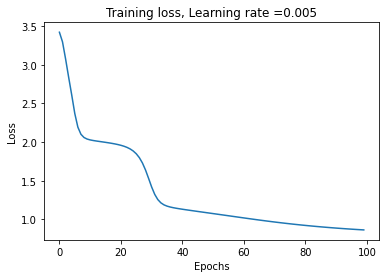

Train cost after epoch 0: 2.025462
Train cost after epoch 10: 1.128777
Train cost after epoch 20: 1.068383
Train cost after epoch 30: 0.980232
Train cost after epoch 40: 0.924179
Train cost after epoch 50: 0.888673
Train cost after epoch 60: 0.840080
Train cost after epoch 70: 0.808773
Train cost after epoch 80: 0.804903
Train cost after epoch 90: 0.805261


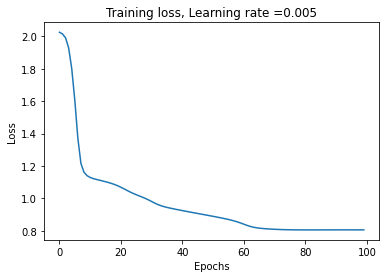

Train cost after epoch 0: 2.497199
Train cost after epoch 10: 1.667780
Train cost after epoch 20: 1.605880
Train cost after epoch 30: 1.472466
Train cost after epoch 40: 1.196338
Train cost after epoch 50: 1.122641
Train cost after epoch 60: 1.071141
Train cost after epoch 70: 1.025483
Train cost after epoch 80: 0.986040
Train cost after epoch 90: 0.952270


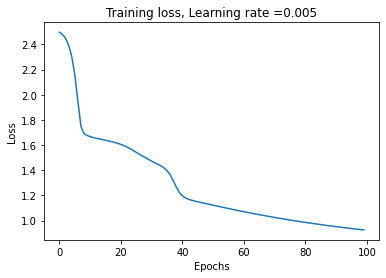

Train cost after epoch 0: 3.274823
Train cost after epoch 10: 3.069133
Train cost after epoch 20: 2.327242
Train cost after epoch 30: 2.064321
Train cost after epoch 40: 0.861386
Train cost after epoch 50: 0.832396
Train cost after epoch 60: 0.818829
Train cost after epoch 70: 0.811182
Train cost after epoch 80: 0.807360
Train cost after epoch 90: 0.805708


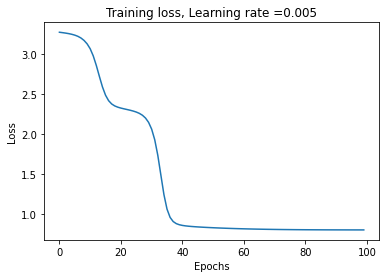

Train cost after epoch 0: 2.193352
Train cost after epoch 10: 2.017363
Train cost after epoch 20: 1.969456
Train cost after epoch 30: 1.867958
Train cost after epoch 40: 1.282822
Train cost after epoch 50: 1.196776
Train cost after epoch 60: 1.055267
Train cost after epoch 70: 0.961510
Train cost after epoch 80: 0.868552
Train cost after epoch 90: 0.812207


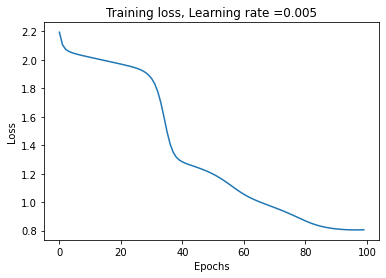

Train cost after epoch 0: 2.850912
Train cost after epoch 10: 2.682079
Train cost after epoch 20: 1.727021
Train cost after epoch 30: 1.291715
Train cost after epoch 40: 0.995584
Train cost after epoch 50: 0.945773
Train cost after epoch 60: 0.908646
Train cost after epoch 70: 0.877139
Train cost after epoch 80: 0.849531
Train cost after epoch 90: 0.827198


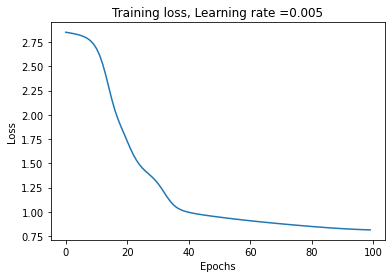

Train cost after epoch 0: 2.446879
Train cost after epoch 10: 2.096129
Train cost after epoch 20: 1.093214
Train cost after epoch 30: 0.936386
Train cost after epoch 40: 0.894861
Train cost after epoch 50: 0.811033
Train cost after epoch 60: 0.804744
Train cost after epoch 70: 0.805304
Train cost after epoch 80: 0.804873
Train cost after epoch 90: 0.804181


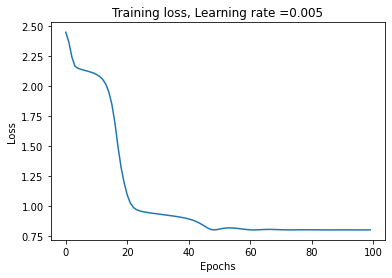

Train cost after epoch 0: 2.206885
Train cost after epoch 10: 1.424118
Train cost after epoch 20: 1.375616
Train cost after epoch 30: 1.283180
Train cost after epoch 40: 1.154832
Train cost after epoch 50: 1.096479
Train cost after epoch 60: 1.048225
Train cost after epoch 70: 1.006350
Train cost after epoch 80: 0.970232
Train cost after epoch 90: 0.939230


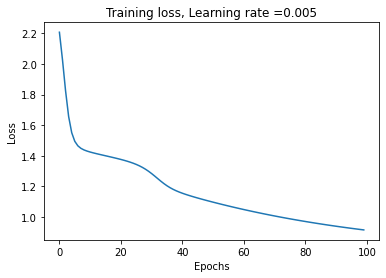

Train cost after epoch 0: 1.209139
Train cost after epoch 10: 1.172050
Train cost after epoch 20: 1.136420
Train cost after epoch 30: 1.102200
Train cost after epoch 40: 1.069593
Train cost after epoch 50: 1.038767
Train cost after epoch 60: 1.009864
Train cost after epoch 70: 0.982996
Train cost after epoch 80: 0.958252
Train cost after epoch 90: 0.935691


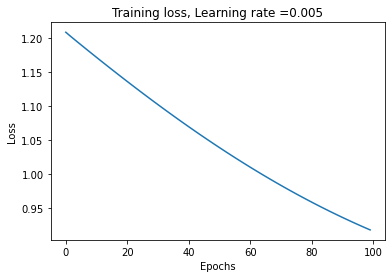

Train cost after epoch 0: 2.721113
Train cost after epoch 10: 2.470743
Train cost after epoch 20: 2.410995
Train cost after epoch 30: 1.925808
Train cost after epoch 40: 1.036070
Train cost after epoch 50: 0.891357
Train cost after epoch 60: 0.849151
Train cost after epoch 70: 0.821305
Train cost after epoch 80: 0.808173
Train cost after epoch 90: 0.804852


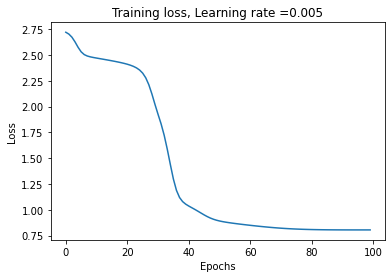

Train cost after epoch 0: 2.001888
Train cost after epoch 10: 1.934788
Train cost after epoch 20: 1.889324
Train cost after epoch 30: 1.842793
Train cost after epoch 40: 1.703487
Train cost after epoch 50: 1.577089
Train cost after epoch 60: 1.510351
Train cost after epoch 70: 1.447254
Train cost after epoch 80: 1.389030
Train cost after epoch 90: 1.335256


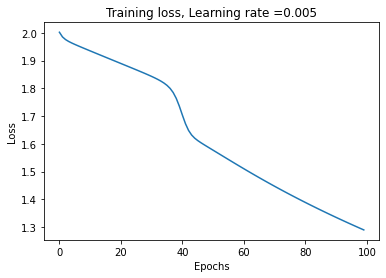

Train cost after epoch 0: 3.565751
Train cost after epoch 10: 1.484775
Train cost after epoch 20: 1.011266
Train cost after epoch 30: 0.976634
Train cost after epoch 40: 0.946481
Train cost after epoch 50: 0.919959
Train cost after epoch 60: 0.897038
Train cost after epoch 70: 0.877545
Train cost after epoch 80: 0.861243
Train cost after epoch 90: 0.847850


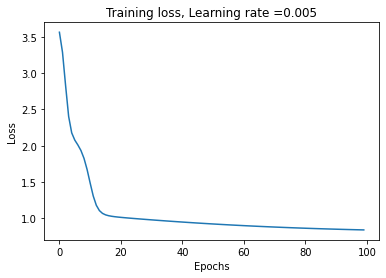

Train cost after epoch 0: 1.412048
Train cost after epoch 10: 1.369093
Train cost after epoch 20: 1.296347
Train cost after epoch 30: 0.857190
Train cost after epoch 40: 0.834695
Train cost after epoch 50: 0.820944
Train cost after epoch 60: 0.812391
Train cost after epoch 70: 0.807253
Train cost after epoch 80: 0.803571
Train cost after epoch 90: 0.801623


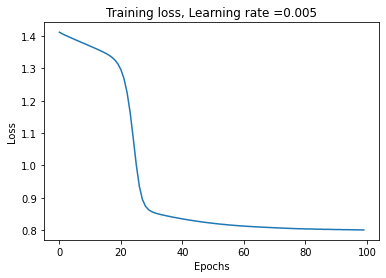

Train cost after epoch 0: 1.875169
Train cost after epoch 10: 1.696784
Train cost after epoch 20: 1.651122
Train cost after epoch 30: 1.607100
Train cost after epoch 40: 1.555462
Train cost after epoch 50: 1.483792
Train cost after epoch 60: 1.414841
Train cost after epoch 70: 1.351194
Train cost after epoch 80: 1.293241
Train cost after epoch 90: 1.240451


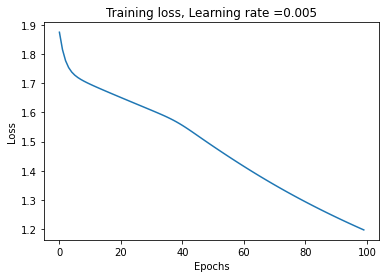

Train cost after epoch 0: 2.632207
Train cost after epoch 10: 0.947702
Train cost after epoch 20: 0.896119
Train cost after epoch 30: 0.809852
Train cost after epoch 40: 0.810648
Train cost after epoch 50: 0.805092
Train cost after epoch 60: 0.803346
Train cost after epoch 70: 0.801424
Train cost after epoch 80: 0.800695
Train cost after epoch 90: 0.800190


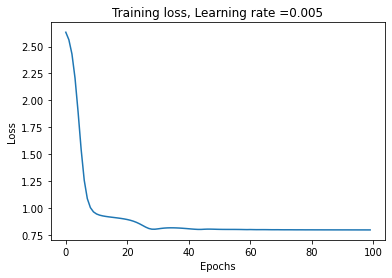

Train cost after epoch 0: 1.709630
Train cost after epoch 10: 1.255882
Train cost after epoch 20: 1.217048
Train cost after epoch 30: 1.179243
Train cost after epoch 40: 1.126223
Train cost after epoch 50: 0.839394
Train cost after epoch 60: 0.817749
Train cost after epoch 70: 0.808713
Train cost after epoch 80: 0.805519
Train cost after epoch 90: 0.804912


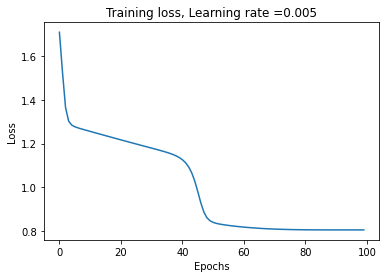

Train cost after epoch 0: 1.955448
Train cost after epoch 10: 1.570165
Train cost after epoch 20: 1.511479
Train cost after epoch 30: 1.049963
Train cost after epoch 40: 0.808730
Train cost after epoch 50: 0.809315
Train cost after epoch 60: 0.809968
Train cost after epoch 70: 0.808104
Train cost after epoch 80: 0.807024
Train cost after epoch 90: 0.806771


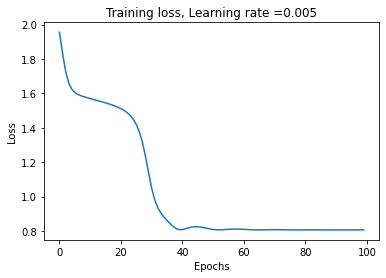

Train cost after epoch 0: 1.507909
Train cost after epoch 10: 1.426368
Train cost after epoch 20: 1.369009
Train cost after epoch 30: 0.932855
Train cost after epoch 40: 0.896718
Train cost after epoch 50: 0.861171
Train cost after epoch 60: 0.805048
Train cost after epoch 70: 0.809095
Train cost after epoch 80: 0.804545
Train cost after epoch 90: 0.805027


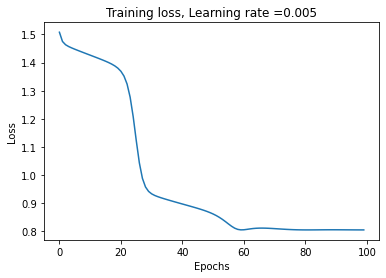

Train cost after epoch 0: 2.788855
Train cost after epoch 10: 2.736414
Train cost after epoch 20: 2.577978
Train cost after epoch 30: 2.126721
Train cost after epoch 40: 1.825283
Train cost after epoch 50: 1.760809
Train cost after epoch 60: 1.699056
Train cost after epoch 70: 1.640822
Train cost after epoch 80: 1.585840
Train cost after epoch 90: 1.533627


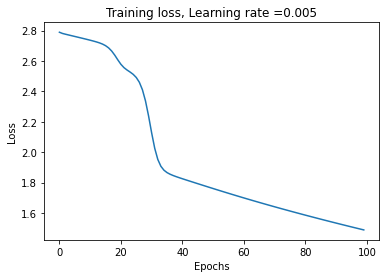

Train cost after epoch 0: 1.967173
Train cost after epoch 10: 1.471474
Train cost after epoch 20: 1.107602
Train cost after epoch 30: 1.057178
Train cost after epoch 40: 0.984818
Train cost after epoch 50: 0.843022
Train cost after epoch 60: 0.818821
Train cost after epoch 70: 0.809127
Train cost after epoch 80: 0.805083
Train cost after epoch 90: 0.803280


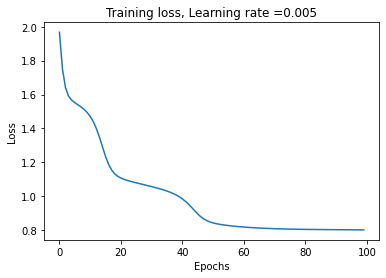

Train cost after epoch 0: 3.908974
Train cost after epoch 10: 1.744666
Train cost after epoch 20: 1.278040
Train cost after epoch 30: 1.148978
Train cost after epoch 40: 1.094947
Train cost after epoch 50: 1.050998
Train cost after epoch 60: 1.012336
Train cost after epoch 70: 0.978300
Train cost after epoch 80: 0.948425
Train cost after epoch 90: 0.922355


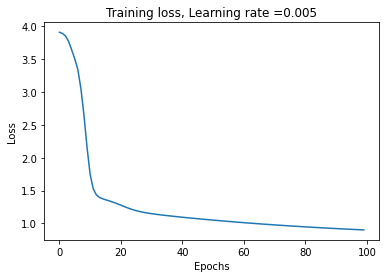

Train cost after epoch 0: 2.550023
Train cost after epoch 10: 2.380057
Train cost after epoch 20: 2.325915
Train cost after epoch 30: 1.913878
Train cost after epoch 40: 1.548734
Train cost after epoch 50: 1.485474
Train cost after epoch 60: 1.426119
Train cost after epoch 70: 1.370891
Train cost after epoch 80: 1.319603
Train cost after epoch 90: 1.271779


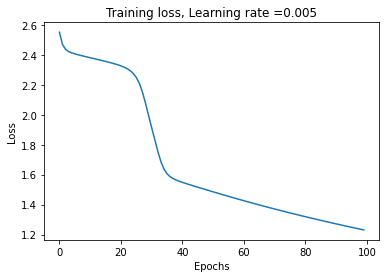

Train cost after epoch 0: 2.026204
Train cost after epoch 10: 1.978104
Train cost after epoch 20: 1.907523
Train cost after epoch 30: 0.977496
Train cost after epoch 40: 0.909707
Train cost after epoch 50: 0.881084
Train cost after epoch 60: 0.858472
Train cost after epoch 70: 0.841401
Train cost after epoch 80: 0.828986
Train cost after epoch 90: 0.820273


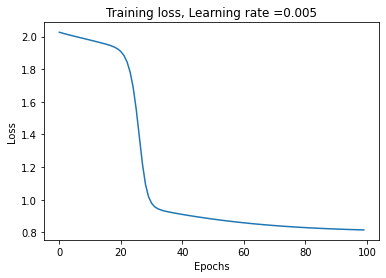

Train cost after epoch 0: 2.256023
Train cost after epoch 10: 0.931882
Train cost after epoch 20: 0.902144
Train cost after epoch 30: 0.879873
Train cost after epoch 40: 0.860811
Train cost after epoch 50: 0.843544
Train cost after epoch 60: 0.804979
Train cost after epoch 70: 0.805804
Train cost after epoch 80: 0.804638
Train cost after epoch 90: 0.804771


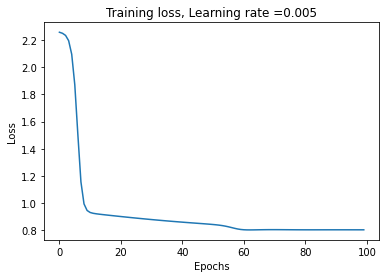

Train cost after epoch 0: 2.521466
Train cost after epoch 10: 2.480916
Train cost after epoch 20: 2.073910
Train cost after epoch 30: 0.883975
Train cost after epoch 40: 0.860516
Train cost after epoch 50: 0.841690
Train cost after epoch 60: 0.827989
Train cost after epoch 70: 0.818652
Train cost after epoch 80: 0.812654
Train cost after epoch 90: 0.809023


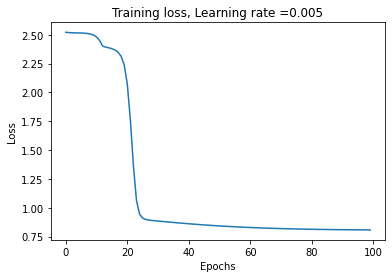

Train cost after epoch 0: 2.779550
Train cost after epoch 10: 1.447803
Train cost after epoch 20: 0.944254
Train cost after epoch 30: 0.809348
Train cost after epoch 40: 0.805002
Train cost after epoch 50: 0.804720
Train cost after epoch 60: 0.804849
Train cost after epoch 70: 0.804783
Train cost after epoch 80: 0.804783
Train cost after epoch 90: 0.804767


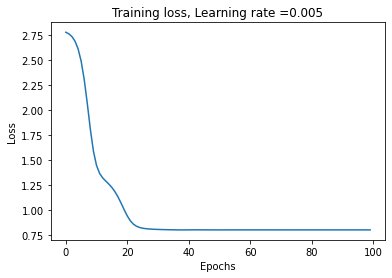

Train cost after epoch 0: 1.732100
Train cost after epoch 10: 1.687205
Train cost after epoch 20: 1.130792
Train cost after epoch 30: 1.053249
Train cost after epoch 40: 0.876338
Train cost after epoch 50: 0.802874
Train cost after epoch 60: 0.800832
Train cost after epoch 70: 0.800281
Train cost after epoch 80: 0.800030
Train cost after epoch 90: 0.799231


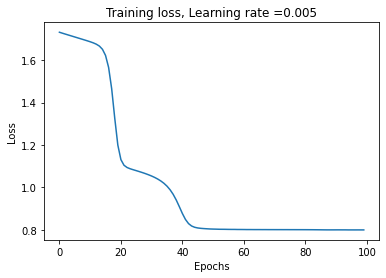

Train cost after epoch 0: 1.619782
Train cost after epoch 10: 1.568965
Train cost after epoch 20: 1.526313
Train cost after epoch 30: 1.484036
Train cost after epoch 40: 1.438949
Train cost after epoch 50: 1.156240
Train cost after epoch 60: 1.101520
Train cost after epoch 70: 1.046039
Train cost after epoch 80: 0.804523
Train cost after epoch 90: 0.809191


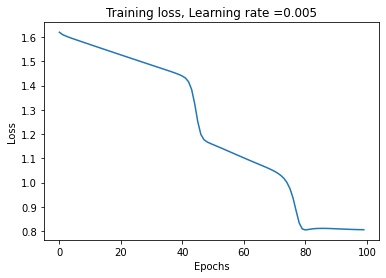

Train cost after epoch 0: 3.624522
Train cost after epoch 10: 3.179590
Train cost after epoch 20: 2.650997
Train cost after epoch 30: 2.079676
Train cost after epoch 40: 1.572128
Train cost after epoch 50: 1.494076
Train cost after epoch 60: 1.352591
Train cost after epoch 70: 0.972272
Train cost after epoch 80: 0.859799
Train cost after epoch 90: 0.816265


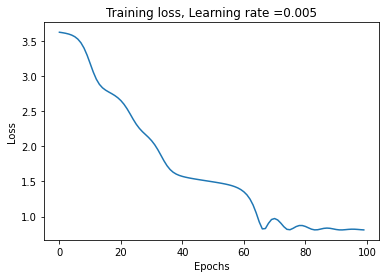

Train cost after epoch 0: 1.749621
Train cost after epoch 10: 1.553134
Train cost after epoch 20: 1.509019
Train cost after epoch 30: 1.432289
Train cost after epoch 40: 1.098460
Train cost after epoch 50: 1.049964
Train cost after epoch 60: 1.005578
Train cost after epoch 70: 0.967145
Train cost after epoch 80: 0.934582
Train cost after epoch 90: 0.907303


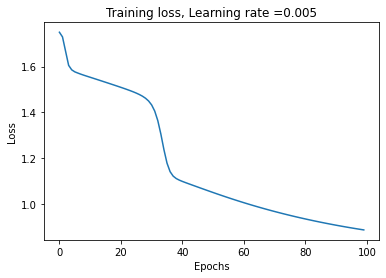

Train cost after epoch 0: 2.923133
Train cost after epoch 10: 2.318306
Train cost after epoch 20: 1.708363
Train cost after epoch 30: 1.407779
Train cost after epoch 40: 1.263709
Train cost after epoch 50: 1.185913
Train cost after epoch 60: 1.083015
Train cost after epoch 70: 0.999724
Train cost after epoch 80: 0.861557
Train cost after epoch 90: 0.826684


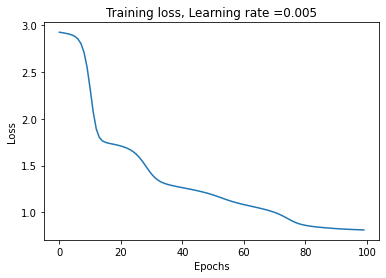

Train cost after epoch 0: 1.419888
Train cost after epoch 10: 1.372237
Train cost after epoch 20: 1.332189
Train cost after epoch 30: 1.293028
Train cost after epoch 40: 1.254883
Train cost after epoch 50: 1.217873
Train cost after epoch 60: 1.182108
Train cost after epoch 70: 1.147696
Train cost after epoch 80: 1.114740
Train cost after epoch 90: 1.083340


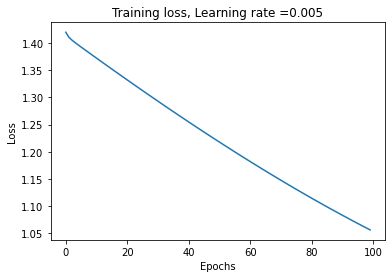

Train cost after epoch 0: 2.174702
Train cost after epoch 10: 2.050519
Train cost after epoch 20: 1.948260
Train cost after epoch 30: 1.894079
Train cost after epoch 40: 1.840492
Train cost after epoch 50: 1.787954
Train cost after epoch 60: 1.698540
Train cost after epoch 70: 0.872727
Train cost after epoch 80: 0.810081
Train cost after epoch 90: 0.807331


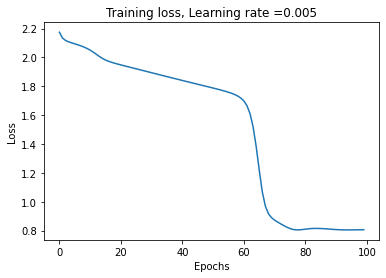

Train cost after epoch 0: 1.572951
Train cost after epoch 10: 1.102276
Train cost after epoch 20: 0.968994
Train cost after epoch 30: 0.919358
Train cost after epoch 40: 0.890643
Train cost after epoch 50: 0.867405
Train cost after epoch 60: 0.849202
Train cost after epoch 70: 0.835410
Train cost after epoch 80: 0.825292
Train cost after epoch 90: 0.818111


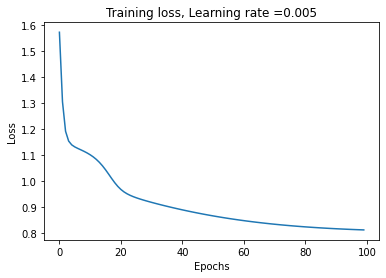

Train cost after epoch 0: 1.689928
Train cost after epoch 10: 1.645528
Train cost after epoch 20: 1.602105
Train cost after epoch 30: 1.557899
Train cost after epoch 40: 1.312090
Train cost after epoch 50: 1.055080
Train cost after epoch 60: 1.005184
Train cost after epoch 70: 0.961868
Train cost after epoch 80: 0.925982
Train cost after epoch 90: 0.896924


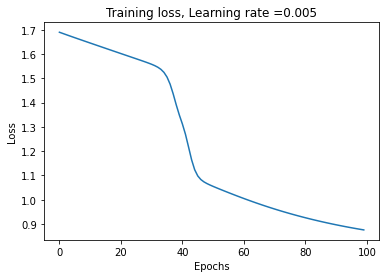

Train cost after epoch 0: 2.282762
Train cost after epoch 10: 1.825286
Train cost after epoch 20: 1.764162
Train cost after epoch 30: 1.368179
Train cost after epoch 40: 1.294290
Train cost after epoch 50: 1.240971
Train cost after epoch 60: 1.191293
Train cost after epoch 70: 1.144957
Train cost after epoch 80: 1.067235
Train cost after epoch 90: 0.960003


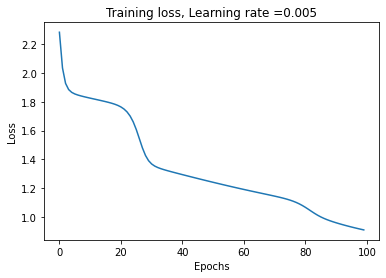

Train cost after epoch 0: 2.304970
Train cost after epoch 10: 1.779022
Train cost after epoch 20: 1.729337
Train cost after epoch 30: 1.684157
Train cost after epoch 40: 1.639926
Train cost after epoch 50: 1.596389
Train cost after epoch 60: 1.551493
Train cost after epoch 70: 1.448344
Train cost after epoch 80: 0.870158
Train cost after epoch 90: 0.818851


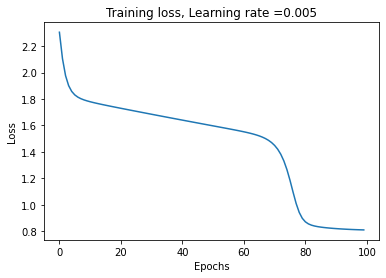

Train cost after epoch 0: 1.873396
Train cost after epoch 10: 1.719422
Train cost after epoch 20: 1.673637
Train cost after epoch 30: 0.841731
Train cost after epoch 40: 0.804884
Train cost after epoch 50: 0.805054
Train cost after epoch 60: 0.805048
Train cost after epoch 70: 0.804925
Train cost after epoch 80: 0.804892
Train cost after epoch 90: 0.804897


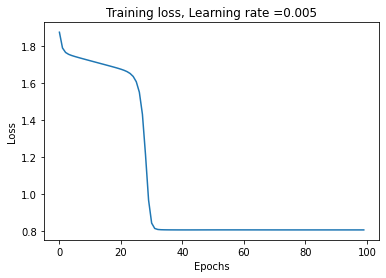

Train cost after epoch 0: 2.540364
Train cost after epoch 10: 0.806136
Train cost after epoch 20: 0.805019
Train cost after epoch 30: 0.804830
Train cost after epoch 40: 0.804847
Train cost after epoch 50: 0.804846
Train cost after epoch 60: 0.804816
Train cost after epoch 70: 0.804776
Train cost after epoch 80: 0.804718
Train cost after epoch 90: 0.804597


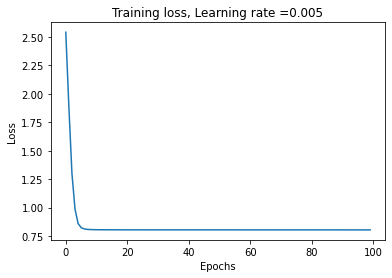

Train cost after epoch 0: 2.084120
Train cost after epoch 10: 1.437230
Train cost after epoch 20: 1.393240
Train cost after epoch 30: 1.351049
Train cost after epoch 40: 1.278418
Train cost after epoch 50: 1.121364
Train cost after epoch 60: 0.960634
Train cost after epoch 70: 0.817736
Train cost after epoch 80: 0.806905
Train cost after epoch 90: 0.804907


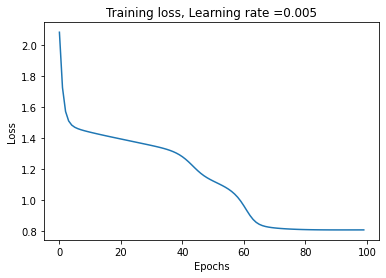

Train cost after epoch 0: 2.731302
Train cost after epoch 10: 2.674862
Train cost after epoch 20: 2.144451
Train cost after epoch 30: 1.885380
Train cost after epoch 40: 0.952015
Train cost after epoch 50: 0.860709
Train cost after epoch 60: 0.817948
Train cost after epoch 70: 0.805498
Train cost after epoch 80: 0.805023
Train cost after epoch 90: 0.805250


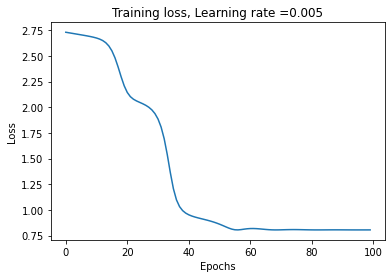

Train cost after epoch 0: 1.219760
Train cost after epoch 10: 1.182603
Train cost after epoch 20: 1.146669
Train cost after epoch 30: 1.112107
Train cost after epoch 40: 1.079116
Train cost after epoch 50: 1.047863
Train cost after epoch 60: 1.018437
Train cost after epoch 70: 0.991067
Train cost after epoch 80: 0.965816
Train cost after epoch 90: 0.942677


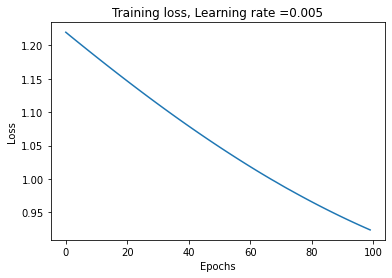

Train cost after epoch 0: 2.397594
Train cost after epoch 10: 1.697457
Train cost after epoch 20: 1.650981
Train cost after epoch 30: 1.605707
Train cost after epoch 40: 1.550409
Train cost after epoch 50: 1.488260
Train cost after epoch 60: 1.424054
Train cost after epoch 70: 1.363637
Train cost after epoch 80: 1.308114
Train cost after epoch 90: 1.257073


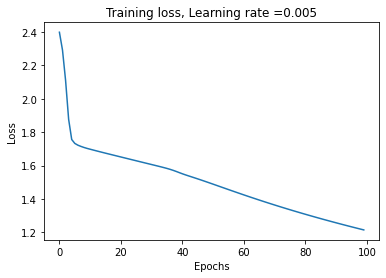

Train cost after epoch 0: 1.575548
Train cost after epoch 10: 1.531191
Train cost after epoch 20: 1.488362
Train cost after epoch 30: 1.283425
Train cost after epoch 40: 0.994445
Train cost after epoch 50: 0.895164
Train cost after epoch 60: 0.808118
Train cost after epoch 70: 0.804867
Train cost after epoch 80: 0.805202
Train cost after epoch 90: 0.805085


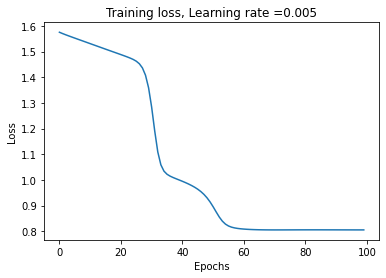

Train cost after epoch 0: 3.029076
Train cost after epoch 10: 1.055300
Train cost after epoch 20: 1.019531
Train cost after epoch 30: 0.988144
Train cost after epoch 40: 0.959374
Train cost after epoch 50: 0.933493
Train cost after epoch 60: 0.910543
Train cost after epoch 70: 0.890481
Train cost after epoch 80: 0.873205
Train cost after epoch 90: 0.858569


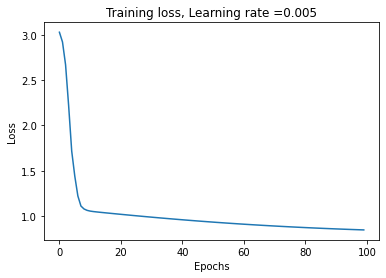

Train cost after epoch 0: 3.409030
Train cost after epoch 10: 2.101212
Train cost after epoch 20: 1.616516
Train cost after epoch 30: 1.206374
Train cost after epoch 40: 1.159373
Train cost after epoch 50: 1.115041
Train cost after epoch 60: 1.074436
Train cost after epoch 70: 1.037607
Train cost after epoch 80: 1.004346
Train cost after epoch 90: 0.974445


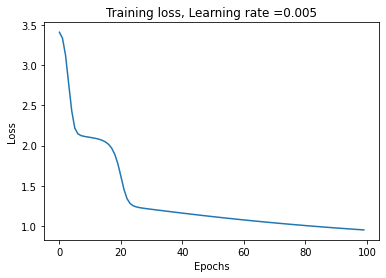

Train cost after epoch 0: 2.086132
Train cost after epoch 10: 1.705942
Train cost after epoch 20: 1.075897
Train cost after epoch 30: 1.038823
Train cost after epoch 40: 1.004098
Train cost after epoch 50: 0.972469
Train cost after epoch 60: 0.944305
Train cost after epoch 70: 0.919481
Train cost after epoch 80: 0.897855
Train cost after epoch 90: 0.879251


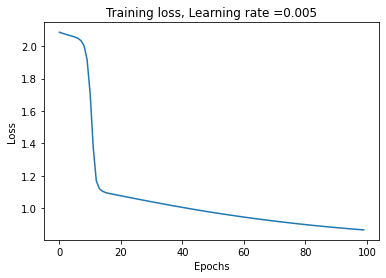

Train cost after epoch 0: 2.500855
Train cost after epoch 10: 1.086536
Train cost after epoch 20: 1.046125
Train cost after epoch 30: 1.011305
Train cost after epoch 40: 0.883782
Train cost after epoch 50: 0.823439
Train cost after epoch 60: 0.820014
Train cost after epoch 70: 0.809594
Train cost after epoch 80: 0.810529
Train cost after epoch 90: 0.809255


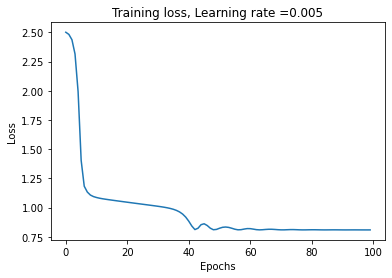

Train cost after epoch 0: 3.597762
Train cost after epoch 10: 1.092058
Train cost after epoch 20: 1.048774
Train cost after epoch 30: 1.012651
Train cost after epoch 40: 0.908270
Train cost after epoch 50: 0.802893
Train cost after epoch 60: 0.805911
Train cost after epoch 70: 0.804451
Train cost after epoch 80: 0.803842
Train cost after epoch 90: 0.803923


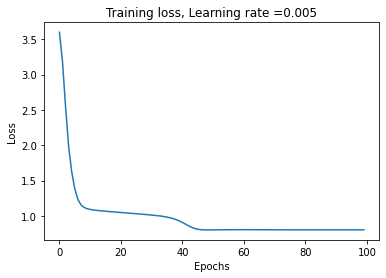

Train cost after epoch 0: 3.295880
Train cost after epoch 10: 1.080488
Train cost after epoch 20: 0.965305
Train cost after epoch 30: 0.935972
Train cost after epoch 40: 0.910096
Train cost after epoch 50: 0.887783
Train cost after epoch 60: 0.868987
Train cost after epoch 70: 0.853493
Train cost after epoch 80: 0.840997
Train cost after epoch 90: 0.831149


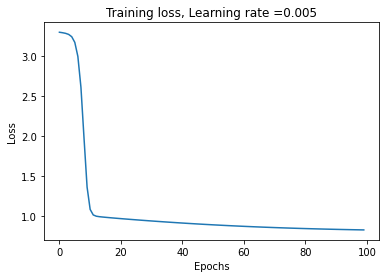

Train cost after epoch 0: 2.423566
Train cost after epoch 10: 1.167917
Train cost after epoch 20: 0.947687
Train cost after epoch 30: 0.883188
Train cost after epoch 40: 0.832907
Train cost after epoch 50: 0.816980
Train cost after epoch 60: 0.808795
Train cost after epoch 70: 0.804446
Train cost after epoch 80: 0.801164
Train cost after epoch 90: 0.799524


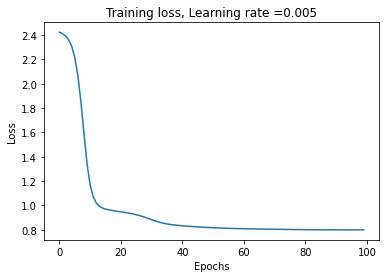

Train cost after epoch 0: 3.098924
Train cost after epoch 10: 3.049531
Train cost after epoch 20: 1.030316
Train cost after epoch 30: 0.813695
Train cost after epoch 40: 0.807624
Train cost after epoch 50: 0.803915
Train cost after epoch 60: 0.801712
Train cost after epoch 70: 0.800707
Train cost after epoch 80: 0.799479
Train cost after epoch 90: 0.799175


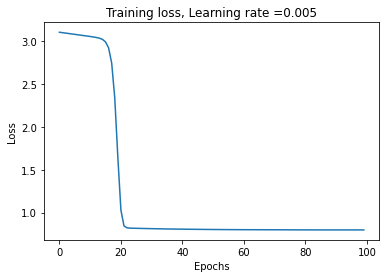

Train cost after epoch 0: 2.222739
Train cost after epoch 10: 1.362674
Train cost after epoch 20: 1.321553
Train cost after epoch 30: 1.277144
Train cost after epoch 40: 0.841806
Train cost after epoch 50: 0.865735
Train cost after epoch 60: 0.809643
Train cost after epoch 70: 0.811549
Train cost after epoch 80: 0.803737
Train cost after epoch 90: 0.804635


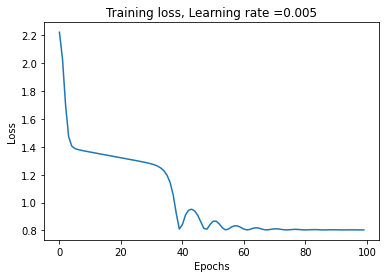

Train cost after epoch 0: 1.907830
Train cost after epoch 10: 1.707503
Train cost after epoch 20: 1.661802
Train cost after epoch 30: 1.494073
Train cost after epoch 40: 1.375768
Train cost after epoch 50: 1.318919
Train cost after epoch 60: 1.265024
Train cost after epoch 70: 1.215360
Train cost after epoch 80: 1.169753
Train cost after epoch 90: 1.127813


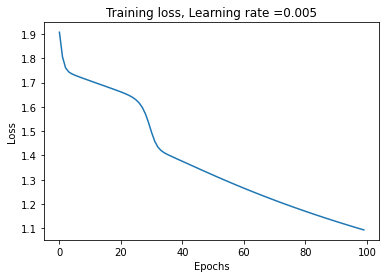

Train cost after epoch 0: 3.050327
Train cost after epoch 10: 2.344427
Train cost after epoch 20: 2.285034
Train cost after epoch 30: 2.148156
Train cost after epoch 40: 1.726897
Train cost after epoch 50: 1.252987
Train cost after epoch 60: 0.813049
Train cost after epoch 70: 0.845850
Train cost after epoch 80: 0.823964
Train cost after epoch 90: 0.805098


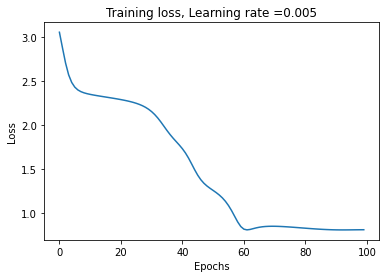

Train cost after epoch 0: 1.869861
Train cost after epoch 10: 1.817144
Train cost after epoch 20: 1.752975
Train cost after epoch 30: 1.405399
Train cost after epoch 40: 1.330571
Train cost after epoch 50: 1.275910
Train cost after epoch 60: 1.222261
Train cost after epoch 70: 1.024638
Train cost after epoch 80: 0.859740
Train cost after epoch 90: 0.831718


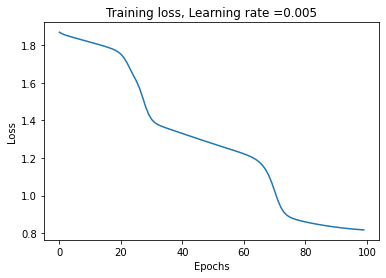

Train cost after epoch 0: 1.950072
Train cost after epoch 10: 1.276730
Train cost after epoch 20: 1.235912
Train cost after epoch 30: 1.197495
Train cost after epoch 40: 1.160937
Train cost after epoch 50: 1.125973
Train cost after epoch 60: 1.092655
Train cost after epoch 70: 1.061144
Train cost after epoch 80: 1.031539
Train cost after epoch 90: 1.003894


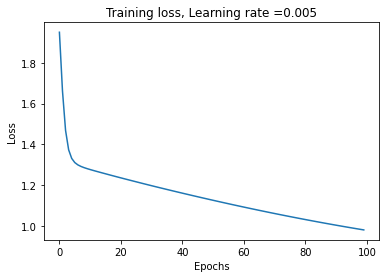

Train cost after epoch 0: 3.621696
Train cost after epoch 10: 2.244738
Train cost after epoch 20: 2.145192
Train cost after epoch 30: 1.984231
Train cost after epoch 40: 1.559325
Train cost after epoch 50: 1.486329
Train cost after epoch 60: 1.420915
Train cost after epoch 70: 1.360115
Train cost after epoch 80: 1.304163
Train cost after epoch 90: 1.252664


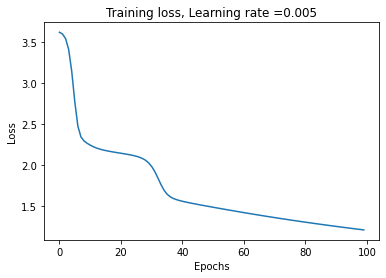

Train cost after epoch 0: 1.833501
Train cost after epoch 10: 1.742096
Train cost after epoch 20: 1.697206
Train cost after epoch 30: 1.637824
Train cost after epoch 40: 1.451910
Train cost after epoch 50: 1.172432
Train cost after epoch 60: 0.936405
Train cost after epoch 70: 0.896567
Train cost after epoch 80: 0.865909
Train cost after epoch 90: 0.843933


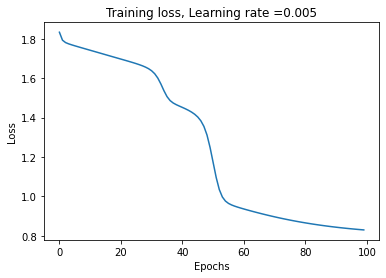

Train cost after epoch 0: 0.828594
Train cost after epoch 10: 0.817996
Train cost after epoch 20: 0.810928
Train cost after epoch 30: 0.805219
Train cost after epoch 40: 0.804957
Train cost after epoch 50: 0.804556
Train cost after epoch 60: 0.800673
Train cost after epoch 70: 0.799911
Train cost after epoch 80: 0.799642
Train cost after epoch 90: 0.799361


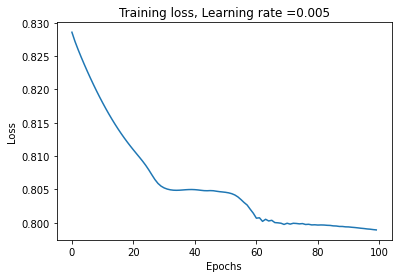

Train cost after epoch 0: 3.654464
Train cost after epoch 10: 3.172296
Train cost after epoch 20: 2.966366
Train cost after epoch 30: 2.426059
Train cost after epoch 40: 1.670339
Train cost after epoch 50: 1.317401
Train cost after epoch 60: 1.170622
Train cost after epoch 70: 1.108802
Train cost after epoch 80: 1.056469
Train cost after epoch 90: 1.011739


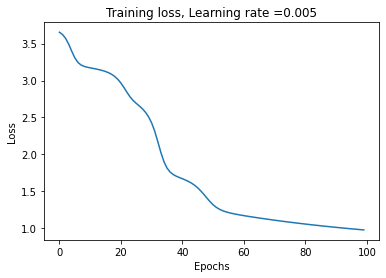

Train cost after epoch 0: 2.622289
Train cost after epoch 10: 1.227208
Train cost after epoch 20: 1.188143


In [ ]:
from geneticalgorithm import geneticalgorithm as ga

def training_objective(X): # objective function to minimize final loss and determine optimum # of rules 
    m = int(X[0])  # number of rules (14-1000)
    alpha = 5e-3  # lr fixed
    num_epochs = 100 # epochs fixed

    fis, final_loss = train_anfis(14, m, alpha, num_epochs)
    return final_loss # minimize final_loss


varbound=np.array([[14,1000]])
vartype=np.array([['int']])
model=ga(function=training_objective, dimension=1, variable_type_mixed=vartype, variable_boundaries=varbound)
model.run()

# CNN & CRNN (Phase 2)

## Models & Helpers

In [ ]:
def create_CNN(nchan, nclasses, trial_length=1024, l1=0, lr=1e-4):
    POOLING_STRIDES = 15

    input_shape = (trial_length, nchan, 1)
    model = Sequential()

    model.add(Conv2D(40, (30, 1), activation="relu", kernel_regularizer=regularizers.l1(l1), padding="same", input_shape=input_shape)) # temporal convolution (30,1) 40 filters
    model.add(Conv2D(40, (1, nchan), activation="relu", kernel_regularizer=regularizers.l1(l1), padding="valid")) # spatial convolution, inside bounds so no padding (1, 14) 40 filters
    model.add(AveragePooling2D((30, 1), strides=(POOLING_STRIDES, 1)))
    model.add(Dropout(0.2))

    model.add(Flatten())

    model.add(Dense(80, activation="relu"))
    model.add(Dropout(0.35))

    model.add(Dense(nclasses, activation="softmax"))
    model.compile(loss="categorical_crossentropy", optimizer=Adam(lr), metrics=["accuracy"])

    return model


def create_CRNN4(nchan, nclasses, trial_length=1024, l1=0, lr=1e-4, full_output=False):
    input_shape = (trial_length, nchan, 1)
    model = Sequential()
    model.add(Conv2D(40, (30, 1), activation="relu", kernel_regularizer=regularizers.l1(l1), padding="same", input_shape=input_shape))
    model.add(Conv2D(40, (1, nchan), activation="relu", kernel_regularizer=regularizers.l1(l1), padding="valid"))
    model.add(AveragePooling2D((5, 1), strides=(5, 1)))
    model.add(TimeDistributed(Flatten()))
    model.add(LSTM(40, activation="sigmoid", dropout=0.25, return_sequences=full_output))
    # model.add(Dense(15, activation="relu"))
    model.add(Dense(nclasses, activation="softmax"))
    model.compile(loss="categorical_crossentropy", optimizer=Adam(lr), metrics=["accuracy"])
    return model

In [ ]:
def plot_accuracy_loss(history):
    # accuracy
    plt.plot(history.history['accuracy'])
    plt.plot(history.history['val_accuracy'])
    plt.title('model accuracy')
    plt.ylabel('accuracy')
    plt.xlabel('epoch')
    plt.legend(['train', 'val'], loc='upper left')
    plt.show()
    
    # loss
    plt.plot(history.history['loss'])
    plt.plot(history.history['val_loss'])
    plt.title('model loss')
    plt.ylabel('loss')
    plt.xlabel('epoch')
    plt.legend(['train', 'val'], loc='upper left')
    plt.show()

def plot_confusion_matrix(conf_mat, classes):
    df_cm = pd.DataFrame(conf_mat,classes,classes)
    plt.figure(figsize=(10,7))
    sns.set(font_scale=1.4)
    sns.heatmap(df_cm, annot=True,annot_kws={"size": 16}, fmt='g')
    plt.show()


def plot_confusion_matrix_from_pred(pred, y_test):
    y_pred = []
    y_true = []

    for p in pred: 
        y_pred.append(np.argmax(p)) # softmax argmax for classification

    for p in y_test: 
        y_true.append(np.argmax(p)) # softmax argmax for classification


    y_pred = np.array(y_pred)

    print(len(y_pred))
    conf_mat = confusion_matrix(y_true, y_pred)
    plot_confusion_matrix(conf_mat, ['focused','unfocused','drowsy'])

## Compile & Train

In [ ]:
LR = 1e-5
LR2 = 5e-5
BATCH_SIZE = 16
VAL_SPLIT = 0.2
NUM_CHAN=14

es_cnn = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=50)
reduce_lr_cnn = ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=10, min_lr=1e-6)

es_crnn = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=30)
reduce_lr_crnn = ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=8, min_lr=1e-6)

def checkpoint_callback(name):
  return ModelCheckpoint(name+'.h5', monitor='val_loss', mode='min', save_best_only=True)

In [ ]:
cnn = create_CNN(nchan=NUM_CHAN, nclasses=len(CLASSES), trial_length=TRIAL_LENGTH, lr=LR)
cnn.summary()

history = cnn.fit(x_train, y_train, batch_size=BATCH_SIZE, epochs=5000, validation_split=VAL_SPLIT, 
                   shuffle=True, callbacks=[es_cnn, reduce_lr_cnn, checkpoint_callback('cnn4')])
plot_accuracy_loss(history)
cnn.save('cnn')
cnn.save_weights('cnn_weights.hdf5')

147/147 [==============================] - 1s 4ms/step - loss: 0.2530 - accuracy: 0.9244
test loss, test acc: [0.25298571586608887, 0.9244235754013062]
2342


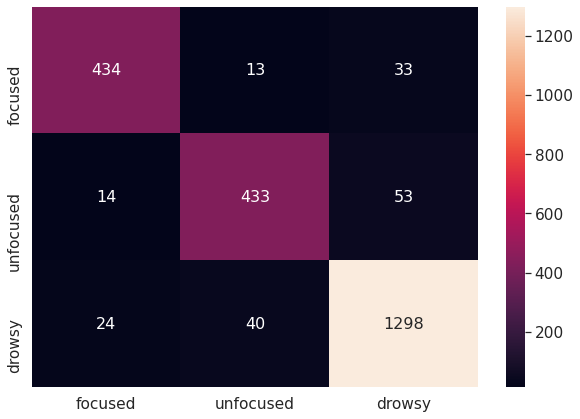

In [ ]:
results = cnn.evaluate(x_test, y_test, batch_size=BATCH_SIZE)
print("test loss, test acc:", results)
pred = cnn.predict(x_test)
plot_confusion_matrix_from_pred(pred, y_test)

In [ ]:
crnn = create_CRNN4(nchan=NUM_CHAN, nclasses=len(CLASSES), trial_length=TRIAL_LENGTH, lr=LR2)
crnn.summary()

history = crnn.fit(x_train, y_train, batch_size=BATCH_SIZE, epochs=200, 
                          validation_split=VAL_SPLIT, shuffle=True, callbacks=[es_crnn, reduce_lr_crnn, checkpoint_callback('crnn4')])
plot_accuracy_loss(history)

crnn.save('crnn')
crnn.save_weights('crnn_weights.hdf5')

In [ ]:
results = crnn.evaluate(x_test, y_test, batch_size=BATCH_SIZE)
print("test loss, test acc:", results)
pred = crnn.predict(x_test)
plot_confusion_matrix_from_pred(pred, y_test)